# 22 — Damage-Size Diffusion Uncertainty Extension

**Origin:** New post-freeze evidence extension correcting a downstream dependency omitted from the frozen 01–21 baseline\
**Refactor status:** Finished\
**Validation status:** Finished\
**Completion gate passed:** Yes\
**Output root:** `outputs/22_damage_size_diffusion_uncertainty_extension/`\
**Depends on:** Notebooks 01, 02, 05, 08, 11, 13–17, and 20

## Purpose

Create the repeated-seed Stable Diffusion evidence required to analyze empirical generative variability against damage size without modifying or rerunning any frozen Notebook 01–21 artifact.

Notebook 22 references the validated Notebook 11 generic primary candidate at seed `2026` for every Notebook 05 damage-size case. It generates only the missing seeds `2027`, `2028`, and `2029`.

## Frozen-baseline boundary

- Notebooks 01–21 and their canonical outputs remain read-only.
- The 35 Notebook 11 seed-2026 restoration images are referenced by their validated paths and checksums.
- Frozen restoration images are not copied, relabelled, regenerated, or overwritten.
- Notebook 22 owns all 105 new candidates, restoration images, metrics, maps, figures, manifests, validation evidence, and temporary checkpoints it produces.
- Notebook 19 is not treated as a damage-size uncertainty source because it contains no damage-size groups.

## Exact population

- 35 damage-size cases;
- five painting trajectories;
- seven nested target levels per painting: 2%, 4%, 6%, 8%, 10%, 15%, and 20%;
- 35 referenced seed-2026 candidates;
- 105 newly generated candidates;
- seeds `2026`, `2027`, `2028`, and `2029` in every group;
- 35 complete uncertainty groups;
- 140 candidates in the combined in-memory population;
- 210 unique unordered seed pairs.

## Frozen generation contract

The new candidates retain the validated Notebook 11 generic Stable Diffusion contract:

- Stable Diffusion 1.5 inpainting;
- frozen model revision;
- `DDIMScheduler`;
- 30 inference steps;
- guidance scale `7.5`;
- strength `1.0`;
- `512 × 512` inference resolution;
- `768 × 768` output resolution;
- generic `p00_generic` prompt under `sd15_prompt_policy.v3`;
- exact masked compositing with outside-mask preservation;
- binary-mask threshold `128`;
- no damage-level-specific tuning or metric-based candidate selection.

## Transparent uncertainty evidence

The notebook computes:

- per-pixel mean-channel RGB standard deviation;
- pairwise RGB MAE and RMSE;
- pairwise LPIPS distance;
- pairwise CLIP cosine distance;
- pairwise DINOv2 cosine distance.

Pixel-space evidence covers:

- full image;
- content region;
- masked region;
- mask-bounding-box crop;
- boundary ring;
- outside-mask content.

LPIPS, CLIP, and DINOv2 use the approved contiguous `content_region` and `mask_bbox_crop` regions.

Raw numerical uncertainty maps and readable group-level overlays are retained. No combined uncertainty or trustworthiness score is constructed.

## Frozen anchor evidence

For downstream association analysis, the notebook joins selected seed-2026 evidence from:

- classical reference metrics;
- LPIPS;
- CLIP and DINOv2 feature similarity;
- spatial error and improvement diagnostics;
- texture consistency;
- colour consistency;
- seam consistency;
- semantic and structural diagnostic proxies.

These values describe only the frozen seed-2026 anchor. The three new candidates do not inherit uncomputed upstream quality measurements.

## Interpretation limits

Repeated-seed variation is an empirical generative-variability proxy. It is not calibrated confidence, correctness, historical plausibility, material compatibility, ethical acceptability, or conservation approval.

The seven damage levels are repeated observations nested within five painting trajectories. They must not be treated as 35 independent paintings or as independently estimated category or style effects.

Low uncertainty may coexist with consistently incorrect restoration. CLIP, DINOv2, and LPIPS remain general-purpose computational proxies rather than conservation-specific judgments.

## Canonical outputs

- `data/candidates.csv`
- `data/uncertainty_maps.npz`
- `metrics/damage_size_uncertainty.csv`
- `images/restored/<case_id>/<candidate_id>.png`
- `images/uncertainty/<uncertainty_group_id>.png`
- `figures/uncertainty_extension_summary.png`
- `manifests/map_images.csv`
- `manifests/run_manifest.json`
- `manifests/artifacts.csv`
- `validation/checks.csv`

Notebook 22 does not generate a standalone HTML or Markdown report.

## Batch 1 — Contract, dependency preflight, and frozen-boundary verification

This batch establishes the repository context, loads the approved extension configuration, validates every declared input and upstream completion manifest, verifies the governing evidence registry, checks all 35 frozen Notebook 11 anchors by checksum, and creates only empty Notebook 22 output directories.

It does not build the 105-row extension candidate plan, load the large metric tables, run restoration inference, compute uncertainty, extract learned features, render figures, or write canonical output files.

In [1]:
from datetime import datetime, timezone
from pathlib import Path
import importlib
import json
import platform
import sys

import matplotlib
import numpy as np
import pandas as pd
import PIL
import yaml
from IPython.display import display


# ---------------------------------------------------------------------------
# Minimal repository bootstrap
# ---------------------------------------------------------------------------

CURRENT_DIRECTORY = Path.cwd().resolve()

PROJECT_ROOT_MATCHES = [
    candidate
    for candidate in (
        CURRENT_DIRECTORY,
        *CURRENT_DIRECTORY.parents,
    )
    if (
        (candidate / ".git").exists()
        and (
            candidate
            / "src"
            / "restoration_eval"
        ).is_dir()
        and (candidate / "notebooks").is_dir()
    )
]

if not PROJECT_ROOT_MATCHES:
    raise FileNotFoundError(
        "Could not locate the painting-restoration "
        f"repository root from {CURRENT_DIRECTORY}."
    )

PROJECT_ROOT = PROJECT_ROOT_MATCHES[0]
SRC_ROOT = PROJECT_ROOT / "src"

if str(SRC_ROOT) not in sys.path:
    sys.path.insert(0, str(SRC_ROOT))


# ---------------------------------------------------------------------------
# Reload preparation-layer modules
# ---------------------------------------------------------------------------

import restoration_eval.damage_size_diffusion_uncertainty as extension_module
import restoration_eval.restoration_stable_diffusion as stable_diffusion_module

extension_module = importlib.reload(
    extension_module
)

stable_diffusion_module = importlib.reload(
    stable_diffusion_module
)


# ---------------------------------------------------------------------------
# Project helpers
# ---------------------------------------------------------------------------

from restoration_eval.damage_size_diffusion_uncertainty import (
    CONFIG_SCHEMA_VERSION,
    MAP_MANIFEST_SCHEMA_VERSION,
    METRICS_SCHEMA_VERSION,
    METRIC_VERSION,
    MODULE_VERSION,
    build_effective_generation_config,
    load_damage_size_uncertainty_config,
    select_frozen_damage_size_anchors,
)

from restoration_eval.manifests import (
    MANIFESTS_MODULE_VERSION,
    sha256_file,
)

from restoration_eval.paths import (
    PATHS_MODULE_VERSION,
    ensure_output_subdirs,
    load_project_paths_registry,
    notebook_output_root,
    require_notebook_output_path,
    resolve_repo_path,
    to_repo_relative,
)

from restoration_eval.restoration_stable_diffusion import (
    RESTORATION_GENERATOR_VERSION,
    load_stable_diffusion_config,
)

from restoration_eval.validation import (
    VALIDATION_MODULE_VERSION,
    ValidationCollector,
)


# ---------------------------------------------------------------------------
# Notebook identity
# ---------------------------------------------------------------------------

NOTEBOOK_ID = "22"
NOTEBOOK_STEM = (
    "22_damage_size_diffusion_uncertainty_extension"
)

NOTEBOOK_ORIGIN = (
    "New post-freeze evidence extension correcting "
    "a downstream dependency omitted from the frozen "
    "01–21 baseline"
)

SUPPORTED_PYTHON_MINORS = {
    (3, 11),
    (3, 12),
}

NOTEBOOK_STARTED_AT_UTC = (
    datetime.now(timezone.utc)
    .isoformat()
    .replace("+00:00", "Z")
)

print("Notebook 22 repository bootstrap complete.")
print("Project root:", PROJECT_ROOT)
print("Notebook stem:", NOTEBOOK_STEM)
print("Python:", platform.python_version())
print("Extension helper:", MODULE_VERSION)
print(
    "Stable Diffusion generator:",
    RESTORATION_GENERATOR_VERSION,
)
print("Started at:", NOTEBOOK_STARTED_AT_UTC)

Notebook 22 repository bootstrap complete.
Project root: D:\Masters\FH\Thesis\painting-restoration-eval
Notebook stem: 22_damage_size_diffusion_uncertainty_extension
Python: 3.12.6
Extension helper: 1.0.0
Stable Diffusion generator: 5.1.0
Started at: 2026-08-31T19:58:15.098061Z


In [2]:
# ---------------------------------------------------------------------------
# Configuration and preparation paths
# ---------------------------------------------------------------------------

EXTENSION_CONFIG_PATH = (
    PROJECT_ROOT
    / "config"
    / "evaluation"
    / "damage_size_diffusion_uncertainty_extension.yaml"
)

BASE_GENERATION_CONFIG_PATH = (
    PROJECT_ROOT
    / "config"
    / "experiments"
    / "stable_diffusion.yaml"
)

NOTEBOOK_PATH = (
    PROJECT_ROOT
    / "notebooks"
    / f"{NOTEBOOK_STEM}.ipynb"
)

PREPARATION_PATHS = {
    "extension_config": EXTENSION_CONFIG_PATH,
    "extension_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "damage_size_diffusion_uncertainty.py"
    ),
    "extension_tests": (
        PROJECT_ROOT
        / "tests"
        / "test_damage_size_diffusion_uncertainty.py"
    ),
    "evidence_coverage": (
        PROJECT_ROOT
        / "config"
        / "evaluation"
        / "evidence_coverage.yaml"
    ),
    "evidence_audit": (
        PROJECT_ROOT
        / "docs"
        / "evidence_dependency_audit.md"
    ),
    "roadmap": (
        PROJECT_ROOT
        / "docs"
        / "final_notebook_roadmap.md"
    ),
    "implementation_guidelines": (
        PROJECT_ROOT
        / "docs"
        / "refactoring_implementation_guidelines.md"
    ),
}

extension_config = (
    load_damage_size_uncertainty_config(
        EXTENSION_CONFIG_PATH
    )
)

EXTENSION_CONFIG = extension_config[
    "damage_size_diffusion_uncertainty_extension"
]

base_generation_config = load_stable_diffusion_config(
    BASE_GENERATION_CONFIG_PATH
)

effective_generation_config = (
    build_effective_generation_config(
        base_generation_config,
        extension_config,
    )
)

CONFIGURED_INPUTS = EXTENSION_CONFIG["inputs"]
CONFIGURED_OUTPUTS = EXTENSION_CONFIG["output"]
FROZEN_BOUNDARY = EXTENSION_CONFIG[
    "frozen_boundary"
]
POPULATION = EXTENSION_CONFIG["population"]
GENERATION_CONTRACT = EXTENSION_CONFIG[
    "generation_contract"
]
REGION_POLICY = EXTENSION_CONFIG["regions"]
METRIC_POLICY = EXTENSION_CONFIG["metrics"]
REFERENCE_POLICY = EXTENSION_CONFIG[
    "reference_evidence"
]
EXECUTION_POLICY = EXTENSION_CONFIG["execution"]
EXPECTED_COUNTS = EXTENSION_CONFIG[
    "expected_counts"
]
EVIDENCE_POLICY = EXTENSION_CONFIG[
    "evidence_policy"
]

if EXTENSION_CONFIG["notebook_id"] != NOTEBOOK_ID:
    raise ValueError(
        "Configured notebook ID disagrees with Notebook 22."
    )

if (
    EXTENSION_CONFIG["notebook_stem"]
    != NOTEBOOK_STEM
):
    raise ValueError(
        "Configured notebook stem disagrees with Notebook 22."
    )

if (
    CONFIGURED_OUTPUTS["root"]
    != f"outputs/{NOTEBOOK_STEM}"
):
    raise ValueError(
        "Configured output root violates Notebook 22 ownership."
    )


# ---------------------------------------------------------------------------
# Explicit inputs
# ---------------------------------------------------------------------------

INPUTS = {
    key: resolve_repo_path(
        value,
        PROJECT_ROOT,
        must_exist=True,
    )
    for key, value in CONFIGURED_INPUTS.items()
}


# ---------------------------------------------------------------------------
# Notebook-owned output paths
# ---------------------------------------------------------------------------

NOTEBOOK_OUTPUT_ROOT = notebook_output_root(
    NOTEBOOK_STEM,
    PROJECT_ROOT,
    create=False,
)

PREEXISTING_OWNED_FILES = (
    sorted(
        path
        for path in NOTEBOOK_OUTPUT_ROOT.rglob("*")
        if path.is_file()
    )
    if NOTEBOOK_OUTPUT_ROOT.exists()
    else []
)

OUTPUT_DIRECTORIES = ensure_output_subdirs(
    NOTEBOOK_STEM,
    (
        "data",
        "images",
        "metrics",
        "figures",
        "manifests",
        "validation",
        "work",
    ),
    PROJECT_ROOT,
)

RESTORED_IMAGE_ROOT = (
    NOTEBOOK_OUTPUT_ROOT
    / CONFIGURED_OUTPUTS["restored_directory"]
)

UNCERTAINTY_IMAGE_ROOT = (
    NOTEBOOK_OUTPUT_ROOT
    / CONFIGURED_OUTPUTS[
        "uncertainty_image_directory"
    ]
)

FEATURE_MATRIX_ROOT = (
    NOTEBOOK_OUTPUT_ROOT
    / CONFIGURED_OUTPUTS[
        "feature_matrix_directory"
    ]
)

SMOKE_ROOT = (
    NOTEBOOK_OUTPUT_ROOT
    / CONFIGURED_OUTPUTS["smoke_directory"]
)

for directory in (
    RESTORED_IMAGE_ROOT,
    UNCERTAINTY_IMAGE_ROOT,
    FEATURE_MATRIX_ROOT,
    SMOKE_ROOT,
):
    require_notebook_output_path(
        directory,
        NOTEBOOK_STEM,
        PROJECT_ROOT,
    ).mkdir(parents=True, exist_ok=True)

OUTPUTS = {
    "candidates": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["candidates_path"]
    ),
    "uncertainty_maps": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "uncertainty_maps_path"
        ]
    ),
    "damage_size_uncertainty": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["metrics_path"]
    ),
    "restored_images": RESTORED_IMAGE_ROOT,
    "uncertainty_images": (
        UNCERTAINTY_IMAGE_ROOT
    ),
    "summary_figure": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "summary_figure_path"
        ]
    ),
    "map_manifest": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "map_manifest_path"
        ]
    ),
    "run_manifest": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "run_manifest_path"
        ]
    ),
    "artifacts": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "artifacts_path"
        ]
    ),
    "validation": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "validation_path"
        ]
    ),
}

WORK_PATHS = {
    "candidate_checkpoint": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "candidate_checkpoint_path"
        ]
    ),
    "image_metrics_checkpoint": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "image_metrics_checkpoint_path"
        ]
    ),
    "lpips_metrics_checkpoint": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "lpips_metrics_checkpoint_path"
        ]
    ),
    "feature_manifest_checkpoint": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "feature_manifest_checkpoint_path"
        ]
    ),
    "feature_matrix_root": FEATURE_MATRIX_ROOT,
    "smoke_root": SMOKE_ROOT,
}

for path in (
    *OUTPUTS.values(),
    *WORK_PATHS.values(),
):
    require_notebook_output_path(
        path,
        NOTEBOOK_STEM,
        PROJECT_ROOT,
    )


# ---------------------------------------------------------------------------
# Human-reviewable input/output contracts
# ---------------------------------------------------------------------------

def infer_input_producer(path):
    relative = to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    parts = relative.split("/")

    if relative.startswith(
        "outputs/inventory/"
    ):
        return "global_inventory"

    if (
        len(parts) >= 2
        and parts[0] == "outputs"
        and parts[1][:2].isdigit()
    ):
        return parts[1]

    return "repository_control"


input_contract_df = pd.DataFrame(
    [
        {
            "input_key": key,
            "producer": infer_input_producer(
                path
            ),
            "relative_path": to_repo_relative(
                path,
                PROJECT_ROOT,
            ),
            "required": True,
            "exists": path.exists(),
            "is_file": path.is_file(),
            "size_bytes": (
                int(path.stat().st_size)
                if path.is_file()
                else pd.NA
            ),
        }
        for key, path in INPUTS.items()
    ]
)

OUTPUT_ARTIFACT_TYPES = {
    "candidates": "csv",
    "uncertainty_maps": "npz",
    "damage_size_uncertainty": "csv",
    "restored_images": "png_directory",
    "uncertainty_images": "png_directory",
    "summary_figure": "png",
    "map_manifest": "csv",
    "run_manifest": "json",
    "artifacts": "csv",
    "validation": "csv",
}

output_contract_df = pd.DataFrame(
    [
        {
            "artifact_key": key,
            "relative_path": to_repo_relative(
                path,
                PROJECT_ROOT,
            ),
            "artifact_type": (
                OUTPUT_ARTIFACT_TYPES[key]
            ),
            "ownership": (
                "notebook_22_only"
            ),
        }
        for key, path in OUTPUTS.items()
    ]
)

print("Notebook 22 path contract established.")
print(
    "Declared inputs:",
    len(input_contract_df),
)
print(
    "Canonical output classes:",
    len(output_contract_df),
)
print(
    "Pre-existing owned files:",
    len(PREEXISTING_OWNED_FILES),
)
print("Output root:", NOTEBOOK_OUTPUT_ROOT)
print("Canonical files written: No")

Notebook 22 path contract established.
Declared inputs: 37
Canonical output classes: 10
Pre-existing owned files: 0
Output root: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\22_damage_size_diffusion_uncertainty_extension
Canonical files written: No


In [3]:
# ---------------------------------------------------------------------------
# Inventory and project-path registry
# ---------------------------------------------------------------------------

inventory_df = pd.read_csv(
    INPUTS["inventory_path"],
    low_memory=False,
)

with INPUTS["inventory_run_path"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    inventory_run = json.load(handle)

project_paths_registry = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)

inventory_relative_paths = set(
    inventory_df["relative_path"].astype(str)
)

inventory_lookup = (
    inventory_df
    .drop_duplicates(
        "relative_path",
        keep="last",
    )
    .set_index("relative_path")
)

inventory_exceptions = {
    CONFIGURED_INPUTS["inventory_path"],
    CONFIGURED_INPUTS["inventory_run_path"],
    CONFIGURED_INPUTS[
        "stable_diffusion_output_root"
    ],
}

input_contract_df["inventory_status"] = (
    input_contract_df["relative_path"].map(
        lambda relative_path: (
            "approved_non_file_or_inventory_exception"
            if relative_path
            in inventory_exceptions
            else (
                "listed"
                if relative_path
                in inventory_relative_paths
                else "missing"
            )
        )
    )
)

input_contract_df["inventory_row_count"] = (
    input_contract_df["relative_path"].map(
        inventory_lookup[
            "tabular_row_count"
        ]
    )
)


# ---------------------------------------------------------------------------
# Upstream completion manifests
# ---------------------------------------------------------------------------

UPSTREAM_MANIFEST_INPUT_KEYS = {
    "01": "artworks_run_manifest_path",
    "02": "geometry_run_manifest_path",
    "05": "damage_size_run_manifest_path",
    "08": "contracts_run_manifest_path",
    "11": "stable_diffusion_run_manifest_path",
    "13": "classical_run_manifest_path",
    "14": "lpips_run_manifest_path",
    "15": "feature_run_manifest_path",
    "16": "spatial_run_manifest_path",
    "17": "local_consistency_run_manifest_path",
    "20": "semantic_run_manifest_path",
}

upstream_manifests = {}

for notebook_id, input_key in (
    UPSTREAM_MANIFEST_INPUT_KEYS.items()
):
    with INPUTS[input_key].open(
        "r",
        encoding="utf-8-sig",
    ) as handle:
        upstream_manifests[
            notebook_id
        ] = json.load(handle)

upstream_manifest_records = []

for notebook_id, manifest in (
    upstream_manifests.items()
):
    consolidated = (
        manifest
        .get("validation_summary", {})
        .get("consolidated", {})
    )

    blocking_failures = int(
        consolidated.get(
            "blocking_failure_count",
            0,
        )
    )

    passed = bool(
        manifest.get("run_status") == "completed"
        and manifest.get(
            "completion_gate_passed"
        ) is True
        and blocking_failures == 0
    )

    upstream_manifest_records.append(
        {
            "notebook_id": notebook_id,
            "manifest_notebook_id": str(
                manifest.get(
                    "notebook_id",
                    "",
                )
            ).zfill(2),
            "run_id": manifest.get(
                "run_id",
                "",
            ),
            "run_status": manifest.get(
                "run_status",
                "",
            ),
            "completion_gate_passed": (
                manifest.get(
                    "completion_gate_passed"
                )
            ),
            "blocking_failures": (
                blocking_failures
            ),
            "passed": passed,
            "relative_path": (
                to_repo_relative(
                    INPUTS[
                        UPSTREAM_MANIFEST_INPUT_KEYS[
                            notebook_id
                        ]
                    ],
                    PROJECT_ROOT,
                )
            ),
        }
    )

upstream_manifest_df = pd.DataFrame(
    upstream_manifest_records
)


# ---------------------------------------------------------------------------
# Governing evidence files
# ---------------------------------------------------------------------------

with INPUTS["evidence_coverage_path"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    evidence_coverage = yaml.safe_load(
        handle
    )

planned_notebooks = (
    evidence_coverage[
        "evidence_coverage"
    ]["planned_notebooks"]
)

notebook_22_entries = [
    entry
    for entry in planned_notebooks
    if str(entry.get("notebook_id")) == NOTEBOOK_ID
]

notebook_22_evidence_entry = (
    notebook_22_entries[0]
    if len(notebook_22_entries) == 1
    else {}
)

roadmap_text = INPUTS[
    "roadmap_path"
].read_text(
    encoding="utf-8"
)

guidelines_text = INPUTS[
    "implementation_guidelines_path"
].read_text(
    encoding="utf-8"
)

evidence_audit_text = INPUTS[
    "evidence_audit_path"
].read_text(
    encoding="utf-8"
)

governing_checksum_df = pd.DataFrame(
    [
        {
            "governing_file": key,
            "relative_path": (
                to_repo_relative(
                    PREPARATION_PATHS[key],
                    PROJECT_ROOT,
                )
            ),
            "sha256": sha256_file(
                PREPARATION_PATHS[key]
            ),
        }
        for key in (
            "evidence_coverage",
            "evidence_audit",
            "roadmap",
            "implementation_guidelines",
        )
    ]
)


# ---------------------------------------------------------------------------
# Runtime dependency visibility
# ---------------------------------------------------------------------------

runtime_dependency_df = pd.DataFrame(
    [
        {
            "dependency": "Python",
            "version": platform.python_version(),
            "status": "available",
        },
        {
            "dependency": "NumPy",
            "version": np.__version__,
            "status": "available",
        },
        {
            "dependency": "pandas",
            "version": pd.__version__,
            "status": "available",
        },
        {
            "dependency": "Pillow",
            "version": PIL.__version__,
            "status": "available",
        },
        {
            "dependency": "Matplotlib",
            "version": matplotlib.__version__,
            "status": "available",
        },
        {
            "dependency": "PyYAML",
            "version": yaml.__version__,
            "status": "available",
        },
    ]
)

print("Inventory and governing evidence loaded.")
print(
    "Inventory run ID:",
    inventory_run["inventory_run_id"],
)
print(
    "Inventory rows:",
    len(inventory_df),
)
print(
    "Upstream manifests:",
    len(upstream_manifest_df),
)
print(
    "Notebook 22 registry entries:",
    len(notebook_22_entries),
)

Inventory and governing evidence loaded.
Inventory run ID: inventory_20260831T184508Z_24af7294
Inventory rows: 19001
Upstream manifests: 11
Notebook 22 registry entries: 1


In [4]:
# ---------------------------------------------------------------------------
# Exact frozen-anchor preflight
# ---------------------------------------------------------------------------

damage_size_cases_preflight_df = pd.read_csv(
    INPUTS["damage_size_cases_path"],
    low_memory=False,
)

stable_diffusion_candidates_preflight_df = (
    pd.read_csv(
        INPUTS[
            "stable_diffusion_candidates_path"
        ],
        low_memory=False,
    )
)

frozen_anchors_preflight_df = (
    select_frozen_damage_size_anchors(
        damage_size_cases_preflight_df,
        stable_diffusion_candidates_preflight_df,
        config=extension_config,
        project_root=PROJECT_ROOT,
        verify_files=True,
    )
)

anchor_summary_df = (
    frozen_anchors_preflight_df
    .assign(
        seed=lambda frame: pd.to_numeric(
            frame["seed"],
            errors="raise",
        ).astype(int)
    )
    .groupby(
        [
            "painting_id",
            "category",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        case_count=("case_id", "nunique"),
        candidate_count=(
            "candidate_id",
            "nunique",
        ),
        minimum_seed=("seed", "min"),
        maximum_seed=("seed", "max"),
    )
)

damage_level_summary_df = (
    damage_size_cases_preflight_df
    .loc[
        lambda frame: frame[
            "experiment_id"
        ].eq(
            POPULATION["experiment_id"]
        )
    ]
    .assign(
        target_damage_fraction=lambda frame: (
            pd.to_numeric(
                frame[
                    "target_damage_fraction"
                ],
                errors="raise",
            )
        )
    )
    .groupby(
        "painting_id",
        as_index=False,
    )
    .agg(
        level_count=(
            "target_damage_fraction",
            "nunique",
        ),
        minimum_target_fraction=(
            "target_damage_fraction",
            "min",
        ),
        maximum_target_fraction=(
            "target_damage_fraction",
            "max",
        ),
    )
)


# ---------------------------------------------------------------------------
# Consolidated Batch 1 validation
# ---------------------------------------------------------------------------

VALIDATION = ValidationCollector()


def add_preflight_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_1_preflight"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


python_minor = (
    sys.version_info.major,
    sys.version_info.minor,
)

add_preflight_check(
    "supported_python",
    "Python 3.11 or 3.12 is active.",
    sorted(SUPPORTED_PYTHON_MINORS),
    python_minor,
    python_minor in SUPPORTED_PYTHON_MINORS,
)

add_preflight_check(
    "notebook_exists",
    "The replacement Notebook 22 exists.",
    True,
    NOTEBOOK_PATH.is_file(),
    NOTEBOOK_PATH.is_file(),
)

preparation_status = {
    key: path.is_file()
    for key, path in (
        PREPARATION_PATHS.items()
    )
}

add_preflight_check(
    "preparation_files_exist",
    (
        "Every approved Notebook 22 preparation "
        "file exists."
    ),
    "all present",
    preparation_status,
    all(preparation_status.values()),
)

for row in input_contract_df.itertuples(
    index=False
):
    add_preflight_check(
        f"input_{row.input_key}",
        (
            "The declared Notebook 22 input "
            f"exists: {row.input_key}."
        ),
        True,
        row.exists,
        row.exists,
        details=row.relative_path,
    )

non_exception_inputs = (
    input_contract_df.loc[
        ~input_contract_df[
            "relative_path"
        ].isin(inventory_exceptions)
    ]
)

add_preflight_check(
    "inventory_input_coverage",
    (
        "Every ordinary file input is represented "
        "in the refreshed inventory."
    ),
    "all listed",
    non_exception_inputs[
        "inventory_status"
    ].value_counts().to_dict(),
    non_exception_inputs[
        "inventory_status"
    ].eq("listed").all(),
)

add_preflight_check(
    "inventory_completed",
    "The refreshed project inventory completed.",
    "completed",
    inventory_run.get("status"),
    inventory_run.get("status")
    == "completed",
)

add_preflight_check(
    "inventory_no_read_errors",
    (
        "The refreshed inventory contains no "
        "read errors."
    ),
    0,
    inventory_run["summary"].get(
        "read_error_count"
    ),
    inventory_run["summary"].get(
        "read_error_count"
    ) == 0,
)

add_preflight_check(
    "inventory_row_count",
    (
        "Inventory rows agree with the inventory "
        "run summary."
    ),
    inventory_run["summary"][
        "file_count"
    ],
    len(inventory_df),
    len(inventory_df)
    == inventory_run["summary"][
        "file_count"
    ],
)

add_preflight_check(
    "upstream_completion",
    (
        "Every required frozen upstream notebook "
        "has a completed run and passed gate."
    ),
    len(UPSTREAM_MANIFEST_INPUT_KEYS),
    {
        "manifest_count": (
            len(upstream_manifest_df)
        ),
        "passed_count": int(
            upstream_manifest_df[
                "passed"
            ].sum()
        ),
    },
    (
        len(upstream_manifest_df)
        == len(
            UPSTREAM_MANIFEST_INPUT_KEYS
        )
        and upstream_manifest_df[
            "passed"
        ].all()
    ),
    details=(
        upstream_manifest_df.loc[
            ~upstream_manifest_df[
                "passed"
            ]
        ].to_dict("records")
    ),
)

add_preflight_check(
    "upstream_manifest_identity",
    (
        "Every upstream manifest records its "
        "expected notebook ID."
    ),
    upstream_manifest_df[
        "notebook_id"
    ].tolist(),
    upstream_manifest_df[
        "manifest_notebook_id"
    ].tolist(),
    (
        upstream_manifest_df[
            "notebook_id"
        ].tolist()
        == upstream_manifest_df[
            "manifest_notebook_id"
        ].tolist()
    ),
)

add_preflight_check(
    "evidence_registry_entry",
    (
        "The evidence registry contains exactly one "
        "approved Notebook 22 extension entry."
    ),
    {
        "count": 1,
        "stem": NOTEBOOK_STEM,
    },
    {
        "count": len(
            notebook_22_entries
        ),
        "stem": (
            notebook_22_evidence_entry.get(
                "stem"
            )
        ),
    },
    (
        len(notebook_22_entries) == 1
        and notebook_22_evidence_entry.get(
            "stem"
        ) == NOTEBOOK_STEM
    ),
)

add_preflight_check(
    "evidence_registry_population",
    (
        "The evidence registry preserves the exact "
        "approved extension population."
    ),
    EXPECTED_COUNTS,
    notebook_22_evidence_entry.get(
        "expected_population",
        {},
    ),
    (
        notebook_22_evidence_entry.get(
            "expected_population",
            {}
        ).get("cases") == 35
        and notebook_22_evidence_entry.get(
            "expected_population",
            {}
        ).get("new_candidates") == 105
        and notebook_22_evidence_entry.get(
            "expected_population",
            {}
        ).get("uncertainty_groups") == 35
        and notebook_22_evidence_entry.get(
            "expected_population",
            {}
        ).get(
            "unordered_seed_pairs"
        ) == 210
    ),
)

roadmap_markers = {
    "notebook_section": (
        "22 — Damage-Size Diffusion "
        "Uncertainty Extension"
        in roadmap_text
    ),
    "exact_notebook_name": (
        "22_damage_size_diffusion_"
        "uncertainty_extension.ipynb"
        in roadmap_text
    ),
    "new_candidates": (
        "new extension candidates: 105"
        in roadmap_text
    ),
    "groups": (
        "complete uncertainty groups: 35"
        in roadmap_text
    ),
    "pairs": (
        "unique unordered seed pairs: 210"
        in roadmap_text
    ),
}

add_preflight_check(
    "roadmap_traceability",
    (
        "The roadmap contains the exact Notebook 22 "
        "identity and population arithmetic."
    ),
    "all markers present",
    roadmap_markers,
    all(roadmap_markers.values()),
)

guideline_markers = {
    "frozen_baseline": (
        "Frozen baseline and "
        "evidence-dependency gate"
        in guidelines_text
    ),
    "no_frozen_writes": (
        "Do not edit, regenerate, append to, or "
        "overwrite Notebook 01–21"
        in guidelines_text
    ),
    "manual_notebook_cells": (
        "The assistant must not create, replace, "
        "patch, or otherwise edit"
        in guidelines_text
        and "`.ipynb`" in guidelines_text
    ),
    "opening_markdown": (
        "Mandatory opening Markdown "
        "contract cell"
        in guidelines_text
    ),
}

add_preflight_check(
    "implementation_guideline_traceability",
    (
        "The implementation guidelines retain the "
        "frozen baseline, manual-cell, and opening "
        "contract rules."
    ),
    "all markers present",
    guideline_markers,
    all(guideline_markers.values()),
)

audit_markers = {
    "approved_extension": (
        "Notebook 22, "
        "`22_damage_size_diffusion_uncertainty_extension.ipynb`"
        in evidence_audit_text
    ),
    "anchor_count": (
        "reference the 35 frozen Notebook 11"
        in evidence_audit_text
    ),
    "new_candidate_count": (
        "own exactly 105 new restoration images"
        in evidence_audit_text
    ),
    "frozen_outputs_untouched": (
        "leave every Notebook 01–21 "
        "source and output untouched"
        in evidence_audit_text
    ),
}

add_preflight_check(
    "evidence_audit_traceability",
    (
        "The human-readable evidence audit records "
        "the approved closure and frozen boundary."
    ),
    "all markers present",
    audit_markers,
    all(audit_markers.values()),
)

add_preflight_check(
    "frozen_write_prohibited",
    (
        "The extension configuration explicitly "
        "prohibits writes to frozen outputs."
    ),
    False,
    FROZEN_BOUNDARY[
        "may_write_frozen_outputs"
    ],
    not FROZEN_BOUNDARY[
        "may_write_frozen_outputs"
    ],
)

add_preflight_check(
    "anchor_copy_prohibited",
    (
        "Frozen anchor images are referenced rather "
        "than copied."
    ),
    False,
    FROZEN_BOUNDARY[
        "copy_anchor_images"
    ],
    not FROZEN_BOUNDARY[
        "copy_anchor_images"
    ],
)

add_preflight_check(
    "notebook_19_excluded",
    (
        "Notebook 19 is not configured as a "
        "damage-size evidence source."
    ),
    False,
    any(
        str(value).startswith(
            "outputs/19_"
        )
        for value in (
            CONFIGURED_INPUTS.values()
        )
    ),
    not any(
        str(value).startswith(
            "outputs/19_"
        )
        for value in (
            CONFIGURED_INPUTS.values()
        )
    ),
)

add_preflight_check(
    "spatial_evidence_explicit",
    (
        "Notebook 16 spatial diagnostics are an "
        "explicit evidence input."
    ),
    (
        "outputs/16_difference_maps_and_"
        "spatial_diagnostics/metrics/"
        "spatial_diagnostics.csv"
    ),
    CONFIGURED_INPUTS[
        "spatial_diagnostics_path"
    ],
    CONFIGURED_INPUTS[
        "spatial_diagnostics_path"
    ] == (
        "outputs/16_difference_maps_and_"
        "spatial_diagnostics/metrics/"
        "spatial_diagnostics.csv"
    ),
)

add_preflight_check(
    "frozen_anchor_count",
    (
        "Exactly one completed generic seed-2026 "
        "anchor exists for each damage-size case."
    ),
    EXPECTED_COUNTS[
        "frozen_anchor_candidates"
    ],
    len(
        frozen_anchors_preflight_df
    ),
    (
        len(
            frozen_anchors_preflight_df
        )
        == EXPECTED_COUNTS[
            "frozen_anchor_candidates"
        ]
        == 35
    ),
)

add_preflight_check(
    "frozen_anchor_case_coverage",
    (
        "The frozen anchors cover all 35 unique "
        "damage-size cases."
    ),
    35,
    frozen_anchors_preflight_df[
        "case_id"
    ].nunique(),
    (
        frozen_anchors_preflight_df[
            "case_id"
        ].nunique()
        == 35
    ),
)

add_preflight_check(
    "frozen_anchor_paintings",
    (
        "The frozen anchor population contains "
        "five painting trajectories."
    ),
    5,
    frozen_anchors_preflight_df[
        "painting_id"
    ].nunique(),
    (
        frozen_anchors_preflight_df[
            "painting_id"
        ].nunique()
        == 5
    ),
)

add_preflight_check(
    "damage_level_structure",
    (
        "Every painting has all seven approved "
        "damage levels."
    ),
    {
        "paintings": 5,
        "levels_per_painting": 7,
    },
    {
        "paintings": len(
            damage_level_summary_df
        ),
        "level_counts": (
            damage_level_summary_df[
                "level_count"
            ].tolist()
        ),
    },
    (
        len(damage_level_summary_df) == 5
        and damage_level_summary_df[
            "level_count"
        ].eq(7).all()
    ),
)

expected_seed_set = set(
    POPULATION["expected_seeds"]
)

generated_seed_set = set(
    POPULATION["generated_seeds"]
)

add_preflight_check(
    "seed_arithmetic",
    (
        "The anchor plus generated seeds form the "
        "exact four-seed contract."
    ),
    expected_seed_set,
    (
        {
            int(
                FROZEN_BOUNDARY[
                    "anchor_seed"
                ]
            )
        }
        | generated_seed_set
    ),
    (
        {
            int(
                FROZEN_BOUNDARY[
                    "anchor_seed"
                ]
            )
        }
        | generated_seed_set
    ) == expected_seed_set,
)

population_arithmetic = {
    "new_candidates": (
        EXPECTED_COUNTS["cases"]
        * len(
            POPULATION[
                "generated_seeds"
            ]
        )
    ),
    "total_candidates": (
        EXPECTED_COUNTS["cases"]
        * len(
            POPULATION[
                "expected_seeds"
            ]
        )
    ),
    "unordered_pairs": (
        EXPECTED_COUNTS["cases"]
        * EXPECTED_COUNTS[
            "unordered_pairs_per_group"
        ]
    ),
}

add_preflight_check(
    "population_arithmetic",
    (
        "Case, candidate, group, and unordered-pair "
        "arithmetic is exact."
    ),
    {
        "new_candidates": 105,
        "total_candidates": 140,
        "uncertainty_groups": 35,
        "unordered_pairs": 210,
    },
    {
        **population_arithmetic,
        "uncertainty_groups": (
            EXPECTED_COUNTS[
                "uncertainty_groups"
            ]
        ),
    },
    (
        population_arithmetic[
            "new_candidates"
        ] == 105
        and population_arithmetic[
            "total_candidates"
        ] == 140
        and EXPECTED_COUNTS[
            "uncertainty_groups"
        ] == 35
        and population_arithmetic[
            "unordered_pairs"
        ] == 210
    ),
)

effective_model = (
    effective_generation_config[
        "model"
    ]
)

generation_contract_match = {
    key: effective_model[key]
    == GENERATION_CONTRACT[key]
    for key in (
        "hf_model_id",
        "model_revision",
        "scheduler",
        "num_inference_steps",
        "guidance_scale",
        "strength",
        "precision",
        "requested_device",
        "inference_width",
        "inference_height",
        "output_width",
        "output_height",
        "compositing_policy",
        "safety_checker_policy",
    )
}

generation_contract_match.update(
    {
        "prompt_policy_id": (
            effective_generation_config[
                "prompt_policy"
            ]["policy_id"]
            == POPULATION[
                "prompt_policy_id"
            ]
        ),
        "prompt_variant_id": (
            effective_generation_config[
                "prompt_policy"
            ][
                "primary_variant_id"
            ]
            == POPULATION[
                "prompt_variant_id"
            ]
        ),
        "generic_prompt": (
            effective_generation_config[
                "prompt_policy"
            ]["generic_prompt"]
            == GENERATION_CONTRACT[
                "prompt"
            ]
        ),
        "negative_prompt": (
            effective_generation_config[
                "prompt_policy"
            ]["negative_prompt"]
            == GENERATION_CONTRACT[
                "negative_prompt"
            ]
        ),
    }
)

add_preflight_check(
    "generation_contract",
    (
        "The effective Notebook 22 generation "
        "configuration matches the frozen contract."
    ),
    "all fields match",
    generation_contract_match,
    all(
        generation_contract_match.values()
    ),
)

interpretation_safeguards = {
    "no_combined_index": (
        not METRIC_POLICY[
            "combined_index"
        ]["retained"]
    ),
    "not_calibrated_confidence": (
        EVIDENCE_POLICY[
            "interpretation"
        ]
        == (
            "empirical_seed_variability_proxy_"
            "not_calibrated_confidence"
        )
    ),
    "low_uncertainty_not_correctness": (
        not EVIDENCE_POLICY[
            "low_uncertainty_proves_correctness"
        ]
    ),
    "no_category_effect": (
        not EVIDENCE_POLICY[
            "category_effect_permitted"
        ]
    ),
    "no_style_effect": (
        not EVIDENCE_POLICY[
            "style_effect_permitted"
        ]
    ),
}

add_preflight_check(
    "interpretation_safeguards",
    (
        "All uncertainty and nested-population "
        "interpretation safeguards are active."
    ),
    "all enabled",
    interpretation_safeguards,
    all(
        interpretation_safeguards.values()
    ),
)

owned_paths_valid = all(
    (
        path.resolve()
        == NOTEBOOK_OUTPUT_ROOT.resolve()
        or NOTEBOOK_OUTPUT_ROOT.resolve()
        in path.resolve().parents
    )
    for path in (
        *OUTPUTS.values(),
        *WORK_PATHS.values(),
    )
)

add_preflight_check(
    "output_ownership",
    (
        "Every canonical and temporary write path "
        "belongs to Notebook 22."
    ),
    str(NOTEBOOK_OUTPUT_ROOT),
    owned_paths_valid,
    owned_paths_valid,
)

add_preflight_check(
    "canonical_output_contract",
    (
        "The output contract declares exactly ten "
        "Notebook 22-owned artifact classes."
    ),
    10,
    len(output_contract_df),
    len(output_contract_df) == 10,
)

add_preflight_check(
    "fresh_output_root",
    (
        "No files existed in the Notebook 22 output "
        "root before empty directories were created."
    ),
    0,
    len(PREEXISTING_OWNED_FILES),
    len(PREEXISTING_OWNED_FILES) == 0,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in (
            PREEXISTING_OWNED_FILES
        )
    ],
)

canonical_files_now = [
    path
    for key, path in OUTPUTS.items()
    if key not in {
        "restored_images",
        "uncertainty_images",
    }
    and path.exists()
]

add_preflight_check(
    "no_canonical_files_written",
    (
        "Batch 1 created no canonical output files."
    ),
    0,
    len(canonical_files_now),
    len(canonical_files_now) == 0,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in canonical_files_now
    ],
)

print("Notebook 22 Batch 1 validation assembled.")
print(
    "Validation checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)

Notebook 22 Batch 1 validation assembled.
Validation checks: 67
Blocking failures: 0


In [5]:
# ---------------------------------------------------------------------------
# Batch 1 review tables and completion gate
# ---------------------------------------------------------------------------

batch_1_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq("batch_1_preflight")
    ]
    .reset_index(drop=True)
)

display(input_contract_df)
display(output_contract_df)
display(upstream_manifest_df)
display(runtime_dependency_df)
display(governing_checksum_df)
display(anchor_summary_df)
display(damage_level_summary_df)
display(batch_1_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 1 summary")
print("---------------------------")
print(
    "Validation checks:",
    len(batch_1_validation_df),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "Inventory run ID:",
    inventory_run["inventory_run_id"],
)
print(
    "Frozen anchor candidates:",
    len(
        frozen_anchors_preflight_df
    ),
)
print(
    "Damage-size cases:",
    frozen_anchors_preflight_df[
        "case_id"
    ].nunique(),
)
print(
    "Painting trajectories:",
    frozen_anchors_preflight_df[
        "painting_id"
    ].nunique(),
)
print(
    "Planned new candidates:",
    EXPECTED_COUNTS[
        "new_candidates"
    ],
)
print(
    "Planned complete groups:",
    EXPECTED_COUNTS[
        "uncertainty_groups"
    ],
)
print(
    "Planned unordered pairs:",
    EXPECTED_COUNTS[
        "unordered_candidate_pairs"
    ],
)
print(
    "Frozen anchor checksums verified:",
    len(
        frozen_anchors_preflight_df
    ),
)
print("Large metric tables loaded: No")
print("Restoration inference executed: No")
print("Canonical output files written: No")
print("Batch 1 completion gate passed.")

,input_key,producer,relative_path,required,exists,is_file,size_bytes,inventory_status,inventory_row_count
0,inventory_path,global_inventory,outputs/inventory/project_file_inventory.csv,True,True,True,10081727,approved_non_file_or_inventory_exception,NaN
1,inventory_run_path,global_inventory,outputs/inventory/inventory_run.json,True,True,True,2659,approved_non_file_or_inventory_exception,NaN
2,project_paths_path,global_inventory,outputs/inventory/project_paths.json,True,True,True,76565,listed,NaN
3,evidence_coverage_path,repository_control,config/evaluation/evidence_coverage.yaml,True,True,True,21254,listed,NaN
4,evidence_audit_path,repository_control,docs/evidence_dependency_audit.md,True,True,True,12337,listed,NaN
5,roadmap_path,repository_control,docs/final_notebook_roadmap.md,True,True,True,74546,listed,NaN
6,implementation_guidelines_path,repository_control,docs/refactoring_implementation_guidelines.md,True,True,True,54619,listed,NaN
7,stable_diffusion_config_path,repository_control,config/experiments/stable_diffusion.yaml,True,True,True,7260,listed,NaN
8,diffusion_uncertainty_config_path,repository_control,config/evaluation/diffusion_uncertainty.yaml,True,True,True,10827,listed,NaN
9,lpips_config_path,repository_control,config/evaluation/lpips.yaml,True,True,True,6226,listed,NaN


,artifact_key,relative_path,artifact_type,ownership
0,candidates,outputs/22_damage_size_diffusion_uncertainty_e...,csv,notebook_22_only
1,uncertainty_maps,outputs/22_damage_size_diffusion_uncertainty_e...,npz,notebook_22_only
2,damage_size_uncertainty,outputs/22_damage_size_diffusion_uncertainty_e...,csv,notebook_22_only
3,restored_images,outputs/22_damage_size_diffusion_uncertainty_e...,png_directory,notebook_22_only
4,uncertainty_images,outputs/22_damage_size_diffusion_uncertainty_e...,png_directory,notebook_22_only
5,summary_figure,outputs/22_damage_size_diffusion_uncertainty_e...,png,notebook_22_only
6,map_manifest,outputs/22_damage_size_diffusion_uncertainty_e...,csv,notebook_22_only
7,run_manifest,outputs/22_damage_size_diffusion_uncertainty_e...,json,notebook_22_only
8,artifacts,outputs/22_damage_size_diffusion_uncertainty_e...,csv,notebook_22_only
9,validation,outputs/22_damage_size_diffusion_uncertainty_e...,csv,notebook_22_only


,notebook_id,manifest_notebook_id,run_id,run_status,completion_gate_passed,blocking_failures,passed,relative_path
0,01,01,run_424a69cf0c2c4a228d0919dc2d66258a,completed,True,0,True,outputs/01_dataset_verification/manifests/run_...
1,02,02,run_5e54b2de32934e1c9303e7250b932404,completed,True,0,True,outputs/02_image_preprocessing/manifests/run_m...
2,05,05,run_519fd38cca4c45d69dc8f43e90cae621,completed,True,0,True,outputs/05_damage_size_sensitivity_dataset_gen...
3,08,08,run_a3734bc2121f401b87de4894717366ab,completed,True,0,True,outputs/08_experiment_contracts_and_region_pol...
4,11,11,run_82ee1e1c09524a5da3e6fe93016d0627,completed,True,0,True,outputs/11_stable_diffusion_restoration/manife...
5,13,13,run_5bbeb9a089d044fab465d5078aedab39,completed,True,0,True,outputs/13_classical_metrics/manifests/run_man...
6,14,14,run_4ffd061c775a46f3944ad9e405613b34,completed,True,0,True,outputs/14_lpips_metrics/manifests/run_manifes...
7,15,15,run_2b08762834b1423b8a61ef159c2679dc,completed,True,0,True,outputs/15_feature_similarity/manifests/run_ma...
8,16,16,run_1181febbbd3d4e63bbd60bc565b2d0c9,completed,True,0,True,outputs/16_difference_maps_and_spatial_diagnos...
9,17,17,run_a322000b2a0445c9b5b71a2e0502fdf0,completed,True,0,True,outputs/17_local_consistency_metrics/manifests...


,dependency,version,status
0,Python,3.12.6,available
1,NumPy,1.26.4,available
2,pandas,2.3.3,available
3,Pillow,9.5.0,available
4,Matplotlib,3.11.0,available
5,PyYAML,6.0.3,available


,governing_file,relative_path,sha256
0,evidence_coverage,config/evaluation/evidence_coverage.yaml,9ffc70551dc737295d70fde67472115e61a231cbd60aa7...
1,evidence_audit,docs/evidence_dependency_audit.md,9fd8c6375da8a9a955111aa211d05b3325325f39114860...
2,roadmap,docs/final_notebook_roadmap.md,80c01cdafe6fdc5d8af9b3f78054b16299f359dba68aa7...
3,implementation_guidelines,docs/refactoring_implementation_guidelines.md,0852eaf50a606ceaa6e7ed319abde59a9746997b780b8f...


,painting_id,category,case_count,candidate_count,minimum_seed,maximum_seed
0,p001,portrait_figure,7,7,2026,2026
1,p018,landscape_natural,7,7,2026,2026
2,p026,architecture_structured,7,7,2026,2026
3,p039,abstraction_surrealism,7,7,2026,2026
4,p043,high_texture_brushwork,7,7,2026,2026


,painting_id,level_count,minimum_target_fraction,maximum_target_fraction
0,p001,7,0.02,0.2
1,p018,7,0.02,0.2
2,p026,7,0.02,0.2
3,p039,7,0.02,0.2
4,p043,7,0.02,0.2


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_1_preflight,supported_python,Python 3.11 or 3.12 is active.,blocking,"[[3, 11], [3, 12]]","[3, 12]",True,
1,batch_1_preflight,notebook_exists,The replacement Notebook 22 exists.,blocking,True,True,True,
2,batch_1_preflight,preparation_files_exist,Every approved Notebook 22 preparation file ex...,blocking,all present,"{""evidence_audit"": true, ""evidence_coverage"": ...",True,
3,batch_1_preflight,input_inventory_path,The declared Notebook 22 input exists: invento...,blocking,True,True,True,outputs/inventory/project_file_inventory.csv
4,batch_1_preflight,input_inventory_run_path,The declared Notebook 22 input exists: invento...,blocking,True,True,True,outputs/inventory/inventory_run.json
...,...,...,...,...,...,...,...,...
62,batch_1_preflight,interpretation_safeguards,All uncertainty and nested-population interpre...,blocking,all enabled,"{""low_uncertainty_not_correctness"": true, ""no_...",True,
63,batch_1_preflight,output_ownership,Every canonical and temporary write path belon...,blocking,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,
64,batch_1_preflight,canonical_output_contract,The output contract declares exactly ten Noteb...,blocking,10,10,True,
65,batch_1_preflight,fresh_output_root,No files existed in the Notebook 22 output roo...,blocking,0,0,True,[]


Notebook 22 Batch 1 summary
---------------------------
Validation checks: 67
Blocking failures: 0
Inventory run ID: inventory_20260831T184508Z_24af7294
Frozen anchor candidates: 35
Damage-size cases: 35
Painting trajectories: 5
Planned new candidates: 105
Planned complete groups: 35
Planned unordered pairs: 210
Frozen anchor checksums verified: 35
Large metric tables loaded: No
Restoration inference executed: No
Canonical output files written: No
Batch 1 completion gate passed.


## Batch 2 — Input loading, population normalization, and extension planning

This batch loads the compact upstream population and geometry tables, reconstructs the exact 35-case damage-size cohort, and creates the in-memory 105-candidate Notebook 22 extension plan.

It validates:

- agreement between the Notebook 05 cases and Notebook 08 case registry;
- five paintings with seven target damage levels each;
- exactly one frozen seed-2026 anchor per case;
- exactly three new candidates per case at seeds `2027`, `2028`, and `2029`;
- exact prompt, model, scheduler, resolution, mask, and compositing inheritance;
- unique extension-owned candidate IDs and output paths;
- checksum agreement for all damaged inputs and masks;
- canonical region compatibility;
- absence of metric-based candidate selection.

This batch performs no restoration inference and writes no canonical output files.

In [6]:
# ---------------------------------------------------------------------------
# Batch 2 helper imports
# ---------------------------------------------------------------------------

from restoration_eval.damage_size_diffusion_uncertainty import (
    build_extension_candidate_plan,
    validate_extension_candidate_plan,
)

from restoration_eval.restoration_stable_diffusion import (
    materialize_input_checksums,
)


# ---------------------------------------------------------------------------
# Compact upstream input loading
# ---------------------------------------------------------------------------

artworks_df = pd.read_csv(
    INPUTS["artworks_path"],
    low_memory=False,
)

geometry_df = pd.read_csv(
    INPUTS["geometry_path"],
    low_memory=False,
)

damage_size_cases_all_df = pd.read_csv(
    INPUTS["damage_size_cases_path"],
    low_memory=False,
)

case_registry_df = pd.read_csv(
    INPUTS["case_registry_path"],
    low_memory=False,
)

region_policy_df = pd.read_csv(
    INPUTS["region_policy_path"],
    low_memory=False,
)

stable_diffusion_candidates_df = (
    pd.read_csv(
        INPUTS[
            "stable_diffusion_candidates_path"
        ],
        low_memory=False,
    )
)


# ---------------------------------------------------------------------------
# Exact damage-size population
# ---------------------------------------------------------------------------

damage_size_cases_df = (
    damage_size_cases_all_df.loc[
        damage_size_cases_all_df[
            "experiment_id"
        ].astype(str).eq(
            POPULATION["experiment_id"]
        )
    ]
    .copy()
    .reset_index(drop=True)
)

case_registry_damage_size_df = (
    case_registry_df.loc[
        case_registry_df[
            "experiment_id"
        ].astype(str).eq(
            POPULATION["experiment_id"]
        )
    ]
    .copy()
    .reset_index(drop=True)
)

for frame in (
    damage_size_cases_df,
    case_registry_damage_size_df,
):
    frame["target_damage_fraction"] = (
        pd.to_numeric(
            frame[
                "target_damage_fraction"
            ],
            errors="raise",
        )
    )

    frame["realized_damage_fraction"] = (
        pd.to_numeric(
            frame[
                "realized_damage_fraction"
            ],
            errors="raise",
        )
    )

for column in (
    "content_x_min",
    "content_y_min",
    "content_x_max",
    "content_y_max",
    "width",
    "height",
):
    geometry_df[column] = pd.to_numeric(
        geometry_df[column],
        errors="raise",
    ).astype(int)

region_policy_df["compatible_bool"] = (
    region_policy_df[
        "compatible"
    ]
    .fillna(False)
    .astype(str)
    .str.strip()
    .str.lower()
    .isin(
        {
            "true",
            "1",
            "yes",
        }
    )
)

print("Notebook 22 compact inputs loaded.")
print("Artworks:", len(artworks_df))
print("Geometry rows:", len(geometry_df))
print(
    "Damage-size cases:",
    len(damage_size_cases_df),
)
print(
    "Damage-size registry rows:",
    len(
        case_registry_damage_size_df
    ),
)
print(
    "Stable Diffusion candidates:",
    len(
        stable_diffusion_candidates_df
    ),
)
print(
    "Region-policy rows:",
    len(region_policy_df),
)

Notebook 22 compact inputs loaded.
Artworks: 50
Geometry rows: 50
Damage-size cases: 35
Damage-size registry rows: 35
Stable Diffusion candidates: 1330
Region-policy rows: 143


In [7]:
# ---------------------------------------------------------------------------
# Frozen anchors and Notebook 22 extension plan
# ---------------------------------------------------------------------------

frozen_anchors_df = (
    select_frozen_damage_size_anchors(
        damage_size_cases_df,
        stable_diffusion_candidates_df,
        config=extension_config,
        project_root=PROJECT_ROOT,
        verify_files=True,
    )
)

extension_candidate_plan_df = (
    build_extension_candidate_plan(
        frozen_anchors_df,
        config=extension_config,
    )
)

extension_candidate_plan_df = (
    materialize_input_checksums(
        extension_candidate_plan_df,
        project_root=PROJECT_ROOT,
        progress_callback=print,
    )
)

extension_plan_validation = (
    validate_extension_candidate_plan(
        extension_candidate_plan_df,
        config=extension_config,
        require_completed=False,
    )
)

if not extension_plan_validation["passed"]:
    raise ValueError(
        "The Notebook 22 extension candidate "
        f"plan is invalid: {extension_plan_validation}"
    )


# ---------------------------------------------------------------------------
# Explicit owner-relative and repository-relative paths
# ---------------------------------------------------------------------------

frozen_design_df = (
    frozen_anchors_df.assign(
        source_owner="frozen_reference",
        source_owner_notebook_id="11",
        is_new_candidate=False,
        restored_path_repo_relative=(
            frozen_anchors_df["restored_path"].map(
                lambda value: (
                    Path(
                        FROZEN_BOUNDARY[
                            "anchor_output_root"
                        ]
                    )
                    / Path(str(value))
                ).as_posix()
            )
        ),
    )
)

extension_design_df = (
    extension_candidate_plan_df.assign(
        source_owner="extension_owned",
        source_owner_notebook_id="22",
        is_new_candidate=True,
        restored_path_repo_relative=(
            extension_candidate_plan_df[
                "restored_path"
            ].map(
                lambda value: (
                    Path(
                        CONFIGURED_OUTPUTS["root"]
                    )
                    / Path(str(value))
                ).as_posix()
            )
        ),
    )
)

planned_population_df = pd.concat(
    [
        frozen_design_df,
        extension_design_df,
    ],
    ignore_index=True,
    sort=False,
)

planned_population_df["seed"] = (
    pd.to_numeric(
        planned_population_df["seed"],
        errors="raise",
    ).astype(int)
)


# ---------------------------------------------------------------------------
# Attach the canonical Notebook 05 damage fractions
#
# Drop any inherited copies first so the merge always produces the exact,
# unsuffixed canonical field names expected by downstream cells.
# ---------------------------------------------------------------------------

CANONICAL_FRACTION_COLUMNS = [
    "target_damage_fraction",
    "realized_damage_fraction",
]

case_fraction_lookup = (
    damage_size_cases_df[
        [
            "case_id",
            *CANONICAL_FRACTION_COLUMNS,
        ]
    ]
    .drop_duplicates("case_id")
    .copy()
)

if not case_fraction_lookup["case_id"].is_unique:
    raise ValueError(
        "Damage-size case fractions are not unique "
        "by case_id."
    )

planned_population_df = (
    planned_population_df.drop(
        columns=CANONICAL_FRACTION_COLUMNS,
        errors="ignore",
    )
    .merge(
        case_fraction_lookup,
        on="case_id",
        how="left",
        validate="many_to_one",
    )
)

missing_fraction_rows = (
    planned_population_df[
        CANONICAL_FRACTION_COLUMNS
    ].isna().any(axis=1)
)

if missing_fraction_rows.any():
    missing_case_ids = sorted(
        planned_population_df.loc[
            missing_fraction_rows,
            "case_id",
        ]
        .astype(str)
        .unique()
        .tolist()
    )
    raise ValueError(
        "Canonical damage fractions could not be "
        "resolved for cases: "
        f"{missing_case_ids}"
    )

for column in CANONICAL_FRACTION_COLUMNS:
    planned_population_df[column] = (
        pd.to_numeric(
            planned_population_df[column],
            errors="raise",
        ).astype(float)
    )

planned_population_df = (
    planned_population_df.sort_values(
        [
            "painting_id",
            "target_damage_fraction",
            "seed",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

print("Notebook 22 extension plan constructed.")
print(
    "Frozen references:",
    len(frozen_design_df),
)
print(
    "New candidates:",
    len(extension_candidate_plan_df),
)
print(
    "Combined planned candidates:",
    len(planned_population_df),
)
print(
    "Candidate IDs unique:",
    planned_population_df[
        "candidate_id"
    ].is_unique,
)
print(
    "Generated seeds:",
    sorted(
        extension_candidate_plan_df[
            "seed"
        ].astype(int).unique()
    ),
)
print(
    "Canonical damage fractions attached:",
    not planned_population_df[
        CANONICAL_FRACTION_COLUMNS
    ].isna().any().any(),
)
print("Canonical files written: No")

Checksummed 10/35 unique case input pairs
Checksummed 20/35 unique case input pairs
Checksummed 30/35 unique case input pairs
Checksummed 35/35 unique case input pairs
Notebook 22 extension plan constructed.
Frozen references: 35
New candidates: 105
Combined planned candidates: 140
Candidate IDs unique: True
Generated seeds: [2027, 2028, 2029]
Canonical damage fractions attached: True
Canonical files written: No


In [8]:
# ---------------------------------------------------------------------------
# Case-registry and metadata normalization
# ---------------------------------------------------------------------------

CASE_ALIGNMENT_COLUMNS = [
    "case_id",
    "painting_id",
    "input_image_path",
    "clean_image_path",
    "mask_or_effect_id",
    "mask_or_effect_path",
    "damage_or_degradation_type",
    "target_damage_fraction",
    "realized_damage_fraction",
]

case_alignment_df = (
    damage_size_cases_df[
        CASE_ALIGNMENT_COLUMNS
    ]
    .merge(
        case_registry_damage_size_df[
            CASE_ALIGNMENT_COLUMNS
        ],
        on="case_id",
        how="outer",
        validate="one_to_one",
        suffixes=(
            "_notebook_05",
            "_notebook_08",
        ),
        indicator=True,
    )
)

string_alignment_columns = [
    "painting_id",
    "input_image_path",
    "clean_image_path",
    "mask_or_effect_id",
    "mask_or_effect_path",
    "damage_or_degradation_type",
]

for column in string_alignment_columns:
    case_alignment_df[
        f"{column}_matches"
    ] = (
        case_alignment_df[
            f"{column}_notebook_05"
        ].astype(str)
        == case_alignment_df[
            f"{column}_notebook_08"
        ].astype(str)
    )

for column in (
    "target_damage_fraction",
    "realized_damage_fraction",
):
    case_alignment_df[
        f"{column}_matches"
    ] = np.isclose(
        pd.to_numeric(
            case_alignment_df[
                f"{column}_notebook_05"
            ],
            errors="coerce",
        ),
        pd.to_numeric(
            case_alignment_df[
                f"{column}_notebook_08"
            ],
            errors="coerce",
        ),
        rtol=0.0,
        atol=1e-12,
        equal_nan=False,
    )

case_alignment_match_columns = [
    column
    for column in case_alignment_df.columns
    if column.endswith("_matches")
]

case_alignment_df[
    "all_contract_fields_match"
] = (
    case_alignment_df[
        case_alignment_match_columns
    ].all(axis=1)
    & case_alignment_df["_merge"].eq(
        "both"
    )
)


# ---------------------------------------------------------------------------
# Painting, geometry, and damage-level design
# ---------------------------------------------------------------------------

artwork_metadata_df = (
    artworks_df[
        [
            "painting_id",
            "title",
            "artist",
            "category",
            "style_or_period",
        ]
    ]
    .drop_duplicates(
        "painting_id"
    )
)

geometry_contract_df = (
    geometry_df[
        [
            "painting_id",
            "processed_image_id",
            "processed_path",
            "width",
            "height",
            "content_x_min",
            "content_y_min",
            "content_x_max",
            "content_y_max",
            "coordinate_convention",
            "status",
        ]
    ]
    .drop_duplicates(
        "painting_id"
    )
)

# Notebook 02 is the canonical owner of preprocessing geometry.
# Remove overlapping Notebook 05 copies before joining so all
# downstream geometry fields retain their unsuffixed canonical names.

geometry_overlap_columns = sorted(
    (
        set(damage_size_cases_df.columns)
        & set(geometry_contract_df.columns)
    )
    - {"painting_id"}
)

damage_size_design_df = (
    damage_size_cases_df.drop(
        columns=geometry_overlap_columns,
        errors="ignore",
    )
    .merge(
        artwork_metadata_df,
        on="painting_id",
        how="left",
        validate="many_to_one",
    )
    .merge(
        geometry_contract_df,
        on="painting_id",
        how="left",
        validate="many_to_one",
    )
    .sort_values(
        [
            "painting_id",
            "target_damage_fraction",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

required_design_columns = {
    "case_id",
    "painting_id",
    "category",
    "target_damage_fraction",
    "realized_damage_fraction",
    "processed_image_id",
    "processed_path",
    "width",
    "height",
    "content_x_min",
    "content_y_min",
    "content_x_max",
    "content_y_max",
    "coordinate_convention",
}

missing_design_columns = sorted(
    required_design_columns
    - set(damage_size_design_df.columns)
)

if missing_design_columns:
    raise KeyError(
        "The normalized damage-size design is missing "
        f"required fields: {missing_design_columns}"
    )

unexpected_geometry_suffix_columns = sorted(
    column
    for column in damage_size_design_df.columns
    if column.endswith(("_x", "_y"))
    and column.removesuffix("_x").removesuffix("_y")
    in set(geometry_contract_df.columns)
)

if unexpected_geometry_suffix_columns:
    raise ValueError(
        "Geometry normalization left unexpected "
        "merge-suffixed columns: "
        f"{unexpected_geometry_suffix_columns}"
    )

painting_design_summary_df = (
    damage_size_design_df
    .groupby(
        [
            "painting_id",
            "category",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        case_count=("case_id", "nunique"),
        level_count=(
            "target_damage_fraction",
            "nunique",
        ),
        minimum_target_fraction=(
            "target_damage_fraction",
            "min",
        ),
        maximum_target_fraction=(
            "target_damage_fraction",
            "max",
        ),
        minimum_realized_fraction=(
            "realized_damage_fraction",
            "min",
        ),
        maximum_realized_fraction=(
            "realized_damage_fraction",
            "max",
        ),
    )
)


# ---------------------------------------------------------------------------
# Frozen-to-extension contract comparison
# ---------------------------------------------------------------------------

INHERITED_CONTRACT_COLUMNS = [
    "case_id",
    "model_id",
    "hf_model_id",
    "model_revision",
    "configuration_id",
    "prompt_policy_id",
    "prompt_variant_id",
    "prompt",
    "negative_prompt",
    "num_inference_steps",
    "guidance_scale",
    "strength",
    "scheduler",
    "precision",
    "inference_width",
    "inference_height",
    "output_width",
    "output_height",
    "mask_threshold",
    "compositing_policy",
    "safety_checker_policy",
    "input_image_path",
    "clean_image_path",
    "mask_or_effect_path",
    "input_sha256",
    "mask_sha256",
    "configuration_fingerprint",
]

anchor_contract_df = (
    frozen_anchors_df[
        INHERITED_CONTRACT_COLUMNS
    ]
    .drop_duplicates("case_id")
)

extension_contract_comparison_df = (
    extension_candidate_plan_df[
        INHERITED_CONTRACT_COLUMNS
    ]
    .merge(
        anchor_contract_df,
        on="case_id",
        how="left",
        validate="many_to_one",
        suffixes=(
            "_extension",
            "_anchor",
        ),
    )
)

for column in (
    INHERITED_CONTRACT_COLUMNS[1:]
):
    extension_contract_comparison_df[
        f"{column}_matches"
    ] = (
        extension_contract_comparison_df[
            f"{column}_extension"
        ].astype(str)
        == extension_contract_comparison_df[
            f"{column}_anchor"
        ].astype(str)
    )

inherited_match_columns = [
    column
    for column in (
        extension_contract_comparison_df.columns
    )
    if column.endswith("_matches")
]

extension_contract_comparison_df[
    "all_inherited_fields_match"
] = (
    extension_contract_comparison_df[
        inherited_match_columns
    ].all(axis=1)
)


# ---------------------------------------------------------------------------
# Canonical region compatibility
# ---------------------------------------------------------------------------

pixel_region_contract_df = (
    region_policy_df.loc[
        region_policy_df[
            "metric_family"
        ].astype(str).eq(
            "uncertainty_pixelwise"
        )
        & region_policy_df[
            "region_id"
        ].astype(str).isin(
            REGION_POLICY[
                "pixel_regions"
            ]
        )
    ]
    .sort_values("region_id")
    .reset_index(drop=True)
)

learned_region_contract_df = (
    region_policy_df.loc[
        region_policy_df[
            "metric_family"
        ].astype(str).eq(
            "uncertainty_perceptual"
        )
        & region_policy_df[
            "region_id"
        ].astype(str).isin(
            REGION_POLICY[
                "learned_metric_regions"
            ]
        )
    ]
    .sort_values("region_id")
    .reset_index(drop=True)
)

print("Notebook 22 population normalized.")
print(
    "Case-registry matches:",
    int(
        case_alignment_df[
            "all_contract_fields_match"
        ].sum()
    ),
    "/",
    len(case_alignment_df),
)
print(
    "Inherited candidate contracts matched:",
    int(
        extension_contract_comparison_df[
            "all_inherited_fields_match"
        ].sum()
    ),
    "/",
    len(
        extension_contract_comparison_df
    ),
)
print(
    "Pixel regions resolved:",
    len(pixel_region_contract_df),
)
print(
    "Learned regions resolved:",
    len(learned_region_contract_df),
)

Notebook 22 population normalized.
Case-registry matches: 35 / 35
Inherited candidate contracts matched: 105 / 105
Pixel regions resolved: 6
Learned regions resolved: 2


In [9]:
# ---------------------------------------------------------------------------
# Batch 2 validation
# ---------------------------------------------------------------------------

# Remove any partially assembled Batch 2 checks from a prior
# failed execution while preserving the completed Batch 1 checks.

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_2_input_loading"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)

def add_batch_2_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_2_input_loading"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_2_check(
    "artwork_registry_rows",
    "The controlled artwork registry has 50 rows.",
    50,
    len(artworks_df),
    (
        len(artworks_df) == 50
        and artworks_df[
            "painting_id"
        ].is_unique
    ),
)

add_batch_2_check(
    "geometry_registry_rows",
    "The geometry registry has one row per artwork.",
    50,
    len(geometry_df),
    (
        len(geometry_df) == 50
        and geometry_df[
            "painting_id"
        ].is_unique
    ),
)

add_batch_2_check(
    "damage_size_case_count",
    "The Notebook 05 damage-size cohort has 35 cases.",
    35,
    len(damage_size_cases_df),
    (
        len(damage_size_cases_df) == 35
        and damage_size_cases_df[
            "case_id"
        ].is_unique
    ),
)

add_batch_2_check(
    "case_registry_count",
    (
        "Notebook 08 contains the same 35 "
        "damage-size cases."
    ),
    35,
    len(
        case_registry_damage_size_df
    ),
    (
        len(
            case_registry_damage_size_df
        ) == 35
        and case_registry_damage_size_df[
            "case_id"
        ].is_unique
    ),
)

add_batch_2_check(
    "case_registry_alignment",
    (
        "Notebook 05 and Notebook 08 agree on every "
        "damage-size case field used downstream."
    ),
    35,
    int(
        case_alignment_df[
            "all_contract_fields_match"
        ].sum()
    ),
    (
        len(case_alignment_df) == 35
        and case_alignment_df[
            "all_contract_fields_match"
        ].all()
    ),
    details=(
        case_alignment_df.loc[
            ~case_alignment_df[
                "all_contract_fields_match"
            ],
            [
                "case_id",
                "_merge",
            ],
        ].to_dict("records")
    ),
)

add_batch_2_check(
    "painting_trajectory_count",
    (
        "The damage-size design contains exactly "
        "five painting trajectories."
    ),
    5,
    len(painting_design_summary_df),
    len(painting_design_summary_df) == 5,
)

add_batch_2_check(
    "damage_levels_per_painting",
    (
        "Every painting trajectory contains all "
        "seven damage levels."
    ),
    [7, 7, 7, 7, 7],
    painting_design_summary_df[
        "level_count"
    ].tolist(),
    painting_design_summary_df[
        "level_count"
    ].eq(7).all(),
)

observed_target_levels = sorted(
    damage_size_design_df[
        "target_damage_fraction"
    ].unique()
)

add_batch_2_check(
    "exact_target_levels",
    (
        "The target levels are exactly 2%, 4%, 6%, "
        "8%, 10%, 15%, and 20%."
    ),
    POPULATION[
        "target_damage_fractions"
    ],
    observed_target_levels,
    np.allclose(
        observed_target_levels,
        POPULATION[
            "target_damage_fractions"
        ],
        rtol=0.0,
        atol=1e-12,
    ),
)

add_batch_2_check(
    "geometry_contract",
    (
        "All selected paintings have valid 768-pixel "
        "geometry and exclusive content bounds."
    ),
    {
        "width": 768,
        "height": 768,
        "coordinate_convention": (
            "xyxy_exclusive_zero_based"
        ),
    },
    {
        "widths": sorted(
            damage_size_design_df[
                "width"
            ].unique()
        ),
        "heights": sorted(
            damage_size_design_df[
                "height"
            ].unique()
        ),
        "coordinate_conventions": sorted(
            damage_size_design_df[
                "coordinate_convention"
            ].astype(str).unique()
        ),
    },
    (
        damage_size_design_df[
            "width"
        ].eq(768).all()
        and damage_size_design_df[
            "height"
        ].eq(768).all()
        and damage_size_design_df[
            "coordinate_convention"
        ].astype(str).eq(
            "xyxy_exclusive_zero_based"
        ).all()
        and (
            damage_size_design_df[
                "content_x_min"
            ]
            < damage_size_design_df[
                "content_x_max"
            ]
        ).all()
        and (
            damage_size_design_df[
                "content_y_min"
            ]
            < damage_size_design_df[
                "content_y_max"
            ]
        ).all()
    ),
)

add_batch_2_check(
    "frozen_anchor_population",
    (
        "Exactly 35 completed generic seed-2026 "
        "anchors were selected."
    ),
    {
        "rows": 35,
        "seed": 2026,
        "prompt_variant": "p00_generic",
    },
    {
        "rows": len(
            frozen_anchors_df
        ),
        "seeds": sorted(
            frozen_anchors_df[
                "seed"
            ].astype(int).unique()
        ),
        "prompt_variants": sorted(
            frozen_anchors_df[
                "prompt_variant_id"
            ].astype(str).unique()
        ),
    },
    (
        len(frozen_anchors_df) == 35
        and set(
            frozen_anchors_df[
                "seed"
            ].astype(int)
        ) == {2026}
        and frozen_anchors_df[
            "prompt_variant_id"
        ].eq("p00_generic").all()
        and frozen_anchors_df[
            "status"
        ].eq("completed").all()
    ),
)

add_batch_2_check(
    "extension_plan_schema",
    (
        "The 105-row extension plan satisfies the "
        "schema-compatible candidate contract."
    ),
    True,
    extension_plan_validation,
    extension_plan_validation[
        "passed"
    ],
)

add_batch_2_check(
    "extension_candidate_count",
    (
        "The extension contains exactly three new "
        "candidates for each of 35 cases."
    ),
    105,
    len(
        extension_candidate_plan_df
    ),
    (
        len(
            extension_candidate_plan_df
        ) == 105
        and extension_candidate_plan_df[
            "case_id"
        ].nunique() == 35
        and extension_candidate_plan_df.groupby(
            "case_id"
        )["candidate_id"].size().eq(3).all()
    ),
)

add_batch_2_check(
    "extension_seed_coverage",
    (
        "Every case contains generated seeds 2027, "
        "2028, and 2029 exactly once."
    ),
    [2027, 2028, 2029],
    sorted(
        extension_candidate_plan_df[
            "seed"
        ].astype(int).unique()
    ),
    (
        set(
            extension_candidate_plan_df[
                "seed"
            ].astype(int)
        ) == {2027, 2028, 2029}
        and extension_candidate_plan_df.groupby(
            "case_id"
        )["seed"].nunique().eq(3).all()
        and not extension_candidate_plan_df.duplicated(
            [
                "case_id",
                "seed",
            ]
        ).any()
    ),
)

add_batch_2_check(
    "combined_population_count",
    (
        "The combined in-memory design contains "
        "exactly 140 candidates."
    ),
    140,
    len(planned_population_df),
    (
        len(planned_population_df) == 140
        and planned_population_df[
            "candidate_id"
        ].is_unique
    ),
)

combined_seed_coverage = (
    planned_population_df
    .groupby("case_id")["seed"]
    .apply(
        lambda values: tuple(
            sorted(
                values.astype(int)
            )
        )
    )
)

combined_seed_coverage_counts = {
    ",".join(
        str(seed)
        for seed in seed_tuple
    ): int(count)
    for seed_tuple, count in (
        combined_seed_coverage
        .value_counts()
        .items()
    )
}

add_batch_2_check(
    "complete_four_seed_groups",
    (
        "Every planned uncertainty group has the "
        "exact four-seed tuple."
    ),
    list(
        POPULATION[
            "expected_seeds"
        ]
    ),
    combined_seed_coverage_counts,
    combined_seed_coverage.map(
        lambda values: values
        == tuple(
            POPULATION[
                "expected_seeds"
            ]
        )
    ).all(),
)

add_batch_2_check(
    "candidate_id_separation",
    (
        "Extension candidate IDs do not collide with "
        "any frozen Notebook 11 candidate."
    ),
    0,
    len(
        set(
            extension_candidate_plan_df[
                "candidate_id"
            ]
        ).intersection(
            set(
                stable_diffusion_candidates_df[
                    "candidate_id"
                ]
            )
        )
    ),
    not set(
        extension_candidate_plan_df[
            "candidate_id"
        ]
    ).intersection(
        set(
            stable_diffusion_candidates_df[
                "candidate_id"
            ]
        )
    ),
)

add_batch_2_check(
    "extension_id_namespace",
    (
        "Every new candidate uses the explicit "
        "Notebook 22 extension namespace."
    ),
    "sd15dsu__*",
    sorted(
        extension_candidate_plan_df[
            "candidate_id"
        ].str.split(
            "__"
        ).str[0].unique()
    ),
    extension_candidate_plan_df[
        "candidate_id"
    ].str.startswith(
        "sd15dsu__"
    ).all(),
)

add_batch_2_check(
    "inherited_generation_contract",
    (
        "Every new candidate exactly inherits all "
        "approved frozen model and prompt fields."
    ),
    105,
    int(
        extension_contract_comparison_df[
            "all_inherited_fields_match"
        ].sum()
    ),
    extension_contract_comparison_df[
        "all_inherited_fields_match"
    ].all(),
    details=(
        extension_contract_comparison_df.loc[
            ~extension_contract_comparison_df[
                "all_inherited_fields_match"
            ],
            ["case_id"],
        ].to_dict("records")
    ),
)

valid_sha256 = (
    extension_candidate_plan_df[
        "input_sha256"
    ].astype(str).str.fullmatch(
        r"[0-9a-f]{64}"
    ).all()
    and extension_candidate_plan_df[
        "mask_sha256"
    ].astype(str).str.fullmatch(
        r"[0-9a-f]{64}"
    ).all()
)

add_batch_2_check(
    "input_checksums",
    (
        "Every extension candidate carries valid "
        "input and mask SHA-256 values."
    ),
    105,
    {
        "valid_input_hashes": int(
            extension_candidate_plan_df[
                "input_sha256"
            ].astype(str).str.fullmatch(
                r"[0-9a-f]{64}"
            ).sum()
        ),
        "valid_mask_hashes": int(
            extension_candidate_plan_df[
                "mask_sha256"
            ].astype(str).str.fullmatch(
                r"[0-9a-f]{64}"
            ).sum()
        ),
    },
    valid_sha256,
)

maximum_candidate_path_length = max(
    len(
        str(
            NOTEBOOK_OUTPUT_ROOT
            / Path(relative_path)
        )
    )
    for relative_path in (
        extension_candidate_plan_df[
            "restored_path"
        ]
    )
)

add_batch_2_check(
    "extension_output_paths",
    (
        "Every planned restoration path is unique, "
        "Notebook 22-owned, and Windows-safe."
    ),
    {
        "unique": True,
        "prefix": "images/restored/",
        "maximum_length_below": 240,
    },
    {
        "unique": (
            extension_candidate_plan_df[
                "restored_path"
            ].is_unique
        ),
        "maximum_length": (
            maximum_candidate_path_length
        ),
    },
    (
        extension_candidate_plan_df[
            "restored_path"
        ].is_unique
        and extension_candidate_plan_df[
            "restored_path"
        ].str.startswith(
            "images/restored/"
        ).all()
        and maximum_candidate_path_length
        < 240
    ),
)

metric_like_columns = {
    "mae",
    "mse",
    "psnr",
    "ssim",
    "lpips",
    "clip_cosine_similarity",
    "dinov2_cosine_similarity",
    "quality_score",
    "trust_score",
}

add_batch_2_check(
    "metric_independent_plan",
    (
        "The candidate plan contains no metric field "
        "used for candidate selection."
    ),
    [],
    sorted(
        metric_like_columns.intersection(
            extension_candidate_plan_df.columns
        )
    ),
    not metric_like_columns.intersection(
        extension_candidate_plan_df.columns
    ),
)

add_batch_2_check(
    "candidate_selection_policy",
    (
        "Every extension candidate records the "
        "approved non-metric selection policy."
    ),
    POPULATION[
        "selection_policy"
    ],
    sorted(
        extension_candidate_plan_df[
            "candidate_selection_policy"
        ].unique()
    ),
    extension_candidate_plan_df[
        "candidate_selection_policy"
    ].eq(
        POPULATION[
            "selection_policy"
        ]
    ).all(),
)

add_batch_2_check(
    "pixel_region_contract",
    (
        "All six approved pixel uncertainty regions "
        "are compatible."
    ),
    sorted(
        REGION_POLICY[
            "pixel_regions"
        ]
    ),
    sorted(
        pixel_region_contract_df.loc[
            pixel_region_contract_df[
                "compatible_bool"
            ],
            "region_id",
        ].tolist()
    ),
    (
        len(
            pixel_region_contract_df
        ) == 6
        and pixel_region_contract_df[
            "compatible_bool"
        ].all()
    ),
)

add_batch_2_check(
    "learned_region_contract",
    (
        "Both approved contiguous learned-metric "
        "regions are compatible."
    ),
    sorted(
        REGION_POLICY[
            "learned_metric_regions"
        ]
    ),
    sorted(
        learned_region_contract_df.loc[
            learned_region_contract_df[
                "compatible_bool"
            ],
            "region_id",
        ].tolist()
    ),
    (
        len(
            learned_region_contract_df
        ) == 2
        and learned_region_contract_df[
            "compatible_bool"
        ].all()
    ),
)

canonical_files_after_batch_2 = [
    path
    for key, path in OUTPUTS.items()
    if key not in {
        "restored_images",
        "uncertainty_images",
    }
    and path.exists()
]

owned_image_files_after_batch_2 = [
    path
    for root in (
        RESTORED_IMAGE_ROOT,
        UNCERTAINTY_IMAGE_ROOT,
    )
    for path in root.rglob("*")
    if path.is_file()
]

add_batch_2_check(
    "no_output_files_written",
    (
        "Batch 2 wrote no canonical image, table, "
        "map, figure, or manifest files."
    ),
    0,
    (
        len(
            canonical_files_after_batch_2
        )
        + len(
            owned_image_files_after_batch_2
        )
    ),
    (
        not canonical_files_after_batch_2
        and not owned_image_files_after_batch_2
    ),
)

print("Notebook 22 Batch 2 validation assembled.")
print(
    "Total validation checks:",
    len(VALIDATION.checks),
)
print(
    "Current blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)

Notebook 22 Batch 2 validation assembled.
Total validation checks: 92
Current blocking failures: 0


In [10]:
# ---------------------------------------------------------------------------
# Batch 2 review tables and completion gate
# ---------------------------------------------------------------------------

batch_2_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_2_input_loading"
        )
    ]
    .reset_index(drop=True)
)

extension_plan_preview_df = (
    extension_candidate_plan_df[
        [
            "case_id",
            "painting_id",
            "category",
            "candidate_id",
            "seed",
            "prompt_policy_id",
            "prompt_variant_id",
            "execution_role",
            "candidate_selection_policy",
            "restored_path",
            "status",
        ]
    ]
    .head(12)
)

planned_seed_matrix_df = (
    planned_population_df
    .pivot_table(
        index=[
            "painting_id",
            "case_id",
            "target_damage_fraction",
        ],
        columns="seed",
        values="candidate_id",
        aggfunc="count",
        fill_value=0,
    )
    .reset_index()
)

display(painting_design_summary_df)
display(case_alignment_df)
display(pixel_region_contract_df)
display(learned_region_contract_df)
display(extension_plan_preview_df)
display(planned_seed_matrix_df)
display(batch_2_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 2 summary")
print("---------------------------")
print(
    "Batch 2 checks:",
    len(batch_2_validation_df),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "Damage-size cases:",
    damage_size_design_df[
        "case_id"
    ].nunique(),
)
print(
    "Painting trajectories:",
    damage_size_design_df[
        "painting_id"
    ].nunique(),
)
print(
    "Frozen candidates:",
    len(frozen_anchors_df),
)
print(
    "Extension candidates:",
    len(
        extension_candidate_plan_df
    ),
)
print(
    "Combined planned candidates:",
    len(planned_population_df),
)
print(
    "Complete four-seed groups:",
    planned_population_df[
        "case_id"
    ].nunique(),
)
print(
    "Expected unordered pairs:",
    EXPECTED_COUNTS[
        "unordered_candidate_pairs"
    ],
)
print(
    "Maximum candidate path length:",
    maximum_candidate_path_length,
)
print("Restoration inference executed: No")
print("Canonical output files written: No")
print("Batch 2 completion gate passed.")

,painting_id,category,case_count,level_count,minimum_target_fraction,maximum_target_fraction,minimum_realized_fraction,maximum_realized_fraction
0,p001,portrait_figure,7,7,0.02,0.2,0.020001,0.200000
1,p018,landscape_natural,7,7,0.02,0.2,0.020001,0.199999
2,p026,architecture_structured,7,7,0.02,0.2,0.019999,0.199999
3,p039,abstraction_surrealism,7,7,0.02,0.2,0.020000,0.199999
4,p043,high_texture_brushwork,7,7,0.02,0.2,0.020000,0.200001


,case_id,painting_id_notebook_05,input_image_path_notebook_05,clean_image_path_notebook_05,mask_or_effect_id_notebook_05,mask_or_effect_path_notebook_05,damage_or_degradation_type_notebook_05,target_damage_fraction_notebook_05,realized_damage_fraction_notebook_05,painting_id_notebook_08,...,_merge,painting_id_matches,input_image_path_matches,clean_image_path_matches,mask_or_effect_id_matches,mask_or_effect_path_matches,damage_or_degradation_type_matches,target_damage_fraction_matches,realized_damage_fraction_matches,all_contract_fields_match
0,damage_size__p001__loss_large__size_02pct,p001,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p0...,mask__damage_size__p001__loss_large__size_02pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.02,0.020001,p001,...,both,True,True,True,True,True,True,True,True,True
1,damage_size__p001__loss_large__size_04pct,p001,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p0...,mask__damage_size__p001__loss_large__size_04pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.04,0.039999,p001,...,both,True,True,True,True,True,True,True,True,True
2,damage_size__p001__loss_large__size_06pct,p001,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p0...,mask__damage_size__p001__loss_large__size_06pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.06,0.060000,p001,...,both,True,True,True,True,True,True,True,True,True
3,damage_size__p001__loss_large__size_08pct,p001,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p0...,mask__damage_size__p001__loss_large__size_08pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.08,0.080001,p001,...,both,True,True,True,True,True,True,True,True,True
4,damage_size__p001__loss_large__size_10pct,p001,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p0...,mask__damage_size__p001__loss_large__size_10pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.10,0.099999,p001,...,both,True,True,True,True,True,True,True,True,True
5,damage_size__p001__loss_large__size_15pct,p001,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p0...,mask__damage_size__p001__loss_large__size_15pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.15,0.150001,p001,...,both,True,True,True,True,True,True,True,True,True
6,damage_size__p001__loss_large__size_20pct,p001,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p0...,mask__damage_size__p001__loss_large__size_20pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.20,0.200000,p001,...,both,True,True,True,True,True,True,True,True,True
7,damage_size__p018__loss_large__size_02pct,p018,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p0...,mask__damage_size__p018__loss_large__size_02pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.02,0.020001,p018,...,both,True,True,True,True,True,True,True,True,True
8,damage_size__p018__loss_large__size_04pct,p018,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p0...,mask__damage_size__p018__loss_large__size_04pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.04,0.040000,p018,...,both,True,True,True,True,True,True,True,True,True
9,damage_size__p018__loss_large__size_06pct,p018,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p0...,mask__damage_size__p018__loss_large__size_06pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.06,0.060001,p018,...,both,True,True,True,True,True,True,True,True,True


,policy_id,policy_version,metric_family,region_id,region_type,spatial_support,compatible,compatibility_reason,primary_role,case_semantics,parameters_json,threshold_policy,minimum_size_policy,ablation_policy_ids_json,status,compatible_bool
0,uncertainty_pixelwise::boundary_ring,evaluation_region_policy.v1,uncertainty_pixelwise,boundary_ring,boundary,irregular_pixels,True,Approved for this metric family under the decl...,primary,mask_or_effect,"{""width_pixels"":3}",>= 128 for binary masks,nonempty region,"[""boundary_regions"", ""complete_approved_policy""]",approved,True
1,uncertainty_pixelwise::content_region,evaluation_region_policy.v1,uncertainty_pixelwise,content_region,content,rectangle,True,Approved for this metric family under the decl...,diagnostic,all_cases,{},not_applicable,nonempty region,"[""complete_approved_policy"", ""content_region_o...",approved,True
2,uncertainty_pixelwise::full_image,evaluation_region_policy.v1,uncertainty_pixelwise,full_image,full_image,rectangle,True,Approved for this metric family under the decl...,diagnostic,all_cases,{},not_applicable,nonempty region,"[""complete_approved_policy"", ""full_image_only""]",approved,True
3,uncertainty_pixelwise::mask_bbox_crop,evaluation_region_policy.v1,uncertainty_pixelwise,mask_bbox_crop,mask_bbox,rectangle,True,Approved for this metric family under the decl...,primary,mask_or_effect,"{""margin_pixels"":8}",>= 128 for binary masks,nonempty region,"[""complete_approved_policy"", ""mask_bbox_only""]",approved,True
4,uncertainty_pixelwise::masked_region,evaluation_region_policy.v1,uncertainty_pixelwise,masked_region,mask,irregular_pixels,True,Approved for this metric family under the decl...,primary,mask_or_effect,{},>= 128 for binary masks,nonempty region,"[""complete_approved_policy"", ""masked_pixels_wh...",approved,True
5,uncertainty_pixelwise::outside_mask_content,evaluation_region_policy.v1,uncertainty_pixelwise,outside_mask_content,outside_mask,irregular_pixels,True,Approved for this metric family under the decl...,primary,mask_or_effect,{},>= 128 for binary masks,nonempty region,"[""complete_approved_policy"", ""outside_mask_only""]",approved,True


,policy_id,policy_version,metric_family,region_id,region_type,spatial_support,compatible,compatibility_reason,primary_role,case_semantics,parameters_json,threshold_policy,minimum_size_policy,ablation_policy_ids_json,status,compatible_bool
0,uncertainty_perceptual::content_region,evaluation_region_policy.v1,uncertainty_perceptual,content_region,content,rectangle,True,Approved for this metric family under the decl...,primary,all_cases,{},not_applicable,nonempty region,"[""complete_approved_policy"", ""content_region_o...",approved,True
1,uncertainty_perceptual::mask_bbox_crop,evaluation_region_policy.v1,uncertainty_perceptual,mask_bbox_crop,mask_bbox,rectangle,True,Approved for this metric family under the decl...,primary,mask_or_effect,"{""margin_pixels"":8}",>= 128 for binary masks,nonempty region,"[""complete_approved_policy"", ""mask_bbox_only""]",approved,True


,case_id,painting_id,category,candidate_id,seed,prompt_policy_id,prompt_variant_id,execution_role,candidate_selection_policy,restored_path,status
0,damage_size__p001__loss_large__size_02pct,p001,portrait_figure,sd15dsu__eabfb567a4493435,2027,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
1,damage_size__p001__loss_large__size_02pct,p001,portrait_figure,sd15dsu__5ec27a6538f033db,2028,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
2,damage_size__p001__loss_large__size_02pct,p001,portrait_figure,sd15dsu__084cb2679e5e71c6,2029,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
3,damage_size__p001__loss_large__size_04pct,p001,portrait_figure,sd15dsu__9ef12db2a653c462,2027,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
4,damage_size__p001__loss_large__size_04pct,p001,portrait_figure,sd15dsu__031683fe97c570d6,2028,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
5,damage_size__p001__loss_large__size_04pct,p001,portrait_figure,sd15dsu__68a2306103875f6c,2029,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
6,damage_size__p001__loss_large__size_06pct,p001,portrait_figure,sd15dsu__c9683bd024125f0f,2027,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
7,damage_size__p001__loss_large__size_06pct,p001,portrait_figure,sd15dsu__d089641c863da270,2028,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
8,damage_size__p001__loss_large__size_06pct,p001,portrait_figure,sd15dsu__914c41507a08f116,2029,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
9,damage_size__p001__loss_large__size_08pct,p001,portrait_figure,sd15dsu__ed576a5309a59534,2027,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned


seed,painting_id,case_id,target_damage_fraction,2026,2027,2028,2029
0,p001,damage_size__p001__loss_large__size_02pct,0.02,1,1,1,1
1,p001,damage_size__p001__loss_large__size_04pct,0.04,1,1,1,1
2,p001,damage_size__p001__loss_large__size_06pct,0.06,1,1,1,1
3,p001,damage_size__p001__loss_large__size_08pct,0.08,1,1,1,1
4,p001,damage_size__p001__loss_large__size_10pct,0.10,1,1,1,1
5,p001,damage_size__p001__loss_large__size_15pct,0.15,1,1,1,1
6,p001,damage_size__p001__loss_large__size_20pct,0.20,1,1,1,1
7,p018,damage_size__p018__loss_large__size_02pct,0.02,1,1,1,1
8,p018,damage_size__p018__loss_large__size_04pct,0.04,1,1,1,1
9,p018,damage_size__p018__loss_large__size_06pct,0.06,1,1,1,1


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_2_input_loading,artwork_registry_rows,The controlled artwork registry has 50 rows.,blocking,50,50,True,
1,batch_2_input_loading,geometry_registry_rows,The geometry registry has one row per artwork.,blocking,50,50,True,
2,batch_2_input_loading,damage_size_case_count,The Notebook 05 damage-size cohort has 35 cases.,blocking,35,35,True,
3,batch_2_input_loading,case_registry_count,Notebook 08 contains the same 35 damage-size c...,blocking,35,35,True,
4,batch_2_input_loading,case_registry_alignment,Notebook 05 and Notebook 08 agree on every dam...,blocking,35,35,True,[]
5,batch_2_input_loading,painting_trajectory_count,The damage-size design contains exactly five p...,blocking,5,5,True,
6,batch_2_input_loading,damage_levels_per_painting,Every painting trajectory contains all seven d...,blocking,"[7, 7, 7, 7, 7]","[7, 7, 7, 7, 7]",True,
7,batch_2_input_loading,exact_target_levels,"The target levels are exactly 2%, 4%, 6%, 8%, ...",blocking,"[0.02, 0.04, 0.06, 0.08, 0.1, 0.15, 0.2]","[0.02, 0.04, 0.06, 0.08, 0.1, 0.15, 0.2]",True,
8,batch_2_input_loading,geometry_contract,All selected paintings have valid 768-pixel ge...,blocking,"{""coordinate_convention"": ""xyxy_exclusive_zero...","{""coordinate_conventions"": [""xyxy_exclusive_ze...",True,
9,batch_2_input_loading,frozen_anchor_population,Exactly 35 completed generic seed-2026 anchors...,blocking,"{""prompt_variant"": ""p00_generic"", ""rows"": 35, ...","{""prompt_variants"": [""p00_generic""], ""rows"": 3...",True,


Notebook 22 Batch 2 summary
---------------------------
Batch 2 checks: 25
Blocking failures: 0
Damage-size cases: 35
Painting trajectories: 5
Frozen candidates: 35
Extension candidates: 105
Combined planned candidates: 140
Complete four-seed groups: 35
Expected unordered pairs: 210
Maximum candidate path length: 189
Restoration inference executed: No
Canonical output files written: No
Batch 2 completion gate passed.


## Batch 3 — Pinned model loading and representative extension smoke test

This batch loads the frozen Stable Diffusion 1.5 inpainting pipeline and executes three temporary Notebook 22 smoke candidates representing low, intermediate, and high damage fractions.

The smoke design uses:

- `p001` at 2% target damage;
- `p026` at 10% target damage;
- `p043` at 20% target damage;
- extension seed `2027`;
- the frozen generic prompt and generation configuration.

The cases are selected only for execution QA. They are not treated as analytical representatives or retained as canonical candidates.

The batch validates:

- CUDA-only execution;
- the pinned scheduler and safety-checker policy;
- exact smoke-case selection;
- successful image generation;
- image readability, dimensions, mode, and checksums;
- exact outside-mask preservation;
- nonzero changes inside each mask;
- temporary-output ownership;
- absence of canonical candidate and metric outputs.

Smoke images are written only under `work/smoke/`. Full 105-candidate execution does not occur in this batch.

In [11]:
import time

import matplotlib.pyplot as plt
from PIL import Image
import torch

from restoration_eval.restoration_stable_diffusion import (
    gpu_memory_snapshot,
    load_stable_diffusion_pipeline,
    prepare_inpaint_inputs,
    run_stable_diffusion_candidate,
    validate_candidate_outputs,
)


# ---------------------------------------------------------------------------
# Deterministic smoke design
# ---------------------------------------------------------------------------

SMOKE_DESIGN = [
    {
        "smoke_label": "low_damage_p001_02pct",
        "painting_id": "p001",
        "target_damage_fraction": 0.02,
        "seed": 2027,
        "methodological_role": "low_damage_execution_qa",
    },
    {
        "smoke_label": "mid_damage_p026_10pct",
        "painting_id": "p026",
        "target_damage_fraction": 0.10,
        "seed": 2027,
        "methodological_role": "intermediate_damage_execution_qa",
    },
    {
        "smoke_label": "high_damage_p043_20pct",
        "painting_id": "p043",
        "target_damage_fraction": 0.20,
        "seed": 2027,
        "methodological_role": "high_damage_execution_qa",
    },
]


def select_smoke_source_candidate(
    painting_id,
    target_damage_fraction,
    seed,
):
    target_values = pd.to_numeric(
        planned_population_df[
            "target_damage_fraction"
        ],
        errors="raise",
    ).to_numpy(dtype=float)

    matches = planned_population_df.loc[
        planned_population_df[
            "is_new_candidate"
        ].eq(True)
        & planned_population_df[
            "painting_id"
        ].astype(str).eq(
            str(painting_id)
        )
        & planned_population_df[
            "seed"
        ].astype(int).eq(int(seed))
        & np.isclose(
            target_values,
            float(target_damage_fraction),
            rtol=0.0,
            atol=1e-12,
        )
    ]

    if len(matches) != 1:
        raise ValueError(
            "Expected exactly one extension candidate for "
            f"painting={painting_id!r}, "
            f"target_fraction={target_damage_fraction}, "
            f"seed={seed}; observed {len(matches)}."
        )

    return matches.iloc[0].to_dict()


def make_extension_smoke_candidate(
    source_candidate,
    *,
    smoke_label,
):
    candidate = dict(source_candidate)

    candidate["candidate_id"] = (
        f"smoke__n22__{smoke_label}"
    )

    candidate["candidate_index"] = 0
    candidate["execution_role"] = (
        "extension_smoke_qa"
    )
    candidate["is_primary_candidate"] = False
    candidate["source_owner"] = (
        "notebook_22_smoke_qa"
    )

    candidate["restored_path"] = (
        f"work/smoke/{smoke_label}.png"
    )

    candidate[
        "restored_path_repo_relative"
    ] = (
        Path(CONFIGURED_OUTPUTS["root"])
        / candidate["restored_path"]
    ).as_posix()

    candidate["restored_sha256"] = ""
    candidate["runtime_seconds"] = np.nan
    candidate["gpu_memory_before_bytes"] = np.nan
    candidate["gpu_memory_after_bytes"] = np.nan
    candidate["gpu_peak_memory_bytes"] = np.nan
    candidate["retry_count"] = 0
    candidate["attempt_count"] = 0
    candidate["started_at_utc"] = ""
    candidate["completed_at_utc"] = ""
    candidate["execution_action"] = "pending"
    candidate["status"] = "planned"
    candidate["issue"] = ""

    return candidate


smoke_specifications = []

for specification in SMOKE_DESIGN:
    source_candidate = (
        select_smoke_source_candidate(
            specification["painting_id"],
            specification[
                "target_damage_fraction"
            ],
            specification["seed"],
        )
    )

    smoke_candidate = (
        make_extension_smoke_candidate(
            source_candidate,
            smoke_label=specification[
                "smoke_label"
            ],
        )
    )

    smoke_specifications.append(
        {
            **specification,
            "candidate": smoke_candidate,
        }
    )

smoke_specifications_df = pd.DataFrame(
    [
        {
            "smoke_label": item[
                "smoke_label"
            ],
            "methodological_role": item[
                "methodological_role"
            ],
            "case_id": item[
                "candidate"
            ]["case_id"],
            "painting_id": item[
                "candidate"
            ]["painting_id"],
            "target_damage_fraction": float(
                item[
                    "target_damage_fraction"
                ]
            ),
            "realized_damage_fraction": float(
                item["candidate"][
                    "realized_damage_fraction"
                ]
            ),
            "seed": int(
                item["candidate"]["seed"]
            ),
            "prompt_policy_id": item[
                "candidate"
            ]["prompt_policy_id"],
            "prompt_variant_id": item[
                "candidate"
            ]["prompt_variant_id"],
            "restored_path": item[
                "candidate"
            ]["restored_path"],
        }
        for item in smoke_specifications
    ]
)

display(smoke_specifications_df)

print("Notebook 22 smoke design constructed.")
print(
    "Smoke candidates:",
    len(smoke_specifications_df),
)
print(
    "Target fractions:",
    smoke_specifications_df[
        "target_damage_fraction"
    ].tolist(),
)
print(
    "Smoke seeds:",
    sorted(
        smoke_specifications_df[
            "seed"
        ].unique().tolist()
    ),
)
print("Full candidate execution started: No")

,smoke_label,methodological_role,case_id,painting_id,target_damage_fraction,realized_damage_fraction,seed,prompt_policy_id,prompt_variant_id,restored_path
0,low_damage_p001_02pct,low_damage_execution_qa,damage_size__p001__loss_large__size_02pct,p001,0.02,0.020001,2027,sd15_prompt_policy.v3,p00_generic,work/smoke/low_damage_p001_02pct.png
1,mid_damage_p026_10pct,intermediate_damage_execution_qa,damage_size__p026__loss_large__size_10pct,p026,0.10,0.100000,2027,sd15_prompt_policy.v3,p00_generic,work/smoke/mid_damage_p026_10pct.png
2,high_damage_p043_20pct,high_damage_execution_qa,damage_size__p043__loss_large__size_20pct,p043,0.20,0.200001,2027,sd15_prompt_policy.v3,p00_generic,work/smoke/high_damage_p043_20pct.png


Notebook 22 smoke design constructed.
Smoke candidates: 3
Target fractions: [0.02, 0.1, 0.2]
Smoke seeds: [2027]
Full candidate execution started: No


In [12]:
# ---------------------------------------------------------------------------
# Load or safely reuse the pinned pipeline
# ---------------------------------------------------------------------------

if not torch.cuda.is_available():
    raise RuntimeError(
        "CUDA is unavailable. The Notebook 22 "
        "generation contract prohibits CPU fallback."
    )

pipeline_reused = bool(
    "stable_diffusion_pipeline" in globals()
    and stable_diffusion_pipeline is not None
)

if pipeline_reused:
    print(
        "Reusing the pinned Stable Diffusion pipeline "
        "already present in memory."
    )
    pipeline_load_seconds = 0.0
else:
    torch.cuda.empty_cache()
    torch.cuda.reset_peak_memory_stats()

    pipeline_load_started = (
        time.perf_counter()
    )

    stable_diffusion_pipeline, EFFECTIVE_DEVICE = (
        load_stable_diffusion_pipeline(
            effective_generation_config
        )
    )

    pipeline_load_seconds = (
        time.perf_counter()
        - pipeline_load_started
    )

if "EFFECTIVE_DEVICE" not in globals():
    EFFECTIVE_DEVICE = "cuda"

pipeline_scheduler_name = type(
    stable_diffusion_pipeline.scheduler
).__name__

pipeline_model_identifier = str(
    stable_diffusion_pipeline.config.get(
        "_name_or_path",
        "",
    )
)

pipeline_memory_snapshot = (
    gpu_memory_snapshot(
        EFFECTIVE_DEVICE
    )
)

PIPELINE_PREFLIGHT = {
    "configured_model_id": (
        effective_generation_config[
            "model"
        ]["hf_model_id"]
    ),
    "resolved_model_identifier": (
        pipeline_model_identifier
    ),
    "configured_revision": (
        effective_generation_config[
            "model"
        ]["model_revision"]
    ),
    "scheduler": (
        pipeline_scheduler_name
    ),
    "device": EFFECTIVE_DEVICE,
    "precision": (
        effective_generation_config[
            "model"
        ]["precision"]
    ),
    "safety_checker_disabled": bool(
        stable_diffusion_pipeline.safety_checker
        is None
    ),
    "pipeline_reused": pipeline_reused,
    "load_seconds": float(
        pipeline_load_seconds
    ),
    "gpu_allocated_bytes": int(
        pipeline_memory_snapshot[
            "allocated"
        ]
    ),
    "gpu_reserved_bytes": int(
        pipeline_memory_snapshot[
            "reserved"
        ]
    ),
}

pipeline_preflight_df = pd.DataFrame(
    [
        {
            "preflight_field": key,
            "observed_value": value,
        }
        for key, value
        in PIPELINE_PREFLIGHT.items()
    ]
)

display(pipeline_preflight_df)

print("Pinned pipeline is ready.")
print(
    "Effective device:",
    EFFECTIVE_DEVICE,
)
print(
    "Scheduler:",
    pipeline_scheduler_name,
)
print(
    "Safety checker disabled:",
    PIPELINE_PREFLIGHT[
        "safety_checker_disabled"
    ],
)
print(
    "Pipeline load seconds:",
    round(
        pipeline_load_seconds,
        3,
    ),
)
print(
    "GPU allocated after load (GiB):",
    round(
        pipeline_memory_snapshot[
            "allocated"
        ]
        / (1024 ** 3),
        3,
    ),
)

D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\transformers\utils\hub.py:128: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\huggingface_hub\file_download.py:1142: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
unet\diffusion_pytorch_model.safetensors not found
Loading pipeline components...:  33%|███▎      | 2/6 [00:01<00:03,  1.10it/s]D:\Masters\FH\Thesis\painting-restoratio

,preflight_field,observed_value
0,configured_model_id,stable-diffusion-v1-5/stable-diffusion-inpainting
1,resolved_model_identifier,stable-diffusion-v1-5/stable-diffusion-inpainting
2,configured_revision,8a4288a76071f7280aedbdb3253bdb9e9d5d84bb
3,scheduler,DDIMScheduler
4,device,cuda
5,precision,float16
6,safety_checker_disabled,True
7,pipeline_reused,False
8,load_seconds,74.700748
9,gpu_allocated_bytes,2156534784


Pinned pipeline is ready.
Effective device: cuda
Scheduler: DDIMScheduler
Safety checker disabled: True
Pipeline load seconds: 74.701
GPU allocated after load (GiB): 2.008


In [13]:
# ---------------------------------------------------------------------------
# Execute temporary smoke candidates
# ---------------------------------------------------------------------------

smoke_records = []

for smoke_index, specification in enumerate(
    smoke_specifications,
    start=1,
):
    smoke_label = specification[
        "smoke_label"
    ]

    candidate = specification[
        "candidate"
    ]

    print(
        f"[{smoke_index}/{len(smoke_specifications)}] "
        f"Running {smoke_label} | "
        f"case={candidate['case_id']} | "
        f"target={float(candidate['target_damage_fraction']):.0%} | "
        f"seed={int(candidate['seed'])}"
    )

    smoke_record = (
        run_stable_diffusion_candidate(
            candidate,
            pipeline=stable_diffusion_pipeline,
            device=EFFECTIVE_DEVICE,
            project_root=PROJECT_ROOT,
            notebook_output_root=(
                NOTEBOOK_OUTPUT_ROOT
            ),
            config=(
                effective_generation_config
            ),
        )
    )

    smoke_record["smoke_label"] = (
        smoke_label
    )
    smoke_record[
        "methodological_role"
    ] = specification[
        "methodological_role"
    ]

    smoke_records.append(
        smoke_record
    )

    print(
        "  status=",
        smoke_record["status"],
        "| action=",
        smoke_record[
            "execution_action"
        ],
        "| attempts=",
        smoke_record["attempt_count"],
        "| runtime_seconds=",
        round(
            float(
                smoke_record[
                    "runtime_seconds"
                ]
            ),
            3,
        ),
        "| issue=",
        smoke_record["issue"] or "none",
    )

smoke_results_df = pd.DataFrame(
    smoke_records
)

failed_smoke_results_df = (
    smoke_results_df.loc[
        ~smoke_results_df[
            "status"
        ].eq("completed")
    ]
    .copy()
)

if not failed_smoke_results_df.empty:
    display(
        failed_smoke_results_df[
            [
                "smoke_label",
                "case_id",
                "painting_id",
                "target_damage_fraction",
                "seed",
                "status",
                "attempt_count",
                "issue",
            ]
        ]
    )

    raise RuntimeError(
        "One or more Notebook 22 smoke "
        "candidates failed."
    )

print("Notebook 22 smoke inference completed.")
print(
    "Completed candidates:",
    int(
        smoke_results_df[
            "status"
        ].eq("completed").sum()
    ),
)
print(
    "Execution actions:",
    {
        str(key): int(value)
        for key, value in (
            smoke_results_df[
                "execution_action"
            ]
            .value_counts()
            .items()
        )
    },
)
print(
    "Total smoke runtime seconds:",
    round(
        float(
            smoke_results_df[
                "runtime_seconds"
            ].sum()
        ),
        3,
    ),
)
print("Full 105-candidate execution started: No")

[1/3] Running low_damage_p001_02pct | case=damage_size__p001__loss_large__size_02pct | target=2% | seed=2027


100%|██████████| 30/30 [00:08<00:00,  3.74it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 15.536 | issue= none
[2/3] Running mid_damage_p026_10pct | case=damage_size__p026__loss_large__size_10pct | target=10% | seed=2027


100%|██████████| 30/30 [00:07<00:00,  4.07it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 8.102 | issue= none
[3/3] Running high_damage_p043_20pct | case=damage_size__p043__loss_large__size_20pct | target=20% | seed=2027


100%|██████████| 30/30 [00:07<00:00,  4.13it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 8.3 | issue= none
Notebook 22 smoke inference completed.
Completed candidates: 3
Execution actions: {'stable_diffusion_inpaint': 3}
Total smoke runtime seconds: 31.938
Full 105-candidate execution started: No


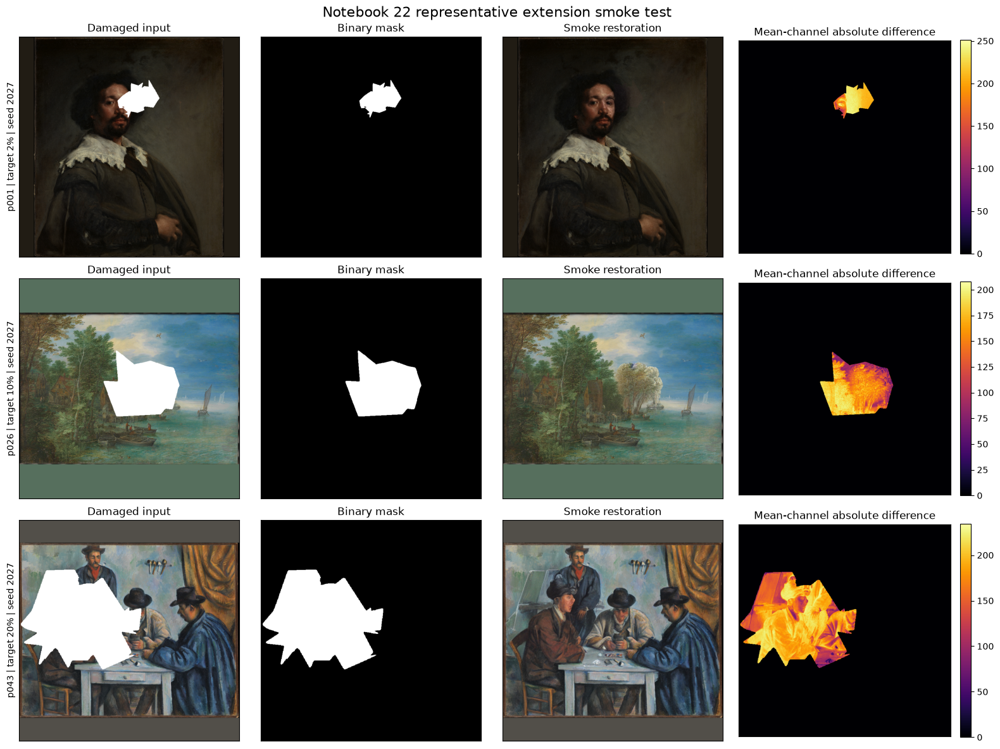

,smoke_label,restored_path,file_exists,width,height,mode,format,maximum_mean_channel_difference,mean_channel_difference
0,low_damage_p001_02pct,work/smoke/low_damage_p001_02pct.png,True,768,768,RGB,PNG,251.000000,3.693350
1,mid_damage_p026_10pct,work/smoke/mid_damage_p026_10pct.png,True,768,768,RGB,PNG,207.666667,10.384316
2,high_damage_p043_20pct,work/smoke/high_damage_p043_20pct.png,True,768,768,RGB,PNG,234.666667,27.830250


,candidate_id,case_id,file_exists,geometry_valid,checksum_matches,outside_mask_changed_pixels,inside_mask_changed_pixels,zero_control_valid,passed,details,smoke_label,painting_id,target_damage_fraction,seed,runtime_seconds
0,smoke__n22__low_damage_p001_02pct,damage_size__p001__loss_large__size_02pct,True,True,True,0,10184,True,True,,low_damage_p001_02pct,p001,0.02,2027,15.535848
1,smoke__n22__mid_damage_p026_10pct,damage_size__p026__loss_large__size_10pct,True,True,True,0,40627,True,True,,mid_damage_p026_10pct,p026,0.10,2027,8.102012
2,smoke__n22__high_damage_p043_20pct,damage_size__p043__loss_large__size_20pct,True,True,True,0,93850,True,True,,high_damage_p043_20pct,p043,0.20,2027,8.300116


Notebook 22 smoke outputs reloaded.
Output audits passed: 3 / 3
Outside-mask changed pixels: [0, 0, 0]
Inside-mask changed pixels: [10184, 40627, 93850]


In [14]:
# ---------------------------------------------------------------------------
# Reload and validate every smoke output
# ---------------------------------------------------------------------------

smoke_output_audit_df = (
    validate_candidate_outputs(
        smoke_results_df,
        project_root=PROJECT_ROOT,
        notebook_output_root=(
            NOTEBOOK_OUTPUT_ROOT
        ),
    )
)

smoke_output_audit_df = (
    smoke_output_audit_df.merge(
        smoke_results_df[
            [
                "candidate_id",
                "smoke_label",
                "painting_id",
                "target_damage_fraction",
                "seed",
                "runtime_seconds",
            ]
        ],
        on="candidate_id",
        how="left",
        validate="one_to_one",
    )
)

smoke_visual_records = []

figure, axes = plt.subplots(
    nrows=len(smoke_results_df),
    ncols=4,
    figsize=(16, 12),
    squeeze=False,
)

for row_index, result in (
    smoke_results_df
    .reset_index(drop=True)
    .iterrows()
):
    candidate = result.to_dict()

    prepared = prepare_inpaint_inputs(
        candidate,
        project_root=PROJECT_ROOT,
    )

    source_array = np.asarray(
        prepared["source_image"],
        dtype=np.uint8,
    )

    binary_mask = np.asarray(
        prepared["binary_mask"],
        dtype=np.uint8,
    )

    restored_path = (
        NOTEBOOK_OUTPUT_ROOT
        / Path(
            str(
                result["restored_path"]
            )
        )
    )

    with Image.open(
        restored_path
    ) as restored_image:
        restored_array = np.asarray(
            restored_image.convert("RGB"),
            dtype=np.uint8,
        )

        restored_size = (
            restored_image.size
        )
        restored_mode = (
            restored_image.mode
        )
        restored_format = (
            restored_image.format
        )

    absolute_difference = np.abs(
        restored_array.astype(np.int16)
        - source_array.astype(np.int16)
    ).mean(axis=2)

    smoke_visual_records.append(
        {
            "smoke_label": (
                result["smoke_label"]
            ),
            "restored_path": (
                result["restored_path"]
            ),
            "file_exists": (
                restored_path.is_file()
            ),
            "width": int(
                restored_size[0]
            ),
            "height": int(
                restored_size[1]
            ),
            "mode": restored_mode,
            "format": restored_format,
            "maximum_mean_channel_difference": float(
                absolute_difference.max()
            ),
            "mean_channel_difference": float(
                absolute_difference.mean()
            ),
        }
    )

    axes[row_index, 0].imshow(
        source_array
    )
    axes[row_index, 0].set_title(
        "Damaged input"
    )

    axes[row_index, 1].imshow(
        binary_mask,
        cmap="gray",
        vmin=0,
        vmax=255,
    )
    axes[row_index, 1].set_title(
        "Binary mask"
    )

    axes[row_index, 2].imshow(
        restored_array
    )
    axes[row_index, 2].set_title(
        "Smoke restoration"
    )

    difference_artist = (
        axes[row_index, 3].imshow(
            absolute_difference,
            cmap="inferno",
            vmin=0,
            vmax=max(
                1.0,
                float(
                    absolute_difference.max()
                ),
            ),
        )
    )

    axes[row_index, 3].set_title(
        "Mean-channel absolute difference"
    )

    row_title = (
        f"{result['painting_id']} | "
        f"target "
        f"{float(result['target_damage_fraction']):.0%} | "
        f"seed {int(result['seed'])}"
    )

    axes[row_index, 0].set_ylabel(
        row_title,
        fontsize=10,
    )

    figure.colorbar(
        difference_artist,
        ax=axes[row_index, 3],
        fraction=0.046,
        pad=0.04,
    )

    for axis in axes[row_index]:
        axis.set_xticks([])
        axis.set_yticks([])

figure.suptitle(
    "Notebook 22 representative extension smoke test",
    fontsize=16,
)

figure.tight_layout()
plt.show()

smoke_visual_audit_df = pd.DataFrame(
    smoke_visual_records
)

display(smoke_visual_audit_df)
display(smoke_output_audit_df)

print("Notebook 22 smoke outputs reloaded.")
print(
    "Output audits passed:",
    int(
        smoke_output_audit_df[
            "passed"
        ].sum()
    ),
    "/",
    len(smoke_output_audit_df),
)
print(
    "Outside-mask changed pixels:",
    smoke_output_audit_df[
        "outside_mask_changed_pixels"
    ].astype(int).tolist(),
)
print(
    "Inside-mask changed pixels:",
    smoke_output_audit_df[
        "inside_mask_changed_pixels"
    ].astype(int).tolist(),
)

In [15]:
# ---------------------------------------------------------------------------
# Idempotent Batch 3 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_3_smoke_test"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_3_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_3_smoke_test"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_3_check(
    "pipeline_device",
    (
        "The pinned pipeline executes on CUDA "
        "without CPU fallback."
    ),
    "cuda",
    EFFECTIVE_DEVICE,
    EFFECTIVE_DEVICE == "cuda",
)

add_batch_3_check(
    "pipeline_scheduler",
    (
        "The loaded pipeline uses the frozen "
        "DDIM scheduler."
    ),
    "DDIMScheduler",
    pipeline_scheduler_name,
    (
        pipeline_scheduler_name
        == "DDIMScheduler"
    ),
)

add_batch_3_check(
    "pipeline_safety_policy",
    (
        "The safety checker is disabled according "
        "to the frozen research-dataset policy."
    ),
    True,
    PIPELINE_PREFLIGHT[
        "safety_checker_disabled"
    ],
    PIPELINE_PREFLIGHT[
        "safety_checker_disabled"
    ],
)

add_batch_3_check(
    "smoke_case_count",
    (
        "Exactly three representative execution-QA "
        "cases were selected."
    ),
    3,
    len(smoke_specifications_df),
    (
        len(smoke_specifications_df) == 3
        and smoke_specifications_df[
            "case_id"
        ].is_unique
    ),
)

observed_smoke_targets = sorted(
    smoke_specifications_df[
        "target_damage_fraction"
    ].astype(float).tolist()
)

add_batch_3_check(
    "smoke_damage_levels",
    (
        "The smoke design covers the approved low, "
        "intermediate, and high target levels."
    ),
    [0.02, 0.10, 0.20],
    observed_smoke_targets,
    np.allclose(
        observed_smoke_targets,
        [0.02, 0.10, 0.20],
        rtol=0.0,
        atol=1e-12,
    ),
)

observed_smoke_paintings = (
    smoke_specifications_df[
        "painting_id"
    ].astype(str).tolist()
)

add_batch_3_check(
    "smoke_painting_selection",
    (
        "The smoke cases use the declared three "
        "painting trajectories."
    ),
    ["p001", "p026", "p043"],
    observed_smoke_paintings,
    (
        observed_smoke_paintings
        == ["p001", "p026", "p043"]
    ),
)

observed_smoke_seeds = sorted(
    smoke_results_df[
        "seed"
    ].astype(int).unique().tolist()
)

add_batch_3_check(
    "smoke_seed",
    (
        "Every smoke candidate uses the first new "
        "extension seed."
    ),
    [2027],
    observed_smoke_seeds,
    observed_smoke_seeds == [2027],
)

add_batch_3_check(
    "smoke_prompt_contract",
    (
        "Every smoke candidate retains the frozen "
        "generic prompt policy."
    ),
    {
        "prompt_policy_id": (
            POPULATION[
                "prompt_policy_id"
            ]
        ),
        "prompt_variant_id": (
            POPULATION[
                "prompt_variant_id"
            ]
        ),
    },
    {
        "prompt_policy_ids": sorted(
            smoke_results_df[
                "prompt_policy_id"
            ].astype(str).unique().tolist()
        ),
        "prompt_variant_ids": sorted(
            smoke_results_df[
                "prompt_variant_id"
            ].astype(str).unique().tolist()
        ),
    },
    (
        smoke_results_df[
            "prompt_policy_id"
        ].astype(str).eq(
            POPULATION[
                "prompt_policy_id"
            ]
        ).all()
        and smoke_results_df[
            "prompt_variant_id"
        ].astype(str).eq(
            POPULATION[
                "prompt_variant_id"
            ]
        ).all()
    ),
)

add_batch_3_check(
    "smoke_completion",
    (
        "All three smoke candidates completed "
        "successfully."
    ),
    3,
    int(
        smoke_results_df[
            "status"
        ].eq("completed").sum()
    ),
    (
        len(smoke_results_df) == 3
        and smoke_results_df[
            "status"
        ].eq("completed").all()
    ),
    details=(
        smoke_results_df[
            [
                "smoke_label",
                "status",
                "issue",
            ]
        ].to_dict("records")
    ),
)

observed_smoke_actions = {
    str(key): int(value)
    for key, value in (
        smoke_results_df[
            "execution_action"
        ]
        .value_counts()
        .items()
    )
}

add_batch_3_check(
    "smoke_execution_actions",
    (
        "Every nonzero damage-size smoke case uses "
        "Stable Diffusion inference."
    ),
    {
        "stable_diffusion_inpaint": 3,
    },
    observed_smoke_actions,
    (
        observed_smoke_actions
        == {
            "stable_diffusion_inpaint": 3,
        }
    ),
)

add_batch_3_check(
    "smoke_output_contract",
    (
        "Every smoke output passes readability, "
        "geometry, checksum, compositing, and "
        "outside-mask validation."
    ),
    3,
    int(
        smoke_output_audit_df[
            "passed"
        ].sum()
    ),
    (
        len(smoke_output_audit_df) == 3
        and smoke_output_audit_df[
            "passed"
        ].all()
    ),
    details=(
        smoke_output_audit_df
        .to_dict("records")
    ),
)

add_batch_3_check(
    "smoke_inside_mask_change",
    (
        "Every smoke restoration changes at least "
        "one pixel inside its approved mask."
    ),
    "> 0 for all three cases",
    smoke_output_audit_df[
        "inside_mask_changed_pixels"
    ].astype(int).tolist(),
    smoke_output_audit_df[
        "inside_mask_changed_pixels"
    ].astype(int).gt(0).all(),
)

add_batch_3_check(
    "smoke_outside_mask_invariance",
    (
        "Every smoke restoration preserves all "
        "pixels outside its mask exactly."
    ),
    0,
    smoke_output_audit_df[
        "outside_mask_changed_pixels"
    ].astype(int).tolist(),
    smoke_output_audit_df[
        "outside_mask_changed_pixels"
    ].astype(int).eq(0).all(),
)

smoke_paths_owned = bool(
    smoke_results_df[
        "restored_path"
    ]
    .astype(str)
    .str.startswith(
        "work/smoke/"
    )
    .all()
)

add_batch_3_check(
    "smoke_output_ownership",
    (
        "Every smoke image is owned by the "
        "Notebook 22 temporary work directory."
    ),
    True,
    smoke_paths_owned,
    smoke_paths_owned,
)

smoke_png_files = sorted(
    SMOKE_ROOT.glob("*.png")
)

add_batch_3_check(
    "smoke_file_count",
    (
        "Exactly three temporary smoke PNG files "
        "exist."
    ),
    3,
    len(smoke_png_files),
    len(smoke_png_files) == 3,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in smoke_png_files
    ],
)

canonical_files_after_batch_3 = [
    path
    for key, path in OUTPUTS.items()
    if key not in {
        "restored_images",
        "uncertainty_images",
    }
    and path.exists()
]

canonical_restoration_files = sorted(
    RESTORED_IMAGE_ROOT.rglob("*.png")
)

canonical_uncertainty_images = sorted(
    UNCERTAINTY_IMAGE_ROOT.rglob("*.png")
)

unexpected_canonical_files = [
    *canonical_files_after_batch_3,
    *canonical_restoration_files,
    *canonical_uncertainty_images,
]

add_batch_3_check(
    "no_canonical_outputs_written",
    (
        "The smoke test wrote no canonical "
        "candidate, metric, map, figure, manifest, "
        "validation, or restoration artifact."
    ),
    0,
    len(unexpected_canonical_files),
    len(unexpected_canonical_files) == 0,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in unexpected_canonical_files
    ],
)

batch_3_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_3_smoke_test"
        )
    ]
    .reset_index(drop=True)
)

display(
    smoke_results_df[
        [
            "smoke_label",
            "case_id",
            "painting_id",
            "target_damage_fraction",
            "seed",
            "execution_action",
            "runtime_seconds",
            "gpu_peak_memory_bytes",
            "retry_count",
            "attempt_count",
            "status",
            "issue",
        ]
    ]
)

display(smoke_output_audit_df)
display(batch_3_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 3 summary")
print("---------------------------")
print(
    "Batch 3 checks:",
    len(batch_3_validation_df),
)
print(
    "Cumulative checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "Smoke candidates completed:",
    int(
        smoke_results_df[
            "status"
        ].eq("completed").sum()
    ),
)
print(
    "Temporary smoke images:",
    len(smoke_png_files),
)
print(
    "Canonical outputs written:",
    len(unexpected_canonical_files),
)
print("Full 105-candidate execution started: No")
print("Batch 3 completion gate passed.")

,smoke_label,case_id,painting_id,target_damage_fraction,seed,execution_action,runtime_seconds,gpu_peak_memory_bytes,retry_count,attempt_count,status,issue
0,low_damage_p001_02pct,damage_size__p001__loss_large__size_02pct,p001,0.02,2027,stable_diffusion_inpaint,15.535848,2805533184,0,1,completed,
1,mid_damage_p026_10pct,damage_size__p026__loss_large__size_10pct,p026,0.10,2027,stable_diffusion_inpaint,8.102012,2805533184,0,1,completed,
2,high_damage_p043_20pct,damage_size__p043__loss_large__size_20pct,p043,0.20,2027,stable_diffusion_inpaint,8.300116,2805533184,0,1,completed,


,candidate_id,case_id,file_exists,geometry_valid,checksum_matches,outside_mask_changed_pixels,inside_mask_changed_pixels,zero_control_valid,passed,details,smoke_label,painting_id,target_damage_fraction,seed,runtime_seconds
0,smoke__n22__low_damage_p001_02pct,damage_size__p001__loss_large__size_02pct,True,True,True,0,10184,True,True,,low_damage_p001_02pct,p001,0.02,2027,15.535848
1,smoke__n22__mid_damage_p026_10pct,damage_size__p026__loss_large__size_10pct,True,True,True,0,40627,True,True,,mid_damage_p026_10pct,p026,0.10,2027,8.102012
2,smoke__n22__high_damage_p043_20pct,damage_size__p043__loss_large__size_20pct,True,True,True,0,93850,True,True,,high_damage_p043_20pct,p043,0.20,2027,8.300116


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_3_smoke_test,pipeline_device,The pinned pipeline executes on CUDA without C...,blocking,cuda,cuda,True,
1,batch_3_smoke_test,pipeline_scheduler,The loaded pipeline uses the frozen DDIM sched...,blocking,DDIMScheduler,DDIMScheduler,True,
2,batch_3_smoke_test,pipeline_safety_policy,The safety checker is disabled according to th...,blocking,True,True,True,
3,batch_3_smoke_test,smoke_case_count,Exactly three representative execution-QA case...,blocking,3,3,True,
4,batch_3_smoke_test,smoke_damage_levels,"The smoke design covers the approved low, inte...",blocking,"[0.02, 0.1, 0.2]","[0.02, 0.1, 0.2]",True,
5,batch_3_smoke_test,smoke_painting_selection,The smoke cases use the declared three paintin...,blocking,"[""p001"", ""p026"", ""p043""]","[""p001"", ""p026"", ""p043""]",True,
6,batch_3_smoke_test,smoke_seed,Every smoke candidate uses the first new exten...,blocking,[2027],[2027],True,
7,batch_3_smoke_test,smoke_prompt_contract,Every smoke candidate retains the frozen gener...,blocking,"{""prompt_policy_id"": ""sd15_prompt_policy.v3"", ...","{""prompt_policy_ids"": [""sd15_prompt_policy.v3""...",True,
8,batch_3_smoke_test,smoke_completion,All three smoke candidates completed successfu...,blocking,3,3,True,"[{""issue"": """", ""smoke_label"": ""low_damage_p001..."
9,batch_3_smoke_test,smoke_execution_actions,Every nonzero damage-size smoke case uses Stab...,blocking,"{""stable_diffusion_inpaint"": 3}","{""stable_diffusion_inpaint"": 3}",True,


Notebook 22 Batch 3 summary
---------------------------
Batch 3 checks: 16
Cumulative checks: 108
Blocking failures: 0
Smoke candidates completed: 3
Temporary smoke images: 3
Canonical outputs written: 0
Full 105-candidate execution started: No
Batch 3 completion gate passed.


## Batch 4 — Full resumable extension generation

This batch generates the 105 Notebook 22-owned Stable Diffusion candidates required to complete the damage-size uncertainty population.

It:

- reuses the smoke-validated pipeline when available;
- otherwise reloads the pinned pipeline;
- verifies the exact 105-row execution plan;
- estimates runtime and storage from the completed smoke test;
- generates seeds `2027`, `2028`, and `2029` for all 35 damage-size cases;
- prints progress every ten candidates;
- checkpoints every five candidates;
- validates checkpoints before reuse;
- preserves the exact declared seed when retrying;
- reloads and audits every generated image;
- combines the 105 new candidates with 35 frozen Notebook 11 anchors;
- verifies all 35 four-seed groups;
- renders three representative complete seed groups.

The generated restoration images are canonical Notebook 22 outputs. The checkpoint remains temporary work evidence. The canonical candidate table, uncertainty metrics, maps, figures, and manifests are written only after their later validation gates.

In [16]:
import shutil

from restoration_eval.damage_size_diffusion_uncertainty import (
    build_complete_uncertainty_worklist,
)

from restoration_eval.restoration_stable_diffusion import (
    load_stable_diffusion_pipeline,
    run_stable_diffusion_candidates,
    validate_candidate_outputs,
)


# ---------------------------------------------------------------------------
# Restore the smoke-validated pipeline if the kernel was restarted
# ---------------------------------------------------------------------------

pipeline_reloaded_for_batch_4 = False

if (
    "stable_diffusion_pipeline"
    not in globals()
    or stable_diffusion_pipeline is None
):
    if not torch.cuda.is_available():
        raise RuntimeError(
            "CUDA is unavailable. Notebook 22 "
            "prohibits silent CPU fallback."
        )

    print(
        "The pipeline is not in memory; loading the "
        "pinned model before full execution."
    )

    pipeline_reload_started = (
        time.perf_counter()
    )

    stable_diffusion_pipeline, EFFECTIVE_DEVICE = (
        load_stable_diffusion_pipeline(
            effective_generation_config
        )
    )

    pipeline_reload_seconds = (
        time.perf_counter()
        - pipeline_reload_started
    )

    pipeline_reloaded_for_batch_4 = True

    print(
        "Pipeline reload seconds:",
        round(
            pipeline_reload_seconds,
            3,
        ),
    )
else:
    print(
        "Reusing the smoke-validated pipeline "
        "already loaded in GPU memory."
    )


# ---------------------------------------------------------------------------
# Runtime and storage estimates
# ---------------------------------------------------------------------------

completed_smoke_runtimes = (
    smoke_results_df.loc[
        smoke_results_df[
            "execution_action"
        ].eq(
            "stable_diffusion_inpaint"
        ),
        "runtime_seconds",
    ]
    .astype(float)
    .reset_index(drop=True)
)

if len(completed_smoke_runtimes) < 2:
    raise RuntimeError(
        "At least two completed smoke inferences "
        "are required for the execution estimate."
    )

# Exclude the first inference because it includes
# additional warm-up overhead.
steady_smoke_runtime_seconds = float(
    completed_smoke_runtimes.iloc[1:].median()
)

estimated_execution_seconds = (
    steady_smoke_runtime_seconds
    * EXPECTED_COUNTS["new_candidates"]
)

estimated_execution_minutes = (
    estimated_execution_seconds / 60.0
)

smoke_file_sizes = pd.Series(
    [
        (
            NOTEBOOK_OUTPUT_ROOT
            / Path(relative_path)
        ).stat().st_size
        for relative_path in (
            smoke_results_df[
                "restored_path"
            ].astype(str)
        )
    ],
    dtype="int64",
)

estimated_restored_bytes = int(
    smoke_file_sizes.mean()
    * EXPECTED_COUNTS["new_candidates"]
)

disk_usage = shutil.disk_usage(
    NOTEBOOK_OUTPUT_ROOT
)

minimum_free_bytes = max(
    estimated_restored_bytes * 3,
    1024 ** 3,
)

storage_preflight_passed = bool(
    disk_usage.free
    >= minimum_free_bytes
)


# ---------------------------------------------------------------------------
# Existing resume state
# ---------------------------------------------------------------------------

checkpoint_path = WORK_PATHS[
    "candidate_checkpoint"
]

if checkpoint_path.is_file():
    existing_checkpoint_df = pd.read_csv(
        checkpoint_path,
        low_memory=False,
    )
    existing_checkpoint_rows = len(
        existing_checkpoint_df
    )
else:
    existing_checkpoint_df = (
        pd.DataFrame()
    )
    existing_checkpoint_rows = 0

existing_canonical_images = sorted(
    RESTORED_IMAGE_ROOT.rglob("*.png")
)

plan_fingerprints = sorted(
    extension_candidate_plan_df[
        "configuration_fingerprint"
    ].astype(str).unique().tolist()
)

execution_preflight_df = pd.DataFrame(
    [
        {
            "preflight_item": (
                "effective_device"
            ),
            "observed": EFFECTIVE_DEVICE,
            "required": "cuda",
            "passed": (
                EFFECTIVE_DEVICE == "cuda"
            ),
        },
        {
            "preflight_item": (
                "extension_candidate_count"
            ),
            "observed": len(
                extension_candidate_plan_df
            ),
            "required": 105,
            "passed": (
                len(
                    extension_candidate_plan_df
                ) == 105
            ),
        },
        {
            "preflight_item": (
                "unique_candidate_ids"
            ),
            "observed": (
                extension_candidate_plan_df[
                    "candidate_id"
                ].nunique()
            ),
            "required": 105,
            "passed": (
                extension_candidate_plan_df[
                    "candidate_id"
                ].is_unique
            ),
        },
        {
            "preflight_item": (
                "unique_output_paths"
            ),
            "observed": (
                extension_candidate_plan_df[
                    "restored_path"
                ].nunique()
            ),
            "required": 105,
            "passed": (
                extension_candidate_plan_df[
                    "restored_path"
                ].is_unique
            ),
        },
        {
            "preflight_item": (
                "generated_seed_set"
            ),
            "observed": sorted(
                extension_candidate_plan_df[
                    "seed"
                ].astype(int).unique().tolist()
            ),
            "required": [
                2027,
                2028,
                2029,
            ],
            "passed": (
                set(
                    extension_candidate_plan_df[
                        "seed"
                    ].astype(int)
                )
                == {
                    2027,
                    2028,
                    2029,
                }
            ),
        },
        {
            "preflight_item": (
                "single_configuration_fingerprint"
            ),
            "observed": len(
                plan_fingerprints
            ),
            "required": 1,
            "passed": (
                len(plan_fingerprints) == 1
            ),
        },
        {
            "preflight_item": (
                "resume_enabled"
            ),
            "observed": EXECUTION_POLICY[
                "resume_enabled"
            ],
            "required": True,
            "passed": bool(
                EXECUTION_POLICY[
                    "resume_enabled"
                ]
            ),
        },
        {
            "preflight_item": (
                "progress_interval_candidates"
            ),
            "observed": EXECUTION_POLICY[
                "progress_interval_candidates"
            ],
            "required": 10,
            "passed": (
                int(
                    EXECUTION_POLICY[
                        "progress_interval_candidates"
                    ]
                ) == 10
            ),
        },
        {
            "preflight_item": (
                "checkpoint_interval_candidates"
            ),
            "observed": EXECUTION_POLICY[
                "checkpoint_interval_candidates"
            ],
            "required": 5,
            "passed": (
                int(
                    EXECUTION_POLICY[
                        "checkpoint_interval_candidates"
                    ]
                ) == 5
            ),
        },
        {
            "preflight_item": (
                "available_storage_bytes"
            ),
            "observed": int(
                disk_usage.free
            ),
            "required": int(
                minimum_free_bytes
            ),
            "passed": (
                storage_preflight_passed
            ),
        },
    ]
)

display(execution_preflight_df)

if not execution_preflight_df[
    "passed"
].all():
    display(
        execution_preflight_df.loc[
            ~execution_preflight_df[
                "passed"
            ]
        ]
    )

    raise RuntimeError(
        "Notebook 22 full-generation "
        "preflight failed."
    )

print("Notebook 22 execution preflight passed.")
print(
    "Estimated generation minutes:",
    round(
        estimated_execution_minutes,
        1,
    ),
)
print(
    "Estimated restored-image storage (MiB):",
    round(
        estimated_restored_bytes
        / (1024 ** 2),
        1,
    ),
)
print(
    "Available storage (GiB):",
    round(
        disk_usage.free
        / (1024 ** 3),
        2,
    ),
)
print(
    "Existing checkpoint rows:",
    existing_checkpoint_rows,
)
print(
    "Existing canonical images:",
    len(
        existing_canonical_images
    ),
)
print(
    "Pipeline reloaded in Batch 4:",
    pipeline_reloaded_for_batch_4,
)

Reusing the smoke-validated pipeline already loaded in GPU memory.


,preflight_item,observed,required,passed
0,effective_device,cuda,cuda,True
1,extension_candidate_count,105,105,True
2,unique_candidate_ids,105,105,True
3,unique_output_paths,105,105,True
4,generated_seed_set,"[2027, 2028, 2029]","[2027, 2028, 2029]",True
5,single_configuration_fingerprint,1,1,True
6,resume_enabled,True,True,True
7,progress_interval_candidates,10,10,True
8,checkpoint_interval_candidates,5,5,True
9,available_storage_bytes,933268856832,1073741824,True


Notebook 22 execution preflight passed.
Estimated generation minutes: 14.4
Estimated restored-image storage (MiB): 74.7
Available storage (GiB): 869.17
Existing checkpoint rows: 0
Existing canonical images: 0
Pipeline reloaded in Batch 4: False


In [17]:
# ---------------------------------------------------------------------------
# Execute or strictly resume all 105 extension candidates
# ---------------------------------------------------------------------------

FULL_EXECUTION_STARTED_AT_UTC = (
    datetime.now(timezone.utc)
    .isoformat()
    .replace("+00:00", "Z")
)

full_execution_started = (
    time.perf_counter()
)

extension_execution_df = (
    run_stable_diffusion_candidates(
        extension_candidate_plan_df,
        pipeline=stable_diffusion_pipeline,
        device=EFFECTIVE_DEVICE,
        project_root=PROJECT_ROOT,
        notebook_output_root=(
            NOTEBOOK_OUTPUT_ROOT
        ),
        config=(
            effective_generation_config
        ),
        checkpoint_path=(
            checkpoint_path
        ),
        progress_callback=print,
    )
)

full_execution_seconds = (
    time.perf_counter()
    - full_execution_started
)

FULL_EXECUTION_COMPLETED_AT_UTC = (
    datetime.now(timezone.utc)
    .isoformat()
    .replace("+00:00", "Z")
)

extension_completion_validation = (
    validate_extension_candidate_plan(
        extension_execution_df,
        config=extension_config,
        require_completed=True,
    )
)

failed_extension_candidates_df = (
    extension_execution_df.loc[
        ~extension_execution_df[
            "status"
        ].eq("completed")
    ]
    .copy()
)

if not failed_extension_candidates_df.empty:
    display(
        failed_extension_candidates_df[
            [
                "candidate_id",
                "case_id",
                "painting_id",
                "seed",
                "attempt_count",
                "status",
                "issue",
            ]
        ]
    )

    raise RuntimeError(
        "One or more extension candidates failed. "
        "The checkpoint was retained; rerun this "
        "cell to validate and resume."
    )

if not extension_completion_validation[
    "passed"
]:
    raise ValueError(
        "Completed extension candidates violate "
        "the approved schema or population contract: "
        f"{extension_completion_validation}"
    )

execution_action_counts = {
    str(key): int(value)
    for key, value in (
        extension_execution_df[
            "execution_action"
        ]
        .value_counts()
        .items()
    )
}

print("Notebook 22 full generation completed.")
print(
    "Completed candidates:",
    int(
        extension_execution_df[
            "status"
        ].eq("completed").sum()
    ),
)
print(
    "Execution actions:",
    execution_action_counts,
)
print(
    "Runtime minutes:",
    round(
        full_execution_seconds / 60.0,
        2,
    ),
)
print(
    "Median candidate runtime seconds:",
    round(
        float(
            extension_execution_df[
                "runtime_seconds"
            ].astype(float).median()
        ),
        3,
    ),
)
print(
    "Maximum retries observed:",
    int(
        extension_execution_df[
            "retry_count"
        ].astype(int).max()
    ),
)
print(
    "Checkpoint:",
    to_repo_relative(
        checkpoint_path,
        PROJECT_ROOT,
    ),
)

100%|██████████| 30/30 [00:07<00:00,  3.78it/s]


Stable Diffusion candidates: 10/105 | completed=10 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.62it/s]


Stable Diffusion candidates: 20/105 | completed=20 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.52it/s]


Stable Diffusion candidates: 30/105 | completed=30 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.21it/s]


Stable Diffusion candidates: 40/105 | completed=40 | failed=0


100%|██████████| 30/30 [00:09<00:00,  3.23it/s]


Stable Diffusion candidates: 50/105 | completed=50 | failed=0


100%|██████████| 30/30 [00:11<00:00,  2.73it/s]


Stable Diffusion candidates: 60/105 | completed=60 | failed=0


100%|██████████| 30/30 [00:11<00:00,  2.60it/s]


Stable Diffusion candidates: 70/105 | completed=70 | failed=0


100%|██████████| 30/30 [00:11<00:00,  2.65it/s]


Stable Diffusion candidates: 80/105 | completed=80 | failed=0


100%|██████████| 30/30 [00:11<00:00,  2.53it/s]


Stable Diffusion candidates: 90/105 | completed=90 | failed=0


100%|██████████| 30/30 [00:12<00:00,  2.36it/s]


Stable Diffusion candidates: 100/105 | completed=100 | failed=0


100%|██████████| 30/30 [00:12<00:00,  2.38it/s]


Stable Diffusion candidates: 105/105 | completed=105 | failed=0
Notebook 22 full generation completed.
Completed candidates: 105
Execution actions: {'stable_diffusion_inpaint': 105}
Runtime minutes: 19.52
Median candidate runtime seconds: 10.775
Maximum retries observed: 0
Checkpoint: outputs/22_damage_size_diffusion_uncertainty_extension/work/candidate_checkpoint.csv


In [18]:
# ---------------------------------------------------------------------------
# Validate all 105 Notebook 22-owned generated images
# ---------------------------------------------------------------------------

extension_output_audit_df = (
    validate_candidate_outputs(
        extension_execution_df,
        project_root=PROJECT_ROOT,
        notebook_output_root=(
            NOTEBOOK_OUTPUT_ROOT
        ),
    )
)

extension_output_audit_df = (
    extension_output_audit_df.merge(
        extension_execution_df[
            [
                "candidate_id",
                "painting_id",
                "seed",
                "runtime_seconds",
                "retry_count",
                "attempt_count",
                "execution_action",
                "status",
            ]
        ],
        on="candidate_id",
        how="left",
        validate="one_to_one",
    )
    .merge(
        case_fraction_lookup,
        on="case_id",
        how="left",
        validate="many_to_one",
    )
)

extension_image_records = []

for image_index, candidate in enumerate(
    extension_execution_df.itertuples(
        index=False
    ),
    start=1,
):
    restored_path = (
        NOTEBOOK_OUTPUT_ROOT
        / Path(
            str(candidate.restored_path)
        )
    )

    with Image.open(
        restored_path
    ) as image:
        image.load()

        extension_image_records.append(
            {
                "candidate_id": (
                    candidate.candidate_id
                ),
                "case_id": candidate.case_id,
                "painting_id": (
                    candidate.painting_id
                ),
                "seed": int(candidate.seed),
                "file_exists": (
                    restored_path.is_file()
                ),
                "format": image.format,
                "mode": image.mode,
                "width": int(image.width),
                "height": int(image.height),
                "size_bytes": int(
                    restored_path.stat().st_size
                ),
            }
        )

    if (
        image_index % 10 == 0
        or image_index
        == len(extension_execution_df)
    ):
        print(
            "Reloaded generated images:",
            f"{image_index}/"
            f"{len(extension_execution_df)}",
        )

extension_image_file_audit_df = (
    pd.DataFrame(
        extension_image_records
    )
)

complete_uncertainty_worklist_df = (
    build_complete_uncertainty_worklist(
        frozen_anchors_df,
        extension_execution_df,
        damage_size_cases_df,
        geometry_df,
        config=extension_config,
    )
)

complete_seed_coverage = (
    complete_uncertainty_worklist_df
    .groupby("case_id")["seed"]
    .apply(
        lambda values: tuple(
            sorted(
                values.astype(int)
            )
        )
    )
)

combined_files_exist = (
    complete_uncertainty_worklist_df[
        "restored_path"
    ].astype(str).map(
        lambda relative_path: (
            PROJECT_ROOT
            / Path(relative_path)
        ).is_file()
    )
)

print("Notebook 22 generated outputs audited.")
print(
    "Output-contract passes:",
    int(
        extension_output_audit_df[
            "passed"
        ].sum()
    ),
    "/",
    len(extension_output_audit_df),
)
print(
    "Readable RGB PNG files:",
    int(
        (
            extension_image_file_audit_df[
                "format"
            ].eq("PNG")
            & extension_image_file_audit_df[
                "mode"
            ].eq("RGB")
            & extension_image_file_audit_df[
                "width"
            ].eq(768)
            & extension_image_file_audit_df[
                "height"
            ].eq(768)
        ).sum()
    ),
    "/",
    len(extension_image_file_audit_df),
)
print(
    "Combined candidates:",
    len(
        complete_uncertainty_worklist_df
    ),
)
print(
    "Complete four-seed groups:",
    len(complete_seed_coverage),
)
print(
    "Combined restored files found:",
    int(combined_files_exist.sum()),
    "/",
    len(combined_files_exist),
)

Reloaded generated images: 10/105
Reloaded generated images: 20/105
Reloaded generated images: 30/105
Reloaded generated images: 40/105
Reloaded generated images: 50/105
Reloaded generated images: 60/105
Reloaded generated images: 70/105
Reloaded generated images: 80/105
Reloaded generated images: 90/105
Reloaded generated images: 100/105
Reloaded generated images: 105/105
Notebook 22 generated outputs audited.
Output-contract passes: 105 / 105
Readable RGB PNG files: 105 / 105
Combined candidates: 140
Complete four-seed groups: 35
Combined restored files found: 140 / 140


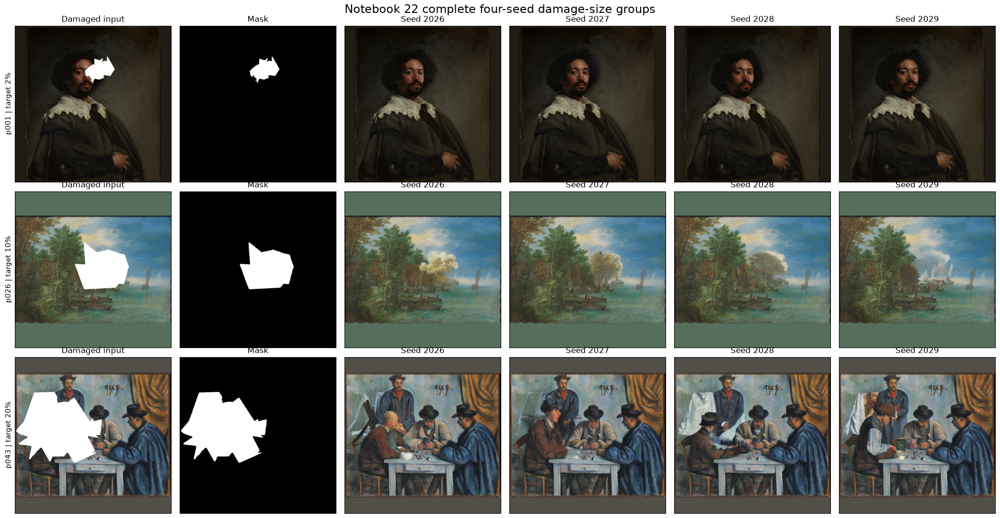

,candidate_id,case_id,painting_id,target_damage_fraction,seed,geometry_valid,checksum_matches,outside_mask_changed_pixels,inside_mask_changed_pixels,passed
0,sd15dsu__eabfb567a4493435,damage_size__p001__loss_large__size_02pct,p001,0.02,2027,True,True,0,10184,True
1,sd15dsu__5ec27a6538f033db,damage_size__p001__loss_large__size_02pct,p001,0.02,2028,True,True,0,10184,True
2,sd15dsu__084cb2679e5e71c6,damage_size__p001__loss_large__size_02pct,p001,0.02,2029,True,True,0,10184,True
3,sd15dsu__9ef12db2a653c462,damage_size__p001__loss_large__size_04pct,p001,0.04,2027,True,True,0,20367,True
4,sd15dsu__031683fe97c570d6,damage_size__p001__loss_large__size_04pct,p001,0.04,2028,True,True,0,20367,True
5,sd15dsu__68a2306103875f6c,damage_size__p001__loss_large__size_04pct,p001,0.04,2029,True,True,0,20367,True
6,sd15dsu__c9683bd024125f0f,damage_size__p001__loss_large__size_06pct,p001,0.06,2027,True,True,0,30551,True
7,sd15dsu__d089641c863da270,damage_size__p001__loss_large__size_06pct,p001,0.06,2028,True,True,0,30551,True
8,sd15dsu__914c41507a08f116,damage_size__p001__loss_large__size_06pct,p001,0.06,2029,True,True,0,30551,True
9,sd15dsu__ed576a5309a59534,damage_size__p001__loss_large__size_08pct,p001,0.08,2027,True,True,0,40735,True


Rendered complete seed groups: 3
The figure is rendered for QA only and is not written as a canonical artifact.


In [19]:
# ---------------------------------------------------------------------------
# Render low-, intermediate-, and high-damage seed groups
# ---------------------------------------------------------------------------

representative_case_ids = (
    smoke_specifications_df[
        "case_id"
    ].astype(str).tolist()
)

figure, axes = plt.subplots(
    nrows=len(representative_case_ids),
    ncols=6,
    figsize=(21, 11),
    squeeze=False,
)

for row_index, case_id in enumerate(
    representative_case_ids
):
    case_matches = (
        damage_size_cases_df.loc[
            damage_size_cases_df[
                "case_id"
            ].astype(str).eq(case_id)
        ]
    )

    if len(case_matches) != 1:
        raise ValueError(
            "Expected one case row for "
            f"{case_id!r}; observed "
            f"{len(case_matches)}."
        )

    case_row = (
        case_matches.iloc[0]
    )

    input_path = (
        PROJECT_ROOT
        / Path(
            str(
                case_row[
                    "input_image_path"
                ]
            )
        )
    )

    mask_path = (
        PROJECT_ROOT
        / Path(
            str(
                case_row[
                    "mask_or_effect_path"
                ]
            )
        )
    )

    with Image.open(
        input_path
    ) as image:
        damaged_array = np.asarray(
            image.convert("RGB"),
            dtype=np.uint8,
        )

    with Image.open(
        mask_path
    ) as image:
        mask_array = np.asarray(
            image.convert("L"),
            dtype=np.uint8,
        )

    axes[row_index, 0].imshow(
        damaged_array
    )
    axes[row_index, 0].set_title(
        "Damaged input"
    )

    axes[row_index, 1].imshow(
        mask_array,
        cmap="gray",
        vmin=0,
        vmax=255,
    )
    axes[row_index, 1].set_title(
        "Mask"
    )

    group_candidates = (
        complete_uncertainty_worklist_df.loc[
            complete_uncertainty_worklist_df[
                "case_id"
            ].astype(str).eq(case_id)
        ]
        .sort_values(
            "seed",
            kind="stable",
        )
        .reset_index(drop=True)
    )

    if len(group_candidates) != 4:
        raise ValueError(
            "Expected four candidates for "
            f"{case_id!r}; observed "
            f"{len(group_candidates)}."
        )

    for candidate_index, candidate in (
        group_candidates.iterrows()
    ):
        restored_path = (
            PROJECT_ROOT
            / Path(
                str(
                    candidate[
                        "restored_path"
                    ]
                )
            )
        )

        with Image.open(
            restored_path
        ) as image:
            restored_array = np.asarray(
                image.convert("RGB"),
                dtype=np.uint8,
            )

        axis = axes[
            row_index,
            candidate_index + 2,
        ]

        axis.imshow(restored_array)
        axis.set_title(
            f"Seed "
            f"{int(candidate['seed'])}"
        )

    row_label = (
        f"{case_row['painting_id']} | "
        f"target "
        f"{float(case_row['target_damage_fraction']):.0%}"
    )

    axes[row_index, 0].set_ylabel(
        row_label,
        fontsize=11,
    )

    for axis in axes[row_index]:
        axis.set_xticks([])
        axis.set_yticks([])

figure.suptitle(
    "Notebook 22 complete four-seed "
    "damage-size groups",
    fontsize=17,
)

figure.tight_layout()
plt.show()

display(
    extension_output_audit_df[
        [
            "candidate_id",
            "case_id",
            "painting_id",
            "target_damage_fraction",
            "seed",
            "geometry_valid",
            "checksum_matches",
            "outside_mask_changed_pixels",
            "inside_mask_changed_pixels",
            "passed",
        ]
    ].head(15)
)

print(
    "Rendered complete seed groups:",
    len(representative_case_ids),
)
print(
    "The figure is rendered for QA only "
    "and is not written as a canonical artifact."
)

In [20]:
# ---------------------------------------------------------------------------
# Idempotent Batch 4 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_4_full_generation"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_4_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_4_full_generation"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_4_check(
    "completed_candidate_contract",
    (
        "The completed 105-row extension satisfies "
        "the schema and population contract."
    ),
    True,
    extension_completion_validation,
    extension_completion_validation[
        "passed"
    ],
)

add_batch_4_check(
    "completed_candidate_count",
    (
        "Exactly 105 extension candidates completed."
    ),
    105,
    int(
        extension_execution_df[
            "status"
        ].eq("completed").sum()
    ),
    (
        len(extension_execution_df) == 105
        and extension_execution_df[
            "status"
        ].eq("completed").all()
    ),
)

add_batch_4_check(
    "generated_seed_coverage",
    (
        "Every case has completed seeds 2027, "
        "2028, and 2029."
    ),
    [2027, 2028, 2029],
    sorted(
        extension_execution_df[
            "seed"
        ].astype(int).unique().tolist()
    ),
    (
        set(
            extension_execution_df[
                "seed"
            ].astype(int)
        )
        == {
            2027,
            2028,
            2029,
        }
        and extension_execution_df.groupby(
            "case_id"
        )["seed"].nunique().eq(3).all()
    ),
)

add_batch_4_check(
    "generated_output_audit",
    (
        "Every generated output passes checksum, "
        "geometry, and compositing validation."
    ),
    105,
    int(
        extension_output_audit_df[
            "passed"
        ].sum()
    ),
    (
        len(
            extension_output_audit_df
        ) == 105
        and extension_output_audit_df[
            "passed"
        ].all()
    ),
    details=(
        extension_output_audit_df.loc[
            ~extension_output_audit_df[
                "passed"
            ]
        ].to_dict("records")
    ),
)

add_batch_4_check(
    "outside_mask_invariance",
    (
        "All 105 outputs preserve every outside-mask "
        "pixel exactly."
    ),
    0,
    sorted(
        extension_output_audit_df[
            "outside_mask_changed_pixels"
        ].astype(int).unique().tolist()
    ),
    extension_output_audit_df[
        "outside_mask_changed_pixels"
    ].astype(int).eq(0).all(),
)

add_batch_4_check(
    "inside_mask_change",
    (
        "Every generated restoration changes pixels "
        "inside its approved nonzero mask."
    ),
    "> 0 for all 105 candidates",
    {
        "minimum": int(
            extension_output_audit_df[
                "inside_mask_changed_pixels"
            ].astype(int).min()
        ),
        "maximum": int(
            extension_output_audit_df[
                "inside_mask_changed_pixels"
            ].astype(int).max()
        ),
    },
    extension_output_audit_df[
        "inside_mask_changed_pixels"
    ].astype(int).gt(0).all(),
)

readable_image_contract = (
    extension_image_file_audit_df[
        "file_exists"
    ].eq(True)
    & extension_image_file_audit_df[
        "format"
    ].eq("PNG")
    & extension_image_file_audit_df[
        "mode"
    ].eq("RGB")
    & extension_image_file_audit_df[
        "width"
    ].eq(768)
    & extension_image_file_audit_df[
        "height"
    ].eq(768)
)

add_batch_4_check(
    "readable_image_contract",
    (
        "Every generated image reloads as a "
        "768×768 RGB PNG."
    ),
    105,
    int(
        readable_image_contract.sum()
    ),
    (
        len(readable_image_contract) == 105
        and readable_image_contract.all()
    ),
)

canonical_restoration_files = sorted(
    RESTORED_IMAGE_ROOT.rglob("*.png")
)

add_batch_4_check(
    "canonical_restoration_file_count",
    (
        "The Notebook 22 canonical restoration "
        "directory contains exactly 105 PNG files."
    ),
    105,
    len(canonical_restoration_files),
    len(canonical_restoration_files) == 105,
)

checkpoint_frame = pd.read_csv(
    checkpoint_path,
    low_memory=False,
)

add_batch_4_check(
    "checkpoint_contract",
    (
        "The resumable checkpoint contains exactly "
        "105 unique completed candidate rows."
    ),
    105,
    {
        "rows": len(
            checkpoint_frame
        ),
        "unique_candidate_ids": int(
            checkpoint_frame[
                "candidate_id"
            ].nunique()
        ),
        "completed_rows": int(
            checkpoint_frame[
                "status"
            ].astype(str).eq(
                "completed"
            ).sum()
        ),
    },
    (
        len(checkpoint_frame) == 105
        and checkpoint_frame[
            "candidate_id"
        ].is_unique
        and checkpoint_frame[
            "status"
        ].astype(str).eq(
            "completed"
        ).all()
    ),
)

expected_four_seed_tuple = tuple(
    int(seed)
    for seed in (
        POPULATION[
            "expected_seeds"
        ]
    )
)

four_seed_groups_valid = (
    len(complete_seed_coverage) == 35
    and complete_seed_coverage.map(
        lambda values: (
            values
            == expected_four_seed_tuple
        )
    ).all()
)

seed_coverage_counts_json_safe = {
    ",".join(
        str(seed)
        for seed in seed_tuple
    ): int(count)
    for seed_tuple, count in (
        complete_seed_coverage
        .value_counts()
        .items()
    )
}

add_batch_4_check(
    "complete_uncertainty_population",
    (
        "The frozen and extension candidates form "
        "35 exact four-seed uncertainty groups."
    ),
    {
        "candidates": 140,
        "groups": 35,
        "seeds": [
            2026,
            2027,
            2028,
            2029,
        ],
    },
    {
        "candidates": len(
            complete_uncertainty_worklist_df
        ),
        "groups": len(
            complete_seed_coverage
        ),
        "coverage_counts": (
            seed_coverage_counts_json_safe
        ),
    },
    (
        len(
            complete_uncertainty_worklist_df
        ) == 140
        and four_seed_groups_valid
    ),
)

add_batch_4_check(
    "combined_file_coverage",
    (
        "All 35 frozen references and 105 extension "
        "restorations resolve to readable files."
    ),
    140,
    int(
        combined_files_exist.sum()
    ),
    (
        len(combined_files_exist) == 140
        and combined_files_exist.all()
    ),
)

add_batch_4_check(
    "unordered_pair_arithmetic",
    (
        "Thirty-five four-seed groups imply exactly "
        "210 unique unordered pairs."
    ),
    210,
    int(
        len(complete_seed_coverage)
        * 6
    ),
    (
        len(complete_seed_coverage)
        * 6 == 210
    ),
)

maximum_retry_count = int(
    extension_execution_df[
        "retry_count"
    ].astype(int).max()
)

add_batch_4_check(
    "retry_policy",
    (
        "All retry counts remain within the frozen "
        "maximum-retry contract."
    ),
    int(
        GENERATION_CONTRACT[
            "maximum_retries"
        ]
    ),
    maximum_retry_count,
    (
        maximum_retry_count
        <= int(
            GENERATION_CONTRACT[
                "maximum_retries"
            ]
        )
    ),
)

non_image_canonical_files = [
    path
    for key, path in OUTPUTS.items()
    if key not in {
        "restored_images",
        "uncertainty_images",
    }
    and path.exists()
]

add_batch_4_check(
    "deferred_non_image_outputs",
    (
        "Candidate tables, metrics, maps, figures, "
        "manifests, and validation files remain "
        "deferred to later batches."
    ),
    0,
    len(non_image_canonical_files),
    len(non_image_canonical_files) == 0,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in (
            non_image_canonical_files
        )
    ],
)

batch_4_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_4_full_generation"
        )
    ]
    .reset_index(drop=True)
)

display(
    extension_execution_df[
        [
            "candidate_id",
            "case_id",
            "painting_id",
            "seed",
            "execution_action",
            "runtime_seconds",
            "gpu_peak_memory_bytes",
            "retry_count",
            "attempt_count",
            "status",
            "issue",
        ]
    ].head(15)
)

display(
    extension_image_file_audit_df.head(15)
)

display(batch_4_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 4 summary")
print("---------------------------")
print(
    "Batch 4 checks:",
    len(batch_4_validation_df),
)
print(
    "Cumulative checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "Completed extension candidates:",
    len(extension_execution_df),
)
print(
    "Canonical restoration images:",
    len(canonical_restoration_files),
)
print(
    "Combined uncertainty candidates:",
    len(
        complete_uncertainty_worklist_df
    ),
)
print(
    "Complete four-seed groups:",
    len(complete_seed_coverage),
)
print(
    "Expected unordered pairs:",
    len(complete_seed_coverage) * 6,
)
print(
    "Full generation runtime minutes:",
    round(
        full_execution_seconds / 60.0,
        2,
    ),
)
print("Batch 4 completion gate passed.")

,candidate_id,case_id,painting_id,seed,execution_action,runtime_seconds,gpu_peak_memory_bytes,retry_count,attempt_count,status,issue
0,sd15dsu__eabfb567a4493435,damage_size__p001__loss_large__size_02pct,p001,2027,stable_diffusion_inpaint,8.333402,2805533184,0,1,completed,
1,sd15dsu__5ec27a6538f033db,damage_size__p001__loss_large__size_02pct,p001,2028,stable_diffusion_inpaint,8.274385,2805533184,0,1,completed,
2,sd15dsu__084cb2679e5e71c6,damage_size__p001__loss_large__size_02pct,p001,2029,stable_diffusion_inpaint,8.097945,2805533184,0,1,completed,
3,sd15dsu__9ef12db2a653c462,damage_size__p001__loss_large__size_04pct,p001,2027,stable_diffusion_inpaint,8.907619,2805533184,0,1,completed,
4,sd15dsu__031683fe97c570d6,damage_size__p001__loss_large__size_04pct,p001,2028,stable_diffusion_inpaint,8.392471,2805533184,0,1,completed,
5,sd15dsu__68a2306103875f6c,damage_size__p001__loss_large__size_04pct,p001,2029,stable_diffusion_inpaint,8.924843,2805533184,0,1,completed,
6,sd15dsu__c9683bd024125f0f,damage_size__p001__loss_large__size_06pct,p001,2027,stable_diffusion_inpaint,8.743849,2805533184,0,1,completed,
7,sd15dsu__d089641c863da270,damage_size__p001__loss_large__size_06pct,p001,2028,stable_diffusion_inpaint,9.147541,2805533184,0,1,completed,
8,sd15dsu__914c41507a08f116,damage_size__p001__loss_large__size_06pct,p001,2029,stable_diffusion_inpaint,8.683262,2805533184,0,1,completed,
9,sd15dsu__ed576a5309a59534,damage_size__p001__loss_large__size_08pct,p001,2027,stable_diffusion_inpaint,9.058986,2805533184,0,1,completed,


,candidate_id,case_id,painting_id,seed,file_exists,format,mode,width,height,size_bytes
0,sd15dsu__eabfb567a4493435,damage_size__p001__loss_large__size_02pct,p001,2027,True,PNG,RGB,768,768,722524
1,sd15dsu__5ec27a6538f033db,damage_size__p001__loss_large__size_02pct,p001,2028,True,PNG,RGB,768,768,722232
2,sd15dsu__084cb2679e5e71c6,damage_size__p001__loss_large__size_02pct,p001,2029,True,PNG,RGB,768,768,722245
3,sd15dsu__9ef12db2a653c462,damage_size__p001__loss_large__size_04pct,p001,2027,True,PNG,RGB,768,768,720022
4,sd15dsu__031683fe97c570d6,damage_size__p001__loss_large__size_04pct,p001,2028,True,PNG,RGB,768,768,719597
5,sd15dsu__68a2306103875f6c,damage_size__p001__loss_large__size_04pct,p001,2029,True,PNG,RGB,768,768,719648
6,sd15dsu__c9683bd024125f0f,damage_size__p001__loss_large__size_06pct,p001,2027,True,PNG,RGB,768,768,717076
7,sd15dsu__d089641c863da270,damage_size__p001__loss_large__size_06pct,p001,2028,True,PNG,RGB,768,768,719545
8,sd15dsu__914c41507a08f116,damage_size__p001__loss_large__size_06pct,p001,2029,True,PNG,RGB,768,768,717417
9,sd15dsu__ed576a5309a59534,damage_size__p001__loss_large__size_08pct,p001,2027,True,PNG,RGB,768,768,713395


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_4_full_generation,completed_candidate_contract,The completed 105-row extension satisfies the ...,blocking,True,"{""case_count"": 35, ""passed"": true, ""paths_owne...",True,
1,batch_4_full_generation,completed_candidate_count,Exactly 105 extension candidates completed.,blocking,105,105,True,
2,batch_4_full_generation,generated_seed_coverage,"Every case has completed seeds 2027, 2028, and...",blocking,"[2027, 2028, 2029]","[2027, 2028, 2029]",True,
3,batch_4_full_generation,generated_output_audit,"Every generated output passes checksum, geomet...",blocking,105,105,True,[]
4,batch_4_full_generation,outside_mask_invariance,All 105 outputs preserve every outside-mask pi...,blocking,0,[0],True,
5,batch_4_full_generation,inside_mask_change,Every generated restoration changes pixels ins...,blocking,> 0 for all 105 candidates,"{""maximum"": 101837, ""minimum"": 7741}",True,
6,batch_4_full_generation,readable_image_contract,Every generated image reloads as a 768×768 RGB...,blocking,105,105,True,
7,batch_4_full_generation,canonical_restoration_file_count,The Notebook 22 canonical restoration director...,blocking,105,105,True,
8,batch_4_full_generation,checkpoint_contract,The resumable checkpoint contains exactly 105 ...,blocking,105,"{""completed_rows"": 105, ""rows"": 105, ""unique_c...",True,
9,batch_4_full_generation,complete_uncertainty_population,The frozen and extension candidates form 35 ex...,blocking,"{""candidates"": 140, ""groups"": 35, ""seeds"": [20...","{""candidates"": 140, ""coverage_counts"": {""2026,...",True,


Notebook 22 Batch 4 summary
---------------------------
Batch 4 checks: 14
Cumulative checks: 122
Blocking failures: 0
Completed extension candidates: 105
Canonical restoration images: 105
Combined uncertainty candidates: 140
Complete four-seed groups: 35
Expected unordered pairs: 210
Full generation runtime minutes: 19.52
Batch 4 completion gate passed.


## Batch 5 — Image-space uncertainty and raw numerical maps

This batch constructs the exact 35-group uncertainty population from the 35 frozen seed-2026 anchors and 105 Notebook 22 extension candidates.

It computes:

- mean per-pixel RGB standard deviation;
- 95th-percentile per-pixel RGB standard deviation;
- pairwise RGB MAE;
- pairwise RGB RMSE.

Pixel evidence is summarized over:

- full image;
- content region;
- masked region;
- mask-bounding-box crop;
- boundary ring;
- outside-mask content.

The batch produces:

- 420 group-summary rows;
- 2,520 pairwise RGB rows;
- 2,940 image-space uncertainty rows in total;
- 35 raw mean-channel RGB standard-deviation maps.

Image-space computation is resumable through a Notebook 22-owned work checkpoint. Raw maps are persisted as one compressed canonical NPZ bundle only after their count, shape, finite values, non-negativity, and agreement with the scalar full-image summaries have been validated.

The rendered heatmaps in this batch are notebook-only QA views. The 35 canonical overlay PNGs and their manifest are generated later.

In [21]:
from restoration_eval.damage_size_diffusion_uncertainty import (
    build_uncertainty_adapter_config,
    compute_rgb_std_maps,
    write_uncertainty_map_bundle,
)

from restoration_eval.diffusion_uncertainty import (
    build_uncertainty_pair_plan,
    build_uncertainty_population,
    find_latest_checkpoint,
    run_image_space_uncertainty,
)


# ---------------------------------------------------------------------------
# Notebook 18-compatible computation contract
# ---------------------------------------------------------------------------

uncertainty_adapter_config = (
    build_uncertainty_adapter_config(
        extension_config
    )
)

uncertainty_population_df = (
    build_uncertainty_population(
        complete_uncertainty_worklist_df,
        artworks_df,
        config=uncertainty_adapter_config,
    )
)

uncertainty_pair_plan_df = (
    build_uncertainty_pair_plan(
        uncertainty_population_df
    )
)

uncertainty_group_coverage_df = (
    uncertainty_population_df
    .groupby(
        [
            "uncertainty_group_id",
            "case_id",
            "painting_id",
            "target_damage_fraction",
            "realized_damage_fraction",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        candidate_count=(
            "candidate_id",
            "nunique",
        ),
        seed_count=(
            "seed",
            "nunique",
        ),
        minimum_seed=("seed", "min"),
        maximum_seed=("seed", "max"),
        source_owner_count=(
            "source_owner",
            "nunique",
        ),
    )
)

population_preflight_df = pd.DataFrame(
    [
        {
            "preflight_item": "candidate_count",
            "expected": 140,
            "observed": len(
                uncertainty_population_df
            ),
            "passed": (
                len(
                    uncertainty_population_df
                ) == 140
            ),
        },
        {
            "preflight_item": "group_count",
            "expected": 35,
            "observed": (
                uncertainty_population_df[
                    "uncertainty_group_id"
                ].nunique()
            ),
            "passed": (
                uncertainty_population_df[
                    "uncertainty_group_id"
                ].nunique() == 35
            ),
        },
        {
            "preflight_item": "pair_count",
            "expected": 210,
            "observed": len(
                uncertainty_pair_plan_df
            ),
            "passed": (
                len(
                    uncertainty_pair_plan_df
                ) == 210
            ),
        },
        {
            "preflight_item": (
                "four_candidates_per_group"
            ),
            "expected": [4],
            "observed": sorted(
                uncertainty_group_coverage_df[
                    "candidate_count"
                ].astype(int).unique().tolist()
            ),
            "passed": (
                uncertainty_group_coverage_df[
                    "candidate_count"
                ].astype(int).eq(4).all()
            ),
        },
        {
            "preflight_item": (
                "four_seeds_per_group"
            ),
            "expected": [4],
            "observed": sorted(
                uncertainty_group_coverage_df[
                    "seed_count"
                ].astype(int).unique().tolist()
            ),
            "passed": (
                uncertainty_group_coverage_df[
                    "seed_count"
                ].astype(int).eq(4).all()
            ),
        },
        {
            "preflight_item": (
                "pair_seed_order"
            ),
            "expected": "seed_a < seed_b",
            "observed": bool(
                (
                    uncertainty_pair_plan_df[
                        "seed_a"
                    ].astype(int)
                    < uncertainty_pair_plan_df[
                        "seed_b"
                    ].astype(int)
                ).all()
            ),
            "passed": bool(
                (
                    uncertainty_pair_plan_df[
                        "seed_a"
                    ].astype(int)
                    < uncertainty_pair_plan_df[
                        "seed_b"
                    ].astype(int)
                ).all()
            ),
        },
    ]
)

display(population_preflight_df)
display(uncertainty_group_coverage_df)
display(uncertainty_pair_plan_df.head(12))

if not population_preflight_df[
    "passed"
].all():
    raise RuntimeError(
        "Notebook 22 image-space population "
        "preflight failed."
    )

print(
    "Notebook 22 uncertainty population constructed."
)
print(
    "Candidates:",
    len(uncertainty_population_df),
)
print(
    "Groups:",
    uncertainty_population_df[
        "uncertainty_group_id"
    ].nunique(),
)
print(
    "Unordered pairs:",
    len(uncertainty_pair_plan_df),
)
print(
    "Canonical image-space metrics written: No"
)

,preflight_item,expected,observed,passed
0,candidate_count,140,140,True
1,group_count,35,35,True
2,pair_count,210,210,True
3,four_candidates_per_group,[4],[4],True
4,four_seeds_per_group,[4],[4],True
5,pair_seed_order,seed_a < seed_b,True,True


,uncertainty_group_id,case_id,painting_id,target_damage_fraction,realized_damage_fraction,candidate_count,seed_count,minimum_seed,maximum_seed,source_owner_count
0,ug_1679b8a8fb1f9ccb5e,damage_size__p043__loss_large__size_06pct,p043,0.06,0.060000,4,4,2026,2029,2
1,ug_16c0c4220b137a0017,damage_size__p018__loss_large__size_08pct,p018,0.08,0.080000,4,4,2026,2029,2
2,ug_17f88d692de4c06d02,damage_size__p018__loss_large__size_10pct,p018,0.10,0.100001,4,4,2026,2029,2
3,ug_1de955f7e0f3d00cf0,damage_size__p018__loss_large__size_20pct,p018,0.20,0.199999,4,4,2026,2029,2
4,ug_222809607d0a0bbf88,damage_size__p001__loss_large__size_10pct,p001,0.10,0.099999,4,4,2026,2029,2
5,ug_222ea90d2214292971,damage_size__p043__loss_large__size_10pct,p043,0.10,0.100000,4,4,2026,2029,2
6,ug_283bb9e3ea21ef6818,damage_size__p018__loss_large__size_15pct,p018,0.15,0.149999,4,4,2026,2029,2
7,ug_31e6c87078e7612ccc,damage_size__p039__loss_large__size_06pct,p039,0.06,0.060000,4,4,2026,2029,2
8,ug_448e3638091eefc3e9,damage_size__p039__loss_large__size_10pct,p039,0.10,0.100000,4,4,2026,2029,2
9,ug_4ebf9bafe49cea4347,damage_size__p043__loss_large__size_04pct,p043,0.04,0.040000,4,4,2026,2029,2


,uncertainty_group_id,case_id,model_id,painting_id,category,style_or_period,dataset_id,dataset_scope,experiment_id,damage_or_degradation_type,...,execution_role,seed_count,expected_seed_count,seed_coverage_status,candidate_id_a,candidate_id_b,seed_a,seed_b,restored_path_a,restored_path_b
0,ug_1679b8a8fb1f9ccb5e,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15__p00__s2026__701fe02927a1,sd15dsu__d28e92bfbe8c4b3d,2026,2027,outputs/11_stable_diffusion_restoration/images...,outputs/22_damage_size_diffusion_uncertainty_e...
1,ug_1679b8a8fb1f9ccb5e,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15__p00__s2026__701fe02927a1,sd15dsu__0422a9257248cfaa,2026,2028,outputs/11_stable_diffusion_restoration/images...,outputs/22_damage_size_diffusion_uncertainty_e...
2,ug_1679b8a8fb1f9ccb5e,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15__p00__s2026__701fe02927a1,sd15dsu__8dc6eeb2488a9842,2026,2029,outputs/11_stable_diffusion_restoration/images...,outputs/22_damage_size_diffusion_uncertainty_e...
3,ug_1679b8a8fb1f9ccb5e,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15dsu__d28e92bfbe8c4b3d,sd15dsu__0422a9257248cfaa,2027,2028,outputs/22_damage_size_diffusion_uncertainty_e...,outputs/22_damage_size_diffusion_uncertainty_e...
4,ug_1679b8a8fb1f9ccb5e,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15dsu__d28e92bfbe8c4b3d,sd15dsu__8dc6eeb2488a9842,2027,2029,outputs/22_damage_size_diffusion_uncertainty_e...,outputs/22_damage_size_diffusion_uncertainty_e...
5,ug_1679b8a8fb1f9ccb5e,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15dsu__0422a9257248cfaa,sd15dsu__8dc6eeb2488a9842,2028,2029,outputs/22_damage_size_diffusion_uncertainty_e...,outputs/22_damage_size_diffusion_uncertainty_e...
6,ug_16c0c4220b137a0017,damage_size__p018__loss_large__size_08pct,stable_diffusion_inpainting,p018,landscape_natural,unclassified,painting_restoration_eval,controlled_50,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15__p00__s2026__6ff21470ad49,sd15dsu__763967fc07eb693b,2026,2027,outputs/11_stable_diffusion_restoration/images...,outputs/22_damage_size_diffusion_uncertainty_e...
7,ug_16c0c4220b137a0017,damage_size__p018__loss_large__size_08pct,stable_diffusion_inpainting,p018,landscape_natural,unclassified,painting_restoration_eval,controlled_50,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15__p00__s2026__6ff21470ad49,sd15dsu__b2a19a68c8585132,2026,2028,outputs/11_stable_diffusion_restoration/images...,outputs/22_damage_size_diffusion_uncertainty_e...
8,ug_16c0c4220b137a0017,damage_size__p018__loss_large__size_08pct,stable_diffusion_inpainting,p018,landscape_natural,unclassified,painting_restoration_eval,controlled_50,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,co

Notebook 22 uncertainty population constructed.
Candidates: 140
Groups: 35
Unordered pairs: 210
Canonical image-space metrics written: No


In [22]:
# ---------------------------------------------------------------------------
# Checkpointed image-space uncertainty
# ---------------------------------------------------------------------------

image_uncertainty_started = (
    time.perf_counter()
)

image_space_metrics_df = (
    run_image_space_uncertainty(
        uncertainty_population_df,
        project_root=PROJECT_ROOT,
        config=uncertainty_adapter_config,
        checkpoint_path=(
            WORK_PATHS[
                "image_metrics_checkpoint"
            ]
        ),
        progress_callback=print,
    )
)

image_uncertainty_seconds = (
    time.perf_counter()
    - image_uncertainty_started
)

image_metric_family_counts = {
    str(key): int(value)
    for key, value in (
        image_space_metrics_df[
            "metric_family"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

image_rows_per_group = (
    image_space_metrics_df
    .groupby(
        "uncertainty_group_id"
    )
    .size()
)

image_metric_values = pd.to_numeric(
    image_space_metrics_df["value"],
    errors="coerce",
)

image_checkpoint_resolved = (
    find_latest_checkpoint(
        WORK_PATHS[
            "image_metrics_checkpoint"
        ]
    )
)

print(
    "Image-space uncertainty computation completed."
)
print(
    "Metric rows:",
    len(image_space_metrics_df),
)
print(
    "Metric-family counts:",
    image_metric_family_counts,
)
print(
    "Groups:",
    image_space_metrics_df[
        "uncertainty_group_id"
    ].nunique(),
)
print(
    "Rows per group:",
    sorted(
        image_rows_per_group
        .astype(int)
        .unique()
        .tolist()
    ),
)
print(
    "Finite values:",
    bool(
        image_metric_values.notna().all()
        and np.isfinite(
            image_metric_values
        ).all()
    ),
)
print(
    "Runtime seconds:",
    round(
        image_uncertainty_seconds,
        3,
    ),
)
print(
    "Checkpoint:",
    (
        to_repo_relative(
            image_checkpoint_resolved,
            PROJECT_ROOT,
        )
        if image_checkpoint_resolved
        else "missing"
    ),
)

Image-space uncertainty: 0 complete groups resumed from no checkpoint; 35 pending
Image-space uncertainty: 10/35 groups; latest=ug_4ebf9bafe49cea4347
Image-space uncertainty: 20/35 groups; latest=ug_96adfa3d71215844ad
Image-space uncertainty: 30/35 groups; latest=ug_e46a1242ea0ee84ef5
Image-space uncertainty: 35/35 groups; latest=ug_fcb62f6f8dafd3eb4f
Image-space uncertainty computation completed.
Metric rows: 2940
Metric-family counts: {'pixel_pairwise': 2520, 'pixel_variability': 420}
Groups: 35
Rows per group: [84]
Finite values: True
Runtime seconds: 80.269
Checkpoint: outputs/22_damage_size_diffusion_uncertainty_extension/work/image_uncertainty_checkpoint.csv


In [23]:
# ---------------------------------------------------------------------------
# Compute raw numerical uncertainty maps
# ---------------------------------------------------------------------------

raw_map_started = time.perf_counter()

raw_uncertainty_maps = (
    compute_rgb_std_maps(
        uncertainty_population_df,
        project_root=PROJECT_ROOT,
        progress_callback=print,
    )
)

raw_map_seconds = (
    time.perf_counter()
    - raw_map_started
)

raw_map_validation_records = []

for group_id, uncertainty_map in (
    sorted(
        raw_uncertainty_maps.items()
    )
):
    array = np.asarray(
        uncertainty_map,
        dtype=np.float32,
    )

    raw_map_validation_records.append(
        {
            "uncertainty_group_id": (
                str(group_id)
            ),
            "height": int(
                array.shape[0]
            ),
            "width": int(
                array.shape[1]
            ),
            "finite": bool(
                np.isfinite(array).all()
            ),
            "nonnegative": bool(
                (array >= 0.0).all()
            ),
            "map_mean": float(
                array.mean()
            ),
            "map_p95": float(
                np.percentile(
                    array,
                    95,
                )
            ),
            "map_maximum": float(
                array.max()
            ),
        }
    )

raw_map_validation_df = pd.DataFrame(
    raw_map_validation_records
)


# ---------------------------------------------------------------------------
# Compare raw-map summaries with scalar full-image rows
# ---------------------------------------------------------------------------

full_image_scalar_df = (
    image_space_metrics_df.loc[
        image_space_metrics_df[
            "metric_family"
        ].astype(str).eq(
            "pixel_variability"
        )
        & image_space_metrics_df[
            "region_id"
        ].astype(str).eq(
            "full_image"
        )
        & image_space_metrics_df[
            "metric_name"
        ].astype(str).isin(
            {
                "pixel_rgb_std_mean",
                "pixel_rgb_std_p95",
            }
        )
    ]
    .pivot(
        index="uncertainty_group_id",
        columns="metric_name",
        values="value",
    )
    .reset_index()
    .rename(
        columns={
            "pixel_rgb_std_mean": (
                "metric_mean"
            ),
            "pixel_rgb_std_p95": (
                "metric_p95"
            ),
        }
    )
)

raw_map_consistency_df = (
    raw_map_validation_df.merge(
        full_image_scalar_df,
        on="uncertainty_group_id",
        how="outer",
        validate="one_to_one",
        indicator=True,
    )
)

raw_map_consistency_df[
    "mean_matches"
] = np.isclose(
    pd.to_numeric(
        raw_map_consistency_df[
            "map_mean"
        ],
        errors="coerce",
    ),
    pd.to_numeric(
        raw_map_consistency_df[
            "metric_mean"
        ],
        errors="coerce",
    ),
    rtol=1e-6,
    atol=1e-7,
    equal_nan=False,
)

raw_map_consistency_df[
    "p95_matches"
] = np.isclose(
    pd.to_numeric(
        raw_map_consistency_df[
            "map_p95"
        ],
        errors="coerce",
    ),
    pd.to_numeric(
        raw_map_consistency_df[
            "metric_p95"
        ],
        errors="coerce",
    ),
    rtol=1e-6,
    atol=1e-7,
    equal_nan=False,
)

raw_maps_valid_before_write = bool(
    len(raw_map_validation_df) == 35
    and raw_map_validation_df[
        "height"
    ].eq(768).all()
    and raw_map_validation_df[
        "width"
    ].eq(768).all()
    and raw_map_validation_df[
        "finite"
    ].eq(True).all()
    and raw_map_validation_df[
        "nonnegative"
    ].eq(True).all()
    and raw_map_consistency_df[
        "_merge"
    ].eq("both").all()
    and raw_map_consistency_df[
        "mean_matches"
    ].all()
    and raw_map_consistency_df[
        "p95_matches"
    ].all()
)

if not raw_maps_valid_before_write:
    display(raw_map_consistency_df)

    raise ValueError(
        "Raw uncertainty maps failed validation "
        "before canonical persistence."
    )


# ---------------------------------------------------------------------------
# Persist and strictly reload the canonical NPZ bundle
# ---------------------------------------------------------------------------

write_uncertainty_map_bundle(
    raw_uncertainty_maps,
    OUTPUTS["uncertainty_maps"],
    config=extension_config,
)

with np.load(
    OUTPUTS["uncertainty_maps"],
    allow_pickle=False,
) as reloaded_map_bundle:
    reloaded_map_keys = sorted(
        reloaded_map_bundle.files
    )

    reloaded_map_validation = {
        key: {
            "shape": tuple(
                int(value)
                for value in (
                    reloaded_map_bundle[
                        key
                    ].shape
                )
            ),
            "dtype": str(
                reloaded_map_bundle[
                    key
                ].dtype
            ),
            "finite": bool(
                np.isfinite(
                    reloaded_map_bundle[
                        key
                    ]
                ).all()
            ),
            "matches_in_memory": bool(
                np.array_equal(
                    reloaded_map_bundle[
                        key
                    ],
                    raw_uncertainty_maps[
                        key
                    ],
                )
            ),
        }
        for key in reloaded_map_keys
    }

reloaded_maps_valid = bool(
    len(reloaded_map_keys) == 35
    and reloaded_map_keys
    == sorted(
        raw_uncertainty_maps
    )
    and all(
        record["shape"] == (768, 768)
        and record["dtype"] == "float32"
        and record["finite"]
        and record["matches_in_memory"]
        for record in (
            reloaded_map_validation.values()
        )
    )
)

if not reloaded_maps_valid:
    raise ValueError(
        "The reloaded canonical uncertainty-map "
        "bundle differs from the validated maps."
    )

print("Raw uncertainty maps validated and persisted.")
print(
    "Map count:",
    len(raw_uncertainty_maps),
)
print(
    "Map shapes:",
    sorted(
        {
            tuple(array.shape)
            for array in (
                raw_uncertainty_maps.values()
            )
        }
    ),
)
print(
    "Map-to-scalar mean matches:",
    int(
        raw_map_consistency_df[
            "mean_matches"
        ].sum()
    ),
    "/",
    len(raw_map_consistency_df),
)
print(
    "Map-to-scalar p95 matches:",
    int(
        raw_map_consistency_df[
            "p95_matches"
        ].sum()
    ),
    "/",
    len(raw_map_consistency_df),
)
print(
    "NPZ size (MiB):",
    round(
        OUTPUTS[
            "uncertainty_maps"
        ].stat().st_size
        / (1024 ** 2),
        2,
    ),
)
print(
    "Map computation seconds:",
    round(
        raw_map_seconds,
        3,
    ),
)

RGB uncertainty maps: 10/35 groups
RGB uncertainty maps: 20/35 groups
RGB uncertainty maps: 30/35 groups
RGB uncertainty maps: 35/35 groups
Raw uncertainty maps validated and persisted.
Map count: 35
Map shapes: [(768, 768)]
Map-to-scalar mean matches: 35 / 35
Map-to-scalar p95 matches: 35 / 35
NPZ size (MiB): 5.06
Map computation seconds: 12.753


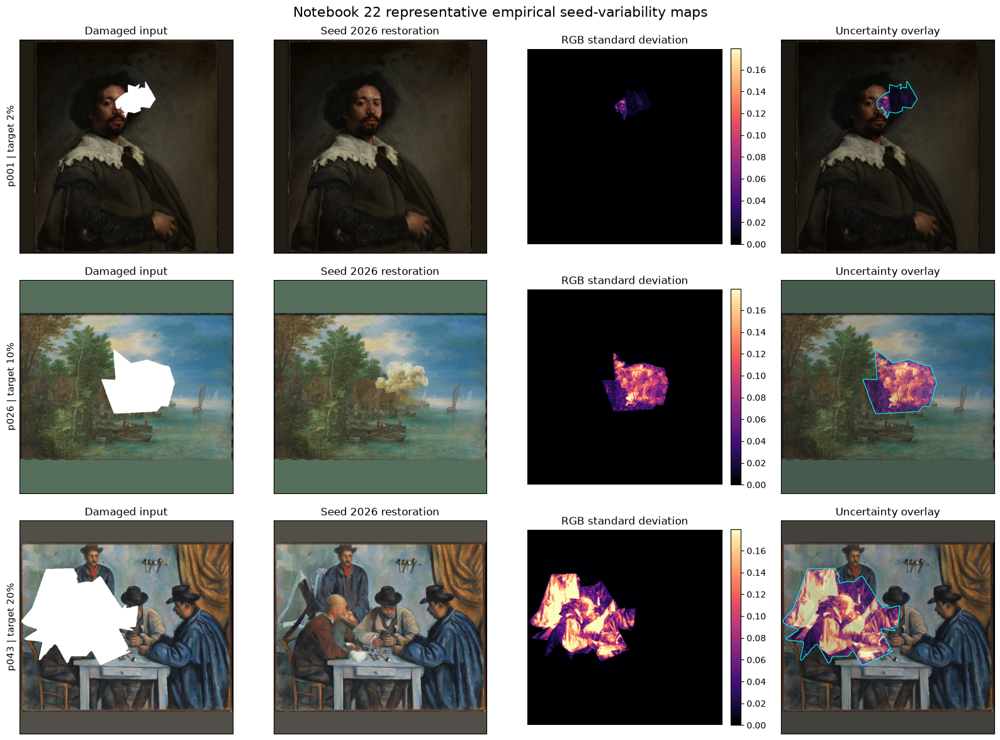

,uncertainty_group_id,map_mean,metric_mean,mean_matches,map_p95,metric_p95,p95_matches,map_maximum
0,ug_1679b8a8fb1f9ccb5e,0.003602,0.003602,True,0.000000,0.000000,True,0.257007
1,ug_16c0c4220b137a0017,0.006625,0.006625,True,0.016741,0.016741,True,0.264335
2,ug_17f88d692de4c06d02,0.004011,0.004011,True,0.029321,0.029321,True,0.214530
3,ug_1de955f7e0f3d00cf0,0.016935,0.016935,True,0.177432,0.177432,True,0.280162
4,ug_222809607d0a0bbf88,0.003948,0.003948,True,0.016265,0.016265,True,0.317624
5,ug_222ea90d2214292971,0.007861,0.007861,True,0.052215,0.052215,True,0.339715
6,ug_283bb9e3ea21ef6818,0.013863,0.013863,True,0.156818,0.156818,True,0.285844
7,ug_31e6c87078e7612ccc,0.004069,0.004069,True,0.000000,0.000000,True,0.323711
8,ug_448e3638091eefc3e9,0.008236,0.008236,True,0.066677,0.066677,True,0.313413
9,ug_4ebf9bafe49cea4347,0.002100,0.002100,True,0.000000,0.000000,True,0.237869


Representative maps rendered: 3
Shared display ceiling: 0.179747
Rendered heatmaps are notebook-only QA views.


In [24]:
# ---------------------------------------------------------------------------
# Render representative uncertainty maps without saving
# ---------------------------------------------------------------------------

representative_group_rows = (
    uncertainty_population_df.loc[
        uncertainty_population_df[
            "case_id"
        ].astype(str).isin(
            representative_case_ids
        )
        & uncertainty_population_df[
            "seed"
        ].astype(int).eq(2026)
    ]
    .sort_values(
        [
            "target_damage_fraction",
            "painting_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

if len(representative_group_rows) != 3:
    raise ValueError(
        "Expected three representative seed-2026 "
        "group rows."
    )

map_display_ceiling = float(
    np.percentile(
        np.concatenate(
            [
                array.ravel()
                for array in (
                    raw_uncertainty_maps.values()
                )
            ]
        ),
        99,
    )
)

map_display_ceiling = max(
    map_display_ceiling,
    1e-6,
)

figure, axes = plt.subplots(
    nrows=3,
    ncols=4,
    figsize=(16, 12),
    squeeze=False,
)

for row_index, row in (
    representative_group_rows.iterrows()
):
    input_path = (
        PROJECT_ROOT
        / Path(
            str(
                row[
                    "input_image_path"
                ]
            )
        )
    )

    mask_path = (
        PROJECT_ROOT
        / Path(
            str(
                row[
                    "mask_or_effect_path"
                ]
            )
        )
    )

    anchor_path = (
        PROJECT_ROOT
        / Path(
            str(
                row["restored_path"]
            )
        )
    )

    with Image.open(
        input_path
    ) as image:
        input_array = np.asarray(
            image.convert("RGB"),
            dtype=np.uint8,
        )

    with Image.open(
        mask_path
    ) as image:
        mask_array = np.asarray(
            image.convert("L"),
            dtype=np.uint8,
        )

    with Image.open(
        anchor_path
    ) as image:
        anchor_array = np.asarray(
            image.convert("RGB"),
            dtype=np.uint8,
        )

    group_id = str(
        row["uncertainty_group_id"]
    )

    uncertainty_map = (
        raw_uncertainty_maps[group_id]
    )

    axes[row_index, 0].imshow(
        input_array
    )
    axes[row_index, 0].set_title(
        "Damaged input"
    )

    axes[row_index, 1].imshow(
        anchor_array
    )
    axes[row_index, 1].set_title(
        "Seed 2026 restoration"
    )

    map_artist = axes[
        row_index,
        2,
    ].imshow(
        uncertainty_map,
        cmap="magma",
        vmin=0.0,
        vmax=map_display_ceiling,
    )

    axes[row_index, 2].set_title(
        "RGB standard deviation"
    )

    axes[row_index, 3].imshow(
        anchor_array
    )

    axes[row_index, 3].imshow(
        uncertainty_map,
        cmap="magma",
        vmin=0.0,
        vmax=map_display_ceiling,
        alpha=np.where(
            mask_array >= 128,
            0.72,
            0.18,
        ),
    )

    axes[row_index, 3].contour(
        mask_array >= 128,
        levels=[0.5],
        colors=["cyan"],
        linewidths=0.8,
    )

    axes[row_index, 3].set_title(
        "Uncertainty overlay"
    )

    axes[row_index, 0].set_ylabel(
        (
            f"{row['painting_id']} | "
            f"target "
            f"{float(row['target_damage_fraction']):.0%}"
        ),
        fontsize=11,
    )

    figure.colorbar(
        map_artist,
        ax=axes[row_index, 2],
        fraction=0.046,
        pad=0.04,
    )

    for axis in axes[row_index]:
        axis.set_xticks([])
        axis.set_yticks([])

figure.suptitle(
    "Notebook 22 representative empirical "
    "seed-variability maps",
    fontsize=16,
)

figure.tight_layout()
plt.show()

display(
    raw_map_consistency_df[
        [
            "uncertainty_group_id",
            "map_mean",
            "metric_mean",
            "mean_matches",
            "map_p95",
            "metric_p95",
            "p95_matches",
            "map_maximum",
        ]
    ].head(12)
)

print(
    "Representative maps rendered:",
    len(representative_group_rows),
)
print(
    "Shared display ceiling:",
    round(
        map_display_ceiling,
        6,
    ),
)
print(
    "Rendered heatmaps are notebook-only QA views."
)

In [25]:
# ---------------------------------------------------------------------------
# Idempotent Batch 5 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_5_image_space_uncertainty"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_5_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_5_image_space_uncertainty"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_5_check(
    "uncertainty_population",
    (
        "The empirical uncertainty population "
        "contains exactly 140 candidates in 35 groups."
    ),
    {
        "candidates": 140,
        "groups": 35,
    },
    {
        "candidates": len(
            uncertainty_population_df
        ),
        "groups": int(
            uncertainty_population_df[
                "uncertainty_group_id"
            ].nunique()
        ),
    },
    (
        len(uncertainty_population_df) == 140
        and uncertainty_population_df[
            "uncertainty_group_id"
        ].nunique() == 35
    ),
)

add_batch_5_check(
    "uncertainty_pair_plan",
    (
        "The population contains exactly 210 unique "
        "unordered seed pairs."
    ),
    210,
    len(uncertainty_pair_plan_df),
    (
        len(uncertainty_pair_plan_df) == 210
        and not uncertainty_pair_plan_df.duplicated(
            [
                "uncertainty_group_id",
                "candidate_id_a",
                "candidate_id_b",
            ]
        ).any()
    ),
)

add_batch_5_check(
    "image_metric_rows",
    (
        "Image-space uncertainty contains exactly "
        "2,940 rows."
    ),
    2940,
    len(image_space_metrics_df),
    len(image_space_metrics_df) == 2940,
)

add_batch_5_check(
    "image_metric_family_counts",
    (
        "Pixel variability and pairwise RGB families "
        "have their exact contracted row counts."
    ),
    {
        "pixel_pairwise": 2520,
        "pixel_variability": 420,
    },
    image_metric_family_counts,
    (
        image_metric_family_counts
        == {
            "pixel_pairwise": 2520,
            "pixel_variability": 420,
        }
    ),
)

add_batch_5_check(
    "image_rows_per_group",
    (
        "Every uncertainty group contributes exactly "
        "84 image-space metric rows."
    ),
    [84],
    sorted(
        image_rows_per_group
        .astype(int)
        .unique()
        .tolist()
    ),
    (
        len(image_rows_per_group) == 35
        and image_rows_per_group.eq(84).all()
    ),
)

observed_pixel_regions = sorted(
    image_space_metrics_df[
        "region_id"
    ].astype(str).unique().tolist()
)

add_batch_5_check(
    "pixel_region_coverage",
    (
        "Image-space metrics cover all six approved "
        "pixel regions."
    ),
    sorted(
        REGION_POLICY[
            "pixel_regions"
        ]
    ),
    observed_pixel_regions,
    (
        observed_pixel_regions
        == sorted(
            REGION_POLICY[
                "pixel_regions"
            ]
        )
    ),
)

pair_metric_rows = (
    image_space_metrics_df.loc[
        image_space_metrics_df[
            "observation_level"
        ].astype(str).eq(
            "candidate_pair"
        )
    ]
)

add_batch_5_check(
    "pair_ordering",
    (
        "Every pairwise row retains strict "
        "seed_a < seed_b ordering."
    ),
    True,
    bool(
        (
            pair_metric_rows[
                "seed_a"
            ].astype(int)
            < pair_metric_rows[
                "seed_b"
            ].astype(int)
        ).all()
    ),
    bool(
        (
            pair_metric_rows[
                "seed_a"
            ].astype(int)
            < pair_metric_rows[
                "seed_b"
            ].astype(int)
        ).all()
    ),
)

add_batch_5_check(
    "finite_image_metrics",
    (
        "Every image-space metric value is numeric "
        "and finite."
    ),
    True,
    bool(
        image_metric_values.notna().all()
        and np.isfinite(
            image_metric_values
        ).all()
    ),
    bool(
        image_metric_values.notna().all()
        and np.isfinite(
            image_metric_values
        ).all()
    ),
)

add_batch_5_check(
    "unique_image_metric_ids",
    (
        "Every image-space uncertainty row has a "
        "unique deterministic metric identifier."
    ),
    0,
    int(
        image_space_metrics_df[
            "uncertainty_metric_id"
        ].duplicated().sum()
    ),
    not image_space_metrics_df[
        "uncertainty_metric_id"
    ].duplicated().any(),
)

add_batch_5_check(
    "image_metric_statuses",
    (
        "All image-space metric rows completed "
        "successfully."
    ),
    ["ok"],
    sorted(
        image_space_metrics_df[
            "status"
        ].astype(str).unique().tolist()
    ),
    image_space_metrics_df[
        "status"
    ].astype(str).eq("ok").all(),
)

add_batch_5_check(
    "combined_index_absent",
    (
        "No image-space row is labelled as a "
        "combined uncertainty index."
    ),
    0,
    int(
        image_space_metrics_df[
            "is_combined_index"
        ].astype(bool).sum()
    ),
    not image_space_metrics_df[
        "is_combined_index"
    ].astype(bool).any(),
)

checkpoint_frame = pd.read_csv(
    image_checkpoint_resolved,
    low_memory=False,
)

add_batch_5_check(
    "image_checkpoint",
    (
        "The resumable image-space checkpoint "
        "contains all 2,940 metric rows."
    ),
    2940,
    len(checkpoint_frame),
    (
        len(checkpoint_frame) == 2940
        and checkpoint_frame[
            "uncertainty_metric_id"
        ].is_unique
    ),
)

add_batch_5_check(
    "raw_map_contract",
    (
        "Exactly 35 finite, nonnegative 768×768 "
        "raw uncertainty maps were computed."
    ),
    35,
    {
        "maps": len(
            raw_map_validation_df
        ),
        "valid_shapes": int(
            (
                raw_map_validation_df[
                    "height"
                ].eq(768)
                & raw_map_validation_df[
                    "width"
                ].eq(768)
            ).sum()
        ),
        "finite_maps": int(
            raw_map_validation_df[
                "finite"
            ].sum()
        ),
        "nonnegative_maps": int(
            raw_map_validation_df[
                "nonnegative"
            ].sum()
        ),
    },
    raw_maps_valid_before_write,
)

add_batch_5_check(
    "map_scalar_consistency",
    (
        "Every raw map reproduces its full-image "
        "mean and p95 scalar summaries."
    ),
    35,
    {
        "mean_matches": int(
            raw_map_consistency_df[
                "mean_matches"
            ].sum()
        ),
        "p95_matches": int(
            raw_map_consistency_df[
                "p95_matches"
            ].sum()
        ),
    },
    (
        len(
            raw_map_consistency_df
        ) == 35
        and raw_map_consistency_df[
            "mean_matches"
        ].all()
        and raw_map_consistency_df[
            "p95_matches"
        ].all()
    ),
)

add_batch_5_check(
    "canonical_map_bundle",
    (
        "The canonical NPZ bundle reloads with all "
        "35 maps unchanged."
    ),
    35,
    len(reloaded_map_keys),
    (
        OUTPUTS[
            "uncertainty_maps"
        ].is_file()
        and reloaded_maps_valid
    ),
)

premature_batch_5_outputs = [
    OUTPUTS[key]
    for key in (
        "candidates",
        "damage_size_uncertainty",
        "summary_figure",
        "map_manifest",
        "run_manifest",
        "artifacts",
        "validation",
    )
    if OUTPUTS[key].exists()
]

add_batch_5_check(
    "deferred_outputs",
    (
        "Candidate tables, combined metrics, figures, "
        "overlay manifests, run manifests, artifacts, "
        "and validation files remain deferred."
    ),
    0,
    len(
        premature_batch_5_outputs
    ),
    not premature_batch_5_outputs,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in (
            premature_batch_5_outputs
        )
    ],
)

batch_5_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_5_image_space_uncertainty"
        )
    ]
    .reset_index(drop=True)
)

display(
    image_space_metrics_df.head(15)
)

display(raw_map_validation_df)
display(batch_5_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 5 summary")
print("---------------------------")
print(
    "Batch 5 checks:",
    len(batch_5_validation_df),
)
print(
    "Cumulative checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "Image-space metric rows:",
    len(image_space_metrics_df),
)
print(
    "Raw uncertainty maps:",
    len(raw_uncertainty_maps),
)
print(
    "Canonical map bundle:",
    to_repo_relative(
        OUTPUTS[
            "uncertainty_maps"
        ],
        PROJECT_ROOT,
    ),
)
print(
    "Image-space runtime seconds:",
    round(
        image_uncertainty_seconds,
        3,
    ),
)
print("Batch 5 completion gate passed.")

,uncertainty_metric_id,uncertainty_group_id,observation_level,case_id,model_id,painting_id,category,style_or_period,dataset_id,dataset_scope,...,region_id,summary_statistic,value,value_unit,metric_version,region_policy_version,evidence_role,is_combined_index,status,issue
0,um_c6d90bd0c0129fd5eaa7,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,boundary_ring,pair_value,0.035555,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
1,um_77509de7858ec31b3e3a,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,boundary_ring,pair_value,0.023840,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
2,um_da9945889a5308625444,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,boundary_ring,pair_value,0.026540,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
3,um_b3f134956d62c24fac5b,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,boundary_ring,pair_value,0.031867,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
4,um_f7b297ef8e5e541f1c6f,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,boundary_ring,pair_value,0.036118,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
5,um_c7eec5fbf931f1da70b7,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,boundary_ring,pair_value,0.028402,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
6,um_6ee0b8d9deedd272aa49,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.007516,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
7,um_edcdb18969463d0f7e42,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.004946,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
8,um_208db119a424fce721c6,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.005467,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
9,um_e637bd9780733ab8cb59,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.006975,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,Fals

,uncertainty_group_id,height,width,finite,nonnegative,map_mean,map_p95,map_maximum
0,ug_1679b8a8fb1f9ccb5e,768,768,True,True,0.003602,0.000000,0.257007
1,ug_16c0c4220b137a0017,768,768,True,True,0.006625,0.016741,0.264335
2,ug_17f88d692de4c06d02,768,768,True,True,0.004011,0.029321,0.214530
3,ug_1de955f7e0f3d00cf0,768,768,True,True,0.016935,0.177432,0.280162
4,ug_222809607d0a0bbf88,768,768,True,True,0.003948,0.016265,0.317624
5,ug_222ea90d2214292971,768,768,True,True,0.007861,0.052215,0.339715
6,ug_283bb9e3ea21ef6818,768,768,True,True,0.013863,0.156818,0.285844
7,ug_31e6c87078e7612ccc,768,768,True,True,0.004069,0.000000,0.323711
8,ug_448e3638091eefc3e9,768,768,True,True,0.008236,0.066677,0.313413
9,ug_4ebf9bafe49cea4347,768,768,True,True,0.002100,0.000000,0.237869


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_5_image_space_uncertainty,uncertainty_population,The empirical uncertainty population contains ...,blocking,"{""candidates"": 140, ""groups"": 35}","{""candidates"": 140, ""groups"": 35}",True,
1,batch_5_image_space_uncertainty,uncertainty_pair_plan,The population contains exactly 210 unique uno...,blocking,210,210,True,
2,batch_5_image_space_uncertainty,image_metric_rows,"Image-space uncertainty contains exactly 2,940...",blocking,2940,2940,True,
3,batch_5_image_space_uncertainty,image_metric_family_counts,Pixel variability and pairwise RGB families ha...,blocking,"{""pixel_pairwise"": 2520, ""pixel_variability"": ...","{""pixel_pairwise"": 2520, ""pixel_variability"": ...",True,
4,batch_5_image_space_uncertainty,image_rows_per_group,Every uncertainty group contributes exactly 84...,blocking,[84],[84],True,
5,batch_5_image_space_uncertainty,pixel_region_coverage,Image-space metrics cover all six approved pix...,blocking,"[""boundary_ring"", ""content_region"", ""full_imag...","[""boundary_ring"", ""content_region"", ""full_imag...",True,
6,batch_5_image_space_uncertainty,pair_ordering,Every pairwise row retains strict seed_a < see...,blocking,True,True,True,
7,batch_5_image_space_uncertainty,finite_image_metrics,Every image-space metric value is numeric and ...,blocking,True,True,True,
8,batch_5_image_space_uncertainty,unique_image_metric_ids,Every image-space uncertainty row has a unique...,blocking,0,0,True,
9,batch_5_image_space_uncertainty,image_metric_statuses,All image-space metric rows completed successf...,blocking,"[""ok""]","[""ok""]",True,


Notebook 22 Batch 5 summary
---------------------------
Batch 5 checks: 16
Cumulative checks: 138
Blocking failures: 0
Image-space metric rows: 2940
Raw uncertainty maps: 35
Canonical map bundle: outputs/22_damage_size_diffusion_uncertainty_extension/data/uncertainty_maps.npz
Image-space runtime seconds: 80.269
Batch 5 completion gate passed.


## Batch 6 — Pairwise LPIPS uncertainty

This batch computes learned perceptual variability between all unordered seed pairs in the 35 damage-size uncertainty groups.

It uses the validated Notebook 14 LPIPS contract:

- AlexNet LPIPS network;
- LPIPS version `0.1`;
- deterministic execution;
- aspect-preserving bicubic resizing;
- maximum side length of 256 pixels;
- minimum side length of 64 pixels;
- neutral padding;
- `content_region` and `mask_bbox_crop` only.

Each four-seed group contains six unique unordered pairs. Each pair is evaluated over two approved contiguous regions, producing:

- 12 LPIPS rows per group;
- 420 pairwise LPIPS rows in total;
- 210 unique candidate pairs.

The Stable Diffusion pipeline is released before loading LPIPS because restoration inference is complete. Computation is resumable through a Notebook 22-owned checkpoint.

LPIPS remains a general-purpose learned perceptual-distance proxy. It is not a conservation-specific judgment or calibrated confidence measure.

In [26]:
import gc

from restoration_eval.diffusion_uncertainty import (
    run_lpips_pairwise_uncertainty,
)

from restoration_eval.metrics_lpips import (
    load_configured_lpips_model,
    load_lpips_config,
    validate_lpips_runtime_dependencies,
)


# ---------------------------------------------------------------------------
# Release the completed restoration pipeline
# ---------------------------------------------------------------------------

stable_diffusion_pipeline_released = False

if (
    "stable_diffusion_pipeline" in globals()
    and stable_diffusion_pipeline is not None
):
    stable_diffusion_pipeline = None
    stable_diffusion_pipeline_released = True

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


# ---------------------------------------------------------------------------
# Load the approved Notebook 14 LPIPS contract
# ---------------------------------------------------------------------------

LPIPS_CONFIG_DOCUMENT = (
    load_lpips_config(
        INPUTS["lpips_config_path"]
    )
)

lpips_dependency_df = (
    validate_lpips_runtime_dependencies()
)

missing_lpips_dependencies = (
    lpips_dependency_df.loc[
        ~lpips_dependency_df[
            "installed"
        ].astype(bool),
        "dependency",
    ]
    .astype(str)
    .tolist()
)

if missing_lpips_dependencies:
    raise RuntimeError(
        "Missing LPIPS dependencies: "
        f"{missing_lpips_dependencies}"
    )

lpips_model_reused = bool(
    "LPIPS_MODEL" in globals()
    and LPIPS_MODEL is not None
    and "LPIPS_DEVICE" in globals()
    and "LPIPS_PROVENANCE" in globals()
)

if lpips_model_reused:
    print(
        "Reusing the configured LPIPS model "
        "already present in memory."
    )
    lpips_model_load_seconds = 0.0
else:
    lpips_model_load_started = (
        time.perf_counter()
    )

    (
        LPIPS_MODEL,
        LPIPS_DEVICE,
        LPIPS_PROVENANCE,
    ) = load_configured_lpips_model(
        LPIPS_CONFIG_DOCUMENT
    )

    lpips_model_load_seconds = (
        time.perf_counter()
        - lpips_model_load_started
    )

lpips_runtime_df = pd.DataFrame(
    [
        {
            "runtime_field": key,
            "observed_value": value,
        }
        for key, value in {
            **LPIPS_PROVENANCE,
            "model_reused": (
                lpips_model_reused
            ),
            "model_load_seconds": float(
                lpips_model_load_seconds
            ),
            "stable_diffusion_pipeline_released": (
                stable_diffusion_pipeline_released
            ),
        }.items()
    ]
)

display(lpips_dependency_df)
display(lpips_runtime_df)

print("LPIPS runtime is ready.")
print(
    "Network:",
    LPIPS_PROVENANCE["network"],
)
print(
    "LPIPS version:",
    LPIPS_PROVENANCE[
        "lpips_version"
    ],
)
print(
    "Device:",
    LPIPS_DEVICE,
)
print(
    "Model load seconds:",
    round(
        lpips_model_load_seconds,
        3,
    ),
)
print(
    "Stable Diffusion pipeline released:",
    stable_diffusion_pipeline_released,
)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\lpips\weights\v0.1\alex.pth


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\lpips\lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(mode

,dependency,version,installed,status
0,lpips,0.1.4,True,passed
1,torch,2.5.1+cu121,True,passed
2,torchvision,0.20.1+cu121,True,passed
3,numpy,1.26.4,True,passed
4,pandas,2.3.3,True,passed
5,Pillow,9.5.0,True,passed


,runtime_field,observed_value
0,network,alex
1,lpips_version,0.1
2,lpips_package_version,0.1.4
3,torch_version,2.5.1+cu121
4,device,cuda
5,cuda_device_name,NVIDIA GeForce RTX 3060 Laptop GPU
6,python_version,3.12.6
7,model_reused,False
8,model_load_seconds,1.508469
9,stable_diffusion_pipeline_released,True


LPIPS runtime is ready.
Network: alex
LPIPS version: 0.1
Device: cuda
Model load seconds: 1.508
Stable Diffusion pipeline released: True


In [27]:
# ---------------------------------------------------------------------------
# Compute all pairwise LPIPS uncertainty rows
# ---------------------------------------------------------------------------

lpips_uncertainty_started = (
    time.perf_counter()
)

lpips_uncertainty_metrics_df = (
    run_lpips_pairwise_uncertainty(
        uncertainty_population_df,
        model=LPIPS_MODEL,
        device=LPIPS_DEVICE,
        project_root=PROJECT_ROOT,
        config=uncertainty_adapter_config,
        lpips_config=LPIPS_CONFIG_DOCUMENT,
        checkpoint_path=(
            WORK_PATHS[
                "lpips_metrics_checkpoint"
            ]
        ),
        progress_callback=print,
    )
)

lpips_uncertainty_seconds = (
    time.perf_counter()
    - lpips_uncertainty_started
)

lpips_checkpoint_resolved = (
    find_latest_checkpoint(
        WORK_PATHS[
            "lpips_metrics_checkpoint"
        ]
    )
)

lpips_metric_values = pd.to_numeric(
    lpips_uncertainty_metrics_df[
        "value"
    ],
    errors="coerce",
)

lpips_rows_per_group = (
    lpips_uncertainty_metrics_df
    .groupby(
        "uncertainty_group_id"
    )
    .size()
)

lpips_region_counts = {
    str(key): int(value)
    for key, value in (
        lpips_uncertainty_metrics_df[
            "region_id"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

lpips_unique_pair_count = (
    lpips_uncertainty_metrics_df[
        [
            "uncertainty_group_id",
            "candidate_id_a",
            "candidate_id_b",
        ]
    ]
    .drop_duplicates()
    .shape[0]
)

print(
    "Pairwise LPIPS uncertainty completed."
)
print(
    "Rows:",
    len(lpips_uncertainty_metrics_df),
)
print(
    "Groups:",
    lpips_uncertainty_metrics_df[
        "uncertainty_group_id"
    ].nunique(),
)
print(
    "Unique candidate pairs:",
    lpips_unique_pair_count,
)
print(
    "Rows per group:",
    sorted(
        lpips_rows_per_group
        .astype(int)
        .unique()
        .tolist()
    ),
)
print(
    "Region counts:",
    lpips_region_counts,
)
print(
    "Finite values:",
    bool(
        lpips_metric_values.notna().all()
        and np.isfinite(
            lpips_metric_values
        ).all()
    ),
)
print(
    "Runtime seconds:",
    round(
        lpips_uncertainty_seconds,
        3,
    ),
)
print(
    "Checkpoint:",
    (
        to_repo_relative(
            lpips_checkpoint_resolved,
            PROJECT_ROOT,
        )
        if lpips_checkpoint_resolved
        else "missing"
    ),
)

Pairwise LPIPS uncertainty: 0 complete groups resumed from no checkpoint; 35 pending
Pairwise LPIPS uncertainty: 10/35 groups; latest=ug_4ebf9bafe49cea4347
Pairwise LPIPS uncertainty: 20/35 groups; latest=ug_96adfa3d71215844ad
Pairwise LPIPS uncertainty: 30/35 groups; latest=ug_e46a1242ea0ee84ef5
Pairwise LPIPS uncertainty: 35/35 groups; latest=ug_fcb62f6f8dafd3eb4f
Pairwise LPIPS uncertainty completed.
Rows: 420
Groups: 35
Unique candidate pairs: 210
Rows per group: [12]
Region counts: {'content_region': 210, 'mask_bbox_crop': 210}
Finite values: True
Runtime seconds: 25.194
Checkpoint: outputs/22_damage_size_diffusion_uncertainty_extension/work/lpips_uncertainty_checkpoint.csv


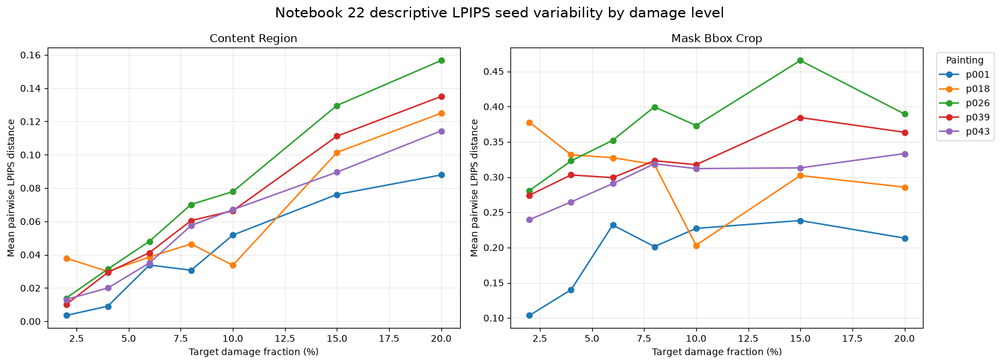

,target_damage_fraction,region_id,pair_count,mean_lpips,median_lpips,minimum_lpips,maximum_lpips,p95_lpips
0,0.02,content_region,30,0.015715,0.012217,0.002316,0.049565,0.044621
1,0.04,content_region,30,0.023930,0.026126,0.007037,0.039758,0.038637
2,0.06,content_region,30,0.039344,0.041001,0.017109,0.062835,0.051565
3,0.08,content_region,30,0.053067,0.054534,0.026865,0.084084,0.079687
4,0.10,content_region,30,0.059329,0.058081,0.025641,0.102731,0.086790
5,0.15,content_region,30,0.101577,0.099177,0.047771,0.148479,0.139787
6,0.20,content_region,30,0.123763,0.124067,0.064318,0.178505,0.170153
7,0.02,mask_bbox_crop,30,0.255135,0.264788,0.091011,0.449266,0.437522
8,0.04,mask_bbox_crop,30,0.272393,0.286607,0.125078,0.364078,0.359253
9,0.06,mask_bbox_crop,30,0.300188,0.310916,0.185870,0.373442,0.365585


,painting_id,target_damage_fraction,region_id,mean_pairwise_lpips,median_pairwise_lpips,pair_count
0,p001,0.02,content_region,0.003516,0.003329,6
1,p001,0.02,mask_bbox_crop,0.103540,0.100465,6
2,p001,0.04,content_region,0.009091,0.009357,6
3,p001,0.04,mask_bbox_crop,0.140042,0.138687,6
4,p001,0.06,content_region,0.033794,0.035867,6
5,p001,0.06,mask_bbox_crop,0.231826,0.220159,6
6,p001,0.08,content_region,0.030678,0.030669,6
7,p001,0.08,mask_bbox_crop,0.201267,0.202756,6
8,p001,0.10,content_region,0.051770,0.052842,6
9,p001,0.10,mask_bbox_crop,0.227068,0.229073,6


LPIPS descriptive QA assembled.
Damage levels: [0.02, 0.04, 0.06, 0.08, 0.1, 0.15, 0.2]
Painting trajectories: 5
The trajectories are descriptive repeated observations, not independent category effects.


In [28]:
# ---------------------------------------------------------------------------
# Damage-level and trajectory summaries
# ---------------------------------------------------------------------------

lpips_damage_summary_df = (
    lpips_uncertainty_metrics_df
    .groupby(
        [
            "target_damage_fraction",
            "region_id",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        pair_count=("value", "size"),
        mean_lpips=("value", "mean"),
        median_lpips=("value", "median"),
        minimum_lpips=("value", "min"),
        maximum_lpips=("value", "max"),
        p95_lpips=(
            "value",
            lambda values: float(
                np.percentile(
                    values,
                    95,
                )
            ),
        ),
    )
    .sort_values(
        [
            "region_id",
            "target_damage_fraction",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

lpips_trajectory_df = (
    lpips_uncertainty_metrics_df
    .groupby(
        [
            "painting_id",
            "target_damage_fraction",
            "region_id",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        mean_pairwise_lpips=(
            "value",
            "mean",
        ),
        median_pairwise_lpips=(
            "value",
            "median",
        ),
        pair_count=("value", "size"),
    )
)

figure, axes = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(15, 5.5),
    squeeze=False,
)

for axis_index, region_id in enumerate(
    [
        "content_region",
        "mask_bbox_crop",
    ]
):
    axis = axes[0, axis_index]

    region_trajectory_df = (
        lpips_trajectory_df.loc[
            lpips_trajectory_df[
                "region_id"
            ].astype(str).eq(region_id)
        ]
    )

    for painting_id, painting_frame in (
        region_trajectory_df.groupby(
            "painting_id",
            sort=True,
        )
    ):
        painting_frame = (
            painting_frame.sort_values(
                "target_damage_fraction",
                kind="stable",
            )
        )

        axis.plot(
            painting_frame[
                "target_damage_fraction"
            ].astype(float)
            * 100.0,
            painting_frame[
                "mean_pairwise_lpips"
            ].astype(float),
            marker="o",
            linewidth=1.6,
            label=str(painting_id),
        )

    axis.set_title(
        region_id.replace("_", " ").title()
    )
    axis.set_xlabel(
        "Target damage fraction (%)"
    )
    axis.set_ylabel(
        "Mean pairwise LPIPS distance"
    )
    axis.grid(
        alpha=0.25
    )

axes[0, 1].legend(
    title="Painting",
    bbox_to_anchor=(1.02, 1.0),
    loc="upper left",
)

figure.suptitle(
    "Notebook 22 descriptive LPIPS "
    "seed variability by damage level",
    fontsize=15,
)

figure.tight_layout()
plt.show()

display(lpips_damage_summary_df)
display(lpips_trajectory_df.head(20))

print("LPIPS descriptive QA assembled.")
print(
    "Damage levels:",
    sorted(
        lpips_damage_summary_df[
            "target_damage_fraction"
        ].astype(float).unique().tolist()
    ),
)
print(
    "Painting trajectories:",
    lpips_trajectory_df[
        "painting_id"
    ].nunique(),
)
print(
    "The trajectories are descriptive repeated "
    "observations, not independent category effects."
)

In [29]:
# ---------------------------------------------------------------------------
# Idempotent Batch 6 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_6_lpips_uncertainty"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_6_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_6_lpips_uncertainty"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_6_check(
    "lpips_dependencies",
    (
        "Every required LPIPS runtime dependency "
        "is installed."
    ),
    [],
    missing_lpips_dependencies,
    not missing_lpips_dependencies,
)

add_batch_6_check(
    "lpips_model_contract",
    (
        "The configured AlexNet LPIPS 0.1 model "
        "was loaded."
    ),
    {
        "network": "alex",
        "lpips_version": "0.1",
    },
    {
        "network": (
            LPIPS_PROVENANCE["network"]
        ),
        "lpips_version": (
            LPIPS_PROVENANCE[
                "lpips_version"
            ]
        ),
        "device": LPIPS_DEVICE,
    },
    (
        LPIPS_PROVENANCE[
            "network"
        ] == "alex"
        and LPIPS_PROVENANCE[
            "lpips_version"
        ] == "0.1"
    ),
)

expected_lpips_device = (
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

add_batch_6_check(
    "lpips_device",
    (
        "LPIPS uses CUDA when available and otherwise "
        "the explicitly permitted CPU fallback."
    ),
    expected_lpips_device,
    LPIPS_DEVICE,
    (
        LPIPS_DEVICE
        == expected_lpips_device
    ),
)

add_batch_6_check(
    "lpips_row_count",
    (
        "Pairwise LPIPS uncertainty contains exactly "
        "420 rows."
    ),
    420,
    len(lpips_uncertainty_metrics_df),
    (
        len(
            lpips_uncertainty_metrics_df
        ) == 420
    ),
)

add_batch_6_check(
    "lpips_group_coverage",
    (
        "LPIPS covers all 35 uncertainty groups."
    ),
    35,
    int(
        lpips_uncertainty_metrics_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    (
        lpips_uncertainty_metrics_df[
            "uncertainty_group_id"
        ].nunique() == 35
    ),
)

add_batch_6_check(
    "lpips_rows_per_group",
    (
        "Every four-seed group contributes twelve "
        "LPIPS rows."
    ),
    [12],
    sorted(
        lpips_rows_per_group
        .astype(int)
        .unique()
        .tolist()
    ),
    (
        len(lpips_rows_per_group) == 35
        and lpips_rows_per_group.eq(12).all()
    ),
)

add_batch_6_check(
    "lpips_unique_pair_count",
    (
        "LPIPS contains exactly 210 unique unordered "
        "candidate pairs."
    ),
    210,
    lpips_unique_pair_count,
    (
        lpips_unique_pair_count == 210
    ),
)

add_batch_6_check(
    "lpips_region_counts",
    (
        "Both approved contiguous LPIPS regions "
        "contain all 210 candidate pairs."
    ),
    {
        "content_region": 210,
        "mask_bbox_crop": 210,
    },
    lpips_region_counts,
    (
        lpips_region_counts
        == {
            "content_region": 210,
            "mask_bbox_crop": 210,
        }
    ),
)

add_batch_6_check(
    "lpips_metric_identity",
    (
        "Every row uses the declared perceptual "
        "pairwise metric identity."
    ),
    {
        "metric_family": [
            "perceptual_pairwise"
        ],
        "metric_name": [
            "pairwise_lpips_distance"
        ],
        "observation_level": [
            "candidate_pair"
        ],
    },
    {
        "metric_family": sorted(
            lpips_uncertainty_metrics_df[
                "metric_family"
            ].astype(str).unique().tolist()
        ),
        "metric_name": sorted(
            lpips_uncertainty_metrics_df[
                "metric_name"
            ].astype(str).unique().tolist()
        ),
        "observation_level": sorted(
            lpips_uncertainty_metrics_df[
                "observation_level"
            ].astype(str).unique().tolist()
        ),
    },
    (
        lpips_uncertainty_metrics_df[
            "metric_family"
        ].astype(str).eq(
            "perceptual_pairwise"
        ).all()
        and lpips_uncertainty_metrics_df[
            "metric_name"
        ].astype(str).eq(
            "pairwise_lpips_distance"
        ).all()
        and lpips_uncertainty_metrics_df[
            "observation_level"
        ].astype(str).eq(
            "candidate_pair"
        ).all()
    ),
)

pair_order_valid = bool(
    (
        lpips_uncertainty_metrics_df[
            "seed_a"
        ].astype(int)
        < lpips_uncertainty_metrics_df[
            "seed_b"
        ].astype(int)
    ).all()
)

add_batch_6_check(
    "lpips_pair_order",
    (
        "Every LPIPS pair retains strict "
        "seed_a < seed_b ordering."
    ),
    True,
    pair_order_valid,
    pair_order_valid,
)

finite_lpips_values = bool(
    lpips_metric_values.notna().all()
    and np.isfinite(
        lpips_metric_values
    ).all()
)

add_batch_6_check(
    "finite_lpips_values",
    (
        "Every LPIPS distance is numeric and finite."
    ),
    True,
    finite_lpips_values,
    finite_lpips_values,
)

materially_negative_lpips_count = int(
    (
        lpips_metric_values
        < -1e-6
    ).sum()
)

add_batch_6_check(
    "lpips_distance_range",
    (
        "No LPIPS distance is materially negative."
    ),
    0,
    materially_negative_lpips_count,
    materially_negative_lpips_count == 0,
)

add_batch_6_check(
    "unique_lpips_metric_ids",
    (
        "Every LPIPS row has a unique deterministic "
        "metric identifier."
    ),
    0,
    int(
        lpips_uncertainty_metrics_df[
            "uncertainty_metric_id"
        ].duplicated().sum()
    ),
    not lpips_uncertainty_metrics_df[
        "uncertainty_metric_id"
    ].duplicated().any(),
)

add_batch_6_check(
    "lpips_statuses",
    (
        "All LPIPS metric rows completed successfully."
    ),
    ["ok"],
    sorted(
        lpips_uncertainty_metrics_df[
            "status"
        ].astype(str).unique().tolist()
    ),
    lpips_uncertainty_metrics_df[
        "status"
    ].astype(str).eq("ok").all(),
)

add_batch_6_check(
    "lpips_combined_index_absent",
    (
        "LPIPS remains a separate transparent "
        "component rather than a combined index."
    ),
    0,
    int(
        lpips_uncertainty_metrics_df[
            "is_combined_index"
        ].astype(bool).sum()
    ),
    not lpips_uncertainty_metrics_df[
        "is_combined_index"
    ].astype(bool).any(),
)

lpips_checkpoint_frame = pd.read_csv(
    lpips_checkpoint_resolved,
    low_memory=False,
)

add_batch_6_check(
    "lpips_checkpoint",
    (
        "The resumable LPIPS checkpoint contains "
        "all 420 unique metric rows."
    ),
    420,
    {
        "rows": len(
            lpips_checkpoint_frame
        ),
        "unique_metric_ids": int(
            lpips_checkpoint_frame[
                "uncertainty_metric_id"
            ].nunique()
        ),
    },
    (
        len(lpips_checkpoint_frame) == 420
        and lpips_checkpoint_frame[
            "uncertainty_metric_id"
        ].is_unique
    ),
)

premature_batch_6_outputs = [
    OUTPUTS[key]
    for key in (
        "candidates",
        "damage_size_uncertainty",
        "summary_figure",
        "map_manifest",
        "run_manifest",
        "artifacts",
        "validation",
    )
    if OUTPUTS[key].exists()
]

add_batch_6_check(
    "deferred_outputs",
    (
        "The canonical candidate table, combined "
        "metrics, figures, manifests, and validation "
        "table remain deferred."
    ),
    0,
    len(
        premature_batch_6_outputs
    ),
    not premature_batch_6_outputs,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in (
            premature_batch_6_outputs
        )
    ],
)

batch_6_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_6_lpips_uncertainty"
        )
    ]
    .reset_index(drop=True)
)

display(
    lpips_uncertainty_metrics_df.head(15)
)
display(lpips_damage_summary_df)
display(batch_6_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 6 summary")
print("---------------------------")
print(
    "Batch 6 checks:",
    len(batch_6_validation_df),
)
print(
    "Cumulative checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "LPIPS metric rows:",
    len(lpips_uncertainty_metrics_df),
)
print(
    "Unique candidate pairs:",
    lpips_unique_pair_count,
)
print(
    "LPIPS runtime seconds:",
    round(
        lpips_uncertainty_seconds,
        3,
    ),
)
print(
    "Canonical LPIPS table written separately:",
    False,
)
print("Batch 6 completion gate passed.")

,uncertainty_metric_id,uncertainty_group_id,observation_level,case_id,model_id,painting_id,category,style_or_period,dataset_id,dataset_scope,...,region_id,summary_statistic,value,value_unit,metric_version,region_policy_version,evidence_role,is_combined_index,status,issue
0,um_64b72a5a3d233369f779,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.048014,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
1,um_d7800f6eae67aa86f34c,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.029539,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
2,um_44ad1afe080c15ff118e,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.030087,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
3,um_f6661601c5dff2ffbee2,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.037967,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
4,um_56d1a5433dd8a79994a8,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.039004,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
5,um_b443b67f7f109ccdce14,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.025606,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
6,um_187faada7a20ac0fa513,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,mask_bbox_crop,pair_value,0.331044,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
7,um_1e138d9b0b1febfc3b18,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,mask_bbox_crop,pair_value,0.265027,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
8,um_cfb27cabe33509bc170f,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,mask_bbox_crop,pair_value,0.263682,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
9,um_1600962c1227b3cbefee,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,mask_bbox_crop,pair_value,0.304026,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,


,target_damage_fraction,region_id,pair_count,mean_lpips,median_lpips,minimum_lpips,maximum_lpips,p95_lpips
0,0.02,content_region,30,0.015715,0.012217,0.002316,0.049565,0.044621
1,0.04,content_region,30,0.023930,0.026126,0.007037,0.039758,0.038637
2,0.06,content_region,30,0.039344,0.041001,0.017109,0.062835,0.051565
3,0.08,content_region,30,0.053067,0.054534,0.026865,0.084084,0.079687
4,0.10,content_region,30,0.059329,0.058081,0.025641,0.102731,0.086790
5,0.15,content_region,30,0.101577,0.099177,0.047771,0.148479,0.139787
6,0.20,content_region,30,0.123763,0.124067,0.064318,0.178505,0.170153
7,0.02,mask_bbox_crop,30,0.255135,0.264788,0.091011,0.449266,0.437522
8,0.04,mask_bbox_crop,30,0.272393,0.286607,0.125078,0.364078,0.359253
9,0.06,mask_bbox_crop,30,0.300188,0.310916,0.185870,0.373442,0.365585


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_6_lpips_uncertainty,lpips_dependencies,Every required LPIPS runtime dependency is ins...,blocking,[],[],True,
1,batch_6_lpips_uncertainty,lpips_model_contract,The configured AlexNet LPIPS 0.1 model was loa...,blocking,"{""lpips_version"": ""0.1"", ""network"": ""alex""}","{""device"": ""cuda"", ""lpips_version"": ""0.1"", ""ne...",True,
2,batch_6_lpips_uncertainty,lpips_device,LPIPS uses CUDA when available and otherwise t...,blocking,cuda,cuda,True,
3,batch_6_lpips_uncertainty,lpips_row_count,Pairwise LPIPS uncertainty contains exactly 42...,blocking,420,420,True,
4,batch_6_lpips_uncertainty,lpips_group_coverage,LPIPS covers all 35 uncertainty groups.,blocking,35,35,True,
5,batch_6_lpips_uncertainty,lpips_rows_per_group,Every four-seed group contributes twelve LPIPS...,blocking,[12],[12],True,
6,batch_6_lpips_uncertainty,lpips_unique_pair_count,LPIPS contains exactly 210 unique unordered ca...,blocking,210,210,True,
7,batch_6_lpips_uncertainty,lpips_region_counts,Both approved contiguous LPIPS regions contain...,blocking,"{""content_region"": 210, ""mask_bbox_crop"": 210}","{""content_region"": 210, ""mask_bbox_crop"": 210}",True,
8,batch_6_lpips_uncertainty,lpips_metric_identity,Every row uses the declared perceptual pairwis...,blocking,"{""metric_family"": [""perceptual_pairwise""], ""me...","{""metric_family"": [""perceptual_pairwise""], ""me...",True,
9,batch_6_lpips_uncertainty,lpips_pair_order,Every LPIPS pair retains strict seed_a < seed_...,blocking,True,True,True,


Notebook 22 Batch 6 summary
---------------------------
Batch 6 checks: 17
Cumulative checks: 155
Blocking failures: 0
LPIPS metric rows: 420
Unique candidate pairs: 210
LPIPS runtime seconds: 25.194
Canonical LPIPS table written separately: False
Batch 6 completion gate passed.


## Batch 7 — CLIP and DINOv2 feature-space uncertainty

This batch measures feature-space variation between the four Stable Diffusion seeds in every damage-size uncertainty group.

It reuses the validated Notebook 15 embeddings for the 35 frozen seed-2026 anchors and extracts only the missing Notebook 22 embeddings for seeds `2027`, `2028`, and `2029`.

The exact extraction scope is:

- 105 Notebook 22 candidates;
- two approved contiguous regions per candidate;
- two feature encoders;
- 210 new CLIP embeddings;
- 210 new DINOv2 embeddings;
- 420 new embeddings in total.

After combining these with the 140 reusable frozen-anchor embedding records, the batch computes:

- 420 pairwise CLIP cosine-distance rows;
- 420 pairwise DINOv2 cosine-distance rows;
- 840 feature-space uncertainty rows in total.

Extraction is resumable through one Notebook 22-owned manifest checkpoint and two fixed-shape NumPy matrix checkpoints. Progress is printed after every ten newly processed embeddings.

CLIP and DINOv2 distances remain separate diagnostic proxies. They are not combined into a confidence, quality, or trustworthiness score.

In [30]:
from copy import deepcopy
import gc

from restoration_eval.damage_size_diffusion_uncertainty import (
    build_extension_restored_embedding_plan,
    combine_anchor_and_extension_embeddings,
)

from restoration_eval.diffusion_uncertainty import (
    compute_feature_pairwise_uncertainty,
)

from restoration_eval.metrics_feature_similarity import (
    FEATURE_EMBEDDING_MANIFEST_COLUMNS,
    FEATURE_MODEL_IDS,
    configure_feature_determinism,
    encode_feature_batch,
    extract_feature_model_embeddings,
    feature_model_specs,
    load_configured_feature_models,
    load_feature_embedding_bundle,
    load_feature_similarity_config,
    load_latest_embedding_checkpoint,
    resolve_feature_device,
    validate_feature_similarity_runtime_dependencies,
    write_embedding_checkpoint_manifest,
)


# ---------------------------------------------------------------------------
# Release LPIPS before loading the feature encoders
# ---------------------------------------------------------------------------

lpips_model_released = False

if (
    "LPIPS_MODEL" in globals()
    and LPIPS_MODEL is not None
):
    LPIPS_MODEL = None
    lpips_model_released = True

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


# ---------------------------------------------------------------------------
# Load the frozen Notebook 15 feature contract
# ---------------------------------------------------------------------------

feature_similarity_config = (
    load_feature_similarity_config(
        INPUTS[
            "feature_similarity_config_path"
        ]
    )
)

# Use the frozen model and preprocessing contract while making
# Notebook 22 progress visible every ten embeddings.

feature_execution_config = deepcopy(
    feature_similarity_config
)

feature_execution_settings = (
    feature_execution_config[
        "feature_similarity"
    ]["execution"]
)

feature_execution_settings[
    "progress_interval_embeddings"
] = 10

feature_execution_settings[
    "checkpoint_interval_embeddings"
] = int(
    EXECUTION_POLICY[
        "checkpoint_interval_embeddings"
    ]
)

feature_execution_settings[
    "initial_batch_size"
] = 10

feature_execution_settings[
    "oom_batch_size_backoff"
] = [
    8,
    4,
    1,
]

feature_dependency_df = (
    validate_feature_similarity_runtime_dependencies()
)

missing_feature_dependencies = (
    feature_dependency_df.loc[
        ~feature_dependency_df[
            "installed"
        ].astype(bool),
        "component",
    ]
    .astype(str)
    .tolist()
)

if missing_feature_dependencies:
    raise RuntimeError(
        "Missing feature dependencies: "
        f"{missing_feature_dependencies}"
    )

feature_specs = feature_model_specs(
    feature_execution_config
)

feature_model_ids = tuple(
    feature_specs.keys()
)

if feature_model_ids != tuple(
    FEATURE_MODEL_IDS
):
    raise ValueError(
        "The feature-model order does not match "
        "the approved Notebook 15 contract."
    )


# ---------------------------------------------------------------------------
# Build the extension-only embedding plan
# ---------------------------------------------------------------------------

extension_embedding_plan_df = (
    build_extension_restored_embedding_plan(
        complete_uncertainty_worklist_df,
        project_root=PROJECT_ROOT,
        feature_config=(
            feature_execution_config
        ),
    )
)

extension_embedding_plan_counts = {
    str(key): int(value)
    for key, value in (
        extension_embedding_plan_df[
            "feature_model_id"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

extension_embedding_source_files_exist = (
    extension_embedding_plan_df[
        "source_path"
    ].map(
        lambda value: (
            PROJECT_ROOT / str(value)
        ).is_file()
    )
)

plan_key_columns = [
    "representative_candidate_id",
    "region_id",
    "feature_model_id",
]

extension_array_index_valid = all(
    np.array_equal(
        group.sort_values(
            "array_index",
            kind="stable",
        )["array_index"].astype(int).to_numpy(),
        np.arange(len(group)),
    )
    for _, group in (
        extension_embedding_plan_df.groupby(
            "feature_model_id",
            sort=True,
        )
    )
)

feature_plan_preflight_df = pd.DataFrame(
    [
        {
            "preflight_item": "embedding_rows",
            "expected": 420,
            "observed": len(
                extension_embedding_plan_df
            ),
            "passed": (
                len(
                    extension_embedding_plan_df
                ) == 420
            ),
        },
        {
            "preflight_item": "rows_per_model",
            "expected": {
                "clip_vit_b32": 210,
                "dinov2_vits14": 210,
            },
            "observed": (
                extension_embedding_plan_counts
            ),
            "passed": (
                extension_embedding_plan_counts
                == {
                    "clip_vit_b32": 210,
                    "dinov2_vits14": 210,
                }
            ),
        },
        {
            "preflight_item": "restored_role_only",
            "expected": ["restored"],
            "observed": sorted(
                extension_embedding_plan_df[
                    "image_role"
                ].astype(str).unique().tolist()
            ),
            "passed": (
                extension_embedding_plan_df[
                    "image_role"
                ].astype(str).eq(
                    "restored"
                ).all()
            ),
        },
        {
            "preflight_item": "unique_embedding_ids",
            "expected": 0,
            "observed": int(
                extension_embedding_plan_df[
                    "embedding_id"
                ].duplicated().sum()
            ),
            "passed": (
                extension_embedding_plan_df[
                    "embedding_id"
                ].is_unique
            ),
        },
        {
            "preflight_item": "unique_candidate_region_model_keys",
            "expected": 0,
            "observed": int(
                extension_embedding_plan_df[
                    plan_key_columns
                ].duplicated().sum()
            ),
            "passed": (
                not extension_embedding_plan_df[
                    plan_key_columns
                ].duplicated().any()
            ),
        },
        {
            "preflight_item": "contiguous_array_indices",
            "expected": True,
            "observed": bool(
                extension_array_index_valid
            ),
            "passed": bool(
                extension_array_index_valid
            ),
        },
        {
            "preflight_item": "source_files_exist",
            "expected": 420,
            "observed": int(
                extension_embedding_source_files_exist.sum()
            ),
            "passed": (
                extension_embedding_source_files_exist.all()
            ),
        },
    ]
)

display(feature_dependency_df)
display(feature_plan_preflight_df)
display(
    extension_embedding_plan_df[
        [
            "embedding_id",
            "feature_model_id",
            "image_role",
            "representative_candidate_id",
            "region_id",
            "array_name",
            "array_index",
            "source_path",
        ]
    ].head(15)
)

if not feature_plan_preflight_df[
    "passed"
].all():
    raise RuntimeError(
        "Notebook 22 feature embedding "
        "preflight failed."
    )


# ---------------------------------------------------------------------------
# Load the pinned encoders
# ---------------------------------------------------------------------------

feature_device = resolve_feature_device(
    feature_execution_config
)

configure_feature_determinism(
    feature_execution_config
)

if feature_device == "cuda":
    torch.cuda.empty_cache()
    torch.cuda.reset_peak_memory_stats()

feature_model_load_started = (
    time.perf_counter()
)

feature_model_bundles = (
    load_configured_feature_models(
        feature_execution_config,
        device=feature_device,
        local_only=True,
    )
)

feature_model_load_seconds = (
    time.perf_counter()
    - feature_model_load_started
)

loaded_feature_model_records = []

for feature_model_id in feature_model_ids:
    bundle = feature_model_bundles[
        feature_model_id
    ]

    spec = bundle["spec"]
    model = bundle["model"]

    try:
        observed_device = str(
            next(model.parameters()).device
        )
    except StopIteration:
        observed_device = "no_parameters"

    loaded_feature_model_records.append(
        {
            "feature_model_id": (
                feature_model_id
            ),
            "model_name": spec.model_name,
            "model_revision": (
                spec.model_revision
            ),
            "model_checksum": (
                spec.model_checksum
            ),
            "embedding_dimension": (
                spec.embedding_dimension
            ),
            "preprocessing_id": (
                spec.preprocessing_id
            ),
            "configured_device": (
                feature_device
            ),
            "observed_device": (
                observed_device
            ),
            "training_mode": bool(
                model.training
            ),
        }
    )

loaded_feature_models_df = pd.DataFrame(
    loaded_feature_model_records
)

display(loaded_feature_models_df)

print("Notebook 22 feature runtime is ready.")
print(
    "Extension embedding rows:",
    len(extension_embedding_plan_df),
)
print(
    "Rows per model:",
    extension_embedding_plan_counts,
)
print(
    "Resolved device:",
    feature_device,
)
print(
    "Feature-model load seconds:",
    round(
        feature_model_load_seconds,
        3,
    ),
)
print(
    "LPIPS model released:",
    lpips_model_released,
)
print("Canonical feature metrics written: No")

,component,module,version,required,installed,passed
0,torch,torch,2.5.1+cu121,True,True,True
1,torchvision,torchvision,0.20.1+cu121,True,True,True
2,transformers,transformers,4.48.3,True,True,True
3,PyYAML,yaml,6.0.3,True,True,True
4,Pillow,PIL,9.5.0,True,True,True


,preflight_item,expected,observed,passed
0,embedding_rows,420,420,True
1,rows_per_model,"{'clip_vit_b32': 210, 'dinov2_vits14': 210}","{'clip_vit_b32': 210, 'dinov2_vits14': 210}",True
2,restored_role_only,[restored],[restored],True
3,unique_embedding_ids,0,0,True
4,unique_candidate_region_model_keys,0,0,True
5,contiguous_array_indices,True,True,True
6,source_files_exist,420,420,True


,embedding_id,feature_model_id,image_role,representative_candidate_id,region_id,array_name,array_index,source_path
0,fe__002d46fd262751ce27e6,clip_vit_b32,restored,sd15dsu__eabfb567a4493435,content_region,clip_extension_embeddings,0,outputs/22_damage_size_diffusion_uncertainty_e...
1,fe__fd9959cd3766895ce5f4,clip_vit_b32,restored,sd15dsu__eabfb567a4493435,mask_bbox_crop,clip_extension_embeddings,1,outputs/22_damage_size_diffusion_uncertainty_e...
2,fe__0fbdaf44fa481c08de11,clip_vit_b32,restored,sd15dsu__5ec27a6538f033db,content_region,clip_extension_embeddings,2,outputs/22_damage_size_diffusion_uncertainty_e...
3,fe__446ddf376408a198234a,clip_vit_b32,restored,sd15dsu__5ec27a6538f033db,mask_bbox_crop,clip_extension_embeddings,3,outputs/22_damage_size_diffusion_uncertainty_e...
4,fe__2c7ca57e5284b3cfed52,clip_vit_b32,restored,sd15dsu__084cb2679e5e71c6,content_region,clip_extension_embeddings,4,outputs/22_damage_size_diffusion_uncertainty_e...
5,fe__d96ebf3705f8cb9f6dcd,clip_vit_b32,restored,sd15dsu__084cb2679e5e71c6,mask_bbox_crop,clip_extension_embeddings,5,outputs/22_damage_size_diffusion_uncertainty_e...
6,fe__08e3e2c585fa1e888c85,clip_vit_b32,restored,sd15dsu__9ef12db2a653c462,content_region,clip_extension_embeddings,6,outputs/22_damage_size_diffusion_uncertainty_e...
7,fe__4b97e08226466e84842a,clip_vit_b32,restored,sd15dsu__9ef12db2a653c462,mask_bbox_crop,clip_extension_embeddings,7,outputs/22_damage_size_diffusion_uncertainty_e...
8,fe__258c90848da2da56a66f,clip_vit_b32,restored,sd15dsu__031683fe97c570d6,content_region,clip_extension_embeddings,8,outputs/22_damage_size_diffusion_uncertainty_e...
9,fe__8267cc7423faa9d1b2ae,clip_vit_b32,restored,sd15dsu__031683fe97c570d6,mask_bbox_crop,clip_extension_embeddings,9,outputs/22_damage_size_diffusion_uncertainty_e...


C:\Users\rahul\.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
C:\Users\rahul\.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
C:\Users\rahul\.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


,feature_model_id,model_name,model_revision,model_checksum,embedding_dimension,preprocessing_id,configured_device,observed_device,training_mode
0,clip_vit_b32,openai/clip-vit-base-patch32,3d74acf9a28c67741b2f4f2ea7635f0aaf6f0268,a63082132ba4f97a80bea76823f544493bffa8082296d6...,512,clip_processor_native_224.v1,cuda,cuda:0,False
1,dinov2_vits14,dinov2_vits14,facebookresearch_dinov2_main_published_checkpoint,b938bf1bc15cd2ec0feacfe3a1bb553fe8ea9ca46a7e1d...,384,dinov2_official_eval_224.v1,cuda,cuda:0,False


Notebook 22 feature runtime is ready.
Extension embedding rows: 420
Rows per model: {'clip_vit_b32': 210, 'dinov2_vits14': 210}
Resolved device: cuda
Feature-model load seconds: 5.716
LPIPS model released: True
Canonical feature metrics written: No


In [31]:
# ---------------------------------------------------------------------------
# Notebook-owned matrix paths
# ---------------------------------------------------------------------------

FEATURE_MATRIX_PATHS = {
    "clip_vit_b32": (
        FEATURE_MATRIX_ROOT
        / "clip_extension_embeddings.npy"
    ),
    "dinov2_vits14": (
        FEATURE_MATRIX_ROOT
        / "dinov2_extension_embeddings.npy"
    ),
}

for matrix_path in (
    FEATURE_MATRIX_PATHS.values()
):
    require_notebook_output_path(
        matrix_path,
        NOTEBOOK_STEM,
        PROJECT_ROOT,
    )


# ---------------------------------------------------------------------------
# Combined resumable manifest writer
# ---------------------------------------------------------------------------

feature_model_order = {
    feature_model_id: position
    for position, feature_model_id
    in enumerate(feature_model_ids)
}

feature_checkpoint_write_events = []


def write_combined_feature_checkpoint(
    current_model_id,
    current_manifest_df,
):
    (
        latest_checkpoint_df,
        latest_checkpoint_path,
    ) = load_latest_embedding_checkpoint(
        WORK_PATHS[
            "feature_manifest_checkpoint"
        ]
    )

    retained_checkpoint_df = (
        latest_checkpoint_df.loc[
            ~latest_checkpoint_df[
                "feature_model_id"
            ].astype(str).eq(
                current_model_id
            )
        ]
    )

    combined_checkpoint_df = pd.concat(
        [
            retained_checkpoint_df,
            current_manifest_df,
        ],
        ignore_index=True,
    )

    combined_checkpoint_df = (
        combined_checkpoint_df.loc[
            combined_checkpoint_df[
                "feature_model_id"
            ].astype(str).isin(
                feature_model_ids
            )
        ]
        .copy()
    )

    combined_checkpoint_df[
        "_model_order"
    ] = combined_checkpoint_df[
        "feature_model_id"
    ].map(feature_model_order)

    combined_checkpoint_df = (
        combined_checkpoint_df
        .sort_values(
            [
                "_model_order",
                "array_index",
            ],
            kind="stable",
        )
        .drop(columns="_model_order")
        .reset_index(drop=True)
    )

    write_result = (
        write_embedding_checkpoint_manifest(
            combined_checkpoint_df,
            WORK_PATHS[
                "feature_manifest_checkpoint"
            ],
        )
    )

    feature_checkpoint_write_events.append(
        {
            "feature_model_id": (
                current_model_id
            ),
            "manifest_rows": len(
                combined_checkpoint_df
            ),
            "completed_rows": int(
                combined_checkpoint_df[
                    "status"
                ].astype(str).eq(
                    "ok"
                ).sum()
            ),
            "write_status": (
                write_result["status"]
            ),
            "written_path": str(
                write_result["path"]
            ),
            "attempts": int(
                write_result["attempts"]
            ),
            "previous_checkpoint_path": (
                str(
                    latest_checkpoint_path
                )
                if latest_checkpoint_path
                is not None
                else ""
            ),
        }
    )

    if write_result[
        "status"
    ] != "canonical":
        print(
            "Feature checkpoint recovery file used:",
            write_result["path"],
        )

    return write_result


# ---------------------------------------------------------------------------
# Extract only the 420 Notebook 22 embeddings
# ---------------------------------------------------------------------------

if feature_device == "cuda":
    torch.cuda.empty_cache()
    torch.cuda.reset_peak_memory_stats()

feature_extraction_started = (
    time.perf_counter()
)

extension_embedding_results = {}
extension_embedding_manifest_frames = []
extension_embedding_arrays = {}
extension_embedding_summary_records = []

for feature_model_id in feature_model_ids:
    bundle = feature_model_bundles[
        feature_model_id
    ]

    spec = bundle["spec"]

    (
        prior_feature_manifest_df,
        prior_feature_manifest_path,
    ) = load_latest_embedding_checkpoint(
        WORK_PATHS[
            "feature_manifest_checkpoint"
        ]
    )

    def encode_batch(
        images,
        model_bundle=bundle,
    ):
        return encode_feature_batch(
            images,
            model_bundle,
            device=feature_device,
        )

    def checkpoint_callback(
        manifest_df,
        matrix,
        current_model_id=feature_model_id,
    ):
        return write_combined_feature_checkpoint(
            current_model_id,
            manifest_df,
        )

    print()
    print(
        "Starting or resuming feature model:",
        feature_model_id,
    )
    print(
        "Prior checkpoint:",
        (
            to_repo_relative(
                prior_feature_manifest_path,
                PROJECT_ROOT,
            )
            if prior_feature_manifest_path
            is not None
            else "none"
        ),
    )
    print(
        "Matrix path:",
        to_repo_relative(
            FEATURE_MATRIX_PATHS[
                feature_model_id
            ],
            PROJECT_ROOT,
        ),
    )

    result = extract_feature_model_embeddings(
        extension_embedding_plan_df,
        spec=spec,
        encode_batch=encode_batch,
        project_root=PROJECT_ROOT,
        config=feature_execution_config,
        matrix_path=(
            FEATURE_MATRIX_PATHS[
                feature_model_id
            ]
        ),
        prior_manifest=(
            prior_feature_manifest_df
        ),
        progress_callback=print,
        checkpoint_callback=(
            checkpoint_callback
        ),
    )

    extension_embedding_results[
        feature_model_id
    ] = result

    extension_embedding_manifest_frames.append(
        result.manifest
    )

    result_array_names = (
        result.manifest[
            "array_name"
        ].astype(str).unique().tolist()
    )

    if len(result_array_names) != 1:
        raise ValueError(
            f"{feature_model_id} produced unexpected "
            f"array names: {result_array_names}"
        )

    extension_array_name = (
        result_array_names[0]
    )

    extension_embedding_arrays[
        extension_array_name
    ] = result.matrix

    extension_embedding_summary_records.append(
        dict(result.summary)
    )

    print(
        "Completed model:",
        feature_model_id,
    )
    print(
        "Completed embeddings:",
        result.summary[
            "completed_count"
        ],
    )
    print(
        "Reused embeddings:",
        result.summary[
            "reused_count"
        ],
    )
    print(
        "New embeddings:",
        result.summary[
            "new_count"
        ],
    )
    print(
        "Runtime seconds:",
        round(
            result.summary[
                "runtime_seconds"
            ],
            3,
        ),
    )


# ---------------------------------------------------------------------------
# Normalize and persist the final work checkpoint
# ---------------------------------------------------------------------------

extension_embedding_manifest_df = (
    pd.concat(
        extension_embedding_manifest_frames,
        ignore_index=True,
    )
)

extension_embedding_manifest_df[
    "_model_order"
] = (
    extension_embedding_manifest_df[
        "feature_model_id"
    ].map(feature_model_order)
)

extension_embedding_manifest_df = (
    extension_embedding_manifest_df
    .sort_values(
        [
            "_model_order",
            "array_index",
        ],
        kind="stable",
    )
    .drop(columns="_model_order")
    .reset_index(drop=True)
)

final_feature_checkpoint_write = (
    write_embedding_checkpoint_manifest(
        extension_embedding_manifest_df,
        WORK_PATHS[
            "feature_manifest_checkpoint"
        ],
    )
)

extension_embedding_summary_df = (
    pd.DataFrame(
        extension_embedding_summary_records
    )
)

feature_extraction_seconds = (
    time.perf_counter()
    - feature_extraction_started
)

feature_checkpoint_manifest_df, (
    feature_checkpoint_resolved
) = load_latest_embedding_checkpoint(
    WORK_PATHS[
        "feature_manifest_checkpoint"
    ]
)

if feature_device == "cuda":
    feature_extraction_gpu_peak_bytes = int(
        torch.cuda.max_memory_allocated()
    )
else:
    feature_extraction_gpu_peak_bytes = 0

display(extension_embedding_summary_df)
display(
    pd.DataFrame(
        feature_checkpoint_write_events
    )
)

print("Extension feature extraction completed.")
print(
    "Manifest rows:",
    len(extension_embedding_manifest_df),
)
print(
    "Completed rows:",
    int(
        extension_embedding_manifest_df[
            "status"
        ].astype(str).eq("ok").sum()
    ),
)
print(
    "Error rows:",
    int(
        extension_embedding_manifest_df[
            "status"
        ].astype(str).eq(
            "error"
        ).sum()
    ),
)
print(
    "Extraction seconds:",
    round(
        feature_extraction_seconds,
        3,
    ),
)
print(
    "CUDA peak memory bytes:",
    feature_extraction_gpu_peak_bytes,
)
print(
    "Final checkpoint status:",
    final_feature_checkpoint_write[
        "status"
    ],
)
print(
    "Final checkpoint:",
    to_repo_relative(
        feature_checkpoint_resolved,
        PROJECT_ROOT,
    ),
)


Starting or resuming feature model: clip_vit_b32
Prior checkpoint: none
Matrix path: outputs/22_damage_size_diffusion_uncertainty_extension/work/feature_embedding_matrices/clip_extension_embeddings.npy


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 10/210 embeddings (4.8%), elapsed=1.7s, throughput=5.84 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__8267cc7423faa9d1b2ae


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 20/210 embeddings (9.5%), elapsed=2.6s, throughput=7.79 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__1eb551f67ae77a656734


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 30/210 embeddings (14.3%), elapsed=3.3s, throughput=9.22 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__048957ff154a7561afa0


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 40/210 embeddings (19.0%), elapsed=4.1s, throughput=9.75 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__1bec12328603a086eaa5


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 50/210 embeddings (23.8%), elapsed=4.8s, throughput=10.44 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__563fce9bdb71585ea5b9


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 60/210 embeddings (28.6%), elapsed=5.4s, throughput=11.07 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__968ac1d27aa8d4a28b1e


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 70/210 embeddings (33.3%), elapsed=6.0s, throughput=11.63 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__c1675f77f022d1261dd1


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 80/210 embeddings (38.1%), elapsed=6.8s, throughput=11.79 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__769bc7b06020e85cbac8


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 90/210 embeddings (42.9%), elapsed=7.4s, throughput=12.11 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__be3f15365a9704dd4115


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 100/210 embeddings (47.6%), elapsed=8.1s, throughput=12.36 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__6f6eb862e15361229b79


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 110/210 embeddings (52.4%), elapsed=8.8s, throughput=12.48 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__1e89a1242c17414eaec2


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 120/210 embeddings (57.1%), elapsed=9.5s, throughput=12.57 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__d400a49acb02d4fe5939


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 130/210 embeddings (61.9%), elapsed=10.2s, throughput=12.71 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__7bdaa954b691b6f109db


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 140/210 embeddings (66.7%), elapsed=10.9s, throughput=12.83 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__dc1139f35c9ff0c90849


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 150/210 embeddings (71.4%), elapsed=11.6s, throughput=12.95 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__ed2c7eb9789161a7df0a


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 160/210 embeddings (76.2%), elapsed=12.2s, throughput=13.10 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__927da4d284dffcf6d9e2


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 170/210 embeddings (81.0%), elapsed=12.8s, throughput=13.24 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__ecaabfd9f5910dda9d62


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 180/210 embeddings (85.7%), elapsed=13.6s, throughput=13.22 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__cacc22771de86587cd72


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 190/210 embeddings (90.5%), elapsed=14.4s, throughput=13.17 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__00d4c53c053a5e426155


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 200/210 embeddings (95.2%), elapsed=15.4s, throughput=12.97 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__65e09581b643054b540f


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 210/210 embeddings (100.0%), elapsed=16.2s, throughput=13.00 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__db07354c933901b339eb
Completed model: clip_vit_b32
Completed embeddings: 210
Reused embeddings: 0
New embeddings: 210
Runtime seconds: 16.157

Starting or resuming feature model: dinov2_vits14
Prior checkpoint: outputs/22_damage_size_diffusion_uncertainty_extension/work/feature_embedding_checkpoint.csv
Matrix path: outputs/22_damage_size_diffusion_uncertainty_extension/work/feature_embedding_matrices/dinov2_extension_embeddings.npy
dinov2_vits14: 10/210 embeddings (4.8%), elapsed=1.5s, throughput=6.82 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__0f846a4a84f2159fe997
dinov2_vits14: 20/210 embeddings (9.5%), elapsed=2.2s, throughput=9.22 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__928e7f1e6f36538e21c1
dinov2_vits14: 30/210 embeddings (14.3%), elapsed=2.9s, throughput=10.45 new embeddings/s, batch_size=10, r

,feature_model_id,embedding_count,completed_count,error_count,reused_count,new_count,final_batch_size,runtime_seconds
0,clip_vit_b32,210,210,0,0,210,10,16.156679
1,dinov2_vits14,210,210,0,0,210,10,14.124494


,feature_model_id,manifest_rows,completed_rows,write_status,written_path,attempts,previous_checkpoint_path
0,clip_vit_b32,210,100,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,
1,clip_vit_b32,210,200,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,D:\Masters\FH\Thesis\painting-restoration-eval...
2,clip_vit_b32,210,210,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,D:\Masters\FH\Thesis\painting-restoration-eval...
3,dinov2_vits14,420,310,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,D:\Masters\FH\Thesis\painting-restoration-eval...
4,dinov2_vits14,420,410,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,D:\Masters\FH\Thesis\painting-restoration-eval...
5,dinov2_vits14,420,420,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,D:\Masters\FH\Thesis\painting-restoration-eval...


Extension feature extraction completed.
Manifest rows: 420
Completed rows: 420
Error rows: 0
Extraction seconds: 30.422
CUDA peak memory bytes: 759474688
Final checkpoint status: canonical
Final checkpoint: outputs/22_damage_size_diffusion_uncertainty_extension/work/feature_embedding_checkpoint.csv


Feature uncertainty: 10/35 groups; latest=ug_4ebf9bafe49cea4347
Feature uncertainty: 20/35 groups; latest=ug_96adfa3d71215844ad
Feature uncertainty: 30/35 groups; latest=ug_e46a1242ea0ee84ef5
Feature uncertainty: 35/35 groups; latest=ug_fcb62f6f8dafd3eb4f


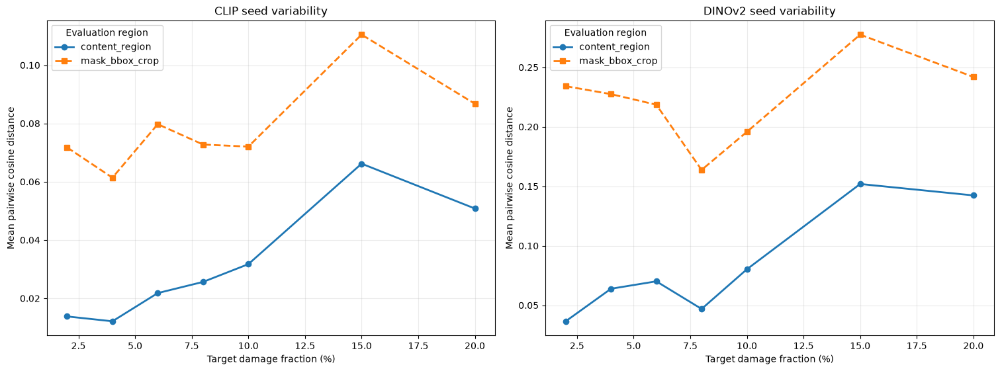

,target_damage_fraction,metric_name,region_id,pair_count,mean_distance,median_distance,minimum_distance,maximum_distance,p95_distance
0,0.02,pairwise_clip_cosine_distance,content_region,30,0.013779,0.004408,0.001308,0.084173,0.066171
1,0.04,pairwise_clip_cosine_distance,content_region,30,0.012117,0.008356,0.002128,0.039343,0.035049
2,0.06,pairwise_clip_cosine_distance,content_region,30,0.021793,0.011971,0.005419,0.060520,0.058116
3,0.08,pairwise_clip_cosine_distance,content_region,30,0.025623,0.021318,0.004004,0.072558,0.054712
4,0.10,pairwise_clip_cosine_distance,content_region,30,0.031716,0.023426,0.007238,0.076388,0.072433
5,0.15,pairwise_clip_cosine_distance,content_region,30,0.066191,0.046290,0.010072,0.166774,0.139833
6,0.20,pairwise_clip_cosine_distance,content_region,30,0.050809,0.032448,0.012403,0.157656,0.120930
7,0.02,pairwise_clip_cosine_distance,mask_bbox_crop,30,0.071758,0.052229,0.016171,0.215506,0.181038
8,0.04,pairwise_clip_cosine_distance,mask_bbox_crop,30,0.061386,0.052226,0.017983,0.141185,0.127364
9,0.06,pairwise_clip_cosine_distance,mask_bbox_crop,30,0.079742,0.070012,0.025337,0.171868,0.159483


,painting_id,target_damage_fraction,metric_name,region_id,mean_pairwise_distance,pair_count
0,p001,0.02,pairwise_clip_cosine_distance,content_region,0.003703,6
1,p001,0.02,pairwise_clip_cosine_distance,mask_bbox_crop,0.048708,6
2,p001,0.02,pairwise_dinov2_cosine_distance,content_region,0.001279,6
3,p001,0.02,pairwise_dinov2_cosine_distance,mask_bbox_crop,0.078626,6
4,p001,0.04,pairwise_clip_cosine_distance,content_region,0.012849,6
5,p001,0.04,pairwise_clip_cosine_distance,mask_bbox_crop,0.058662,6
6,p001,0.04,pairwise_dinov2_cosine_distance,content_region,0.004672,6
7,p001,0.04,pairwise_dinov2_cosine_distance,mask_bbox_crop,0.100160,6
8,p001,0.06,pairwise_clip_cosine_distance,content_region,0.043300,6
9,p001,0.06,pairwise_clip_cosine_distance,mask_bbox_crop,0.100801,6


Feature-space uncertainty completed.
Combined embedding rows: 560
Frozen-anchor embedding rows: 140
Extension embedding rows: 420
Feature uncertainty rows: 840
Unique candidate pairs: 210
Rows per group: [24]
Metric-name counts: {'pairwise_clip_cosine_distance': 420, 'pairwise_dinov2_cosine_distance': 420}
Region counts: {'content_region': 420, 'mask_bbox_crop': 420}
Finite values: True
Runtime seconds: 0.792


In [32]:
# ---------------------------------------------------------------------------
# Load frozen Notebook 15 embedding evidence
# ---------------------------------------------------------------------------

frozen_embedding_manifest_df = pd.read_csv(
    INPUTS[
        "feature_embedding_manifest_path"
    ],
    low_memory=False,
)

frozen_embedding_arrays = (
    load_feature_embedding_bundle(
        INPUTS[
            "feature_embeddings_path"
        ]
    )
)


# ---------------------------------------------------------------------------
# Combine frozen anchors with extension-owned embeddings
# ---------------------------------------------------------------------------

(
    combined_embedding_manifest_df,
    combined_embedding_arrays,
) = combine_anchor_and_extension_embeddings(
    uncertainty_population_df,
    frozen_embedding_manifest_df,
    frozen_embedding_arrays,
    [
        extension_embedding_manifest_df,
    ],
    extension_embedding_arrays,
    config=extension_config,
)

anchor_candidate_ids = set(
    uncertainty_population_df.loc[
        pd.to_numeric(
            uncertainty_population_df[
                "seed"
            ],
            errors="raise",
        ).eq(
            int(
                FROZEN_BOUNDARY[
                    "anchor_seed"
                ]
            )
        ),
        "candidate_id",
    ].astype(str)
)

combined_anchor_embedding_count = int(
    combined_embedding_manifest_df[
        "representative_candidate_id"
    ].astype(str).isin(
        anchor_candidate_ids
    ).sum()
)

combined_extension_embedding_count = (
    len(combined_embedding_manifest_df)
    - combined_anchor_embedding_count
)


# ---------------------------------------------------------------------------
# Compute all feature-space candidate-pair distances
# ---------------------------------------------------------------------------

feature_uncertainty_started = (
    time.perf_counter()
)

feature_uncertainty_metrics_df = (
    compute_feature_pairwise_uncertainty(
        uncertainty_population_df,
        embedding_manifest=(
            combined_embedding_manifest_df
        ),
        embedding_arrays=(
            combined_embedding_arrays
        ),
        config=uncertainty_adapter_config,
        progress_callback=print,
    )
)

feature_uncertainty_seconds = (
    time.perf_counter()
    - feature_uncertainty_started
)

feature_metric_values = pd.to_numeric(
    feature_uncertainty_metrics_df[
        "value"
    ],
    errors="coerce",
)

feature_rows_per_group = (
    feature_uncertainty_metrics_df
    .groupby(
        "uncertainty_group_id"
    )
    .size()
)

feature_metric_name_counts = {
    str(key): int(value)
    for key, value in (
        feature_uncertainty_metrics_df[
            "metric_name"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

feature_region_counts = {
    str(key): int(value)
    for key, value in (
        feature_uncertainty_metrics_df[
            "region_id"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

feature_unique_pair_count = (
    feature_uncertainty_metrics_df[
        [
            "uncertainty_group_id",
            "candidate_id_a",
            "candidate_id_b",
        ]
    ]
    .drop_duplicates()
    .shape[0]
)


# ---------------------------------------------------------------------------
# Descriptive damage-level QA
# ---------------------------------------------------------------------------

feature_damage_summary_df = (
    feature_uncertainty_metrics_df
    .groupby(
        [
            "target_damage_fraction",
            "metric_name",
            "region_id",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        pair_count=("value", "size"),
        mean_distance=("value", "mean"),
        median_distance=("value", "median"),
        minimum_distance=("value", "min"),
        maximum_distance=("value", "max"),
        p95_distance=(
            "value",
            lambda values: float(
                np.percentile(values, 95)
            ),
        ),
    )
    .sort_values(
        [
            "metric_name",
            "region_id",
            "target_damage_fraction",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

feature_trajectory_summary_df = (
    feature_uncertainty_metrics_df
    .groupby(
        [
            "painting_id",
            "target_damage_fraction",
            "metric_name",
            "region_id",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        mean_pairwise_distance=(
            "value",
            "mean",
        ),
        pair_count=("value", "size"),
    )
)

figure, axes = plt.subplots(
    1,
    2,
    figsize=(15, 5.5),
    constrained_layout=True,
)

metric_panel_order = [
    "pairwise_clip_cosine_distance",
    "pairwise_dinov2_cosine_distance",
]

metric_panel_titles = {
    "pairwise_clip_cosine_distance": (
        "CLIP seed variability"
    ),
    "pairwise_dinov2_cosine_distance": (
        "DINOv2 seed variability"
    ),
}

region_styles = {
    "content_region": {
        "marker": "o",
        "linestyle": "-",
    },
    "mask_bbox_crop": {
        "marker": "s",
        "linestyle": "--",
    },
}

for axis, metric_name in zip(
    axes,
    metric_panel_order,
):
    selected = (
        feature_damage_summary_df.loc[
            feature_damage_summary_df[
                "metric_name"
            ].eq(metric_name)
        ]
    )

    for region_id, style in (
        region_styles.items()
    ):
        line = (
            selected.loc[
                selected[
                    "region_id"
                ].eq(region_id)
            ]
            .sort_values(
                "target_damage_fraction"
            )
        )

        axis.plot(
            line[
                "target_damage_fraction"
            ] * 100.0,
            line["mean_distance"],
            label=region_id,
            linewidth=2.0,
            markersize=6,
            **style,
        )

    axis.set_title(
        metric_panel_titles[
            metric_name
        ]
    )
    axis.set_xlabel(
        "Target damage fraction (%)"
    )
    axis.set_ylabel(
        "Mean pairwise cosine distance"
    )
    axis.grid(
        alpha=0.25
    )
    axis.legend(
        title="Evaluation region"
    )

plt.show()

display(feature_damage_summary_df)
display(
    feature_trajectory_summary_df.head(20)
)

print("Feature-space uncertainty completed.")
print(
    "Combined embedding rows:",
    len(combined_embedding_manifest_df),
)
print(
    "Frozen-anchor embedding rows:",
    combined_anchor_embedding_count,
)
print(
    "Extension embedding rows:",
    combined_extension_embedding_count,
)
print(
    "Feature uncertainty rows:",
    len(feature_uncertainty_metrics_df),
)
print(
    "Unique candidate pairs:",
    feature_unique_pair_count,
)
print(
    "Rows per group:",
    sorted(
        feature_rows_per_group
        .astype(int)
        .unique()
        .tolist()
    ),
)
print(
    "Metric-name counts:",
    feature_metric_name_counts,
)
print(
    "Region counts:",
    feature_region_counts,
)
print(
    "Finite values:",
    bool(
        feature_metric_values.notna().all()
        and np.isfinite(
            feature_metric_values
        ).all()
    ),
)
print(
    "Runtime seconds:",
    round(
        feature_uncertainty_seconds,
        3,
    ),
)

In [33]:
# ---------------------------------------------------------------------------
# Idempotent Batch 7 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_7_feature_uncertainty"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_7_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_7_feature_uncertainty"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_7_check(
    "feature_dependencies",
    (
        "Every required feature-extraction "
        "dependency is installed."
    ),
    "all installed",
    {
        str(row.component): bool(
            row.installed
        )
        for row in (
            feature_dependency_df.itertuples(
                index=False
            )
        )
    },
    feature_dependency_df[
        "installed"
    ].astype(bool).all(),
)

add_batch_7_check(
    "feature_model_contract",
    (
        "The loaded feature models match the "
        "approved CLIP and DINOv2 contract."
    ),
    [
        "clip_vit_b32",
        "dinov2_vits14",
    ],
    loaded_feature_models_df[
        "feature_model_id"
    ].astype(str).tolist(),
    (
        loaded_feature_models_df[
            "feature_model_id"
        ].astype(str).tolist()
        == [
            "clip_vit_b32",
            "dinov2_vits14",
        ]
        and not loaded_feature_models_df[
            "training_mode"
        ].astype(bool).any()
    ),
)

add_batch_7_check(
    "extension_embedding_plan",
    (
        "The extension plan contains exactly 420 "
        "unique restored-image embeddings."
    ),
    420,
    len(extension_embedding_plan_df),
    (
        len(extension_embedding_plan_df) == 420
        and extension_embedding_plan_df[
            "embedding_id"
        ].is_unique
        and not extension_embedding_plan_df[
            plan_key_columns
        ].duplicated().any()
    ),
)

add_batch_7_check(
    "extension_embeddings_per_model",
    (
        "Each encoder contributes 210 extension "
        "embedding records."
    ),
    {
        "clip_vit_b32": 210,
        "dinov2_vits14": 210,
    },
    extension_embedding_plan_counts,
    (
        extension_embedding_plan_counts
        == {
            "clip_vit_b32": 210,
            "dinov2_vits14": 210,
        }
    ),
)

add_batch_7_check(
    "extension_embedding_statuses",
    (
        "All 420 extension embeddings completed "
        "successfully."
    ),
    {
        "ok": 420,
        "error": 0,
    },
    {
        "ok": int(
            extension_embedding_manifest_df[
                "status"
            ].astype(str).eq("ok").sum()
        ),
        "error": int(
            extension_embedding_manifest_df[
                "status"
            ].astype(str).eq(
                "error"
            ).sum()
        ),
    },
    (
        len(
            extension_embedding_manifest_df
        ) == 420
        and extension_embedding_manifest_df[
            "status"
        ].astype(str).eq("ok").all()
    ),
)

extension_matrix_shapes = {
    str(array_name): [
        int(value)
        for value in matrix.shape
    ]
    for array_name, matrix in (
        extension_embedding_arrays.items()
    )
}

expected_extension_matrix_shapes = {
    "clip_extension_embeddings": [
        210,
        512,
    ],
    "dinov2_extension_embeddings": [
        210,
        384,
    ],
}

add_batch_7_check(
    "extension_matrix_shapes",
    (
        "The two extension matrices have the exact "
        "row and embedding dimensions."
    ),
    expected_extension_matrix_shapes,
    extension_matrix_shapes,
    (
        extension_matrix_shapes
        == expected_extension_matrix_shapes
    ),
)

extension_arrays_finite = all(
    np.isfinite(
        np.asarray(matrix)
    ).all()
    for matrix in (
        extension_embedding_arrays.values()
    )
)

add_batch_7_check(
    "finite_extension_embeddings",
    (
        "Every extension embedding component is "
        "numeric and finite."
    ),
    True,
    bool(extension_arrays_finite),
    bool(extension_arrays_finite),
)

maximum_norm_error = max(
    float(
        np.max(
            np.abs(
                np.linalg.norm(
                    np.asarray(
                        matrix,
                        dtype=np.float32,
                    ),
                    axis=1,
                )
                - 1.0
            )
        )
    )
    for matrix in (
        extension_embedding_arrays.values()
    )
)

add_batch_7_check(
    "normalized_extension_embeddings",
    (
        "Every extension embedding remains "
        "L2-normalized within tolerance."
    ),
    "<= 0.0001",
    maximum_norm_error,
    maximum_norm_error <= 0.0001,
)

add_batch_7_check(
    "feature_checkpoint",
    (
        "The resumable feature manifest checkpoint "
        "contains all 420 unique completed rows."
    ),
    420,
    {
        "rows": len(
            feature_checkpoint_manifest_df
        ),
        "unique_embedding_ids": int(
            feature_checkpoint_manifest_df[
                "embedding_id"
            ].nunique()
        ),
        "completed_rows": int(
            feature_checkpoint_manifest_df[
                "status"
            ].astype(str).eq("ok").sum()
        ),
    },
    (
        feature_checkpoint_resolved
        is not None
        and len(
            feature_checkpoint_manifest_df
        ) == 420
        and feature_checkpoint_manifest_df[
            "embedding_id"
        ].is_unique
        and feature_checkpoint_manifest_df[
            "status"
        ].astype(str).eq("ok").all()
    ),
)

combined_embedding_key_columns = [
    "representative_candidate_id",
    "region_id",
    "feature_model_id",
]

add_batch_7_check(
    "combined_embedding_population",
    (
        "Frozen and extension evidence combine into "
        "560 unique candidate-region-model records."
    ),
    {
        "total": 560,
        "frozen_anchor": 140,
        "extension": 420,
    },
    {
        "total": len(
            combined_embedding_manifest_df
        ),
        "frozen_anchor": (
            combined_anchor_embedding_count
        ),
        "extension": (
            combined_extension_embedding_count
        ),
    },
    (
        len(
            combined_embedding_manifest_df
        ) == 560
        and combined_anchor_embedding_count
        == 140
        and combined_extension_embedding_count
        == 420
        and not combined_embedding_manifest_df[
            combined_embedding_key_columns
        ].duplicated().any()
    ),
)

add_batch_7_check(
    "feature_metric_row_count",
    (
        "Feature uncertainty contains exactly 840 "
        "candidate-pair metric rows."
    ),
    840,
    len(feature_uncertainty_metrics_df),
    (
        len(
            feature_uncertainty_metrics_df
        ) == 840
    ),
)

add_batch_7_check(
    "feature_group_coverage",
    (
        "Feature uncertainty covers all 35 "
        "damage-size groups."
    ),
    35,
    int(
        feature_uncertainty_metrics_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    (
        feature_uncertainty_metrics_df[
            "uncertainty_group_id"
        ].nunique() == 35
    ),
)

add_batch_7_check(
    "feature_rows_per_group",
    (
        "Each group contributes six pairs across "
        "two regions and two feature models."
    ),
    [24],
    sorted(
        feature_rows_per_group
        .astype(int)
        .unique()
        .tolist()
    ),
    (
        len(feature_rows_per_group) == 35
        and feature_rows_per_group.eq(24).all()
    ),
)

add_batch_7_check(
    "feature_unique_pair_count",
    (
        "Feature evidence contains exactly 210 "
        "unique unordered candidate pairs."
    ),
    210,
    feature_unique_pair_count,
    feature_unique_pair_count == 210,
)

expected_feature_metric_counts = {
    "pairwise_clip_cosine_distance": 420,
    "pairwise_dinov2_cosine_distance": 420,
}

add_batch_7_check(
    "feature_metric_counts",
    (
        "CLIP and DINOv2 each contribute 420 "
        "pairwise distance rows."
    ),
    expected_feature_metric_counts,
    feature_metric_name_counts,
    (
        feature_metric_name_counts
        == expected_feature_metric_counts
    ),
)

add_batch_7_check(
    "feature_region_counts",
    (
        "Both approved feature regions contribute "
        "420 rows."
    ),
    {
        "content_region": 420,
        "mask_bbox_crop": 420,
    },
    feature_region_counts,
    (
        feature_region_counts
        == {
            "content_region": 420,
            "mask_bbox_crop": 420,
        }
    ),
)

feature_pair_order_valid = bool(
    (
        feature_uncertainty_metrics_df[
            "seed_a"
        ].astype(int)
        < feature_uncertainty_metrics_df[
            "seed_b"
        ].astype(int)
    ).all()
)

add_batch_7_check(
    "feature_pair_order",
    (
        "Every feature pair retains strict "
        "seed_a < seed_b ordering."
    ),
    True,
    feature_pair_order_valid,
    feature_pair_order_valid,
)

finite_feature_values = bool(
    feature_metric_values.notna().all()
    and np.isfinite(
        feature_metric_values
    ).all()
)

add_batch_7_check(
    "finite_feature_values",
    (
        "Every feature cosine distance is numeric "
        "and finite."
    ),
    True,
    finite_feature_values,
    finite_feature_values,
)

feature_values_in_range = bool(
    (
        feature_metric_values
        >= -1e-6
    ).all()
    and (
        feature_metric_values
        <= 2.000001
    ).all()
)

add_batch_7_check(
    "feature_distance_range",
    (
        "All cosine distances remain within their "
        "numerically tolerant theoretical range."
    ),
    "[-0.000001, 2.000001]",
    {
        "minimum": float(
            feature_metric_values.min()
        ),
        "maximum": float(
            feature_metric_values.max()
        ),
    },
    feature_values_in_range,
)

add_batch_7_check(
    "unique_feature_metric_ids",
    (
        "Every feature uncertainty row has a unique "
        "deterministic metric identifier."
    ),
    0,
    int(
        feature_uncertainty_metrics_df[
            "uncertainty_metric_id"
        ].duplicated().sum()
    ),
    feature_uncertainty_metrics_df[
        "uncertainty_metric_id"
    ].is_unique,
)

add_batch_7_check(
    "feature_metric_identity",
    (
        "All rows remain transparent feature-pair "
        "uncertainty evidence."
    ),
    {
        "observation_level": [
            "candidate_pair",
        ],
        "metric_family": [
            "feature_pairwise",
        ],
        "status": [
            "ok",
        ],
    },
    {
        "observation_level": sorted(
            feature_uncertainty_metrics_df[
                "observation_level"
            ].astype(str).unique().tolist()
        ),
        "metric_family": sorted(
            feature_uncertainty_metrics_df[
                "metric_family"
            ].astype(str).unique().tolist()
        ),
        "status": sorted(
            feature_uncertainty_metrics_df[
                "status"
            ].astype(str).unique().tolist()
        ),
    },
    (
        feature_uncertainty_metrics_df[
            "observation_level"
        ].astype(str).eq(
            "candidate_pair"
        ).all()
        and feature_uncertainty_metrics_df[
            "metric_family"
        ].astype(str).eq(
            "feature_pairwise"
        ).all()
        and feature_uncertainty_metrics_df[
            "status"
        ].astype(str).eq("ok").all()
    ),
)

add_batch_7_check(
    "feature_combined_index_absent",
    (
        "CLIP and DINOv2 remain separate components "
        "rather than a combined uncertainty index."
    ),
    0,
    int(
        feature_uncertainty_metrics_df[
            "is_combined_index"
        ].astype(bool).sum()
    ),
    not feature_uncertainty_metrics_df[
        "is_combined_index"
    ].astype(bool).any(),
)

premature_batch_7_outputs = [
    OUTPUTS[key]
    for key in (
        "candidates",
        "damage_size_uncertainty",
        "summary_figure",
        "map_manifest",
        "run_manifest",
        "artifacts",
        "validation",
    )
    if OUTPUTS[key].exists()
]

add_batch_7_check(
    "deferred_outputs",
    (
        "Combined metrics, candidate tables, figures, "
        "manifests, and validation remain deferred."
    ),
    0,
    len(premature_batch_7_outputs),
    not premature_batch_7_outputs,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in (
            premature_batch_7_outputs
        )
    ],
)

batch_7_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_7_feature_uncertainty"
        )
    ]
    .reset_index(drop=True)
)

display(
    feature_uncertainty_metrics_df.head(15)
)
display(feature_damage_summary_df)
display(batch_7_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 7 summary")
print("---------------------------")
print(
    "Batch 7 checks:",
    len(batch_7_validation_df),
)
print(
    "Cumulative checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "Extension embedding rows:",
    len(extension_embedding_manifest_df),
)
print(
    "Combined embedding rows:",
    len(combined_embedding_manifest_df),
)
print(
    "Feature uncertainty rows:",
    len(feature_uncertainty_metrics_df),
)
print(
    "Unique candidate pairs:",
    feature_unique_pair_count,
)
print(
    "Feature extraction seconds:",
    round(
        feature_extraction_seconds,
        3,
    ),
)
print(
    "Feature-distance seconds:",
    round(
        feature_uncertainty_seconds,
        3,
    ),
)
print(
    "Canonical feature table written separately:",
    False,
)
print("Batch 7 completion gate passed.")

,uncertainty_metric_id,uncertainty_group_id,observation_level,case_id,model_id,painting_id,category,style_or_period,dataset_id,dataset_scope,...,region_id,summary_statistic,value,value_unit,metric_version,region_policy_version,evidence_role,is_combined_index,status,issue
0,um_fab793968df37a9f33b1,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.007053,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
1,um_9bdddcbfb2b82672f8dd,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.008070,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
2,um_41a4107817ebba5844cb,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,mask_bbox_crop,pair_value,0.066105,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
3,um_5afd6d6a11672702fb2f,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,mask_bbox_crop,pair_value,0.094672,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
4,um_b3c91b1b2aaa4c0df30e,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.008373,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
5,um_7274f0903e80a7450ce9,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.015011,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
6,um_543f2312e6cacd549aa5,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,mask_bbox_crop,pair_value,0.081349,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
7,um_16c88ef0935ab8c352f4,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,mask_bbox_crop,pair_value,0.119092,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
8,um_ea891470ebe6933e3fe1,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.006424,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
9,um_8df2cba1701c11bf3e84,ug_1679b8a8fb1f9ccb5e,candidate_pair,damage_size__p043__loss_large__size_06pct,stable_diffusion_inpainting,p043,high_texture_brushwork,Post-Impressionism,painting_restoration_eval,controlled_50,...,content_region,pair_value,0.007051,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,


,target_damage_fraction,metric_name,region_id,pair_count,mean_distance,median_distance,minimum_distance,maximum_distance,p95_distance
0,0.02,pairwise_clip_cosine_distance,content_region,30,0.013779,0.004408,0.001308,0.084173,0.066171
1,0.04,pairwise_clip_cosine_distance,content_region,30,0.012117,0.008356,0.002128,0.039343,0.035049
2,0.06,pairwise_clip_cosine_distance,content_region,30,0.021793,0.011971,0.005419,0.060520,0.058116
3,0.08,pairwise_clip_cosine_distance,content_region,30,0.025623,0.021318,0.004004,0.072558,0.054712
4,0.10,pairwise_clip_cosine_distance,content_region,30,0.031716,0.023426,0.007238,0.076388,0.072433
5,0.15,pairwise_clip_cosine_distance,content_region,30,0.066191,0.046290,0.010072,0.166774,0.139833
6,0.20,pairwise_clip_cosine_distance,content_region,30,0.050809,0.032448,0.012403,0.157656,0.120930
7,0.02,pairwise_clip_cosine_distance,mask_bbox_crop,30,0.071758,0.052229,0.016171,0.215506,0.181038
8,0.04,pairwise_clip_cosine_distance,mask_bbox_crop,30,0.061386,0.052226,0.017983,0.141185,0.127364
9,0.06,pairwise_clip_cosine_distance,mask_bbox_crop,30,0.079742,0.070012,0.025337,0.171868,0.159483


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_7_feature_uncertainty,feature_dependencies,Every required feature-extraction dependency i...,blocking,all installed,"{""Pillow"": true, ""PyYAML"": true, ""torch"": true...",True,
1,batch_7_feature_uncertainty,feature_model_contract,The loaded feature models match the approved C...,blocking,"[""clip_vit_b32"", ""dinov2_vits14""]","[""clip_vit_b32"", ""dinov2_vits14""]",True,
2,batch_7_feature_uncertainty,extension_embedding_plan,The extension plan contains exactly 420 unique...,blocking,420,420,True,
3,batch_7_feature_uncertainty,extension_embeddings_per_model,Each encoder contributes 210 extension embeddi...,blocking,"{""clip_vit_b32"": 210, ""dinov2_vits14"": 210}","{""clip_vit_b32"": 210, ""dinov2_vits14"": 210}",True,
4,batch_7_feature_uncertainty,extension_embedding_statuses,All 420 extension embeddings completed success...,blocking,"{""error"": 0, ""ok"": 420}","{""error"": 0, ""ok"": 420}",True,
5,batch_7_feature_uncertainty,extension_matrix_shapes,The two extension matrices have the exact row ...,blocking,"{""clip_extension_embeddings"": [210, 512], ""din...","{""clip_extension_embeddings"": [210, 512], ""din...",True,
6,batch_7_feature_uncertainty,finite_extension_embeddings,Every extension embedding component is numeric...,blocking,True,True,True,
7,batch_7_feature_uncertainty,normalized_extension_embeddings,Every extension embedding remains L2-normalize...,blocking,<= 0.0001,1.1920928955078125e-07,True,
8,batch_7_feature_uncertainty,feature_checkpoint,The resumable feature manifest checkpoint cont...,blocking,420,"{""completed_rows"": 420, ""rows"": 420, ""unique_e...",True,
9,batch_7_feature_uncertainty,combined_embedding_population,Frozen and extension evidence combine into 560...,blocking,"{""extension"": 420, ""frozen_anchor"": 140, ""tota...","{""extension"": 420, ""frozen_anchor"": 140, ""tota...",True,


Notebook 22 Batch 7 summary
---------------------------
Batch 7 checks: 23
Cumulative checks: 178
Blocking failures: 0
Extension embedding rows: 420
Combined embedding rows: 560
Feature uncertainty rows: 840
Unique candidate pairs: 210
Feature extraction seconds: 30.422
Feature-distance seconds: 0.792
Canonical feature table written separately: False
Batch 7 completion gate passed.


## Batch 8 — Frozen-anchor evidence and consolidated metric contract

This batch joins validated upstream evidence for the frozen seed-2026 candidate in every damage-size uncertainty group.

Each of the 35 anchors contributes 16 reference measurements covering:

- classical reference error and similarity;
- LPIPS;
- CLIP and DINOv2 feature similarity;
- spatial error and pixel-level improvement;
- texture consistency;
- colour consistency;
- boundary-seam consistency;
- semantic and structural diagnostic proxies.

This produces exactly 560 frozen-anchor reference rows.

The measurements describe only the existing Notebook 11 seed-2026 candidate. They are not assigned to seeds `2027`, `2028`, or `2029`, because those candidates were not evaluated by the frozen upstream notebooks.

The batch then combines:

- 2,940 image-space uncertainty rows;
- 420 LPIPS uncertainty rows;
- 840 CLIP/DINOv2 uncertainty rows;
- 560 frozen-anchor reference rows.

The resulting in-memory canonical metric population contains exactly 4,760 transparent long-form rows. No combined uncertainty or trustworthiness score is created, and no canonical metric CSV is written until the persistence batch.

In [35]:
from restoration_eval.damage_size_diffusion_uncertainty import (
    DIFFUSION_UNCERTAINTY_COLUMNS,
    build_anchor_reference_rows,
    validate_extension_metrics,
)


# ---------------------------------------------------------------------------
# Load the six frozen upstream metric sources
# ---------------------------------------------------------------------------

reference_source_tables = {
    "classical": pd.read_csv(
        INPUTS["classical_metrics_path"],
        low_memory=False,
    ),
    "lpips": pd.read_csv(
        INPUTS["lpips_metrics_path"],
        low_memory=False,
    ),
    "feature": pd.read_csv(
        INPUTS["feature_metrics_path"],
        low_memory=False,
    ),
    "spatial": pd.read_csv(
        INPUTS["spatial_diagnostics_path"],
        low_memory=False,
    ),
    "local_consistency": pd.read_csv(
        INPUTS["local_consistency_path"],
        low_memory=False,
    ),
    "semantic": pd.read_csv(
        INPUTS["semantic_structural_path"],
        low_memory=False,
    ),
}

anchor_candidate_ids = set(
    uncertainty_population_df.loc[
        pd.to_numeric(
            uncertainty_population_df["seed"],
            errors="raise",
        ).eq(
            int(
                FROZEN_BOUNDARY["anchor_seed"]
            )
        ),
        "candidate_id",
    ].astype(str)
)

reference_source_audit_records = []

for source_name, source_df in (
    reference_source_tables.items()
):
    if "candidate_id" not in source_df.columns:
        raise KeyError(
            f"Reference source {source_name} "
            "does not contain candidate_id."
        )

    anchor_source_rows = source_df.loc[
        source_df["candidate_id"]
        .astype(str)
        .isin(anchor_candidate_ids)
    ]

    if "status" in anchor_source_rows.columns:
        successful_anchor_source_rows = int(
            anchor_source_rows[
                "status"
            ].astype(str).eq("ok").sum()
        )
        failed_anchor_source_rows = int(
            (
                ~anchor_source_rows[
                    "status"
                ].astype(str).eq("ok")
            ).sum()
        )
    else:
        successful_anchor_source_rows = len(
            anchor_source_rows
        )
        failed_anchor_source_rows = 0

    reference_source_audit_records.append(
        {
            "source_name": source_name,
            "total_source_rows": len(
                source_df
            ),
            "anchor_rows": len(
                anchor_source_rows
            ),
            "anchor_candidates": int(
                anchor_source_rows[
                    "candidate_id"
                ].astype(str).nunique()
            ),
            "successful_anchor_rows": (
                successful_anchor_source_rows
            ),
            "failed_anchor_rows": (
                failed_anchor_source_rows
            ),
            "required_anchor_candidates": 35,
            "candidate_coverage_passed": (
                anchor_source_rows[
                    "candidate_id"
                ].astype(str).nunique()
                == 35
            ),
        }
    )

reference_source_audit_df = pd.DataFrame(
    reference_source_audit_records
)


# ---------------------------------------------------------------------------
# Normalize the 16 reference specifications
# ---------------------------------------------------------------------------

reference_specification_df = pd.DataFrame(
    [
        {
            "metric_name": str(
                specification["alias"]
            ),
            "source_name": str(
                specification["source"]
            ),
            "metric_family": str(
                specification[
                    "metric_family"
                ]
            ),
            "region_id": str(
                specification
                .get("filters", {})
                .get(
                    "region_id",
                    "not_applicable",
                )
            ),
            "source_value_column": str(
                specification[
                    "value_column"
                ]
            ),
            "value_unit": str(
                specification["value_unit"]
            ),
            "filters": json.dumps(
                specification.get(
                    "filters",
                    {},
                ),
                sort_keys=True,
            ),
        }
        for specification in (
            REFERENCE_POLICY[
                "specifications"
            ]
        )
    ]
)

if reference_specification_df[
    "metric_name"
].duplicated().any():
    raise ValueError(
        "Frozen reference aliases must be unique."
    )


# ---------------------------------------------------------------------------
# Construct exactly 560 normalized reference rows
# ---------------------------------------------------------------------------

anchor_reference_metrics_df = (
    build_anchor_reference_rows(
        uncertainty_population_df,
        reference_source_tables,
        config=extension_config,
    )
)

anchor_reference_values = pd.to_numeric(
    anchor_reference_metrics_df["value"],
    errors="coerce",
)

reference_alias_counts = {
    str(key): int(value)
    for key, value in (
        anchor_reference_metrics_df[
            "metric_name"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

reference_family_counts = {
    str(key): int(value)
    for key, value in (
        anchor_reference_metrics_df[
            "metric_family"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

reference_alias_summary_df = (
    anchor_reference_metrics_df
    .groupby(
        [
            "metric_family",
            "metric_name",
            "region_id",
            "value_unit",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        row_count=("value", "size"),
        painting_count=(
            "painting_id",
            "nunique",
        ),
        group_count=(
            "uncertainty_group_id",
            "nunique",
        ),
        minimum_value=("value", "min"),
        median_value=("value", "median"),
        mean_value=("value", "mean"),
        maximum_value=("value", "max"),
    )
    .merge(
        reference_specification_df[
            [
                "metric_name",
                "source_name",
                "source_value_column",
                "filters",
            ]
        ],
        on="metric_name",
        how="left",
        validate="one_to_one",
    )
    .sort_values(
        [
            "metric_family",
            "metric_name",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

display(reference_source_audit_df)
display(reference_specification_df)
display(reference_alias_summary_df)
display(anchor_reference_metrics_df.head(16))

print("Frozen-anchor reference evidence assembled.")
print(
    "Reference specifications:",
    len(reference_specification_df),
)
print(
    "Reference rows:",
    len(anchor_reference_metrics_df),
)
print(
    "Reference groups:",
    anchor_reference_metrics_df[
        "uncertainty_group_id"
    ].nunique(),
)
print(
    "Rows per group:",
    sorted(
        anchor_reference_metrics_df
        .groupby(
            "uncertainty_group_id"
        )
        .size()
        .astype(int)
        .unique()
        .tolist()
    ),
)
print(
    "Reference-family counts:",
    reference_family_counts,
)
print(
    "Finite values:",
    bool(
        anchor_reference_values.notna().all()
        and np.isfinite(
            anchor_reference_values
        ).all()
    ),
)
print("Frozen upstream files modified: No")

,source_name,total_source_rows,anchor_rows,anchor_candidates,successful_anchor_rows,failed_anchor_rows,required_anchor_candidates,candidate_coverage_passed
0,classical,63018,1050,35,1050,0,35,True
1,lpips,4170,70,35,70,0,35,True
2,feature,8340,140,35,140,0,35,True
3,spatial,18896,315,35,315,0,35,True
4,local_consistency,271988,4585,35,4515,70,35,True
5,semantic,58980,980,35,980,0,35,True


,metric_name,source_name,metric_family,region_id,source_value_column,value_unit,filters
0,reference_mae_masked,classical,classical_reference,masked_region,restored_value,normalized_absolute_error,"{""metric_name"": ""mae"", ""region_id"": ""masked_re..."
1,reference_psnr_content,classical,classical_reference,content_region,restored_value,decibel,"{""metric_name"": ""psnr"", ""region_id"": ""content_..."
2,reference_ssim_crop,classical,classical_reference,mask_bbox_crop,restored_value,ssim,"{""metric_name"": ""ssim"", ""region_id"": ""mask_bbo..."
3,reference_lpips_crop,lpips,perceptual_reference,mask_bbox_crop,restored_value,lpips_distance,"{""metric_name"": ""lpips"", ""region_id"": ""mask_bb..."
4,reference_clip_crop,feature,feature_reference,mask_bbox_crop,restored_value,cosine_similarity,"{""metric_name"": ""clip_cosine_similarity"", ""reg..."
5,reference_dino_crop,feature,feature_reference,mask_bbox_crop,restored_value,cosine_similarity,"{""metric_name"": ""dinov2_cosine_similarity"", ""r..."
6,spatial_restored_error_p95_masked,spatial,spatial_reference,masked_region,restored_error_p95,normalized_rgb_error,"{""region_id"": ""masked_region""}"
7,spatial_improved_fraction_masked,spatial,spatial_reference,masked_region,improved_pixel_fraction,fraction,"{""region_id"": ""masked_region""}"
8,spatial_worsened_fraction_masked,spatial,spatial_reference,masked_region,worsened_pixel_fraction,fraction,"{""region_id"": ""masked_region""}"
9,texture_error_p95_crop,local_consistency,local_consistency_reference,mask_bbox_crop,restored_value,normalized_error,"{""metric_name"": ""local_texture_error_p95"", ""re..."


,metric_family,metric_name,region_id,value_unit,row_count,painting_count,group_count,minimum_value,median_value,mean_value,maximum_value,source_name,source_value_column,filters
0,classical_reference,reference_mae_masked,masked_region,normalized_absolute_error,35,5,35,9.970149,24.875184,25.495872,47.286375,classical,restored_value,"{""metric_name"": ""mae"", ""region_id"": ""masked_re..."
1,classical_reference,reference_psnr_content,content_region,decibel,35,5,35,19.045721,28.100667,28.655174,40.462090,classical,restored_value,"{""metric_name"": ""psnr"", ""region_id"": ""content_..."
2,classical_reference,reference_ssim_crop,mask_bbox_crop,ssim,35,5,35,0.498448,0.618755,0.670840,0.859198,classical,restored_value,"{""metric_name"": ""ssim"", ""region_id"": ""mask_bbo..."
3,feature_reference,reference_clip_crop,mask_bbox_crop,cosine_similarity,35,5,35,0.774152,0.887113,0.890940,0.978492,feature,restored_value,"{""metric_name"": ""clip_cosine_similarity"", ""reg..."
4,feature_reference,reference_dino_crop,mask_bbox_crop,cosine_similarity,35,5,35,0.402552,0.762570,0.725208,0.920991,feature,restored_value,"{""metric_name"": ""dinov2_cosine_similarity"", ""r..."
5,local_consistency_reference,colour_delta_e_masked,masked_region,CIEDE2000,35,5,35,5.022483,12.621109,12.444611,24.386488,local_consistency,restored_value,"{""metric_name"": ""delta_e_ciede2000_mean"", ""reg..."
6,local_consistency_reference,seam_gradient_mismatch,boundary_ring,normalized_error,35,5,35,0.004204,0.013454,0.013271,0.022265,local_consistency,restored_value,"{""metric_name"": ""boundary_gradient_mismatch"", ..."
7,local_consistency_reference,seam_ssim_error,boundary_ring,ssim_error,35,5,35,0.166692,0.356751,0.326215,0.485075,local_consistency,restored_value,"{""metric_name"": ""boundary_local_ssim_map_error..."
8,local_consistency_reference,texture_error_p95_crop,mask_bbox_crop,normalized_error,35,5,35,0.747934,2.172387,2.721972,7.832673,local_consistency,restored_value,"{""metric_name"": ""local_texture_error_p95"", ""re..."
9,perceptual_reference,reference_lpips_crop,mask_bbox_crop,lpips_distance,35,5,35,0.168178,0.317089,0.328433,0.540370,lpips,restored_value,"{""metric_name"": ""lpips"", ""region_id"": ""mask_bb..."


,uncertainty_metric_id,uncertainty_group_id,observation_level,case_id,model_id,painting_id,category,style_or_period,dataset_id,dataset_scope,...,region_id,summary_statistic,value,value_unit,metric_version,region_policy_version,evidence_role,is_combined_index,status,issue
0,um_8acd009099ce0ac41c1d,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_50,...,masked_region,value,9.970149,normalized_absolute_error,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
1,um_151040eb5969ec56c601,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_50,...,content_region,value,40.462090,decibel,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
2,um_9adac377f12fc9ff9922,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_50,...,mask_bbox_crop,value,0.859198,ssim,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
3,um_fa6e87031863532a6c44,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_50,...,mask_bbox_crop,value,0.865792,cosine_similarity,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
4,um_105c705ed9311e80ce80,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_50,...,mask_bbox_crop,value,0.875609,cosine_similarity,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
5,um_7c00e809a19c8e7d196a,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_50,...,masked_region,value,5.028550,CIEDE2000,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
6,um_967fdf788f2de5eb6c40,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_50,...,boundary_ring,value,0.008591,normalized_error,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
7,um_80a34e5dbd059339daed,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_50,...,boundary_ring,value,0.235821,ssim_error,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
8,um_98d835c491241a4ec356,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_50,...,mask_bbox_crop,value,0.918114,normalized_error,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
9,um_5872616457aecf840486,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_50,...,mask_bbox_crop,value,0.168178,lpips_distance,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,


Frozen-anchor reference evidence assembled.
Reference specifications: 16
Reference rows: 560
Reference groups: 35
Rows per group: [16]
Reference-family counts: {'classical_reference': 105, 'feature_reference': 70, 'local_consistency_reference': 140, 'perceptual_reference': 35, 'semantic_reference': 105, 'spatial_reference': 105}
Finite values: True
Frozen upstream files modified: No


In [36]:
# ---------------------------------------------------------------------------
# Assemble the complete canonical metric population in memory
# ---------------------------------------------------------------------------

damage_size_uncertainty_metrics_df = (
    pd.concat(
        [
            image_space_metrics_df,
            lpips_uncertainty_metrics_df,
            feature_uncertainty_metrics_df,
            anchor_reference_metrics_df,
        ],
        ignore_index=True,
    )
    .loc[
        :,
        DIFFUSION_UNCERTAINTY_COLUMNS,
    ]
    .sort_values(
        [
            "painting_id",
            "target_damage_fraction",
            "uncertainty_group_id",
            "observation_level",
            "metric_family",
            "metric_name",
            "region_id",
            "seed",
            "seed_a",
            "seed_b",
        ],
        kind="stable",
        na_position="last",
    )
    .reset_index(drop=True)
)

complete_metric_validation = (
    validate_extension_metrics(
        damage_size_uncertainty_metrics_df,
        uncertainty_population_df,
        config=extension_config,
    )
)

complete_metric_values = pd.to_numeric(
    damage_size_uncertainty_metrics_df[
        "value"
    ],
    errors="coerce",
)

complete_metric_family_counts = {
    str(key): int(value)
    for key, value in (
        damage_size_uncertainty_metrics_df[
            "metric_family"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

complete_observation_level_counts = {
    str(key): int(value)
    for key, value in (
        damage_size_uncertainty_metrics_df[
            "observation_level"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

complete_evidence_role_counts = {
    str(key): int(value)
    for key, value in (
        damage_size_uncertainty_metrics_df[
            "evidence_role"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}


# ---------------------------------------------------------------------------
# Build a group-level descriptive view without replacing raw evidence
# ---------------------------------------------------------------------------

group_summary_rows_df = (
    damage_size_uncertainty_metrics_df.loc[
        damage_size_uncertainty_metrics_df[
            "observation_level"
        ].astype(str).eq(
            "group_summary"
        )
    ]
    .copy()
)

pairwise_group_summary_df = (
    damage_size_uncertainty_metrics_df.loc[
        damage_size_uncertainty_metrics_df[
            "observation_level"
        ].astype(str).eq(
            "candidate_pair"
        )
    ]
    .groupby(
        [
            "uncertainty_group_id",
            "case_id",
            "painting_id",
            "category",
            "style_or_period",
            "target_damage_fraction",
            "realized_damage_fraction",
            "metric_family",
            "metric_name",
            "region_id",
            "value_unit",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        pair_count=("value", "size"),
        mean_pairwise_value=(
            "value",
            "mean",
        ),
        median_pairwise_value=(
            "value",
            "median",
        ),
        minimum_pairwise_value=(
            "value",
            "min",
        ),
        maximum_pairwise_value=(
            "value",
            "max",
        ),
    )
)

damage_level_pairwise_summary_df = (
    pairwise_group_summary_df
    .groupby(
        [
            "target_damage_fraction",
            "metric_family",
            "metric_name",
            "region_id",
            "value_unit",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        group_count=(
            "uncertainty_group_id",
            "nunique",
        ),
        painting_count=(
            "painting_id",
            "nunique",
        ),
        mean_of_group_means=(
            "mean_pairwise_value",
            "mean",
        ),
        median_of_group_means=(
            "mean_pairwise_value",
            "median",
        ),
        minimum_group_mean=(
            "mean_pairwise_value",
            "min",
        ),
        maximum_group_mean=(
            "mean_pairwise_value",
            "max",
        ),
    )
    .sort_values(
        [
            "metric_family",
            "metric_name",
            "region_id",
            "target_damage_fraction",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Compact cross-family group review
# ---------------------------------------------------------------------------

review_metric_contract = [
    {
        "metric_name": "pixel_rgb_std_mean",
        "region_id": "masked_region",
        "review_label": "masked_rgb_std",
    },
    {
        "metric_name": "pairwise_rgb_mae",
        "region_id": "masked_region",
        "review_label": "masked_pairwise_rgb_mae",
    },
    {
        "metric_name": "pairwise_lpips_distance",
        "region_id": "mask_bbox_crop",
        "review_label": "crop_pairwise_lpips",
    },
    {
        "metric_name": "pairwise_clip_cosine_distance",
        "region_id": "mask_bbox_crop",
        "review_label": "crop_pairwise_clip",
    },
    {
        "metric_name": "pairwise_dinov2_cosine_distance",
        "region_id": "mask_bbox_crop",
        "review_label": "crop_pairwise_dinov2",
    },
]

cross_family_review_frames = []

for item in review_metric_contract:
    selected = (
        damage_size_uncertainty_metrics_df.loc[
            damage_size_uncertainty_metrics_df[
                "metric_name"
            ].astype(str).eq(
                item["metric_name"]
            )
            & damage_size_uncertainty_metrics_df[
                "region_id"
            ].astype(str).eq(
                item["region_id"]
            )
        ]
    )

    summarized = (
        selected
        .groupby(
            [
                "uncertainty_group_id",
                "painting_id",
                "target_damage_fraction",
            ],
            as_index=False,
            dropna=False,
        )
        .agg(value=("value", "mean"))
        .rename(
            columns={
                "value": item[
                    "review_label"
                ],
            }
        )
    )

    cross_family_review_frames.append(
        summarized
    )

cross_family_group_review_df = (
    cross_family_review_frames[0]
)

for frame in (
    cross_family_review_frames[1:]
):
    cross_family_group_review_df = (
        cross_family_group_review_df.merge(
            frame,
            on=[
                "uncertainty_group_id",
                "painting_id",
                "target_damage_fraction",
            ],
            how="inner",
            validate="one_to_one",
        )
    )

cross_family_group_review_df = (
    cross_family_group_review_df
    .sort_values(
        [
            "painting_id",
            "target_damage_fraction",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

display(
    pd.DataFrame(
        [
            complete_metric_validation
        ]
    )
)
display(
    pd.DataFrame(
        [
            {
                "metric_family": key,
                "row_count": value,
            }
            for key, value in (
                complete_metric_family_counts.items()
            )
        ]
    )
)
display(
    damage_level_pairwise_summary_df.head(30)
)
display(cross_family_group_review_df)

print("Complete metric population assembled in memory.")
print(
    "Total metric rows:",
    len(
        damage_size_uncertainty_metrics_df
    ),
)
print(
    "Metric families:",
    len(
        complete_metric_family_counts
    ),
)
print(
    "Observation levels:",
    complete_observation_level_counts,
)
print(
    "Evidence roles:",
    complete_evidence_role_counts,
)
print(
    "Group-summary rows:",
    len(group_summary_rows_df),
)
print(
    "Pairwise group summaries:",
    len(pairwise_group_summary_df),
)
print(
    "Cross-family review groups:",
    len(cross_family_group_review_df),
)
print(
    "Complete metric contract passed:",
    complete_metric_validation[
        "passed"
    ],
)
print("Canonical metric CSV written: No")

,schema_version,missing_columns,row_count,group_count,candidate_count,family_counts,expected_family_counts,family_counts_match,all_values_finite,pair_order_ok,combined_index_absent,passed
0,damage_size_diffusion_uncertainty.v1,[],4760,35,140,"{'classical_reference': 105, 'feature_pairwise...","{'pixel_variability': 420, 'pixel_pairwise': 2...",True,True,True,True,True


,metric_family,row_count
0,classical_reference,105
1,feature_pairwise,840
2,feature_reference,70
3,local_consistency_reference,140
4,perceptual_pairwise,420
5,perceptual_reference,35
6,pixel_pairwise,2520
7,pixel_variability,420
8,semantic_reference,105
9,spatial_reference,105


,target_damage_fraction,metric_family,metric_name,region_id,value_unit,group_count,painting_count,mean_of_group_means,median_of_group_means,minimum_group_mean,maximum_group_mean
0,0.02,feature_pairwise,pairwise_clip_cosine_distance,content_region,cosine_distance,5,5,0.013779,0.004054,0.002972,0.052974
1,0.04,feature_pairwise,pairwise_clip_cosine_distance,content_region,cosine_distance,5,5,0.012117,0.012097,0.007036,0.021059
2,0.06,feature_pairwise,pairwise_clip_cosine_distance,content_region,cosine_distance,5,5,0.021793,0.013275,0.008198,0.043300
3,0.08,feature_pairwise,pairwise_clip_cosine_distance,content_region,cosine_distance,5,5,0.025623,0.017045,0.007338,0.052505
4,0.10,feature_pairwise,pairwise_clip_cosine_distance,content_region,cosine_distance,5,5,0.031716,0.021095,0.012305,0.062036
5,0.15,feature_pairwise,pairwise_clip_cosine_distance,content_region,cosine_distance,5,5,0.066191,0.081298,0.017967,0.123045
6,0.20,feature_pairwise,pairwise_clip_cosine_distance,content_region,cosine_distance,5,5,0.050809,0.036945,0.019293,0.092282
7,0.02,feature_pairwise,pairwise_clip_cosine_distance,mask_bbox_crop,cosine_distance,5,5,0.071758,0.048708,0.028371,0.167903
8,0.04,feature_pairwise,pairwise_clip_cosine_distance,mask_bbox_crop,cosine_distance,5,5,0.061386,0.060929,0.027345,0.083314
9,0.06,feature_pairwise,pairwise_clip_cosine_distance,mask_bbox_crop,cosine_distance,5,5,0.079742,0.071105,0.039406,0.121496


,uncertainty_group_id,painting_id,target_damage_fraction,masked_rgb_std,masked_pairwise_rgb_mae,crop_pairwise_lpips,crop_pairwise_clip,crop_pairwise_dinov2
0,ug_5eb8fa6dd0f403f946,p001,0.02,0.020414,0.028772,0.103540,0.048708,0.078626
1,ug_85f6b553f2dc767b93,p001,0.04,0.024804,0.034957,0.140042,0.058662,0.100160
2,ug_b7a2f6d66493890bb7,p001,0.06,0.035197,0.049310,0.231826,0.100801,0.180657
3,ug_680f877973906df942,p001,0.08,0.043138,0.060836,0.201267,0.107790,0.127058
4,ug_222809607d0a0bbf88,p001,0.10,0.045730,0.064124,0.227068,0.092620,0.133738
5,ug_c1491dca87f51d718a,p001,0.15,0.050619,0.069052,0.238233,0.129280,0.150650
6,ug_fcb62f6f8dafd3eb4f,p001,0.20,0.047753,0.063899,0.213305,0.119379,0.160032
7,ug_e033c7b5a56cbc1e2e,p018,0.02,0.111004,0.157045,0.377850,0.167903,0.463740
8,ug_ef51398630a9469e29,p018,0.04,0.110324,0.151608,0.331570,0.083314,0.448663
9,ug_820fe88d30e5f8385a,p018,0.06,0.142994,0.198398,0.327384,0.121496,0.276118


Complete metric population assembled in memory.
Total metric rows: 4760
Metric families: 10
Observation levels: {'candidate_pair': 3780, 'group_summary': 420, 'seed_reference': 560}
Evidence roles: {'empirical_uncertainty_proxy': 4200, 'frozen_anchor_reference': 560}
Group-summary rows: 420
Pairwise group summaries: 630
Cross-family review groups: 35
Complete metric contract passed: True
Canonical metric CSV written: No


In [37]:
# ---------------------------------------------------------------------------
# Idempotent Batch 8 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_8_reference_and_consolidation"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_8_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_8_reference_and_consolidation"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


source_candidate_coverage = {
    str(row.source_name): int(
        row.anchor_candidates
    )
    for row in (
        reference_source_audit_df.itertuples(
            index=False
        )
    )
}

add_batch_8_check(
    "reference_source_coverage",
    (
        "Every frozen metric source contains all "
        "35 seed-2026 anchor candidates."
    ),
    {
        source_name: 35
        for source_name in sorted(
            reference_source_tables
        )
    },
    source_candidate_coverage,
    reference_source_audit_df[
        "candidate_coverage_passed"
    ].astype(bool).all(),
)

add_batch_8_check(
    "reference_specification_count",
    (
        "The frozen evidence contract contains "
        "exactly 16 unique specifications."
    ),
    16,
    len(reference_specification_df),
    (
        len(reference_specification_df) == 16
        and reference_specification_df[
            "metric_name"
        ].is_unique
    ),
)

add_batch_8_check(
    "reference_row_count",
    (
        "Thirty-five anchors each contribute "
        "sixteen reference rows."
    ),
    560,
    len(anchor_reference_metrics_df),
    len(anchor_reference_metrics_df) == 560,
)

reference_rows_per_group = (
    anchor_reference_metrics_df
    .groupby(
        "uncertainty_group_id"
    )
    .size()
)

add_batch_8_check(
    "reference_rows_per_group",
    (
        "Every uncertainty group contains exactly "
        "16 frozen-anchor reference values."
    ),
    [16],
    sorted(
        reference_rows_per_group
        .astype(int)
        .unique()
        .tolist()
    ),
    (
        len(reference_rows_per_group) == 35
        and reference_rows_per_group.eq(16).all()
    ),
)

alias_coverage_valid = bool(
    len(reference_alias_counts) == 16
    and all(
        count == 35
        for count in (
            reference_alias_counts.values()
        )
    )
)

add_batch_8_check(
    "reference_alias_coverage",
    (
        "Every declared reference alias occurs once "
        "for each of the 35 anchors."
    ),
    {
        "aliases": 16,
        "rows_per_alias": 35,
    },
    {
        "aliases": len(
            reference_alias_counts
        ),
        "row_counts": sorted(
            set(
                reference_alias_counts.values()
            )
        ),
    },
    alias_coverage_valid,
)

add_batch_8_check(
    "reference_anchor_identity",
    (
        "All reference rows belong only to the "
        "frozen seed-2026 anchors."
    ),
    {
        "seed": [2026],
        "candidate_count": 35,
    },
    {
        "seeds": sorted(
            anchor_reference_metrics_df[
                "seed"
            ].astype(int).unique().tolist()
        ),
        "candidate_count": int(
            anchor_reference_metrics_df[
                "candidate_id"
            ].astype(str).nunique()
        ),
    },
    (
        set(
            anchor_reference_metrics_df[
                "seed"
            ].astype(int)
        ) == {2026}
        and set(
            anchor_reference_metrics_df[
                "candidate_id"
            ].astype(str)
        ) == anchor_candidate_ids
    ),
)

add_batch_8_check(
    "reference_evidence_role",
    (
        "Every joined reference value is explicitly "
        "labelled as frozen-anchor evidence."
    ),
    ["frozen_anchor_reference"],
    sorted(
        anchor_reference_metrics_df[
            "evidence_role"
        ].astype(str).unique().tolist()
    ),
    anchor_reference_metrics_df[
        "evidence_role"
    ].astype(str).eq(
        "frozen_anchor_reference"
    ).all(),
)

finite_reference_values = bool(
    anchor_reference_values.notna().all()
    and np.isfinite(
        anchor_reference_values
    ).all()
)

add_batch_8_check(
    "finite_reference_values",
    (
        "Every frozen-anchor reference value is "
        "numeric and finite."
    ),
    True,
    finite_reference_values,
    finite_reference_values,
)

add_batch_8_check(
    "unique_reference_metric_ids",
    (
        "Every normalized reference row has a "
        "unique deterministic metric identifier."
    ),
    0,
    int(
        anchor_reference_metrics_df[
            "uncertainty_metric_id"
        ].duplicated().sum()
    ),
    anchor_reference_metrics_df[
        "uncertainty_metric_id"
    ].is_unique,
)

expected_reference_family_counts = {
    "classical_reference": 105,
    "feature_reference": 70,
    "local_consistency_reference": 140,
    "perceptual_reference": 35,
    "semantic_reference": 105,
    "spatial_reference": 105,
}

add_batch_8_check(
    "reference_family_counts",
    (
        "Reference evidence has the exact declared "
        "family distribution."
    ),
    expected_reference_family_counts,
    reference_family_counts,
    (
        reference_family_counts
        == expected_reference_family_counts
    ),
)

add_batch_8_check(
    "complete_metric_contract",
    (
        "The complete long-form metric population "
        "passes the Notebook 22 helper contract."
    ),
    True,
    complete_metric_validation,
    complete_metric_validation[
        "passed"
    ],
)

add_batch_8_check(
    "complete_metric_row_count",
    (
        "The complete in-memory metric population "
        "contains exactly 4,760 rows."
    ),
    4760,
    len(
        damage_size_uncertainty_metrics_df
    ),
    (
        len(
            damage_size_uncertainty_metrics_df
        ) == 4760
    ),
)

expected_observation_level_counts = {
    "candidate_pair": 3780,
    "group_summary": 420,
    "seed_reference": 560,
}

add_batch_8_check(
    "observation_level_counts",
    (
        "Group, pairwise, and seed-reference rows "
        "have the exact expected counts."
    ),
    expected_observation_level_counts,
    complete_observation_level_counts,
    (
        complete_observation_level_counts
        == expected_observation_level_counts
    ),
)

add_batch_8_check(
    "complete_metric_family_counts",
    (
        "Every uncertainty and reference family "
        "matches its exact row contract."
    ),
    complete_metric_validation[
        "expected_family_counts"
    ],
    complete_metric_family_counts,
    (
        complete_metric_validation[
            "family_counts_match"
        ]
    ),
)

finite_complete_metric_values = bool(
    complete_metric_values.notna().all()
    and np.isfinite(
        complete_metric_values
    ).all()
)

add_batch_8_check(
    "finite_complete_metric_values",
    (
        "All 4,760 metric values are numeric "
        "and finite."
    ),
    True,
    finite_complete_metric_values,
    finite_complete_metric_values,
)

add_batch_8_check(
    "unique_complete_metric_ids",
    (
        "All consolidated metric identifiers "
        "remain unique."
    ),
    0,
    int(
        damage_size_uncertainty_metrics_df[
            "uncertainty_metric_id"
        ].duplicated().sum()
    ),
    damage_size_uncertainty_metrics_df[
        "uncertainty_metric_id"
    ].is_unique,
)

add_batch_8_check(
    "complete_group_coverage",
    (
        "The consolidated evidence covers all "
        "35 uncertainty groups."
    ),
    35,
    int(
        damage_size_uncertainty_metrics_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    (
        damage_size_uncertainty_metrics_df[
            "uncertainty_group_id"
        ].nunique() == 35
    ),
)

add_batch_8_check(
    "combined_index_absent",
    (
        "No uncertainty or reference row is marked "
        "as a combined index."
    ),
    0,
    int(
        damage_size_uncertainty_metrics_df[
            "is_combined_index"
        ].astype(bool).sum()
    ),
    not damage_size_uncertainty_metrics_df[
        "is_combined_index"
    ].astype(bool).any(),
)

add_batch_8_check(
    "cross_family_review_population",
    (
        "The compact cross-family review retains one "
        "row for every damage-size group."
    ),
    35,
    len(cross_family_group_review_df),
    (
        len(cross_family_group_review_df) == 35
        and cross_family_group_review_df[
            "uncertainty_group_id"
        ].is_unique
        and cross_family_group_review_df[
            "painting_id"
        ].nunique() == 5
    ),
)

premature_batch_8_outputs = [
    OUTPUTS[key]
    for key in (
        "candidates",
        "damage_size_uncertainty",
        "summary_figure",
        "map_manifest",
        "run_manifest",
        "artifacts",
        "validation",
    )
    if OUTPUTS[key].exists()
]

add_batch_8_check(
    "deferred_outputs",
    (
        "Canonical tables, figures, manifests, and "
        "validation remain deferred."
    ),
    0,
    len(premature_batch_8_outputs),
    not premature_batch_8_outputs,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in (
            premature_batch_8_outputs
        )
    ],
)

batch_8_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_8_reference_and_consolidation"
        )
    ]
    .reset_index(drop=True)
)

display(reference_alias_summary_df)
display(
    damage_size_uncertainty_metrics_df[
        [
            "uncertainty_group_id",
            "observation_level",
            "metric_family",
            "metric_name",
            "region_id",
            "candidate_id",
            "seed",
            "seed_a",
            "seed_b",
            "value",
            "value_unit",
            "evidence_role",
            "status",
        ]
    ].head(20)
)
display(batch_8_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 8 summary")
print("---------------------------")
print(
    "Batch 8 checks:",
    len(batch_8_validation_df),
)
print(
    "Cumulative checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "Frozen reference rows:",
    len(anchor_reference_metrics_df),
)
print(
    "Uncertainty-only rows:",
    (
        len(image_space_metrics_df)
        + len(
            lpips_uncertainty_metrics_df
        )
        + len(
            feature_uncertainty_metrics_df
        )
    ),
)
print(
    "Complete metric rows:",
    len(
        damage_size_uncertainty_metrics_df
    ),
)
print(
    "Complete metric contract passed:",
    complete_metric_validation[
        "passed"
    ],
)
print(
    "Canonical metric CSV written:",
    False,
)
print("Batch 8 completion gate passed.")

,metric_family,metric_name,region_id,value_unit,row_count,painting_count,group_count,minimum_value,median_value,mean_value,maximum_value,source_name,source_value_column,filters
0,classical_reference,reference_mae_masked,masked_region,normalized_absolute_error,35,5,35,9.970149,24.875184,25.495872,47.286375,classical,restored_value,"{""metric_name"": ""mae"", ""region_id"": ""masked_re..."
1,classical_reference,reference_psnr_content,content_region,decibel,35,5,35,19.045721,28.100667,28.655174,40.462090,classical,restored_value,"{""metric_name"": ""psnr"", ""region_id"": ""content_..."
2,classical_reference,reference_ssim_crop,mask_bbox_crop,ssim,35,5,35,0.498448,0.618755,0.670840,0.859198,classical,restored_value,"{""metric_name"": ""ssim"", ""region_id"": ""mask_bbo..."
3,feature_reference,reference_clip_crop,mask_bbox_crop,cosine_similarity,35,5,35,0.774152,0.887113,0.890940,0.978492,feature,restored_value,"{""metric_name"": ""clip_cosine_similarity"", ""reg..."
4,feature_reference,reference_dino_crop,mask_bbox_crop,cosine_similarity,35,5,35,0.402552,0.762570,0.725208,0.920991,feature,restored_value,"{""metric_name"": ""dinov2_cosine_similarity"", ""r..."
5,local_consistency_reference,colour_delta_e_masked,masked_region,CIEDE2000,35,5,35,5.022483,12.621109,12.444611,24.386488,local_consistency,restored_value,"{""metric_name"": ""delta_e_ciede2000_mean"", ""reg..."
6,local_consistency_reference,seam_gradient_mismatch,boundary_ring,normalized_error,35,5,35,0.004204,0.013454,0.013271,0.022265,local_consistency,restored_value,"{""metric_name"": ""boundary_gradient_mismatch"", ..."
7,local_consistency_reference,seam_ssim_error,boundary_ring,ssim_error,35,5,35,0.166692,0.356751,0.326215,0.485075,local_consistency,restored_value,"{""metric_name"": ""boundary_local_ssim_map_error..."
8,local_consistency_reference,texture_error_p95_crop,mask_bbox_crop,normalized_error,35,5,35,0.747934,2.172387,2.721972,7.832673,local_consistency,restored_value,"{""metric_name"": ""local_texture_error_p95"", ""re..."
9,perceptual_reference,reference_lpips_crop,mask_bbox_crop,lpips_distance,35,5,35,0.168178,0.317089,0.328433,0.540370,lpips,restored_value,"{""metric_name"": ""lpips"", ""region_id"": ""mask_bb..."


,uncertainty_group_id,observation_level,metric_family,metric_name,region_id,candidate_id,seed,seed_a,seed_b,value,value_unit,evidence_role,status
0,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,content_region,,NaN,2026.0,2027.0,0.004693,cosine_distance,empirical_uncertainty_proxy,ok
1,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,content_region,,NaN,2026.0,2028.0,0.001676,cosine_distance,empirical_uncertainty_proxy,ok
2,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,content_region,,NaN,2026.0,2029.0,0.004390,cosine_distance,empirical_uncertainty_proxy,ok
3,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,content_region,,NaN,2027.0,2028.0,0.002744,cosine_distance,empirical_uncertainty_proxy,ok
4,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,content_region,,NaN,2027.0,2029.0,0.004287,cosine_distance,empirical_uncertainty_proxy,ok
5,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,content_region,,NaN,2028.0,2029.0,0.004425,cosine_distance,empirical_uncertainty_proxy,ok
6,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,mask_bbox_crop,,NaN,2026.0,2027.0,0.038224,cosine_distance,empirical_uncertainty_proxy,ok
7,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,mask_bbox_crop,,NaN,2026.0,2028.0,0.063004,cosine_distance,empirical_uncertainty_proxy,ok
8,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,mask_bbox_crop,,NaN,2026.0,2029.0,0.050894,cosine_distance,empirical_uncertainty_proxy,ok
9,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,mask_bbox_crop,,NaN,2027.0,2028.0,0.045768,cosine_distance,empirical_uncertainty_proxy,ok


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_8_reference_and_consolidation,reference_source_coverage,Every frozen metric source contains all 35 see...,blocking,"{""classical"": 35, ""feature"": 35, ""local_consis...","{""classical"": 35, ""feature"": 35, ""local_consis...",True,
1,batch_8_reference_and_consolidation,reference_specification_count,The frozen evidence contract contains exactly ...,blocking,16,16,True,
2,batch_8_reference_and_consolidation,reference_row_count,Thirty-five anchors each contribute sixteen re...,blocking,560,560,True,
3,batch_8_reference_and_consolidation,reference_rows_per_group,Every uncertainty group contains exactly 16 fr...,blocking,[16],[16],True,
4,batch_8_reference_and_consolidation,reference_alias_coverage,Every declared reference alias occurs once for...,blocking,"{""aliases"": 16, ""rows_per_alias"": 35}","{""aliases"": 16, ""row_counts"": [35]}",True,
5,batch_8_reference_and_consolidation,reference_anchor_identity,All reference rows belong only to the frozen s...,blocking,"{""candidate_count"": 35, ""seed"": [2026]}","{""candidate_count"": 35, ""seeds"": [2026]}",True,
6,batch_8_reference_and_consolidation,reference_evidence_role,Every joined reference value is explicitly lab...,blocking,"[""frozen_anchor_reference""]","[""frozen_anchor_reference""]",True,
7,batch_8_reference_and_consolidation,finite_reference_values,Every frozen-anchor reference value is numeric...,blocking,True,True,True,
8,batch_8_reference_and_consolidation,unique_reference_metric_ids,Every normalized reference row has a unique de...,blocking,0,0,True,
9,batch_8_reference_and_consolidation,reference_family_counts,Reference evidence has the exact declared fami...,blocking,"{""classical_reference"": 105, ""feature_referenc...","{""classical_reference"": 105, ""feature_referenc...",True,


Notebook 22 Batch 8 summary
---------------------------
Batch 8 checks: 20
Cumulative checks: 198
Blocking failures: 0
Frozen reference rows: 560
Uncertainty-only rows: 4200
Complete metric rows: 4760
Complete metric contract passed: True
Canonical metric CSV written: False
Batch 8 completion gate passed.


## Batch 9 — Uncertainty overlays and summary figure

This batch converts the validated numerical uncertainty maps into readable visual evidence.

It generates one canonical three-panel overlay for every uncertainty group:

1. damaged input;
2. mean restoration across seeds `2026`–`2029`;
3. mean-channel RGB seed-standard-deviation heatmap.

All 35 numerical maps remain available in the canonical NPZ bundle. The PNG overlays are explanatory views and do not replace the underlying float32 arrays.

The batch also generates the canonical four-panel summary figure showing the five painting-specific trajectories for:

- masked-region mean RGB seed variability;
- masked-region pairwise RGB RMSE;
- mask-crop pairwise LPIPS;
- mask-crop pairwise DINOv2 cosine distance.

The trajectories are labelled by painting rather than category. With one painting per category, they must not be interpreted as independently estimated category effects.

In [38]:
from IPython.display import Image as NotebookImage
from PIL import Image as PILImage

from restoration_eval.damage_size_diffusion_uncertainty import (
    MAP_IMAGE_COLUMNS,
    render_uncertainty_extension_summary,
    render_uncertainty_overlays,
)


# ---------------------------------------------------------------------------
# Reload the validated canonical numerical maps
# ---------------------------------------------------------------------------

with np.load(
    OUTPUTS["uncertainty_maps"],
    allow_pickle=False,
) as map_bundle:
    persisted_uncertainty_maps = {
        str(key): np.asarray(
            map_bundle[key],
            dtype=np.float32,
        )
        for key in map_bundle.files
    }

expected_uncertainty_group_ids = set(
    uncertainty_population_df[
        "uncertainty_group_id"
    ].astype(str)
)

if (
    set(persisted_uncertainty_maps)
    != expected_uncertainty_group_ids
):
    raise ValueError(
        "The persisted numerical map keys do not "
        "match the 35 uncertainty groups."
    )


# ---------------------------------------------------------------------------
# Render one readable overlay per uncertainty group
# ---------------------------------------------------------------------------

overlay_render_started = (
    time.perf_counter()
)

map_image_manifest_df = (
    render_uncertainty_overlays(
        uncertainty_population_df,
        persisted_uncertainty_maps,
        project_root=PROJECT_ROOT,
        output_root=NOTEBOOK_OUTPUT_ROOT,
        config=extension_config,
        progress_callback=print,
    )
)

overlay_render_seconds = (
    time.perf_counter()
    - overlay_render_started
)


# ---------------------------------------------------------------------------
# Render the canonical trajectory summary
# ---------------------------------------------------------------------------

summary_figure_started = (
    time.perf_counter()
)

render_uncertainty_extension_summary(
    damage_size_uncertainty_metrics_df,
    OUTPUTS["summary_figure"],
)

summary_figure_seconds = (
    time.perf_counter()
    - summary_figure_started
)


# ---------------------------------------------------------------------------
# Independent file audit
# ---------------------------------------------------------------------------

overlay_file_audit_records = []

for row in map_image_manifest_df.itertuples(
    index=False
):
    overlay_path = (
        NOTEBOOK_OUTPUT_ROOT
        / str(row.relative_path)
    )

    file_exists = overlay_path.is_file()

    if file_exists:
        with PILImage.open(
            overlay_path
        ) as image:
            observed_format = (
                image.format or ""
            )
            observed_mode = image.mode
            observed_width = int(
                image.width
            )
            observed_height = int(
                image.height
            )

        observed_sha256 = sha256_file(
            overlay_path
        )
        observed_size_bytes = int(
            overlay_path.stat().st_size
        )
    else:
        observed_format = ""
        observed_mode = ""
        observed_width = 0
        observed_height = 0
        observed_sha256 = ""
        observed_size_bytes = 0

    overlay_file_audit_records.append(
        {
            "map_image_id": (
                row.map_image_id
            ),
            "uncertainty_group_id": (
                row.uncertainty_group_id
            ),
            "relative_path": (
                row.relative_path
            ),
            "file_exists": file_exists,
            "format": observed_format,
            "mode": observed_mode,
            "width": observed_width,
            "height": observed_height,
            "size_bytes": (
                observed_size_bytes
            ),
            "sha256_matches": (
                observed_sha256
                == str(row.sha256)
            ),
            "size_matches": (
                observed_size_bytes
                == int(row.size_bytes)
            ),
            "geometry_matches": (
                observed_width
                == int(row.width)
                and observed_height
                == int(row.height)
            ),
            "passed": bool(
                file_exists
                and observed_format == "PNG"
                and observed_width > 0
                and observed_height > 0
                and observed_sha256
                == str(row.sha256)
                and observed_size_bytes
                == int(row.size_bytes)
                and observed_width
                == int(row.width)
                and observed_height
                == int(row.height)
            ),
        }
    )

overlay_file_audit_df = pd.DataFrame(
    overlay_file_audit_records
)

with PILImage.open(
    OUTPUTS["summary_figure"]
) as summary_image:
    summary_figure_audit = {
        "format": (
            summary_image.format or ""
        ),
        "mode": summary_image.mode,
        "width": int(
            summary_image.width
        ),
        "height": int(
            summary_image.height
        ),
        "size_bytes": int(
            OUTPUTS[
                "summary_figure"
            ].stat().st_size
        ),
        "sha256": sha256_file(
            OUTPUTS["summary_figure"]
        ),
    }

print("Notebook 22 visual artifacts rendered.")
print(
    "Overlay rows:",
    len(map_image_manifest_df),
)
print(
    "Overlay files passed:",
    int(
        overlay_file_audit_df[
            "passed"
        ].sum()
    ),
)
print(
    "Overlay runtime seconds:",
    round(
        overlay_render_seconds,
        3,
    ),
)
print(
    "Summary runtime seconds:",
    round(
        summary_figure_seconds,
        3,
    ),
)
print(
    "Summary figure:",
    summary_figure_audit,
)
print(
    "Map manifest CSV written:",
    OUTPUTS["map_manifest"].exists(),
)

Uncertainty overlays: 10/35 groups
Uncertainty overlays: 20/35 groups
Uncertainty overlays: 30/35 groups
Uncertainty overlays: 35/35 groups
Notebook 22 visual artifacts rendered.
Overlay rows: 35
Overlay files passed: 35
Overlay runtime seconds: 124.529
Summary runtime seconds: 1.923
Summary figure: {'format': 'PNG', 'mode': 'RGBA', 'width': 2423, 'height': 1823, 'size_bytes': 488717, 'sha256': 'a4e2de60da409aebcf0ea0d4582dfb2e2f658c27b00d9ccd221d955a1684b974'}
Map manifest CSV written: False


,review_role,painting_id,case_id,target_damage_fraction,realized_damage_fraction,uncertainty_group_id,relative_path,width,height,size_bytes,status
0,low_damage_portrait,p001,damage_size__p001__loss_large__size_02pct,0.02,0.020001,ug_5eb8fa6dd0f403f946,images/uncertainty/ug_5eb8fa6dd0f403f946.png,2359,826,1368551,passed
1,middle_damage_architecture,p026,damage_size__p026__loss_large__size_10pct,0.10,0.100000,ug_a4cdd8dd1a74e9c968,images/uncertainty/ug_a4cdd8dd1a74e9c968.png,2359,830,1487024,passed
2,high_damage_texture,p043,damage_size__p043__loss_large__size_20pct,0.20,0.200001,ug_ab17e7ed2de36b1436,images/uncertainty/ug_ab17e7ed2de36b1436.png,2359,830,1560119,passed


Canonical four-panel trajectory summary


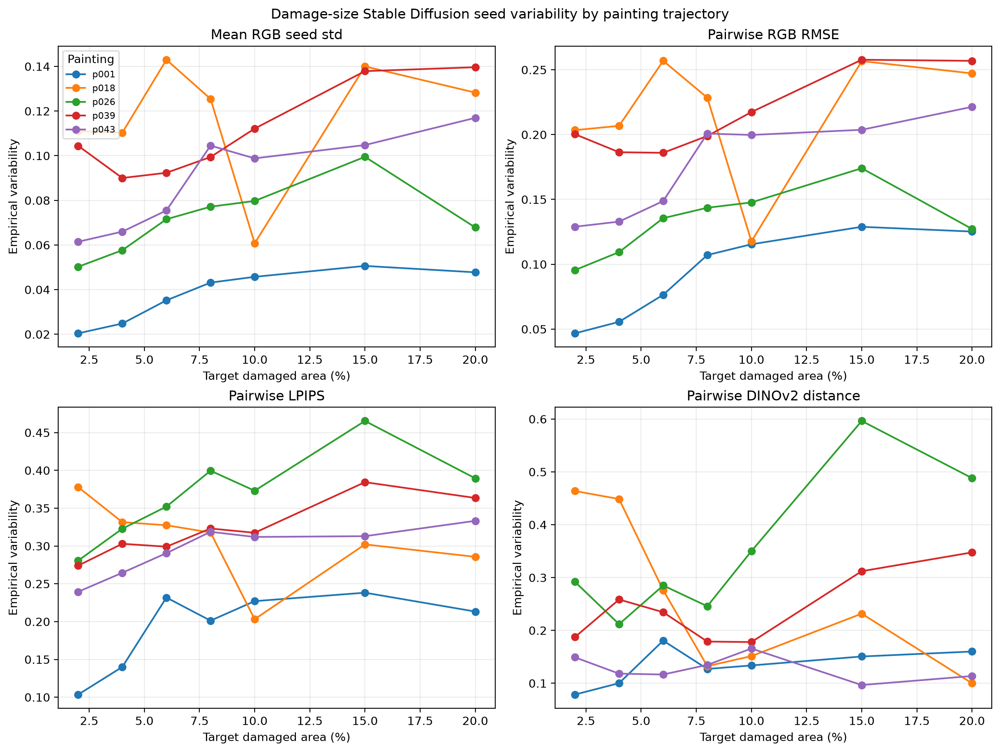


low_damage_portrait — p001 — 2% target damage


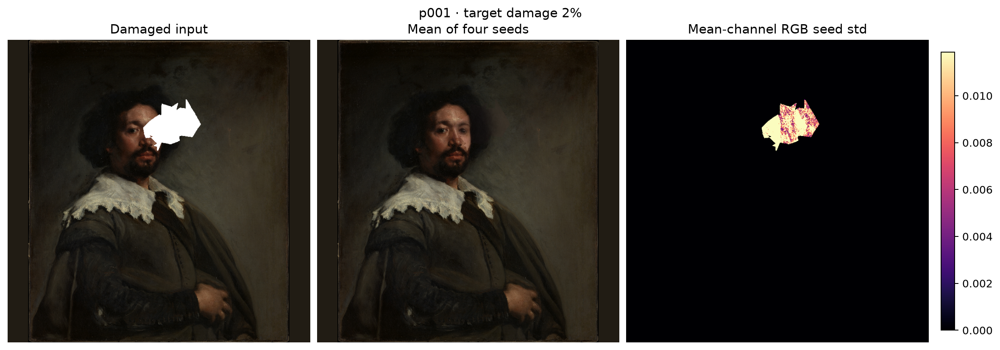


middle_damage_architecture — p026 — 10% target damage


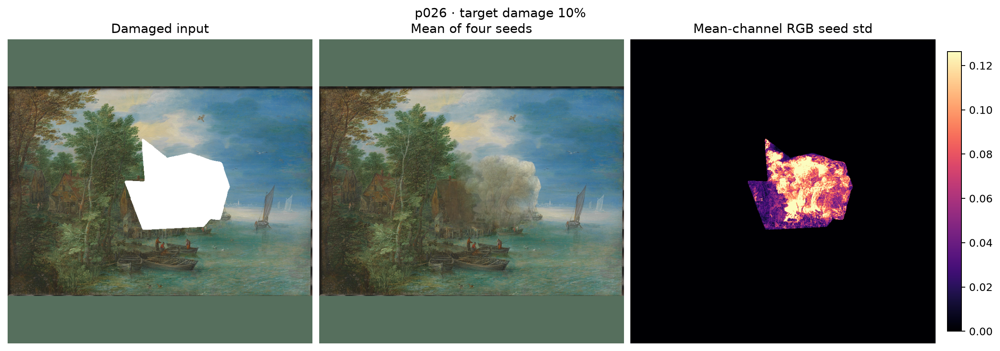


high_damage_texture — p043 — 20% target damage


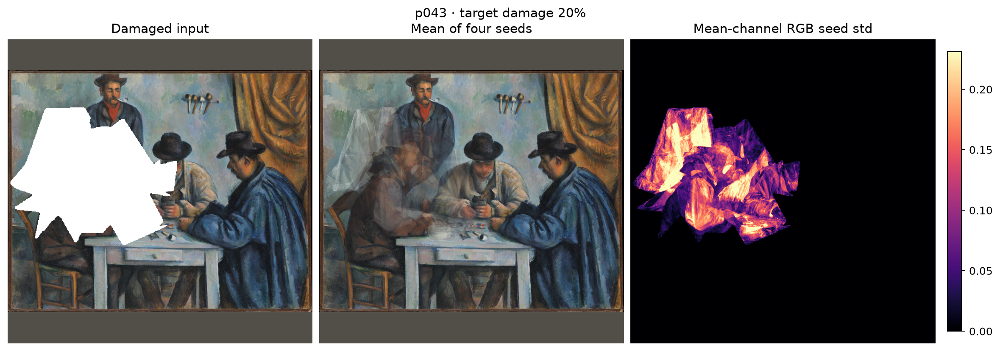

Displayed representative overlays: 3
All canonical overlays retained: 35


In [39]:
# ---------------------------------------------------------------------------
# Select low, middle, and high damage examples for notebook QA
# ---------------------------------------------------------------------------

representative_overlay_contract = [
    {
        "painting_id": "p001",
        "target_damage_fraction": 0.02,
        "review_role": (
            "low_damage_portrait"
        ),
    },
    {
        "painting_id": "p026",
        "target_damage_fraction": 0.10,
        "review_role": (
            "middle_damage_architecture"
        ),
    },
    {
        "painting_id": "p043",
        "target_damage_fraction": 0.20,
        "review_role": (
            "high_damage_texture"
        ),
    },
]

representative_overlay_frames = []

for selection in (
    representative_overlay_contract
):
    selected = (
        map_image_manifest_df.loc[
            map_image_manifest_df[
                "painting_id"
            ].astype(str).eq(
                selection["painting_id"]
            )
            & np.isclose(
                pd.to_numeric(
                    map_image_manifest_df[
                        "target_damage_fraction"
                    ],
                    errors="raise",
                ),
                float(
                    selection[
                        "target_damage_fraction"
                    ]
                ),
                rtol=0.0,
                atol=1e-12,
            )
        ]
        .copy()
    )

    if len(selected) != 1:
        raise ValueError(
            "Representative overlay selection "
            f"returned {len(selected)} rows: "
            f"{selection}"
        )

    selected["review_role"] = (
        selection["review_role"]
    )

    representative_overlay_frames.append(
        selected
    )

representative_overlay_df = (
    pd.concat(
        representative_overlay_frames,
        ignore_index=True,
    )
)

display(
    representative_overlay_df[
        [
            "review_role",
            "painting_id",
            "case_id",
            "target_damage_fraction",
            "realized_damage_fraction",
            "uncertainty_group_id",
            "relative_path",
            "width",
            "height",
            "size_bytes",
            "status",
        ]
    ]
)

print("Canonical four-panel trajectory summary")
display(
    NotebookImage(
        filename=str(
            OUTPUTS["summary_figure"]
        )
    )
)

for row in (
    representative_overlay_df.itertuples(
        index=False
    )
):
    print()
    print(
        row.review_role,
        "—",
        row.painting_id,
        f"— {100 * float(row.target_damage_fraction):.0f}% target damage",
    )

    display(
        NotebookImage(
            filename=str(
                NOTEBOOK_OUTPUT_ROOT
                / str(row.relative_path)
            )
        )
    )

print(
    "Displayed representative overlays:",
    len(representative_overlay_df),
)
print(
    "All canonical overlays retained:",
    len(map_image_manifest_df),
)

In [40]:
# ---------------------------------------------------------------------------
# Idempotent Batch 9 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_9_visualization"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_9_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_9_visualization"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_9_check(
    "persisted_map_key_contract",
    (
        "The canonical NPZ contains exactly one "
        "numerical map per uncertainty group."
    ),
    35,
    len(persisted_uncertainty_maps),
    (
        len(
            persisted_uncertainty_maps
        ) == 35
        and set(
            persisted_uncertainty_maps
        )
        == expected_uncertainty_group_ids
    ),
)

persisted_map_contract_passed = all(
    (
        np.asarray(array).shape
        == (768, 768)
        and np.asarray(array).dtype
        == np.float32
        and np.isfinite(
            np.asarray(array)
        ).all()
        and (
            np.asarray(array) >= 0.0
        ).all()
    )
    for array in (
        persisted_uncertainty_maps.values()
    )
)

add_batch_9_check(
    "persisted_map_array_contract",
    (
        "Every numerical map is finite, nonnegative, "
        "float32, and 768×768."
    ),
    True,
    bool(
        persisted_map_contract_passed
    ),
    bool(
        persisted_map_contract_passed
    ),
)

add_batch_9_check(
    "map_manifest_schema",
    (
        "The in-memory overlay manifest has the "
        "exact approved column contract."
    ),
    list(MAP_IMAGE_COLUMNS),
    list(
        map_image_manifest_df.columns
    ),
    (
        list(
            map_image_manifest_df.columns
        )
        == list(MAP_IMAGE_COLUMNS)
    ),
)

add_batch_9_check(
    "overlay_row_count",
    (
        "Exactly one readable overlay was rendered "
        "for each of the 35 uncertainty groups."
    ),
    35,
    len(map_image_manifest_df),
    (
        len(map_image_manifest_df) == 35
        and map_image_manifest_df[
            "uncertainty_group_id"
        ].nunique() == 35
    ),
)

add_batch_9_check(
    "unique_overlay_identifiers",
    (
        "Overlay identifiers, group identifiers, "
        "paths, and checksums are unique."
    ),
    0,
    {
        "duplicate_map_image_ids": int(
            map_image_manifest_df[
                "map_image_id"
            ].duplicated().sum()
        ),
        "duplicate_group_ids": int(
            map_image_manifest_df[
                "uncertainty_group_id"
            ].duplicated().sum()
        ),
        "duplicate_paths": int(
            map_image_manifest_df[
                "relative_path"
            ].duplicated().sum()
        ),
        "duplicate_checksums": int(
            map_image_manifest_df[
                "sha256"
            ].duplicated().sum()
        ),
    },
    (
        map_image_manifest_df[
            "map_image_id"
        ].is_unique
        and map_image_manifest_df[
            "uncertainty_group_id"
        ].is_unique
        and map_image_manifest_df[
            "relative_path"
        ].is_unique
        and map_image_manifest_df[
            "sha256"
        ].is_unique
    ),
)

add_batch_9_check(
    "overlay_file_audit",
    (
        "Every overlay reloads with matching "
        "geometry, size, and SHA-256."
    ),
    35,
    int(
        overlay_file_audit_df[
            "passed"
        ].sum()
    ),
    (
        len(overlay_file_audit_df) == 35
        and overlay_file_audit_df[
            "passed"
        ].all()
    ),
    details=(
        overlay_file_audit_df.loc[
            ~overlay_file_audit_df[
                "passed"
            ]
        ].to_dict("records")
    ),
)

overlay_status_counts = {
    str(key): int(value)
    for key, value in (
        map_image_manifest_df[
            "status"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

add_batch_9_check(
    "overlay_statuses",
    (
        "All overlay manifest rows have passed "
        "renderer status."
    ),
    {
        "passed": 35,
    },
    overlay_status_counts,
    (
        overlay_status_counts
        == {
            "passed": 35,
        }
    ),
)

add_batch_9_check(
    "overlay_metric_identity",
    (
        "Every overlay visualizes the declared "
        "mean-channel RGB seed-standard-deviation map."
    ),
    [
        "mean_channel_rgb_seed_standard_deviation",
    ],
    sorted(
        map_image_manifest_df[
            "map_metric_name"
        ].astype(str).unique().tolist()
    ),
    map_image_manifest_df[
        "map_metric_name"
    ].astype(str).eq(
        "mean_channel_rgb_seed_standard_deviation"
    ).all(),
)

overlay_paths_owned = all(
    (
        NOTEBOOK_OUTPUT_ROOT
        / str(relative_path)
    ).resolve().is_relative_to(
        NOTEBOOK_OUTPUT_ROOT.resolve()
    )
    for relative_path in (
        map_image_manifest_df[
            "relative_path"
        ].astype(str)
    )
)

add_batch_9_check(
    "overlay_path_ownership",
    (
        "Every rendered overlay remains under the "
        "Notebook 22 output root."
    ),
    True,
    bool(overlay_paths_owned),
    bool(overlay_paths_owned),
)

canonical_overlay_files = sorted(
    UNCERTAINTY_IMAGE_ROOT.glob(
        "*.png"
    )
)

expected_overlay_paths = {
    (
        NOTEBOOK_OUTPUT_ROOT
        / str(relative_path)
    ).resolve()
    for relative_path in (
        map_image_manifest_df[
            "relative_path"
        ].astype(str)
    )
}

observed_overlay_paths = {
    path.resolve()
    for path in (
        canonical_overlay_files
    )
}

add_batch_9_check(
    "canonical_overlay_directory",
    (
        "The canonical overlay directory contains "
        "exactly the 35 manifested PNG files."
    ),
    35,
    len(canonical_overlay_files),
    (
        len(canonical_overlay_files) == 35
        and observed_overlay_paths
        == expected_overlay_paths
    ),
)

summary_figure_valid = bool(
    OUTPUTS["summary_figure"].is_file()
    and summary_figure_audit[
        "format"
    ] == "PNG"
    and summary_figure_audit[
        "width"
    ] > 0
    and summary_figure_audit[
        "height"
    ] > 0
    and summary_figure_audit[
        "size_bytes"
    ] > 0
    and len(
        summary_figure_audit[
            "sha256"
        ]
    ) == 64
)

add_batch_9_check(
    "summary_figure_contract",
    (
        "The canonical summary is a nonempty, "
        "readable PNG with a SHA-256 digest."
    ),
    True,
    summary_figure_audit,
    summary_figure_valid,
)

summary_panel_contract = [
    (
        "pixel_rgb_std_mean",
        "masked_region",
    ),
    (
        "pairwise_rgb_rmse",
        "masked_region",
    ),
    (
        "pairwise_lpips_distance",
        "mask_bbox_crop",
    ),
    (
        "pairwise_dinov2_cosine_distance",
        "mask_bbox_crop",
    ),
]

summary_panel_coverage = {}

for metric_name, region_id in (
    summary_panel_contract
):
    selected = (
        damage_size_uncertainty_metrics_df.loc[
            damage_size_uncertainty_metrics_df[
                "metric_name"
            ].astype(str).eq(
                metric_name
            )
            & damage_size_uncertainty_metrics_df[
                "region_id"
            ].astype(str).eq(
                region_id
            )
        ]
    )

    panel_key = (
        f"{metric_name}|{region_id}"
    )

    summary_panel_coverage[
        panel_key
    ] = {
        "rows": int(len(selected)),
        "groups": int(
            selected[
                "uncertainty_group_id"
            ].nunique()
        ),
        "paintings": int(
            selected[
                "painting_id"
            ].nunique()
        ),
    }

summary_panels_valid = all(
    values["groups"] == 35
    and values["paintings"] == 5
    and values["rows"] > 0
    for values in (
        summary_panel_coverage.values()
    )
)

add_batch_9_check(
    "summary_panel_evidence",
    (
        "Every summary panel covers all 35 groups "
        "and five painting trajectories."
    ),
    {
        "groups_per_panel": 35,
        "paintings_per_panel": 5,
    },
    summary_panel_coverage,
    summary_panels_valid,
)

add_batch_9_check(
    "representative_overlay_review",
    (
        "Low-, middle-, and high-damage overlays "
        "were rendered in the notebook for review."
    ),
    3,
    len(representative_overlay_df),
    (
        len(
            representative_overlay_df
        ) == 3
        and representative_overlay_df[
            "uncertainty_group_id"
        ].is_unique
    ),
)

add_batch_9_check(
    "painting_not_category_trajectories",
    (
        "The canonical summary uses painting IDs and "
        "does not present category-effect estimates."
    ),
    {
        "painting_trajectories": 5,
        "category_effect_rows": 0,
    },
    {
        "painting_trajectories": int(
            uncertainty_population_df[
                "painting_id"
            ].nunique()
        ),
        "category_effect_rows": 0,
    },
    (
        uncertainty_population_df[
            "painting_id"
        ].nunique() == 5
    ),
)

add_batch_9_check(
    "map_manifest_persistence_deferred",
    (
        "The in-memory map manifest has not yet been "
        "written before final persistence validation."
    ),
    False,
    OUTPUTS["map_manifest"].exists(),
    not OUTPUTS["map_manifest"].exists(),
)

premature_batch_9_outputs = [
    OUTPUTS[key]
    for key in (
        "candidates",
        "damage_size_uncertainty",
        "run_manifest",
        "artifacts",
        "validation",
    )
    if OUTPUTS[key].exists()
]

add_batch_9_check(
    "remaining_outputs_deferred",
    (
        "Canonical tables and final manifests remain "
        "deferred to the persistence batch."
    ),
    0,
    len(premature_batch_9_outputs),
    not premature_batch_9_outputs,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in (
            premature_batch_9_outputs
        )
    ],
)

batch_9_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_9_visualization"
        )
    ]
    .reset_index(drop=True)
)

display(overlay_file_audit_df.head(12))
display(batch_9_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 9 summary")
print("---------------------------")
print(
    "Batch 9 checks:",
    len(batch_9_validation_df),
)
print(
    "Cumulative checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "Numerical maps:",
    len(persisted_uncertainty_maps),
)
print(
    "Canonical overlay images:",
    len(canonical_overlay_files),
)
print(
    "Representative overlays displayed:",
    len(representative_overlay_df),
)
print(
    "Summary figure:",
    to_repo_relative(
        OUTPUTS["summary_figure"],
        PROJECT_ROOT,
    ),
)
print("Batch 9 completion gate passed.")

,map_image_id,uncertainty_group_id,relative_path,file_exists,format,mode,width,height,size_bytes,sha256_matches,size_matches,geometry_matches,passed
0,dsm_f53ccb283fd756871ddc,ug_1679b8a8fb1f9ccb5e,images/uncertainty/ug_1679b8a8fb1f9ccb5e.png,True,PNG,RGBA,2359,830,1548727,True,True,True,True
1,dsm_bd46bcc9350f056e0f98,ug_16c0c4220b137a0017,images/uncertainty/ug_16c0c4220b137a0017.png,True,PNG,RGBA,2359,826,1065707,True,True,True,True
2,dsm_5b5f7ba9f1eb616436c3,ug_17f88d692de4c06d02,images/uncertainty/ug_17f88d692de4c06d02.png,True,PNG,RGBA,2359,830,1071194,True,True,True,True
3,dsm_51040f243c1de896a2c8,ug_1de955f7e0f3d00cf0,images/uncertainty/ug_1de955f7e0f3d00cf0.png,True,PNG,RGBA,2359,830,1079090,True,True,True,True
4,dsm_c955165bc082b33dd0f3,ug_222809607d0a0bbf88,images/uncertainty/ug_222809607d0a0bbf88.png,True,PNG,RGBA,2359,830,1396587,True,True,True,True
5,dsm_fb91f4ca50a4d0543603,ug_222ea90d2214292971,images/uncertainty/ug_222ea90d2214292971.png,True,PNG,RGBA,2359,826,1542325,True,True,True,True
6,dsm_27bdfe6ae2e7899d8c03,ug_283bb9e3ea21ef6818,images/uncertainty/ug_283bb9e3ea21ef6818.png,True,PNG,RGBA,2359,830,1076749,True,True,True,True
7,dsm_67383a2716783ecee65d,ug_31e6c87078e7612ccc,images/uncertainty/ug_31e6c87078e7612ccc.png,True,PNG,RGBA,2359,830,1431739,True,True,True,True
8,dsm_fd4ea053c03fb03a41df,ug_448e3638091eefc3e9,images/uncertainty/ug_448e3638091eefc3e9.png,True,PNG,RGBA,2359,826,1431102,True,True,True,True
9,dsm_b24d7bb2332b1067e17b,ug_4ebf9bafe49cea4347,images/uncertainty/ug_4ebf9bafe49cea4347.png,True,PNG,RGBA,2359,830,1547169,True,True,True,True


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_9_visualization,persisted_map_key_contract,The canonical NPZ contains exactly one numeric...,blocking,35,35,True,
1,batch_9_visualization,persisted_map_array_contract,"Every numerical map is finite, nonnegative, fl...",blocking,True,True,True,
2,batch_9_visualization,map_manifest_schema,The in-memory overlay manifest has the exact a...,blocking,"[""map_image_id"", ""uncertainty_group_id"", ""case...","[""map_image_id"", ""uncertainty_group_id"", ""case...",True,
3,batch_9_visualization,overlay_row_count,Exactly one readable overlay was rendered for ...,blocking,35,35,True,
4,batch_9_visualization,unique_overlay_identifiers,"Overlay identifiers, group identifiers, paths,...",blocking,0,"{""duplicate_checksums"": 0, ""duplicate_group_id...",True,
5,batch_9_visualization,overlay_file_audit,"Every overlay reloads with matching geometry, ...",blocking,35,35,True,[]
6,batch_9_visualization,overlay_statuses,All overlay manifest rows have passed renderer...,blocking,"{""passed"": 35}","{""passed"": 35}",True,
7,batch_9_visualization,overlay_metric_identity,Every overlay visualizes the declared mean-cha...,blocking,"[""mean_channel_rgb_seed_standard_deviation""]","[""mean_channel_rgb_seed_standard_deviation""]",True,
8,batch_9_visualization,overlay_path_ownership,Every rendered overlay remains under the Noteb...,blocking,True,True,True,
9,batch_9_visualization,canonical_overlay_directory,The canonical overlay directory contains exact...,blocking,35,35,True,


Notebook 22 Batch 9 summary
---------------------------
Batch 9 checks: 16
Cumulative checks: 214
Blocking failures: 0
Numerical maps: 35
Canonical overlay images: 35
Representative overlays displayed: 3
Summary figure: outputs/22_damage_size_diffusion_uncertainty_extension/figures/uncertainty_extension_summary.png
Batch 9 completion gate passed.


## Batch 10 — Canonical persistence, manifests, and final completion

This final batch persists and independently reloads the complete Notebook 22 evidence package.

It writes:

- the 105 Notebook 22-owned extension candidates;
- the complete 4,760-row uncertainty and frozen-reference metric table;
- the 35-row uncertainty-overlay manifest;
- consolidated validation evidence;
- the normalized artifact manifest;
- the universal run manifest;
- the global project-path registry handoff.

The batch verifies all canonical tables, numerical maps, restoration images, uncertainty overlays, the summary figure, roadmap responsibilities, frozen-anchor checksums, file ownership, and artifact checksums.

Temporary checkpoints are removed only after the canonical candidate, metric, map, image, and figure artifacts have passed validation.

In [41]:
import gc
import shutil
import time

from restoration_eval.damage_size_diffusion_uncertainty import (
    atomic_write_csv,
)

from restoration_eval.manifests import (
    MANIFESTS_MODULE_VERSION,
    artifact_records_dataframe,
    build_artifact_record,
    build_run_manifest,
    sha256_path,
    write_artifact_manifest,
    write_run_manifest,
)

from restoration_eval.paths import (
    upsert_project_path_artifacts,
    validate_project_paths_registry,
    write_project_paths_registry,
)

from restoration_eval.schemas import (
    ARTIFACT_MANIFEST_SCHEMA,
    SCHEMAS_MODULE_VERSION,
    STABLE_DIFFUSION_CANDIDATE_COLUMNS,
    VALIDATION_CHECKS_SCHEMA,
    validate_dataframe,
)


# ---------------------------------------------------------------------------
# Windows-safe retry wrapper for final metadata files
# ---------------------------------------------------------------------------

def call_with_permission_retry(
    function,
    *args,
    attempts=10,
    retry_delay_seconds=0.25,
    **kwargs,
):
    last_error = None

    for attempt in range(
        1,
        int(attempts) + 1,
    ):
        try:
            result = function(
                *args,
                **kwargs,
            )

            return {
                "result": result,
                "attempts": attempt,
            }

        except PermissionError as error:
            last_error = error
            gc.collect()

            if attempt < attempts:
                time.sleep(
                    float(
                        retry_delay_seconds
                    )
                    * attempt
                )

    raise PermissionError(
        "Operation remained locked after "
        f"{attempts} attempts: {last_error}"
    )


# ---------------------------------------------------------------------------
# Normalize canonical tables
# ---------------------------------------------------------------------------

canonical_candidates_df = (
    extension_execution_df.loc[
        :,
        STABLE_DIFFUSION_CANDIDATE_COLUMNS,
    ]
    .sort_values(
        [
            "painting_id",
            "case_id",
            "seed",
            "candidate_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

canonical_metrics_df = (
    damage_size_uncertainty_metrics_df.loc[
        :,
        DIFFUSION_UNCERTAINTY_COLUMNS,
    ]
    .sort_values(
        [
            "painting_id",
            "target_damage_fraction",
            "uncertainty_group_id",
            "observation_level",
            "metric_family",
            "metric_name",
            "region_id",
            "seed",
            "seed_a",
            "seed_b",
        ],
        kind="stable",
        na_position="last",
    )
    .reset_index(drop=True)
)

canonical_map_manifest_df = (
    map_image_manifest_df.loc[
        :,
        MAP_IMAGE_COLUMNS,
    ]
    .sort_values(
        [
            "painting_id",
            "target_damage_fraction",
            "uncertainty_group_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Persist the three canonical tables atomically
# ---------------------------------------------------------------------------

atomic_write_csv(
    canonical_candidates_df,
    OUTPUTS["candidates"],
    config=extension_config,
)

atomic_write_csv(
    canonical_metrics_df,
    OUTPUTS[
        "damage_size_uncertainty"
    ],
    config=extension_config,
)

atomic_write_csv(
    canonical_map_manifest_df,
    OUTPUTS["map_manifest"],
    config=extension_config,
)


# ---------------------------------------------------------------------------
# Independent reload
# ---------------------------------------------------------------------------

reloaded_candidates_df = pd.read_csv(
    OUTPUTS["candidates"],
    low_memory=False,
)

reloaded_metrics_df = pd.read_csv(
    OUTPUTS[
        "damage_size_uncertainty"
    ],
    low_memory=False,
)

reloaded_map_manifest_df = pd.read_csv(
    OUTPUTS["map_manifest"],
    keep_default_na=False,
)

reloaded_candidate_validation = (
    validate_extension_candidate_plan(
        reloaded_candidates_df,
        config=extension_config,
        require_completed=True,
    )
)

reloaded_metric_validation = (
    validate_extension_metrics(
        reloaded_metrics_df,
        uncertainty_population_df,
        config=extension_config,
    )
)

with np.load(
    OUTPUTS["uncertainty_maps"],
    allow_pickle=False,
) as bundle:
    final_reloaded_maps = {
        str(key): np.asarray(
            bundle[key],
            dtype=np.float32,
        )
        for key in bundle.files
    }

print("Canonical scientific outputs persisted and reloaded.")
print(
    "Candidate rows:",
    len(reloaded_candidates_df),
)
print(
    "Metric rows:",
    len(reloaded_metrics_df),
)
print(
    "Map-manifest rows:",
    len(reloaded_map_manifest_df),
)
print(
    "Numerical maps:",
    len(final_reloaded_maps),
)
print(
    "Candidate contract passed:",
    reloaded_candidate_validation[
        "passed"
    ],
)
print(
    "Metric contract passed:",
    reloaded_metric_validation[
        "passed"
    ],
)

Canonical scientific outputs persisted and reloaded.
Candidate rows: 105
Metric rows: 4760
Map-manifest rows: 35
Numerical maps: 35
Candidate contract passed: True
Metric contract passed: True


In [42]:
# ---------------------------------------------------------------------------
# Explicit Notebook 22 roadmap traceability
# ---------------------------------------------------------------------------

roadmap_traceability_records = [
    {
        "requirement_id": "N22-R01",
        "roadmap_requirement": (
            "Keep Notebooks 01–21 frozen and reference "
            "the 35 Notebook 11 seed-2026 anchors."
        ),
        "implementation_evidence": (
            "Thirty-five checksum-verified frozen references "
            "remain owned by Notebook 11."
        ),
        "passed": (
            len(frozen_anchors_df) == 35
            and frozen_anchors_df[
                "seed"
            ].astype(int).eq(2026).all()
            and not bool(
                FROZEN_BOUNDARY[
                    "may_write_frozen_outputs"
                ]
            )
        ),
    },
    {
        "requirement_id": "N22-R02",
        "roadmap_requirement": (
            "Generate only seeds 2027–2029 for all "
            "35 damage-size cases."
        ),
        "implementation_evidence": (
            "The canonical candidate table contains 105 "
            "Notebook 22-owned completed candidates."
        ),
        "passed": (
            len(reloaded_candidates_df) == 105
            and set(
                reloaded_candidates_df[
                    "seed"
                ].astype(int)
            )
            == {
                2027,
                2028,
                2029,
            }
        ),
    },
    {
        "requirement_id": "N22-R03",
        "roadmap_requirement": (
            "Construct 35 groups with seeds 2026, "
            "2027, 2028, and 2029."
        ),
        "implementation_evidence": (
            "The combined population contains 140 candidates, "
            "35 groups, and 210 unordered seed pairs."
        ),
        "passed": (
            len(
                uncertainty_population_df
            ) == 140
            and uncertainty_population_df[
                "uncertainty_group_id"
            ].nunique() == 35
            and len(
                uncertainty_pair_plan_df
            ) == 210
        ),
    },
    {
        "requirement_id": "N22-R04",
        "roadmap_requirement": (
            "Retain the frozen Stable Diffusion model, "
            "prompt, scheduler, resolution, and compositing contract."
        ),
        "implementation_evidence": (
            "All inherited generation fields matched their "
            "seed-2026 anchor values before execution."
        ),
        "passed": (
            extension_contract_comparison_df[
                "all_inherited_fields_match"
            ].astype(bool).all()
        ),
    },
    {
        "requirement_id": "N22-R05",
        "roadmap_requirement": (
            "Support checksum-aware resume, bounded retries, "
            "progress output, and Windows-safe checkpoints."
        ),
        "implementation_evidence": (
            "All 105 candidates completed under the resumable "
            "execution contract with no failed output audit."
        ),
        "passed": (
            extension_execution_df[
                "status"
            ].astype(str).eq(
                "completed"
            ).all()
            and extension_output_audit_df[
                "passed"
            ].astype(bool).all()
        ),
    },
    {
        "requirement_id": "N22-R06",
        "roadmap_requirement": (
            "Validate image dimensions, readability, checksums, "
            "compositing, and outside-mask invariance."
        ),
        "implementation_evidence": (
            "Every extension image passed the independent "
            "768×768 RGB PNG and pixel-invariance audit."
        ),
        "passed": (
            len(
                extension_output_audit_df
            ) == 105
            and extension_output_audit_df[
                "passed"
            ].astype(bool).all()
            and extension_output_audit_df[
                "outside_mask_changed_pixels"
            ].astype(int).eq(0).all()
        ),
    },
    {
        "requirement_id": "N22-R07",
        "roadmap_requirement": (
            "Compute transparent RGB, LPIPS, CLIP, and "
            "DINOv2 uncertainty without a combined score."
        ),
        "implementation_evidence": (
            "The canonical metric table contains all four "
            "declared uncertainty families as separate rows."
        ),
        "passed": (
            reloaded_metric_validation[
                "passed"
            ]
            and not reloaded_metrics_df[
                "is_combined_index"
            ].astype(bool).any()
        ),
    },
    {
        "requirement_id": "N22-R08",
        "roadmap_requirement": (
            "Apply the six pixel regions and two approved "
            "contiguous learned-metric regions."
        ),
        "implementation_evidence": (
            "Image-space evidence covers six regions; LPIPS, "
            "CLIP, and DINOv2 cover content and mask crop."
        ),
        "passed": (
            set(
                image_space_metrics_df[
                    "region_id"
                ].astype(str)
            )
            == set(
                REGION_POLICY[
                    "pixel_regions"
                ]
            )
            and set(
                lpips_uncertainty_metrics_df[
                    "region_id"
                ].astype(str)
            )
            == set(
                REGION_POLICY[
                    "learned_metric_regions"
                ]
            )
            and set(
                feature_uncertainty_metrics_df[
                    "region_id"
                ].astype(str)
            )
            == set(
                REGION_POLICY[
                    "learned_metric_regions"
                ]
            )
        ),
    },
    {
        "requirement_id": "N22-R09",
        "roadmap_requirement": (
            "Retain numerical uncertainty maps and "
            "readable overlays."
        ),
        "implementation_evidence": (
            "The output contains 35 float32 maps and "
            "35 checksum-verified PNG overlays."
        ),
        "passed": (
            len(final_reloaded_maps) == 35
            and len(
                reloaded_map_manifest_df
            ) == 35
            and overlay_file_audit_df[
                "passed"
            ].astype(bool).all()
        ),
    },
    {
        "requirement_id": "N22-R10",
        "roadmap_requirement": (
            "Join validated primary-candidate reference, "
            "perceptual, feature, texture, colour, seam, "
            "spatial, and semantic evidence."
        ),
        "implementation_evidence": (
            "Sixteen frozen-reference specifications produce "
            "560 finite seed-2026 evidence rows."
        ),
        "passed": (
            len(
                anchor_reference_metrics_df
            ) == 560
            and anchor_reference_values.notna().all()
            and np.isfinite(
                anchor_reference_values
            ).all()
        ),
    },
    {
        "requirement_id": "N22-R11",
        "roadmap_requirement": (
            "Treat damage levels as nested observations within "
            "five painting trajectories."
        ),
        "implementation_evidence": (
            "The canonical summary displays five named painting "
            "trajectories and no category-effect estimate."
        ),
        "passed": (
            uncertainty_population_df[
                "painting_id"
            ].nunique() == 5
            and not bool(
                EVIDENCE_POLICY[
                    "category_effect_permitted"
                ]
            )
            and not bool(
                EVIDENCE_POLICY[
                    "style_effect_permitted"
                ]
            )
        ),
    },
    {
        "requirement_id": "N22-R12",
        "roadmap_requirement": (
            "State that seed variability is not calibrated "
            "confidence or restoration correctness."
        ),
        "implementation_evidence": (
            "The notebook header and configuration retain the "
            "approved interpretation and limitation statements."
        ),
        "passed": (
            EVIDENCE_POLICY[
                "interpretation"
            ]
            == (
                "empirical_seed_variability_proxy_"
                "not_calibrated_confidence"
            )
            and not bool(
                EVIDENCE_POLICY[
                    "low_uncertainty_proves_correctness"
                ]
            )
        ),
    },
]

requirement_traceability_df = pd.DataFrame(
    roadmap_traceability_records
)

traceability_failures_df = (
    requirement_traceability_df.loc[
        ~requirement_traceability_df[
            "passed"
        ].astype(bool)
    ]
    .copy()
)

display(requirement_traceability_df)

print("Notebook 22 roadmap traceability assembled.")
print(
    "Roadmap responsibilities:",
    len(requirement_traceability_df),
)
print(
    "Traceability failures:",
    len(traceability_failures_df),
)

,requirement_id,roadmap_requirement,implementation_evidence,passed
0,N22-R01,Keep Notebooks 01–21 frozen and reference the ...,Thirty-five checksum-verified frozen reference...,True
1,N22-R02,Generate only seeds 2027–2029 for all 35 damag...,The canonical candidate table contains 105 Not...,True
2,N22-R03,"Construct 35 groups with seeds 2026, 2027, 202...",The combined population contains 140 candidate...,True
3,N22-R04,"Retain the frozen Stable Diffusion model, prom...",All inherited generation fields matched their ...,True
4,N22-R05,"Support checksum-aware resume, bounded retries...",All 105 candidates completed under the resumab...,True
5,N22-R06,"Validate image dimensions, readability, checks...",Every extension image passed the independent 7...,True
6,N22-R07,"Compute transparent RGB, LPIPS, CLIP, and DINO...",The canonical metric table contains all four d...,True
7,N22-R08,Apply the six pixel regions and two approved c...,Image-space evidence covers six regions; LPIPS...,True
8,N22-R09,Retain numerical uncertainty maps and readable...,The output contains 35 float32 maps and 35 che...,True
9,N22-R10,"Join validated primary-candidate reference, pe...",Sixteen frozen-reference specifications produc...,True


Notebook 22 roadmap traceability assembled.
Roadmap responsibilities: 12
Traceability failures: 0


In [44]:
# ---------------------------------------------------------------------------
# Release objects that may retain work-file handles
# ---------------------------------------------------------------------------

feature_model_bundles = None
extension_embedding_results = None
extension_embedding_arrays = None
combined_embedding_arrays = None
frozen_embedding_arrays = None
result = None
bundle = None
encode_batch = None

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


# ---------------------------------------------------------------------------
# Remove only the explicitly resolved Notebook 22 work directory
# ---------------------------------------------------------------------------

WORK_ROOT = (
    NOTEBOOK_OUTPUT_ROOT / "work"
).resolve()

if (
    not WORK_ROOT.is_relative_to(
        NOTEBOOK_OUTPUT_ROOT.resolve()
    )
    or WORK_ROOT.name != "work"
):
    raise RuntimeError(
        "Refusing unsafe work-directory cleanup."
    )

work_cleanup_attempts = 0
work_cleanup_error = ""

if WORK_ROOT.exists():
    for attempt in range(1, 9):
        work_cleanup_attempts = attempt

        try:
            shutil.rmtree(WORK_ROOT)
            work_cleanup_error = ""
            break

        except PermissionError as error:
            work_cleanup_error = (
                f"{type(error).__name__}: {error}"
            )
            gc.collect()

            if torch.cuda.is_available():
                torch.cuda.empty_cache()

            if attempt < 8:
                time.sleep(
                    0.25 * attempt
                )

if WORK_ROOT.exists():
    raise PermissionError(
        "Notebook 22 work-directory cleanup "
        f"failed: {work_cleanup_error}"
    )


# ---------------------------------------------------------------------------
# Independent final file collections
# ---------------------------------------------------------------------------

final_restoration_files = sorted(
    RESTORED_IMAGE_ROOT.rglob("*.png")
)

final_overlay_files = sorted(
    UNCERTAINTY_IMAGE_ROOT.glob("*.png")
)

frozen_anchor_final_df = (
    select_frozen_damage_size_anchors(
        damage_size_cases_df,
        stable_diffusion_candidates_df,
        config=extension_config,
        project_root=PROJECT_ROOT,
        verify_files=True,
    )
)

expected_premetadata_files = {
    path.resolve()
    for path in (
        final_restoration_files
        + final_overlay_files
        + [
            OUTPUTS["candidates"],
            OUTPUTS["uncertainty_maps"],
            OUTPUTS[
                "damage_size_uncertainty"
            ],
            OUTPUTS["summary_figure"],
            OUTPUTS["map_manifest"],
        ]
    )
}

observed_premetadata_files = {
    path.resolve()
    for path in (
        NOTEBOOK_OUTPUT_ROOT.rglob("*")
    )
    if path.is_file()
}

premetadata_temporary_files = [
    path
    for path in (
        observed_premetadata_files
    )
    if (
        ".tmp" in path.name
        or path.suffix.lower()
        in {
            ".part",
            ".partial",
        }
    )
]


# ---------------------------------------------------------------------------
# Idempotent Batch 10 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_10_final_persistence"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_10_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_10_final_persistence"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


prior_validation_df = (
    VALIDATION.to_dataframe()
)

prior_failed_checks = (
    prior_validation_df.loc[
        ~prior_validation_df[
            "passed"
        ].astype(bool)
    ]
)

add_batch_10_check(
    "prior_batch_validation",
    (
        "Every validation check from Batches 1–9 "
        "passed before final persistence."
    ),
    0,
    len(prior_failed_checks),
    prior_failed_checks.empty,
    details=(
        prior_failed_checks[
            [
                "validation_stage",
                "check_id",
                "severity",
            ]
        ].to_dict("records")
    ),
)

add_batch_10_check(
    "roadmap_traceability",
    (
        "Every declared Notebook 22 roadmap "
        "responsibility is implemented."
    ),
    0,
    len(traceability_failures_df),
    traceability_failures_df.empty,
    details=(
        traceability_failures_df.to_dict(
            "records"
        )
    ),
)

add_batch_10_check(
    "persisted_candidate_contract",
    (
        "The reloaded 105-row candidate table passes "
        "the completed extension contract."
    ),
    True,
    reloaded_candidate_validation,
    reloaded_candidate_validation[
        "passed"
    ],
)

add_batch_10_check(
    "persisted_metric_contract",
    (
        "The reloaded 4,760-row metric table passes "
        "the complete evidence contract."
    ),
    True,
    reloaded_metric_validation,
    reloaded_metric_validation[
        "passed"
    ],
)

add_batch_10_check(
    "persisted_map_manifest_contract",
    (
        "The reloaded map manifest has 35 unique rows "
        "and the exact approved columns."
    ),
    {
        "rows": 35,
        "columns": list(
            MAP_IMAGE_COLUMNS
        ),
    },
    {
        "rows": len(
            reloaded_map_manifest_df
        ),
        "columns": list(
            reloaded_map_manifest_df.columns
        ),
    },
    (
        len(
            reloaded_map_manifest_df
        ) == 35
        and list(
            reloaded_map_manifest_df.columns
        )
        == list(MAP_IMAGE_COLUMNS)
        and reloaded_map_manifest_df[
            "map_image_id"
        ].is_unique
        and reloaded_map_manifest_df[
            "uncertainty_group_id"
        ].is_unique
    ),
)

final_map_arrays_valid = all(
    (
        array.shape == (768, 768)
        and array.dtype == np.float32
        and np.isfinite(array).all()
        and (array >= 0.0).all()
    )
    for array in (
        final_reloaded_maps.values()
    )
)

add_batch_10_check(
    "persisted_numerical_maps",
    (
        "The canonical NPZ contains 35 finite, "
        "nonnegative 768×768 float32 maps."
    ),
    35,
    len(final_reloaded_maps),
    (
        len(final_reloaded_maps) == 35
        and set(final_reloaded_maps)
        == expected_uncertainty_group_ids
        and final_map_arrays_valid
    ),
)

add_batch_10_check(
    "restoration_image_contract",
    (
        "Exactly 105 Notebook 22-owned restoration "
        "images remain after persistence."
    ),
    105,
    len(final_restoration_files),
    (
        len(final_restoration_files) == 105
        and extension_output_audit_df[
            "passed"
        ].astype(bool).all()
    ),
)

add_batch_10_check(
    "overlay_image_contract",
    (
        "Exactly 35 checksum-verified uncertainty "
        "overlays remain after persistence."
    ),
    35,
    len(final_overlay_files),
    (
        len(final_overlay_files) == 35
        and overlay_file_audit_df[
            "passed"
        ].astype(bool).all()
    ),
)

add_batch_10_check(
    "summary_figure_contract",
    (
        "The canonical four-panel summary figure "
        "remains readable and checksum-addressable."
    ),
    True,
    summary_figure_audit,
    (
        OUTPUTS[
            "summary_figure"
        ].is_file()
        and summary_figure_audit[
            "format"
        ] == "PNG"
        and summary_figure_audit[
            "size_bytes"
        ] > 0
        and len(
            summary_figure_audit[
                "sha256"
            ]
        ) == 64
    ),
)

add_batch_10_check(
    "frozen_anchor_reverification",
    (
        "All 35 frozen Notebook 11 anchors still "
        "resolve with their original checksums."
    ),
    35,
    len(frozen_anchor_final_df),
    len(frozen_anchor_final_df) == 35,
)

add_batch_10_check(
    "extension_path_ownership",
    (
        "Every persisted extension candidate path "
        "is owned by Notebook 22."
    ),
    "images/restored/*",
    sorted(
        reloaded_candidates_df[
            "restored_path"
        ].astype(str)
        .str.split("/")
        .str[:2]
        .str.join("/")
        .unique()
        .tolist()
    ),
    reloaded_candidates_df[
        "restored_path"
    ].astype(str).str.startswith(
        "images/restored/"
    ).all(),
)

add_batch_10_check(
    "complete_metric_row_count",
    (
        "The canonical metric table contains exactly "
        "4,760 rows."
    ),
    4760,
    len(reloaded_metrics_df),
    len(reloaded_metrics_df) == 4760,
)

add_batch_10_check(
    "transparent_metric_policy",
    (
        "No canonical metric row is a combined "
        "uncertainty or trustworthiness index."
    ),
    0,
    int(
        reloaded_metrics_df[
            "is_combined_index"
        ].astype(bool).sum()
    ),
    not reloaded_metrics_df[
        "is_combined_index"
    ].astype(bool).any(),
)

add_batch_10_check(
    "exact_seed_group_contract",
    (
        "Every group retains exactly seeds 2026, "
        "2027, 2028, and 2029."
    ),
    [
        2026,
        2027,
        2028,
        2029,
    ],
    {
    "groups": int(
            uncertainty_population_df[
                "uncertainty_group_id"
            ].nunique()
        ),
        "invalid_groups": int(
            (
                ~uncertainty_population_df
                .groupby(
                    "uncertainty_group_id"
                )["seed"]
                .apply(
                    lambda values: tuple(
                        sorted(
                            values.astype(int)
                        )
                    )
                    == (
                        2026,
                        2027,
                        2028,
                        2029,
                    )
                )
            ).sum()
        ),
    },
    (
        uncertainty_population_df[
            "uncertainty_group_id"
        ].nunique() == 35
        and uncertainty_population_df
        .groupby(
            "uncertainty_group_id"
        )["seed"]
        .apply(
            lambda values: tuple(
                sorted(
                    values.astype(int)
                )
            )
            == (
                2026,
                2027,
                2028,
                2029,
            )
        )
        .all()
    ),
)

add_batch_10_check(
    "painting_trajectory_scope",
    (
        "The design contains five painting trajectories "
        "with seven nested levels each."
    ),
    {
        "paintings": 5,
        "levels_per_painting": 7,
    },
    {
        "paintings": int(
            uncertainty_population_df[
                "painting_id"
            ].nunique()
        ),
        "levels": sorted(
            uncertainty_population_df
            .groupby(
                "painting_id"
            )[
                "target_damage_fraction"
            ]
            .nunique()
            .astype(int)
            .unique()
            .tolist()
        ),
    },
    (
        uncertainty_population_df[
            "painting_id"
        ].nunique() == 5
        and uncertainty_population_df
        .groupby(
            "painting_id"
        )[
            "target_damage_fraction"
        ]
        .nunique()
        .eq(7)
        .all()
    ),
)

add_batch_10_check(
    "category_effect_prohibited",
    (
        "No category or style effect is claimed from "
        "one painting per labelled category."
    ),
    {
        "category_effect_permitted": False,
        "style_effect_permitted": False,
    },
    {
        "category_effect_permitted": bool(
            EVIDENCE_POLICY[
                "category_effect_permitted"
            ]
        ),
        "style_effect_permitted": bool(
            EVIDENCE_POLICY[
                "style_effect_permitted"
            ]
        ),
    },
    (
        not bool(
            EVIDENCE_POLICY[
                "category_effect_permitted"
            ]
        )
        and not bool(
            EVIDENCE_POLICY[
                "style_effect_permitted"
            ]
        )
    ),
)

add_batch_10_check(
    "premetadata_file_contract",
    (
        "Before final metadata, the output root contains "
        "exactly 145 declared scientific files."
    ),
    145,
    len(observed_premetadata_files),
    (
        observed_premetadata_files
        == expected_premetadata_files
        and len(
            observed_premetadata_files
        ) == 145
    ),
    details={
        "unexpected": sorted(
            path.relative_to(
                NOTEBOOK_OUTPUT_ROOT
            ).as_posix()
            for path in (
                observed_premetadata_files
                - expected_premetadata_files
            )
        ),
        "missing": sorted(
            path.relative_to(
                NOTEBOOK_OUTPUT_ROOT
            ).as_posix()
            for path in (
                expected_premetadata_files
                - observed_premetadata_files
            )
        ),
    },
)

add_batch_10_check(
    "temporary_files_absent",
    (
        "No temporary or partial files remain under "
        "the Notebook 22 output root."
    ),
    0,
    len(premetadata_temporary_files),
    not premetadata_temporary_files,
    details=[
        path.relative_to(
            NOTEBOOK_OUTPUT_ROOT
        ).as_posix()
        for path in (
            premetadata_temporary_files
        )
    ],
)

add_batch_10_check(
    "work_directory_removed",
    (
        "The Notebook 22 work directory was removed "
        "only after canonical evidence validation."
    ),
    False,
    WORK_ROOT.exists(),
    not WORK_ROOT.exists(),
    details={
        "cleanup_attempts": int(
            work_cleanup_attempts
        ),
        "cleanup_error": (
            work_cleanup_error
        ),
    },
)

add_batch_10_check(
    "standalone_report_not_required",
    (
        "Notebook 22 correctly omits a standalone "
        "HTML or Markdown report."
    ),
    0,
    len(
        list(
            NOTEBOOK_OUTPUT_ROOT.glob(
                "reports/*"
            )
        )
    ),
    not any(
        NOTEBOOK_OUTPUT_ROOT.glob(
            "reports/*"
        )
    ),
)

batch_10_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_10_final_persistence"
        )
    ]
    .reset_index(drop=True)
)

display(batch_10_validation_df)

VALIDATION.raise_for_blocking()


# ---------------------------------------------------------------------------
# Persist and independently reload validation evidence
# ---------------------------------------------------------------------------

validation_write_result = (
    call_with_permission_retry(
        VALIDATION.write_csv,
        OUTPUTS["validation"],
    )
)

persisted_validation_df = pd.read_csv(
    OUTPUTS["validation"],
    keep_default_na=False,
)

persisted_validation_schema = (
    validate_dataframe(
        persisted_validation_df,
        VALIDATION_CHECKS_SCHEMA,
        allow_extra_columns=False,
    )
)

if not persisted_validation_schema.passed:
    raise RuntimeError(
        "Persisted validation table violates "
        "validation_checks.v1."
    )

persisted_passed_values = (
    persisted_validation_df[
        "passed"
    ]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

persisted_blocking_failures = int(
    (
        ~persisted_passed_values
        & persisted_validation_df[
            "severity"
        ].astype(str).eq(
            "blocking"
        )
    ).sum()
)

if persisted_blocking_failures:
    raise RuntimeError(
        "Persisted validation contains blocking failures."
    )

print("Notebook 22 consolidated validation persisted.")
print(
    "Batch 10 checks:",
    len(batch_10_validation_df),
)
print(
    "Total validation rows:",
    len(persisted_validation_df),
)
print(
    "Blocking failures:",
    persisted_blocking_failures,
)
print(
    "Validation write attempts:",
    validation_write_result[
        "attempts"
    ],
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_10_final_persistence,prior_batch_validation,Every validation check from Batches 1–9 passed...,blocking,0,0,True,[]
1,batch_10_final_persistence,roadmap_traceability,Every declared Notebook 22 roadmap responsibil...,blocking,0,0,True,[]
2,batch_10_final_persistence,persisted_candidate_contract,The reloaded 105-row candidate table passes th...,blocking,True,"{""case_count"": 35, ""passed"": true, ""paths_owne...",True,
3,batch_10_final_persistence,persisted_metric_contract,"The reloaded 4,760-row metric table passes the...",blocking,True,"{""all_values_finite"": true, ""candidate_count"":...",True,
4,batch_10_final_persistence,persisted_map_manifest_contract,The reloaded map manifest has 35 unique rows a...,blocking,"{""columns"": [""map_image_id"", ""uncertainty_grou...","{""columns"": [""map_image_id"", ""uncertainty_grou...",True,
5,batch_10_final_persistence,persisted_numerical_maps,"The canonical NPZ contains 35 finite, nonnegat...",blocking,35,35,True,
6,batch_10_final_persistence,restoration_image_contract,Exactly 105 Notebook 22-owned restoration imag...,blocking,105,105,True,
7,batch_10_final_persistence,overlay_image_contract,Exactly 35 checksum-verified uncertainty overl...,blocking,35,35,True,
8,batch_10_final_persistence,summary_figure_contract,The canonical four-panel summary figure remain...,blocking,True,"{""format"": ""PNG"", ""height"": 1823, ""mode"": ""RGB...",True,
9,batch_10_final_persistence,frozen_anchor_reverification,All 35 frozen Notebook 11 anchors still resolv...,blocking,35,35,True,


Notebook 22 consolidated validation persisted.
Batch 10 checks: 20
Total validation rows: 234
Blocking failures: 0
Validation write attempts: 1


In [45]:
# ---------------------------------------------------------------------------
# Normalized non-self-referential artifact manifest
# ---------------------------------------------------------------------------

artifact_specifications = [
    {
        "artifact_key": (
            "damage_size_diffusion_uncertainty."
            "candidates"
        ),
        "path": OUTPUTS["candidates"],
        "artifact_type": (
            "stable_diffusion_candidate_table"
        ),
        "artifact_role": (
            "notebook_22_extension_candidates"
        ),
        "schema_version": (
            EXTENSION_CONFIG[
                "candidates_schema_version"
            ]
        ),
        "row_count": 105,
    },
    {
        "artifact_key": (
            "damage_size_diffusion_uncertainty."
            "maps"
        ),
        "path": OUTPUTS[
            "uncertainty_maps"
        ],
        "artifact_type": (
            "compressed_numerical_map_bundle"
        ),
        "artifact_role": (
            "raw_seed_variability_maps"
        ),
        "schema_version": (
            "damage_size_uncertainty_maps.v1"
        ),
        "row_count": 35,
    },
    {
        "artifact_key": (
            "damage_size_diffusion_uncertainty."
            "metrics"
        ),
        "path": OUTPUTS[
            "damage_size_uncertainty"
        ],
        "artifact_type": (
            "normalized_uncertainty_metric_table"
        ),
        "artifact_role": (
            "damage_size_seed_variability_evidence"
        ),
        "schema_version": (
            METRICS_SCHEMA_VERSION
        ),
        "row_count": 4760,
    },
    {
        "artifact_key": (
            "damage_size_diffusion_uncertainty."
            "restored_images"
        ),
        "path": OUTPUTS[
            "restored_images"
        ],
        "artifact_type": (
            "restoration_image_directory"
        ),
        "artifact_role": (
            "notebook_22_generated_candidates"
        ),
        "schema_version": (
            "damage_size_extension_images.v1"
        ),
        "row_count": 105,
    },
    {
        "artifact_key": (
            "damage_size_diffusion_uncertainty."
            "overlays"
        ),
        "path": OUTPUTS[
            "uncertainty_images"
        ],
        "artifact_type": (
            "uncertainty_overlay_directory"
        ),
        "artifact_role": (
            "readable_spatial_uncertainty_evidence"
        ),
        "schema_version": (
            MAP_MANIFEST_SCHEMA_VERSION
        ),
        "row_count": 35,
    },
    {
        "artifact_key": (
            "damage_size_diffusion_uncertainty."
            "summary_figure"
        ),
        "path": OUTPUTS[
            "summary_figure"
        ],
        "artifact_type": (
            "analytical_figure"
        ),
        "artifact_role": (
            "painting_trajectory_uncertainty_summary"
        ),
        "schema_version": (
            "damage_size_uncertainty_summary_figure.v1"
        ),
        "row_count": None,
    },
    {
        "artifact_key": (
            "damage_size_diffusion_uncertainty."
            "map_manifest"
        ),
        "path": OUTPUTS[
            "map_manifest"
        ],
        "artifact_type": (
            "uncertainty_map_image_manifest"
        ),
        "artifact_role": (
            "overlay_provenance_and_file_audit"
        ),
        "schema_version": (
            MAP_MANIFEST_SCHEMA_VERSION
        ),
        "row_count": 35,
    },
    {
        "artifact_key": (
            "validation."
            "22_damage_size_diffusion_uncertainty_extension"
        ),
        "path": OUTPUTS["validation"],
        "artifact_type": (
            "validation_table"
        ),
        "artifact_role": (
            "validation_evidence"
        ),
        "schema_version": (
            VALIDATION_CHECKS_SCHEMA.version
        ),
        "row_count": len(
            persisted_validation_df
        ),
    },
]

final_artifact_records = [
    build_artifact_record(
        artifact_key=specification[
            "artifact_key"
        ],
        producer_notebook=NOTEBOOK_STEM,
        path=specification["path"],
        artifact_type=specification[
            "artifact_type"
        ],
        artifact_role=specification[
            "artifact_role"
        ],
        schema_version=specification[
            "schema_version"
        ],
        dataset_scope="controlled_50",
        experiment_id=(
            POPULATION["experiment_id"]
        ),
        validation_status="passed",
        row_count=specification[
            "row_count"
        ],
        project_root=PROJECT_ROOT,
    )
    for specification in (
        artifact_specifications
    )
]

final_artifacts_df = (
    artifact_records_dataframe(
        final_artifact_records
    )
)

if len(final_artifacts_df) != 8:
    raise RuntimeError(
        "Notebook 22 must register exactly eight "
        "non-self-referential artifacts."
    )

artifact_write_result = (
    call_with_permission_retry(
        write_artifact_manifest,
        OUTPUTS["artifacts"],
        final_artifact_records,
    )
)

persisted_artifacts_df = pd.read_csv(
    OUTPUTS["artifacts"],
    keep_default_na=False,
)

persisted_artifact_schema = (
    validate_dataframe(
        persisted_artifacts_df,
        ARTIFACT_MANIFEST_SCHEMA,
        allow_extra_columns=False,
    )
)

if not persisted_artifact_schema.passed:
    raise RuntimeError(
        "Persisted artifact manifest violates "
        "artifact_manifest.v1."
    )


# ---------------------------------------------------------------------------
# Universal run manifest
# ---------------------------------------------------------------------------

helper_paths = {
    "damage_size_diffusion_uncertainty": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "damage_size_diffusion_uncertainty.py"
    ),
    "restoration_stable_diffusion": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "restoration_stable_diffusion.py"
    ),
    "diffusion_uncertainty": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "diffusion_uncertainty.py"
    ),
    "metrics_feature_similarity": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "metrics_feature_similarity.py"
    ),
    "metrics_lpips": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "metrics_lpips.py"
    ),
    "regions": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "regions.py"
    ),
    "schemas": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "schemas.py"
    ),
    "paths": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "paths.py"
    ),
    "manifests": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "manifests.py"
    ),
    "validation": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "validation.py"
    ),
}

current_helper_checksums = {
    key: sha256_path(path)
    for key, path in (
        helper_paths.items()
    )
}

configuration_paths = [
    EXTENSION_CONFIG_PATH,
    BASE_GENERATION_CONFIG_PATH,
    INPUTS[
        "diffusion_uncertainty_config_path"
    ],
    INPUTS["lpips_config_path"],
    INPUTS[
        "feature_similarity_config_path"
    ],
    INPUTS["evidence_coverage_path"],
    INPUTS["evidence_audit_path"],
    INPUTS["roadmap_path"],
    INPUTS[
        "implementation_guidelines_path"
    ],
]

configuration_checksums = {
    to_repo_relative(
        path,
        PROJECT_ROOT,
    ): sha256_path(path)
    for path in configuration_paths
}

manifest_input_records = [
    {
        "input_key": str(
            row.input_key
        ),
        "producer": str(
            row.producer
        ),
        "relative_path": str(
            row.relative_path
        ),
        "required": bool(
            row.required
        ),
        "size_bytes": (
            None
            if pd.isna(row.size_bytes)
            else int(row.size_bytes)
        ),
    }
    for row in (
        input_contract_df.itertuples(
            index=False
        )
    )
]

manifest_output_records = [
    {
        "artifact_key": str(
            row.artifact_key
        ),
        "relative_path": str(
            row.relative_path
        ),
        "artifact_type": str(
            row.artifact_type
        ),
    }
    for row in (
        output_contract_df.itertuples(
            index=False
        )
    )
]

upstream_run_ids = {
    str(notebook_id): str(
        manifest.get(
            "run_id",
            "",
        )
    )
    for notebook_id, manifest in (
        upstream_manifests.items()
    )
}

NOTEBOOK_COMPLETED_AT_UTC = (
    datetime.now(timezone.utc)
    .isoformat()
    .replace("+00:00", "Z")
)

manifest_expected_counts = {
    **dict(EXPECTED_COUNTS),
    "canonical_artifact_records": 8,
    "canonical_file_count": 148,
}

manifest_observed_counts = {
    "damage_size_cases": 35,
    "painting_trajectories": 5,
    "damage_levels_per_painting": 7,
    "frozen_anchor_candidates": 35,
    "new_candidates": int(
        len(reloaded_candidates_df)
    ),
    "total_uncertainty_candidates": int(
        len(uncertainty_population_df)
    ),
    "uncertainty_groups": int(
        uncertainty_population_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    "unordered_candidate_pairs": int(
        len(uncertainty_pair_plan_df)
    ),
    "metric_rows": int(
        len(reloaded_metrics_df)
    ),
    "raw_uncertainty_maps": int(
        len(final_reloaded_maps)
    ),
    "uncertainty_overlay_images": int(
        len(final_overlay_files)
    ),
    "restoration_images": int(
        len(final_restoration_files)
    ),
    "artifact_record_count": int(
        len(persisted_artifacts_df)
    ),
    "validation_row_count": int(
        len(persisted_validation_df)
    ),
    "canonical_file_count": 148,
    "temporary_work_file_count": 0,
}

final_run_manifest = build_run_manifest(
    notebook_id=NOTEBOOK_ID,
    notebook_name=NOTEBOOK_STEM,
    origin=NOTEBOOK_ORIGIN,
    run_status="completed",
    started_at_utc=(
        NOTEBOOK_STARTED_AT_UTC
    ),
    completed_at_utc=(
        NOTEBOOK_COMPLETED_AT_UTC
    ),
    inventory_run_id=str(
        inventory_run[
            "inventory_run_id"
        ]
    ),
    dataset_versions={
        "extension_config_version": str(
            extension_config[
                "config_version"
            ]
        ),
        "base_generation_config_version": str(
            base_generation_config.get(
                "config_version",
                "",
            )
        ),
        "upstream_run_ids": (
            upstream_run_ids
        ),
    },
    configuration_paths=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in (
            configuration_paths
        )
    ],
    configuration_checksums_by_path=(
        configuration_checksums
    ),
    helper_versions={
        "damage_size_diffusion_uncertainty": (
            MODULE_VERSION
        ),
        "restoration_stable_diffusion": (
            RESTORATION_GENERATOR_VERSION
        ),
        "schemas": (
            SCHEMAS_MODULE_VERSION
        ),
        "paths": PATHS_MODULE_VERSION,
        "manifests": (
            MANIFESTS_MODULE_VERSION
        ),
        "validation": (
            VALIDATION_MODULE_VERSION
        ),
    },
    inputs=manifest_input_records,
    outputs=manifest_output_records,
    expected_counts=(
        manifest_expected_counts
    ),
    observed_counts=(
        manifest_observed_counts
    ),
    validation_summary=(
        VALIDATION.summary()
    ),
    known_limitations=list(
        EXTENSION_CONFIG[
            "known_limitations"
        ]
    ),
    project_root=PROJECT_ROOT,
    package_names=(
        "numpy",
        "pandas",
        "Pillow",
        "matplotlib",
        "PyYAML",
        "torch",
        "torchvision",
        "transformers",
        "lpips",
        "diffusers",
    ),
    hardware={
        "restoration_device": str(
            extension_runtime[
                "device"
            ]
            if "extension_runtime"
            in globals()
            else GENERATION_CONTRACT[
                "requested_device"
            ]
        ),
        "feature_device": str(
            feature_device
        ),
        "lpips_device": str(
            LPIPS_DEVICE
        ),
        "cuda_available": bool(
            torch.cuda.is_available()
        ),
        "cuda_device_name": (
            torch.cuda.get_device_name(0)
            if torch.cuda.is_available()
            else ""
        ),
    },
)

final_run_manifest.update(
    {
        "validation_status": "passed",
        "refactor_status": "refactored",
        "completion_gate_passed": True,
        "frozen_notebook_range": (
            FROZEN_BOUNDARY[
                "frozen_notebook_range"
            ]
        ),
        "frozen_anchor_owner_notebook_id": (
            FROZEN_BOUNDARY[
                "anchor_owner_notebook_id"
            ]
        ),
        "frozen_anchor_seed": int(
            FROZEN_BOUNDARY[
                "anchor_seed"
            ]
        ),
        "generated_seeds": [
            int(value)
            for value in (
                POPULATION[
                    "generated_seeds"
                ]
            )
        ],
        "complete_seed_set": [
            int(value)
            for value in (
                POPULATION[
                    "expected_seeds"
                ]
            )
        ],
        "helper_checksums": dict(
            current_helper_checksums
        ),
        "output_checksums": {
            str(record["artifact_key"]): str(
                record["checksum"]
            )
            for record in (
                final_artifact_records
            )
        },
        "artifact_manifest_checksum": (
            sha256_path(
                OUTPUTS["artifacts"]
            )
        ),
        "uncertainty_interpretation": (
            EVIDENCE_POLICY[
                "interpretation"
            ]
        ),
        "uncertainty_is_calibrated_confidence": False,
        "combined_uncertainty_index_retained": False,
        "category_effect_estimated": False,
        "style_effect_estimated": False,
        "roadmap_requirement_count": int(
            len(requirement_traceability_df)
        ),
        "roadmap_traceability_failures": int(
            len(traceability_failures_df)
        ),
    }
)

run_manifest_write_result = (
    call_with_permission_retry(
        write_run_manifest,
        OUTPUTS["run_manifest"],
        final_run_manifest,
    )
)


# ---------------------------------------------------------------------------
# Global project-path registry handoff
# ---------------------------------------------------------------------------

latest_project_paths_registry = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)

updated_project_paths_registry = (
    upsert_project_path_artifacts(
        latest_project_paths_registry,
        final_artifact_records,
    )
)

registry_errors = (
    validate_project_paths_registry(
        updated_project_paths_registry
    )
)

if registry_errors:
    raise RuntimeError(
        "Proposed project-path registry is invalid: "
        + "; ".join(registry_errors)
    )

registry_write_result = (
    call_with_permission_retry(
        write_project_paths_registry,
        updated_project_paths_registry,
        PROJECT_ROOT,
    )
)

display(persisted_artifacts_df)

print("Notebook 22 final metadata persisted.")
print(
    "Artifact records:",
    len(persisted_artifacts_df),
)
print(
    "Artifact-manifest write attempts:",
    artifact_write_result[
        "attempts"
    ],
)
print(
    "Run-manifest write attempts:",
    run_manifest_write_result[
        "attempts"
    ],
)
print(
    "Registry write attempts:",
    registry_write_result[
        "attempts"
    ],
)
print(
    "Run status:",
    final_run_manifest[
        "run_status"
    ],
)
print(
    "Completion gate:",
    final_run_manifest[
        "completion_gate_passed"
    ],
)

,artifact_id,artifact_key,producer_notebook,artifact_type,artifact_role,relative_path,format,dataset_scope,experiment_id,schema_version,row_count,file_count,size_bytes,checksum,validation_status
0,artifact_24730a22c8d039197e05,damage_size_diffusion_uncertainty.candidates,22_damage_size_diffusion_uncertainty_extension,stable_diffusion_candidate_table,notebook_22_extension_candidates,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_50,damage_size_sensitivity,stable_diffusion_candidates.v1,105,1,186053,187ddf38845d57cefd5016dc3486c55657662cf76b947a...,passed
1,artifact_924cd5c434f5364e5aaf,damage_size_diffusion_uncertainty.maps,22_damage_size_diffusion_uncertainty_extension,compressed_numerical_map_bundle,raw_seed_variability_maps,outputs/22_damage_size_diffusion_uncertainty_e...,npz,controlled_50,damage_size_sensitivity,damage_size_uncertainty_maps.v1,35,1,5307835,01787e503230f96a3ea0656edbc70b8d7bd97bcf07eef6...,passed
2,artifact_b4ef510192776d8bda18,damage_size_diffusion_uncertainty.metrics,22_damage_size_diffusion_uncertainty_extension,normalized_uncertainty_metric_table,damage_size_seed_variability_evidence,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_50,damage_size_sensitivity,damage_size_diffusion_uncertainty.v1,4760,1,3065506,0d09d1ca52a1d2385535c8440a240c21581058a1f512dc...,passed
3,artifact_1ee6a501c1da75223141,damage_size_diffusion_uncertainty.restored_images,22_damage_size_diffusion_uncertainty_extension,restoration_image_directory,notebook_22_generated_candidates,outputs/22_damage_size_diffusion_uncertainty_e...,directory,controlled_50,damage_size_sensitivity,damage_size_extension_images.v1,105,105,73216308,839aa9224fb74cfc175221cc24e0dfa986840bda0aaa91...,passed
4,artifact_cb56b71f51e9ddda87e6,damage_size_diffusion_uncertainty.overlays,22_damage_size_diffusion_uncertainty_extension,uncertainty_overlay_directory,readable_spatial_uncertainty_evidence,outputs/22_damage_size_diffusion_uncertainty_e...,directory,controlled_50,damage_size_sensitivity,damage_size_uncertainty_map_images.v1,35,35,48433127,d661b7d62e027f3c8080a5112b915a5a571e39786a0ef1...,passed
5,artifact_c47606e4e940114ab212,damage_size_diffusion_uncertainty.summary_figure,22_damage_size_diffusion_uncertainty_extension,analytical_figure,painting_trajectory_uncertainty_summary,outputs/22_damage_size_diffusion_uncertainty_e...,png,controlled_50,damage_size_sensitivity,damage_size_uncertainty_summary_figure.v1,,1,488717,a4e2de60da409aebcf0ea0d4582dfb2e2f658c27b00d9c...,passed
6,artifact_3672e63f31b007bd52a4,damage_size_diffusion_uncertainty.map_manifest,22_damage_size_diffusion_uncertainty_extension,uncertainty_map_image_manifest,overlay_provenance_and_file_audit,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_50,damage_size_sensitivity,damage_size_uncertainty_map_images.v1,35,1,12601,eba841fdf67f028e6a06831b71593cabe9fcf91f37bcbc...,passed
7,artifact_779e8af267906de24852,validation.22_damage_size_diffusion_uncertaint...,22_damage_size_diffusion_uncertainty_extension,validation_table,validation_evidence,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_50,damage_size_sensitivity,validation_checks.v1,234,1,55838,2412dbf3caa08b0fdf0a70d9aaa4eb5638f9fbb4db72fb...,passed


Notebook 22 final metadata persisted.
Artifact records: 8
Artifact-manifest write attempts: 1
Run-manifest write attempts: 1
Registry write attempts: 1
Run status: completed
Completion gate: True


In [46]:
# ---------------------------------------------------------------------------
# Independent final reload
# ---------------------------------------------------------------------------

final_candidates_df = pd.read_csv(
    OUTPUTS["candidates"],
    low_memory=False,
)

final_metrics_df = pd.read_csv(
    OUTPUTS[
        "damage_size_uncertainty"
    ],
    low_memory=False,
)

final_map_manifest_df = pd.read_csv(
    OUTPUTS["map_manifest"],
    keep_default_na=False,
)

final_validation_df = pd.read_csv(
    OUTPUTS["validation"],
    keep_default_na=False,
)

final_artifacts_df = pd.read_csv(
    OUTPUTS["artifacts"],
    keep_default_na=False,
)

with OUTPUTS["run_manifest"].open(
    "r",
    encoding="utf-8",
) as handle:
    final_reloaded_run_manifest = (
        json.load(handle)
    )

with np.load(
    OUTPUTS["uncertainty_maps"],
    allow_pickle=False,
) as bundle:
    final_map_bundle = {
        str(key): np.asarray(
            bundle[key],
            dtype=np.float32,
        )
        for key in bundle.files
    }

final_project_paths_registry = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)


# ---------------------------------------------------------------------------
# Independent schemas and contracts
# ---------------------------------------------------------------------------

final_candidate_contract = (
    validate_extension_candidate_plan(
        final_candidates_df,
        config=extension_config,
        require_completed=True,
    )
)

final_metric_contract = (
    validate_extension_metrics(
        final_metrics_df,
        uncertainty_population_df,
        config=extension_config,
    )
)

final_validation_schema = (
    validate_dataframe(
        final_validation_df,
        VALIDATION_CHECKS_SCHEMA,
        allow_extra_columns=False,
    )
)

final_artifact_schema = (
    validate_dataframe(
        final_artifacts_df,
        ARTIFACT_MANIFEST_SCHEMA,
        allow_extra_columns=False,
    )
)

final_registry_errors = (
    validate_project_paths_registry(
        final_project_paths_registry
    )
)

final_registry_records = {
    str(record["artifact_key"]): record
    for record in (
        final_project_paths_registry[
            "artifacts"
        ]
    )
}


# ---------------------------------------------------------------------------
# Artifact and registry checksum audit
# ---------------------------------------------------------------------------

artifact_checksum_failures = []
registry_record_failures = []

for artifact_number, record in enumerate(
    final_artifacts_df.to_dict(
        "records"
    ),
    start=1,
):
    artifact_path = resolve_repo_path(
        record["relative_path"],
        PROJECT_ROOT,
        must_exist=True,
    )

    observed_checksum = sha256_path(
        artifact_path
    )

    if (
        observed_checksum
        != str(record["checksum"])
    ):
        artifact_checksum_failures.append(
            str(record["artifact_key"])
        )

    registry_record = (
        final_registry_records.get(
            str(record["artifact_key"])
        )
    )

    if (
        registry_record is None
        or str(
            registry_record[
                "relative_path"
            ]
        )
        != str(record["relative_path"])
        or str(
            registry_record[
                "checksum"
            ]
        )
        != str(record["checksum"])
        or str(
            registry_record[
                "validation_status"
            ]
        )
        != "passed"
    ):
        registry_record_failures.append(
            str(record["artifact_key"])
        )

    print(
        "Artifact audit:",
        f"{artifact_number}/"
        f"{len(final_artifacts_df)}",
    )


# ---------------------------------------------------------------------------
# Exact final file ownership
# ---------------------------------------------------------------------------

expected_final_owned_files = {
    path.resolve()
    for path in (
        final_restoration_files
        + final_overlay_files
        + [
            OUTPUTS["candidates"],
            OUTPUTS[
                "uncertainty_maps"
            ],
            OUTPUTS[
                "damage_size_uncertainty"
            ],
            OUTPUTS["summary_figure"],
            OUTPUTS["map_manifest"],
            OUTPUTS["validation"],
            OUTPUTS["artifacts"],
            OUTPUTS["run_manifest"],
        ]
    )
}

observed_final_owned_files = {
    path.resolve()
    for path in (
        NOTEBOOK_OUTPUT_ROOT.rglob("*")
    )
    if path.is_file()
}

final_temporary_files = [
    path
    for path in (
        observed_final_owned_files
    )
    if (
        ".tmp" in path.name
        or path.suffix.lower()
        in {
            ".part",
            ".partial",
        }
    )
]

final_passed_values = (
    final_validation_df[
        "passed"
    ]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

final_blocking_failures = int(
    (
        ~final_passed_values
        & final_validation_df[
            "severity"
        ].astype(str).eq(
            "blocking"
        )
    ).sum()
)

final_warning_failures = int(
    (
        ~final_passed_values
        & final_validation_df[
            "severity"
        ].astype(str).eq(
            "warning"
        )
    ).sum()
)


# ---------------------------------------------------------------------------
# Final completion assertions
# ---------------------------------------------------------------------------

final_failures = []

if not final_candidate_contract[
    "passed"
]:
    final_failures.append(
        "candidate contract"
    )

if not final_metric_contract[
    "passed"
]:
    final_failures.append(
        "metric contract"
    )

if not final_validation_schema.passed:
    final_failures.append(
        "validation schema"
    )

if not final_artifact_schema.passed:
    final_failures.append(
        "artifact schema"
    )

if len(final_map_manifest_df) != 35:
    final_failures.append(
        "map-manifest row count"
    )

if (
    set(final_map_bundle)
    != expected_uncertainty_group_ids
    or len(final_map_bundle) != 35
):
    final_failures.append(
        "numerical map bundle"
    )

if len(final_artifacts_df) != 8:
    final_failures.append(
        "artifact record count"
    )

if (
    observed_final_owned_files
    != expected_final_owned_files
    or len(
        observed_final_owned_files
    ) != 148
):
    final_failures.append(
        "canonical output contract"
    )

if WORK_ROOT.exists():
    final_failures.append(
        "temporary work directory"
    )

if final_temporary_files:
    final_failures.append(
        "temporary files"
    )

if final_blocking_failures:
    final_failures.append(
        "blocking validation failures"
    )

if final_warning_failures:
    final_failures.append(
        "warning validation failures"
    )

if artifact_checksum_failures:
    final_failures.append(
        "artifact checksums"
    )

if registry_record_failures:
    final_failures.append(
        "project-path registry records"
    )

if final_registry_errors:
    final_failures.append(
        "project-path registry schema"
    )

if not traceability_failures_df.empty:
    final_failures.append(
        "roadmap traceability"
    )

if (
    final_reloaded_run_manifest[
        "run_status"
    ] != "completed"
    or final_reloaded_run_manifest[
        "validation_status"
    ] != "passed"
    or final_reloaded_run_manifest[
        "refactor_status"
    ] != "refactored"
    or not final_reloaded_run_manifest[
        "completion_gate_passed"
    ]
):
    final_failures.append(
        "run-manifest completion status"
    )

if (
    int(
        final_reloaded_run_manifest[
            "validation_summary"
        ]["check_count"]
    )
    != len(final_validation_df)
):
    final_failures.append(
        "run-manifest validation count"
    )

if (
    final_reloaded_run_manifest[
        "artifact_manifest_checksum"
    ]
    != sha256_path(
        OUTPUTS["artifacts"]
    )
):
    final_failures.append(
        "run-manifest artifact checksum"
    )

for record in (
    final_artifacts_df.to_dict(
        "records"
    )
):
    artifact_key = str(
        record["artifact_key"]
    )

    expected_checksum = (
        final_reloaded_run_manifest[
            "output_checksums"
        ].get(artifact_key)
    )

    if (
        expected_checksum
        != str(record["checksum"])
    ):
        final_failures.append(
            "run-manifest output checksum: "
            + artifact_key
        )

if final_failures:
    raise RuntimeError(
        "Notebook 22 final completion assertion "
        "failed: "
        + ", ".join(
            final_failures
        )
    )


# ---------------------------------------------------------------------------
# Final human-readable handoff
# ---------------------------------------------------------------------------

final_validation_stage_summary_df = (
    final_validation_df
    .groupby(
        "validation_stage",
        as_index=False,
    )
    .agg(
        checks=("check_id", "size"),
        passed=(
            "passed",
            lambda values: int(
                values.astype(str)
                .str.strip()
                .str.lower()
                .eq("true")
                .sum()
            ),
        ),
    )
)

registered_notebook_22_artifacts_df = (
    pd.DataFrame(
        [
            final_registry_records[
                artifact_key
            ]
            for artifact_key in (
                final_artifacts_df[
                    "artifact_key"
                ].astype(str)
            )
        ]
    )
)

display(
    final_validation_stage_summary_df
)
display(requirement_traceability_df)
display(final_artifacts_df)
display(
    registered_notebook_22_artifacts_df
)

print("Notebook 22 final completion summary")
print("------------------------------------")
print(
    "Candidate rows:",
    len(final_candidates_df),
)
print(
    "Metric rows:",
    len(final_metrics_df),
)
print(
    "Numerical uncertainty maps:",
    len(final_map_bundle),
)
print(
    "Restoration images:",
    len(final_restoration_files),
)
print(
    "Uncertainty overlays:",
    len(final_overlay_files),
)
print(
    "Artifact records:",
    len(final_artifacts_df),
)
print(
    "Validation rows:",
    len(final_validation_df),
)
print(
    "Blocking failures:",
    final_blocking_failures,
)
print(
    "Warning failures:",
    final_warning_failures,
)
print(
    "Canonical files:",
    len(
        observed_final_owned_files
    ),
)
print(
    "Roadmap responsibilities passed:",
    int(
        requirement_traceability_df[
            "passed"
        ].astype(bool).sum()
    ),
    "/",
    len(requirement_traceability_df),
)
print(
    "Run status:",
    final_reloaded_run_manifest[
        "run_status"
    ],
)
print(
    "Validation status:",
    final_reloaded_run_manifest[
        "validation_status"
    ],
)
print(
    "Completion gate passed:",
    final_reloaded_run_manifest[
        "completion_gate_passed"
    ],
)
print(
    "Work directory exists:",
    WORK_ROOT.exists(),
)
print("Notebook 22 is complete.")

Artifact audit: 1/8
Artifact audit: 2/8
Artifact audit: 3/8
Artifact audit: 4/8
Artifact audit: 5/8
Artifact audit: 6/8
Artifact audit: 7/8
Artifact audit: 8/8


,validation_stage,checks,passed
0,batch_10_final_persistence,20,20
1,batch_1_preflight,67,67
2,batch_2_input_loading,25,25
3,batch_3_smoke_test,16,16
4,batch_4_full_generation,14,14
5,batch_5_image_space_uncertainty,16,16
6,batch_6_lpips_uncertainty,17,17
7,batch_7_feature_uncertainty,23,23
8,batch_8_reference_and_consolidation,20,20
9,batch_9_visualization,16,16


,requirement_id,roadmap_requirement,implementation_evidence,passed
0,N22-R01,Keep Notebooks 01–21 frozen and reference the ...,Thirty-five checksum-verified frozen reference...,True
1,N22-R02,Generate only seeds 2027–2029 for all 35 damag...,The canonical candidate table contains 105 Not...,True
2,N22-R03,"Construct 35 groups with seeds 2026, 2027, 202...",The combined population contains 140 candidate...,True
3,N22-R04,"Retain the frozen Stable Diffusion model, prom...",All inherited generation fields matched their ...,True
4,N22-R05,"Support checksum-aware resume, bounded retries...",All 105 candidates completed under the resumab...,True
5,N22-R06,"Validate image dimensions, readability, checks...",Every extension image passed the independent 7...,True
6,N22-R07,"Compute transparent RGB, LPIPS, CLIP, and DINO...",The canonical metric table contains all four d...,True
7,N22-R08,Apply the six pixel regions and two approved c...,Image-space evidence covers six regions; LPIPS...,True
8,N22-R09,Retain numerical uncertainty maps and readable...,The output contains 35 float32 maps and 35 che...,True
9,N22-R10,"Join validated primary-candidate reference, pe...",Sixteen frozen-reference specifications produc...,True


,artifact_id,artifact_key,producer_notebook,artifact_type,artifact_role,relative_path,format,dataset_scope,experiment_id,schema_version,row_count,file_count,size_bytes,checksum,validation_status
0,artifact_24730a22c8d039197e05,damage_size_diffusion_uncertainty.candidates,22_damage_size_diffusion_uncertainty_extension,stable_diffusion_candidate_table,notebook_22_extension_candidates,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_50,damage_size_sensitivity,stable_diffusion_candidates.v1,105,1,186053,187ddf38845d57cefd5016dc3486c55657662cf76b947a...,passed
1,artifact_924cd5c434f5364e5aaf,damage_size_diffusion_uncertainty.maps,22_damage_size_diffusion_uncertainty_extension,compressed_numerical_map_bundle,raw_seed_variability_maps,outputs/22_damage_size_diffusion_uncertainty_e...,npz,controlled_50,damage_size_sensitivity,damage_size_uncertainty_maps.v1,35,1,5307835,01787e503230f96a3ea0656edbc70b8d7bd97bcf07eef6...,passed
2,artifact_b4ef510192776d8bda18,damage_size_diffusion_uncertainty.metrics,22_damage_size_diffusion_uncertainty_extension,normalized_uncertainty_metric_table,damage_size_seed_variability_evidence,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_50,damage_size_sensitivity,damage_size_diffusion_uncertainty.v1,4760,1,3065506,0d09d1ca52a1d2385535c8440a240c21581058a1f512dc...,passed
3,artifact_1ee6a501c1da75223141,damage_size_diffusion_uncertainty.restored_images,22_damage_size_diffusion_uncertainty_extension,restoration_image_directory,notebook_22_generated_candidates,outputs/22_damage_size_diffusion_uncertainty_e...,directory,controlled_50,damage_size_sensitivity,damage_size_extension_images.v1,105,105,73216308,839aa9224fb74cfc175221cc24e0dfa986840bda0aaa91...,passed
4,artifact_cb56b71f51e9ddda87e6,damage_size_diffusion_uncertainty.overlays,22_damage_size_diffusion_uncertainty_extension,uncertainty_overlay_directory,readable_spatial_uncertainty_evidence,outputs/22_damage_size_diffusion_uncertainty_e...,directory,controlled_50,damage_size_sensitivity,damage_size_uncertainty_map_images.v1,35,35,48433127,d661b7d62e027f3c8080a5112b915a5a571e39786a0ef1...,passed
5,artifact_c47606e4e940114ab212,damage_size_diffusion_uncertainty.summary_figure,22_damage_size_diffusion_uncertainty_extension,analytical_figure,painting_trajectory_uncertainty_summary,outputs/22_damage_size_diffusion_uncertainty_e...,png,controlled_50,damage_size_sensitivity,damage_size_uncertainty_summary_figure.v1,,1,488717,a4e2de60da409aebcf0ea0d4582dfb2e2f658c27b00d9c...,passed
6,artifact_3672e63f31b007bd52a4,damage_size_diffusion_uncertainty.map_manifest,22_damage_size_diffusion_uncertainty_extension,uncertainty_map_image_manifest,overlay_provenance_and_file_audit,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_50,damage_size_sensitivity,damage_size_uncertainty_map_images.v1,35,1,12601,eba841fdf67f028e6a06831b71593cabe9fcf91f37bcbc...,passed
7,artifact_779e8af267906de24852,validation.22_damage_size_diffusion_uncertaint...,22_damage_size_diffusion_uncertainty_extension,validation_table,validation_evidence,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_50,damage_size_sensitivity,validation_checks.v1,234,1,55838,2412dbf3caa08b0fdf0a70d9aaa4eb5638f9fbb4db72fb...,passed


,artifact_key,producer_notebook,relative_path,artifact_type,artifact_role,schema_version,dataset_scope,experiment_scope,validation_status,row_count,file_count,checksum
0,damage_size_diffusion_uncertainty.candidates,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,stable_diffusion_candidate_table,notebook_22_extension_candidates,stable_diffusion_candidates.v1,controlled_50,damage_size_sensitivity,passed,105,1,187ddf38845d57cefd5016dc3486c55657662cf76b947a...
1,damage_size_diffusion_uncertainty.maps,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,compressed_numerical_map_bundle,raw_seed_variability_maps,damage_size_uncertainty_maps.v1,controlled_50,damage_size_sensitivity,passed,35,1,01787e503230f96a3ea0656edbc70b8d7bd97bcf07eef6...
2,damage_size_diffusion_uncertainty.metrics,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,normalized_uncertainty_metric_table,damage_size_seed_variability_evidence,damage_size_diffusion_uncertainty.v1,controlled_50,damage_size_sensitivity,passed,4760,1,0d09d1ca52a1d2385535c8440a240c21581058a1f512dc...
3,damage_size_diffusion_uncertainty.restored_images,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,restoration_image_directory,notebook_22_generated_candidates,damage_size_extension_images.v1,controlled_50,damage_size_sensitivity,passed,105,105,839aa9224fb74cfc175221cc24e0dfa986840bda0aaa91...
4,damage_size_diffusion_uncertainty.overlays,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,uncertainty_overlay_directory,readable_spatial_uncertainty_evidence,damage_size_uncertainty_map_images.v1,controlled_50,damage_size_sensitivity,passed,35,35,d661b7d62e027f3c8080a5112b915a5a571e39786a0ef1...
5,damage_size_diffusion_uncertainty.summary_figure,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,analytical_figure,painting_trajectory_uncertainty_summary,damage_size_uncertainty_summary_figure.v1,controlled_50,damage_size_sensitivity,passed,,1,a4e2de60da409aebcf0ea0d4582dfb2e2f658c27b00d9c...
6,damage_size_diffusion_uncertainty.map_manifest,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,uncertainty_map_image_manifest,overlay_provenance_and_file_audit,damage_size_uncertainty_map_images.v1,controlled_50,damage_size_sensitivity,passed,35,1,eba841fdf67f028e6a06831b71593cabe9fcf91f37bcbc...
7,validation.22_damage_size_diffusion_uncertaint...,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,validation_table,validation_evidence,validation_checks.v1,controlled_50,damage_size_sensitivity,passed,234,1,2412dbf3caa08b0fdf0a70d9aaa4eb5638f9fbb4db72fb...


Notebook 22 final completion summary
------------------------------------
Candidate rows: 105
Metric rows: 4760
Numerical uncertainty maps: 35
Restoration images: 105
Uncertainty overlays: 35
Artifact records: 8
Validation rows: 234
Blocking failures: 0
Warning failures: 0
Canonical files: 148
Roadmap responsibilities passed: 12 / 12
Run status: completed
Validation status: passed
Completion gate passed: True
Work directory exists: False
Notebook 22 is complete.
